In [1]:
from tools_stance import * 
from models import *
from itertools import permutations
from transformer_class import *
from keras.layers import Conv1D, Conv2D, MaxPooling1D, Input
from keras.models import Model
from keras.layers import LSTM,GRU,Dense
from keras.utils import Sequence,to_categorical
from keras.preprocessing.sequence import pad_sequences
import os 
import torch 
import gc
import pandas as pd

keras.losses.focal_loss=keras.losses.MSE
keras.losses.focal_loss_fixed=keras.losses.MSE

n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

if torch.cuda.is_available():     
    device = torch.device("cuda")
    print('There are',torch.cuda.device_count(),'GPU(s) available.')
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

dict_cl=dict()
dict_cl[0]="support"
dict_cl[1]="denying"
dict_cl[2]="questioning"
dict_cl[3]="commenting"

#sdqc
d_lab=dict()
d_lab["support"]=0
d_lab["denying"]=1
d_lab["questioning"]=2
d_lab["commenting"]=3

keys=["commenting", "support", "denying", "questioning"]

path="../../../Datasets/CSV_Stance/"
train =pd.read_csv(path + "train_semeval_raw.csv")
val=pd.read_csv(path + "dev_semeval_raw.csv")
test=pd.read_csv(path + "test_semeval_raw.csv")

stoplist = stopwords.words("english")
puntos='!?."()[´]“<>¡¿-/;:=_”@#.'

def cleaner(post): 
    s= re.sub(r"http\S+", " html ", post)   ##########elimina http    
    s= re.sub(r'#\w+ ?', " hashtag ", s) ########3
    s= re.sub(r'@\w+ ?', " user ", s)##############    
    s= s.lower()
    s=emoji_pattern.sub(r'', s)
    s=re.sub(r"'\b", " ' ", s)
    s=re.sub(r"\b'\b", " ' ", s)
    s=re.sub(r"“\b", " “ ", s)
    s=re.sub(r"\b’", " ’ ", s)
    s=re.sub(r"‘\b", " ‘ ", s)
    s=re.sub(r"\b’\b", " ‘ ", s)
    s = re.sub(r"-", " - ", s)
    s = re.sub(r"\(", " ", s)
    s = re.sub(r"\)", " ", s)
    s = re.sub(r"\?", " ? ", s)    
    s = re.sub(r"\/", " ", s)
    s = re.sub(r"' ", " ' ", s)
    s = re.sub(r" '", " ' ", s)
    s = re.sub(r"\!", " ! ", s)
    s=re.sub("[\.]+", " . ", s)
    s=re.sub("[\,]+", " , ", s)
    s=re.sub("[\;]+", " ; ", s)
    s=re.sub("[\:]+", " : ", s)
    s=re.sub('[\"]+', ' " ', s)
    s=re.sub(r'\b[0-9]\b', " number ",  s)
    s=re.sub(r'\b[0-9]*[0-9]\b', " number ",  s)    
    s=re.sub(r'\b”', ' " ', s)
    sl= list(s.split())
    sl_2=[]
    for wd in sl:
        try: 
            q=token_2_idx[wd]
            sl_2.append(wd)
        except:
            try: 
                if stemmer.stem(wd) in token_2_idx.keys():
                    sl_2.append(stemmer.stem(wd))
                elif lemmatizer.lemmatize(wd) in token_2_idx.keys():
                    sl_2.append(lemmatizer.lemmatize(wd))
                else:
                    sl_2.append(wd)
            except:
                sl_2.append(wd)
    sl=sl_2
    s=' '.join([word for word in sl])# if word not in stoplist])
    return s, sl


embeddings_index = {}
token_2_idx={}
idx_2_token={}
f = open(os.path.join("../../../Datasets/glove.twitter.27B.200d.txt"))#'glove.twitter.27B.100d.txt'))
i=0
for line in f:
    values = line.split()
    if len(values)>200:
        word = values[0]
    else:
        continue
    token_2_idx[word]=i
    idx_2_token[i]=word
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
    i+=1
f.close()

MAX_LEN = 37
emb=200
EMB_matrix=np.zeros((len(token_2_idx.keys()), emb))
for i in range(len(token_2_idx.keys())):
    EMB_matrix[i]=embeddings_index[idx_2_token[i]]
    
transformer = Normalizer().fit(EMB_matrix) 
EMB_matrix=transformer.transform(EMB_matrix)
EMB_matrix.shape

Using TensorFlow backend.
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16

There are 1 GPU(s) available.
We will use the GPU: GeForce GTX 1060 6GB


(1193513, 200)

In [2]:
def cm_norma(matrix):
    return matrix/matrix.sum(axis=-1, keepdims=True)

def plot_cm(cm, target_names, title='Confusion matrix (f1-score)',cmap=None, normalize=True):
    
    import itertools
    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(6, 5))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)
        
    thresh = cm.max() / 2.# if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, "{:0.3f}".format(cm[i, j]),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
        
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()
    
def match(objetos,ejemplo):
    i=0
    for obj in objetos:
        if obj==ejemplo:
            return i
        i+=1
        
def data_gen(batch_size,mode,n_ma,new_matrix, matrix, matrix_val, matrix_test, lab_str_emb, index_emb, dict_match_kd):  
    """ESTA FUNCION DEBERÁ RETORNAR MATRICES DE TAMAÑO BATCH_SIZE * TW,M1,M2,M3,M4,M5,M6
    CADA EJEMPLO DEBERÁ SER ESTILO [ID_T, 1,2,1,2,1,2] SIENDO 1 CUANDO LA CLASE PREDICHA ES LA 0
    2 PARA CLASE PREDICHA 1, ETC. ID_T DEBEŔA INICIAR EN 5 PARA REFERIRSE AL PRIMER TW (EL PRIMERO DE TRAIN)"""
    x_data=[] 
    y_data=[]
    if mode=='Train':
        max_objs=matrix.shape[1]
        x_list=np.arange(max_objs)
        np.random.shuffle(x_list)        #indices desordenados de seccion train
        objs=ids_train
        labels=etiq     #np.load("matrices/y_train_num_4.npy")
        labels=np.asarray(labels) #+ np.ones(labels.shape),dtype='uint8')
    if mode=='Val':
        max_objs=matrix_val.shape[1] 
        x_list=np.arange(max_objs)
        x_list=[x+matrix.shape[1] for x in x_list]   
        objs=val['Tw_id']    #df_val['Unnamed: 0'].values        
        labels=np.asarray(etiq_v)     #np.load("matrices/y_val_num_4.npy")
        labels=np.asarray(labels) #+ np.ones(labels.shape),dtype='uint8') 
    if mode=='Test':
        max_objs=matrix_test.shape[1] 
        x_list=np.arange(max_objs)
        x_list=[x+matrix.shape[1]+matrix_val.shape[1] for x in x_list]
        total=matrix.shape[1]+matrix_val.shape[1]
        objs=test['Tw_id']     #np.arange(total, total+max_objs)
        
    #----------------------------------- COMPLETA MINI BATCHES ----------------------    
    if len(x_list)%batch_size==0:
        n_batches=len(x_list)/batch_size
        for nb in range(n_batches): 
            x_data.append(x_list[nb*batch_size:(nb+1)*batch_size])
    else:
        n_batches=int(len(x_list)/batch_size)
        resto=int(len(x_list)-n_batches*batch_size)
        to_repeat=batch_size-resto        
        for nb in range(n_batches): 
            x_data.append(x_list[nb*batch_size:(nb+1)*batch_size])
        cola=list(x_list[(nb+1)*batch_size:])
        for i in range(to_repeat):
            indice= np.random.randint(len(x_list))
            cola.append(x_list[indice])
        x_data.append(np.asarray(cola))
        if mode=='Test':
            print ("SE TUVIERON QUE REPETIR", to_repeat, "EJEMPLOS")
            
    #-------------------------------- CONSTRUCCION MINI BATCHES (X,Y)----------------------   
    new_x_data=[] 
    for batch in x_data:
        temp=[]
        for pos in batch:
            temp2=[index_emb[pos+25]]#fromId2num[objs[exam]]] ### obj evaluado en maquinas 
            for m in range(n_ma): 
                #print ("machine ",m,"dice:", np.argmax(new_matrix[m][pos])+1)
                query=match_kdummy(new_matrix[m][pos])
                temp2= temp2 + [dict_match_kd[query]] 
            temp.append(temp2)
        new_x_data.append(temp)   

    if mode=='Train' or mode=='Val':    
        y_data=[]
        for conjunto in range(len(new_x_data)):
            batch=new_x_data[conjunto]
            temp_y=[]
            for linea in range(len(batch)):
                indice=x_data[conjunto][linea]  #pos
                lab=d_lab[lab_str_emb[indice+25]]+1 #labels_train
                temp_y.append([lab])       
            y_data.append(temp_y)
            
        y_data=np.asarray(y_data)
        
    new_x_data=np.asarray(new_x_data)
    #print ("primer batch X.Y", new_x_data[0], y_data[0])
    if mode=='Test':
        for x in new_x_data:
            src = Variable(torch.from_numpy(np.asarray(x)), requires_grad=False)
            yield Batch(src, None, 0)        
    else:          
        for x,y in zip(new_x_data, y_data):
            src = Variable(torch.from_numpy(np.asarray(x)), requires_grad=False)
            har = Variable(torch.from_numpy(np.asarray(y)), requires_grad=False)
            yield Batch(src, har, 0)
            

def make_model_concat(target, K_list_new, N=2, d_model=768, d_ff=1024, h=4, dropout=0.3, soft=True):  #recibir src_vocab si lo utiliza dummy_Emb
    c = copy.deepcopy
    attn = MultiHeadedAttention(h, d_model)
    ff = PositionwiseFeedForward(d_model, d_ff, dropout)
    position = PositionalText_concat(d_model, dropout)
    if soft:
        print ("Creando modelo con salida Softmax")
        model = EncoderDecoderSoft(
            Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N),
            nn.Sequential(Dummy_Embeddings(d_model, K_list_new), c(position)),
            nn.Linear(d_model, 4))
    else:
        print ("")
        print ("Creando modelo con salida Log_softmax")
        model = EncoderDecoderLogSoft(
            Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N),
            nn.Sequential(Dummy_Embeddings(d_model, K_list_new), c(position)),
            nn.Linear(d_model, 4))

    for p in model.parameters():
        if p.dim() > 1:
            nn.init.xavier_uniform(p)
    return model

def run_epoch(data_iter, model, loss_compute, mode):
    if mode=='Test':
        with torch.no_grad():
            start = time.time()
            pred_classes=[]
            for i, batch in enumerate(data_iter):
                #print ("batch.src_mask en run epoch", batch.src_mask)
                out = model.forward(batch.src, batch.src_mask)
                pred_classes.append(out.argmax(dim=-1).numpy())
                #la loss del batch es sobre todos los ejemplos o es promedio en batch?
            return pred_classes
    
    else:
        start = time.time()
        total_learners = 0
        total_datos = 0
        total_loss = 0
        total_acc=0
        total_fm1=0
        total_fs=0
        n_batches = 0
        cm_last=np.zeros((4,4))
        for i, batch in enumerate(data_iter):
            #print ("BATCH\n", i, '\n', batch.src)
            out = model.forward(batch.src, batch.src_mask)
            #print ("OUT DE RUN EPOCH", out)
            loss,acc,f1,cm = loss_compute(out, batch.trg_y, batch.ntokens, mode)
            cm_last+=cm
            f_ma=np.mean(f1)
            total_loss += loss
            total_acc += np.array(acc)
            total_fm1 += np.sum(f1)/4.0    #4 clases (macro)
            total_fs += f1                 #none  
            total_datos += batch.ntokens
            n_batches += 1
        return total_loss/n_batches, torch.from_numpy(np.array(total_acc))/n_batches, torch.from_numpy(np.array(total_fm1))/n_batches, torch.from_numpy(np.array(total_fs))/n_batches, cm_last

def predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, name_model):
    etiq = etiq.astype("int")
    trainPredict = trained.predict(x_train, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc= accuracy_score(etiq, trainPredict)  
    f1=f1_score(etiq, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma=f1_score(etiq, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    #matriz=cm_norma(confusion_matrix(etiq, trainPredict))
    """print ("")
    print ("------ Training ------")
    print ("Accuracy", name_model, ": %.3f" % acc)     
    print ("F1-score macro", name_model, ": %.3f" % f1_ma)
    np.set_printoptions(precision=3)
    print ("F1-score None", name_model, ":", f1)"""
    
    ########################################
    trainPredict = trained.predict(x_val, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc= accuracy_score(etiq_v, trainPredict)  
    f1=f1_score(etiq_v, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma=f1_score(etiq_v, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    #matriz=cm_norma(confusion_matrix(etiq_v, trainPredict))
    """print ("")
    print ("------ Validation ------")
    print ("Accuracy", name_model, ": %.3f" % acc)     
    print ("F1-score macro", name_model, ": %.3f" % f1_ma)
    np.set_printoptions(precision=3)
    print ("F1-score None", name_model, ":", f1)"""
    ########################################
    trainPredict = trained.predict(x_test, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc_t= accuracy_score(etiq_t, trainPredict)  
    f1_t=f1_score(etiq_t, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma_t=f1_score(etiq_t, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    matriz_t=cm_norma(confusion_matrix(etiq_t, trainPredict))
    print ("")
    print ("------ Testing ------")
    print ("Accuracy", name_model, ": %.3f" % acc_t)     
    print ("F1-score macro", name_model, ": %.3f" % f1_ma_t)
    np.set_printoptions(precision=3)
    print ("F1-score None", name_model, ":", f1_t)
    
    return f1_ma_t, f1_t, acc_t, matriz_t

In [3]:
MAX_LEN = 37
emb=200
EMB_matrix=np.zeros((len(token_2_idx.keys()), emb))
for i in range(len(token_2_idx.keys())):
    EMB_matrix[i]=embeddings_index[idx_2_token[i]]
    
transformer = Normalizer().fit(EMB_matrix) 
EMB_matrix=transformer.transform(EMB_matrix)
    
ids_train=train['Tw_id']
tws_train=train['Tweet']
labels_train=[d_lab[lb] for lb in train['Label']]
#class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
class_weights= np.asarray([1.0, 1.0, 1.0, 1.0])
print ("Pesos de clases:", class_weights)

ids_val=val['Tw_id']
tws_val=val['Tweet']
labels_val=[d_lab[lb] for lb in val['Label']]

ids_test=test['Tw_id']
tws_test=test['Tweet']
labels_test=[d_lab[lb] for lb in test['Label']]

sentences = tws_train
n_labels = np.asarray(labels_train)
y_train=to_categorical(n_labels,num_classes=4)

sentences_val = tws_val
n_labels_val = np.array(labels_val)
y_val=to_categorical(n_labels_val,num_classes=4)

sentences_test = tws_test
n_labels_test = np.array(labels_test)
y_test=to_categorical(n_labels_test,num_classes=4)

input_ids=[]
for sent in sentences:
    encoded_sent=[]
    for wd in cleaner(sent)[1]:
        try:
            encoded_sent.append(token_2_idx[wd])
        except:
            continue
    input_ids.append(encoded_sent) 
    
input_ids_val=[]
for sent in sentences_val:
    encoded_sent=[]
    for wd in cleaner(sent)[1]:
        try:
            encoded_sent.append(token_2_idx[wd])
        except:
            continue
    input_ids_val.append(encoded_sent) 

input_ids_test=[]
for sent in sentences_test:
    encoded_sent=[]
    for wd in cleaner(sent)[1]:
        try:
            encoded_sent.append(token_2_idx[wd])
        except:
            continue
    input_ids_test.append(encoded_sent) 
    

Pesos de clases: [1. 1. 1. 1.]


In [4]:
max([len(d) for d in input_ids])

37

In [5]:
input_ids = pad_sequences(input_ids,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
input_ids_val = pad_sequences(input_ids_val,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
input_ids_test = pad_sequences(input_ids_test,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")

shape=np.asarray(input_ids).shape
shape_val=np.asarray(input_ids_val).shape
shape_test=np.asarray(input_ids_test).shape

x_train=np.zeros((shape[0], shape[1], emb))
j=0
for in_id in input_ids:
    x_train[j]=EMB_matrix[in_id]
    j+=1
    
x_val=np.zeros((shape_val[0], shape_val[1], emb))
i=0
for in_id in input_ids_val:
    x_val[i]=EMB_matrix[in_id]
    i+=1
    
x_test=np.zeros((shape_test[0], shape_test[1], emb))
i=0
for in_id in input_ids_test:
    x_test[i]=EMB_matrix[in_id]
    i+=1

In [6]:
path_m='../../../Datasets/Models_Stance/'

etiq=np.asarray(labels_train)
etiq_v=np.asarray(labels_val)
etiq_t=np.asarray(labels_test)

In [7]:
from bert_serving.client import BertClient
import seaborn 

def draw(data, ax, label, color="Blues"):
    seaborn.heatmap(data, 
                    xticklabels=label[0], square=True, yticklabels=label[0], vmin=0.0, vmax=1.0, 
                    cbar=False,  cmap=color, ax=ax)

#sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
#                    vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
#    plt.show()
    
bc = BertClient()  

In [8]:
n_machines=5

In [9]:
pond=[3.211, 3.182 , 1.260 , 0.388]
#pond=[0.55, 0.27, 0.14, 0.04]
b_dim=768
Ks= ortho_group.rvs(dim=b_dim)
random=np.random.randint(Ks.shape[0], size=4)
dummies=Ks[random]

In [10]:
"""def match_kdummy(predict):
    K_menmay=np.argsort(predict)
    key=str(K_menmay).replace(" ", "")[1:-1]
    return key"""

def match_kdummy(predict):  #de mas creible a menos creible
    #print ("\npredict", predict)
    K_maymen=list(np.argsort(predict))
    K_maymen.reverse()
    #print ("predict al reves", K_maymen)
    key=str(np.asarray(K_maymen)).replace(" ", "")[1:-1]
    return key

def completar_kdummy(lista_valores): #del menos creible al más creible en predicciones
    dict_match_kd={}
    espacio=[np.ones(b_dim)]
    index_embeddings=[0]
    lab_str_embeddings=['']
    perm = permutations(lista_valores) 
    for i,tupla in enumerate(perm):
        tupla=np.asarray(tupla)  
        #print (tupla)
        key=str(tupla).replace(" ", "")[1:-1]
        vector=np.zeros(768)
        for p,k in enumerate(tupla):
            #print ("usando ponderacion", pond[p], "se pesa a la clase de mas a menos creible", k)
            vector+=dummies[k]*pond[p]
        espacio.append(vector)
        index_embeddings.append(i+1)
        lab_str_embeddings.append('')
        dict_match_kd[key]=i+1
    return espacio, index_embeddings, lab_str_embeddings, dict_match_kd


Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.458 	F-macro_val: 0.334
Epoch 10 	acc_val: 0.691 	F-macro_val: 0.390
Epoch 20 	acc_val: 0.688 	F-macro_val: 0.321
Epoch 30 	acc_val: 0.688 	F-macro_val: 0.332
Epoch 40 	acc_val: 0.698 	F-macro_val: 0.339
Epoch 50 	acc_val: 0.698 	F-macro_val: 0.339
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


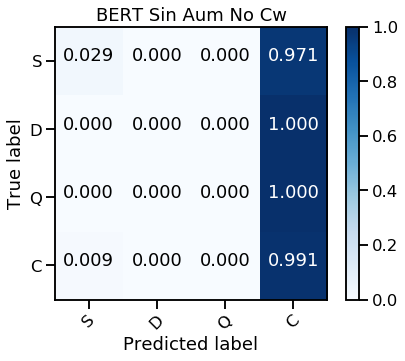

Test_ acc: 0.7571008814887366
Test_ f1 none: [0.05194805 0.         0.         0.86145251]
Test_ f1 macro: 0.2283501414786331


Ejemplo de tweet con label  commenting  y Tw_id  767734644561186817
Encoder Layer 1


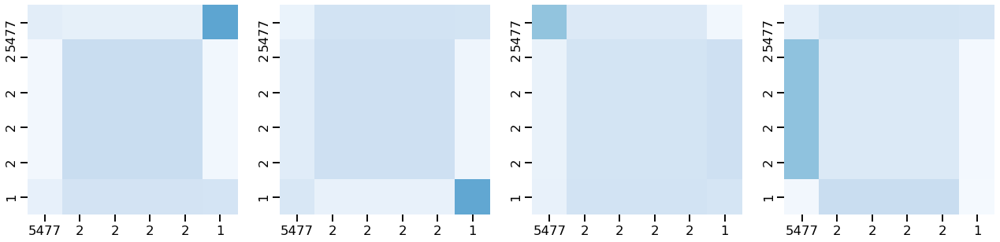

Encoder Layer 2


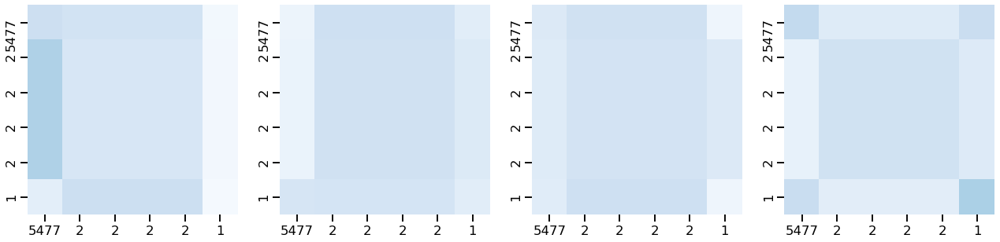



Ejemplo de tweet con label  support  y Tw_id  801684107616890880
Encoder Layer 1


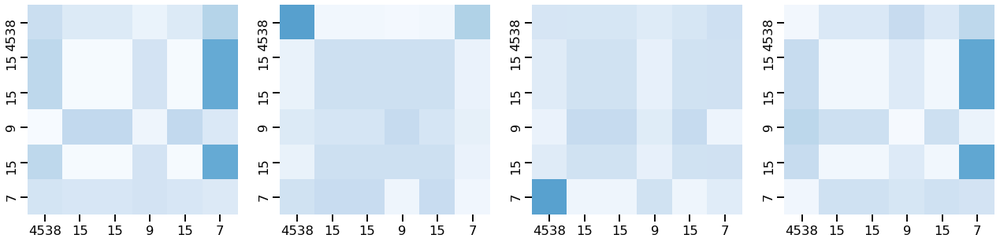

Encoder Layer 2


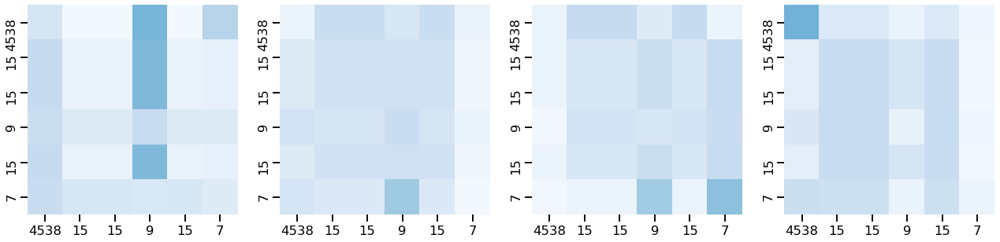



Ejemplo de tweet con label  denying  y Tw_id  767745760570044416
Encoder Layer 1


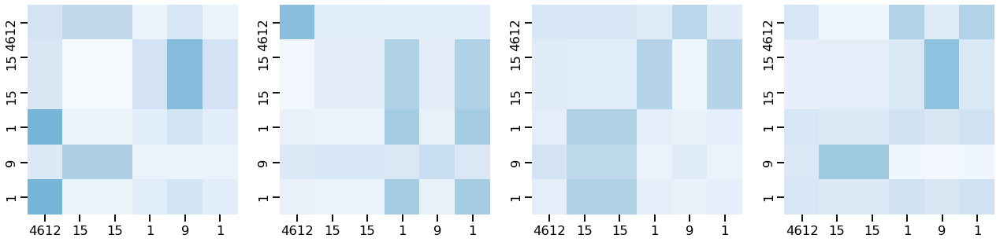

Encoder Layer 2


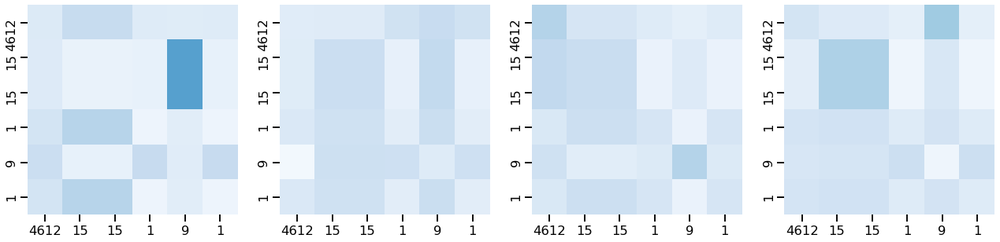



Ejemplo de tweet con label  questioning  y Tw_id  581157421273522177
Encoder Layer 1


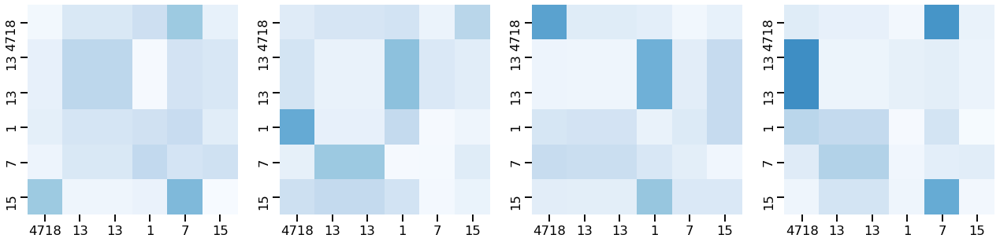

Encoder Layer 2


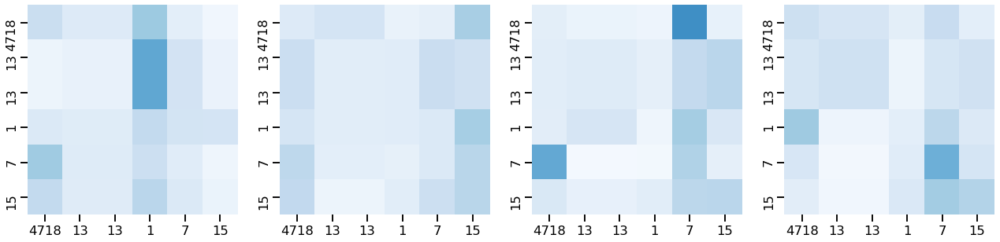

Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.215 	F-macro_val: 0.165
Epoch 10 	acc_val: 0.670 	F-macro_val: 0.382
Epoch 20 	acc_val: 0.722 	F-macro_val: 0.456
Epoch 30 	acc_val: 0.736 	F-macro_val: 0.490
Epoch 40 	acc_val: 0.743 	F-macro_val: 0.506
Epoch 50 	acc_val: 0.750 	F-macro_val: 0.542
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


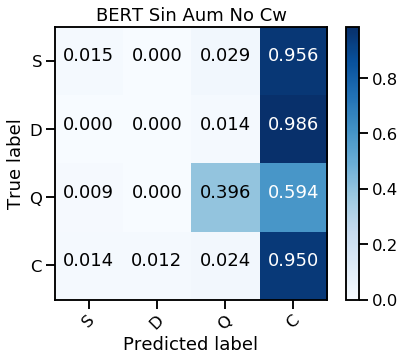

Test_ acc: 0.7659157688540646
Test_ f1 none: [0.02469136 0.         0.49411765 0.86281378]
Test_ f1 macro: 0.34540569552073275


Ejemplo de tweet con label  commenting  y Tw_id  524967314262081536
Encoder Layer 1


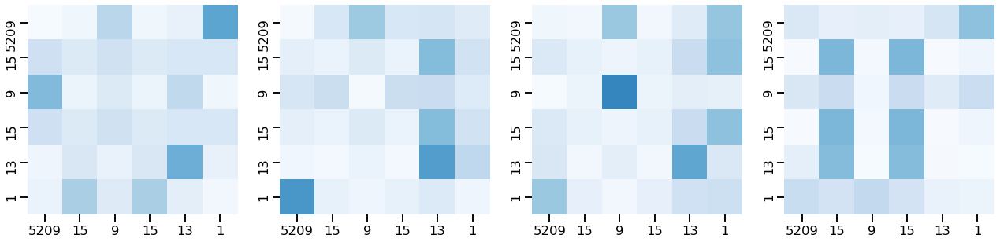

Encoder Layer 2


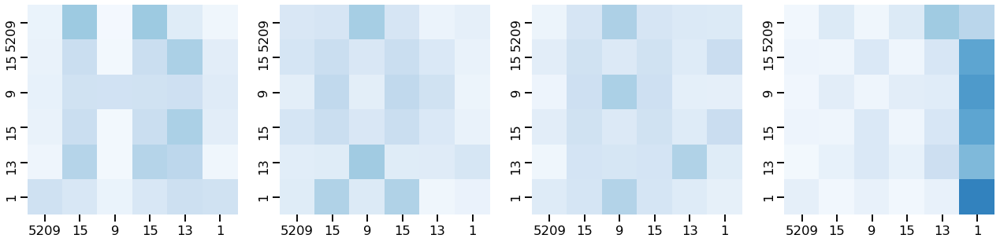



Ejemplo de tweet con label  support  y Tw_id  775166410662219777
Encoder Layer 1


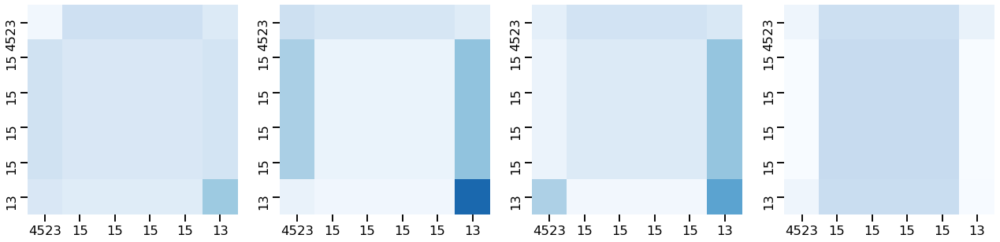

Encoder Layer 2


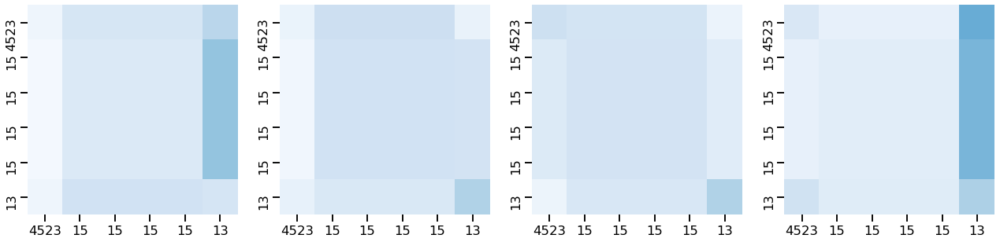



Ejemplo de tweet con label  denying  y Tw_id  769989019627290624
Encoder Layer 1


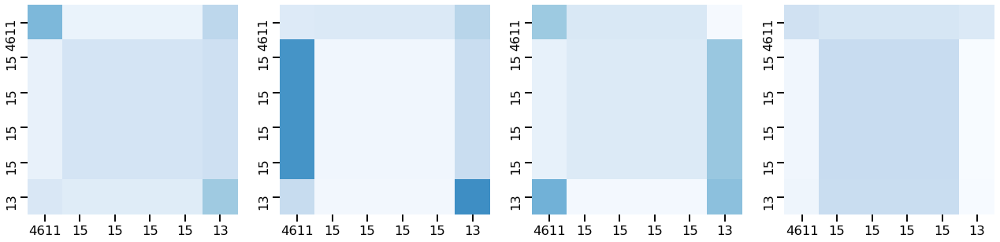

Encoder Layer 2


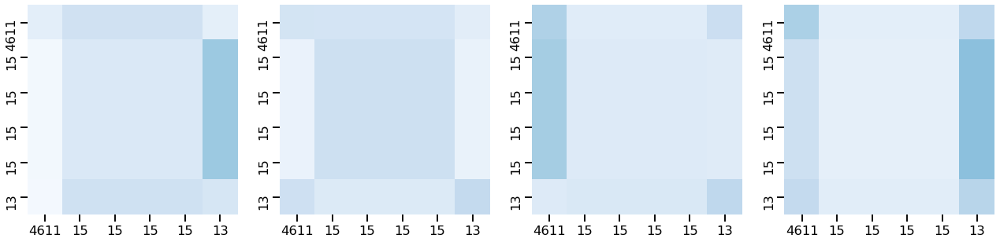



Ejemplo de tweet con label  questioning  y Tw_id  524969490149560321
Encoder Layer 1


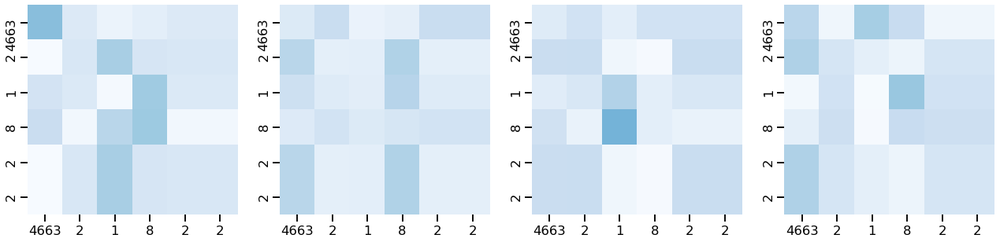

Encoder Layer 2


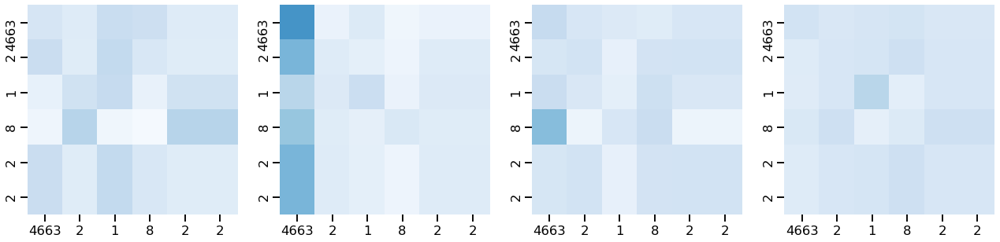

Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.413 	F-macro_val: 0.279
Epoch 10 	acc_val: 0.646 	F-macro_val: 0.332
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.393
Epoch 30 	acc_val: 0.719 	F-macro_val: 0.449
Epoch 40 	acc_val: 0.701 	F-macro_val: 0.451
Epoch 50 	acc_val: 0.698 	F-macro_val: 0.452
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


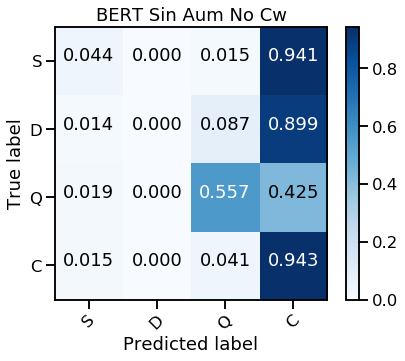

Test_ acc: 0.7796278158667973
Test_ f1 none: [0.06976744 0.         0.57843137 0.87225193]
Test_ f1 macro: 0.3801126863712363


Ejemplo de tweet con label  commenting  y Tw_id  544362882117693442
Encoder Layer 1


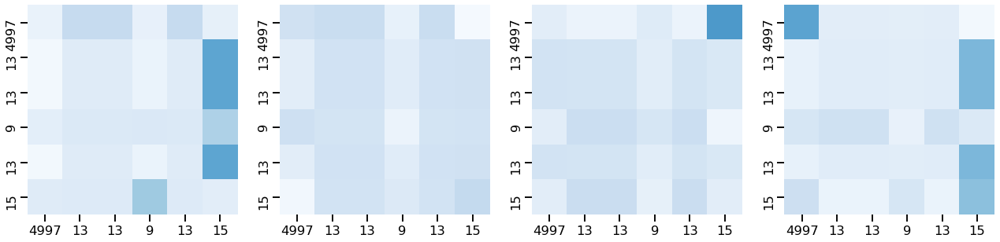

Encoder Layer 2


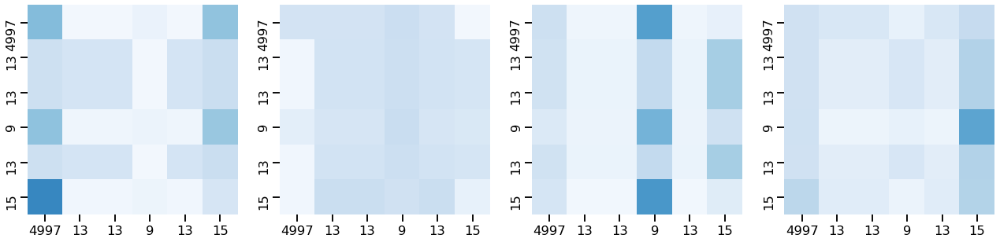



Ejemplo de tweet con label  support  y Tw_id  498294706355601409
Encoder Layer 1


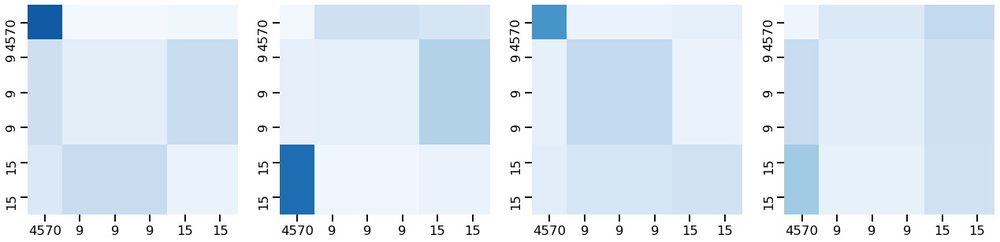

Encoder Layer 2


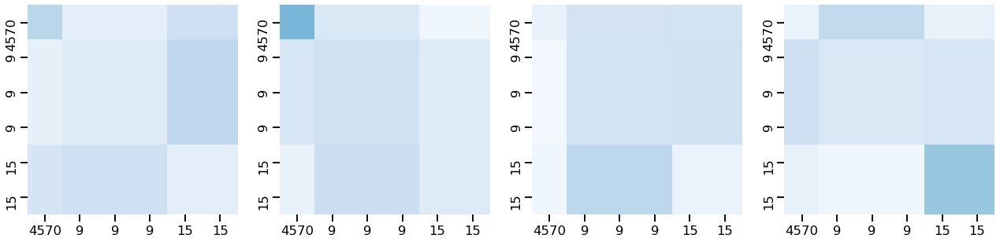



Ejemplo de tweet con label  denying  y Tw_id  758337598125445120
Encoder Layer 1


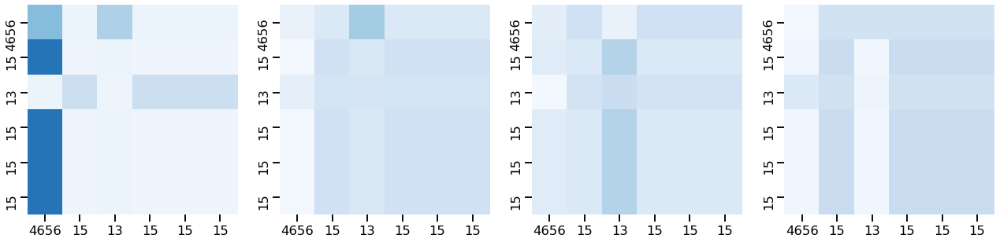

Encoder Layer 2


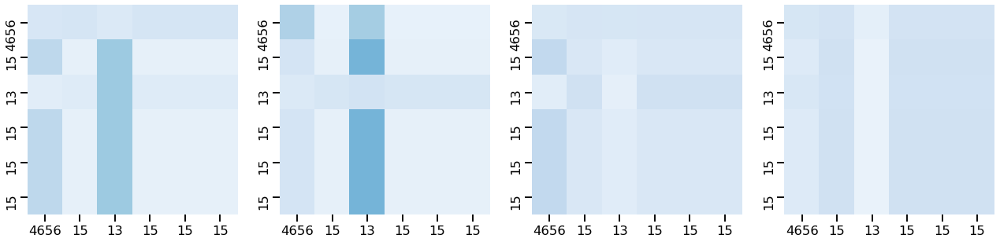



Ejemplo de tweet con label  questioning  y Tw_id  758936347788742656
Encoder Layer 1


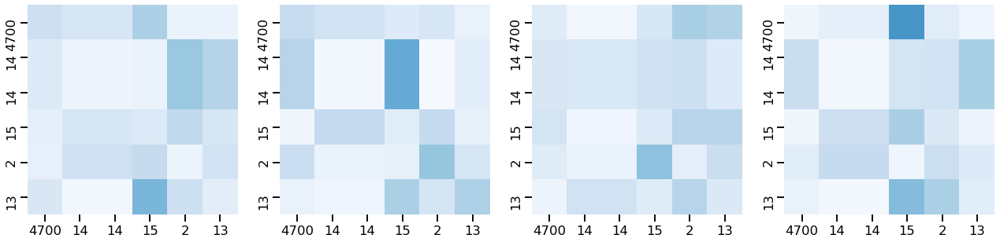

Encoder Layer 2


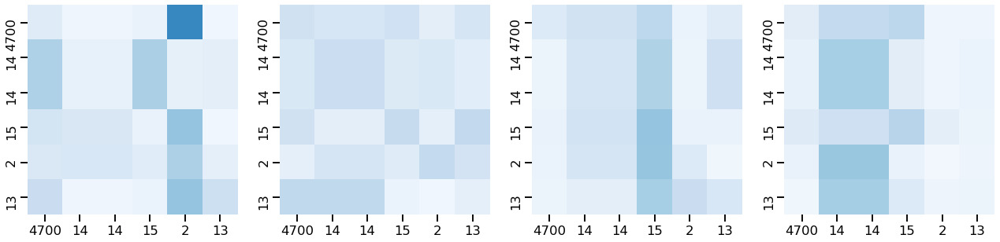

Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.146 	F-macro_val: 0.107
Epoch 10 	acc_val: 0.587 	F-macro_val: 0.230
Epoch 20 	acc_val: 0.663 	F-macro_val: 0.307
Epoch 30 	acc_val: 0.698 	F-macro_val: 0.360
Epoch 40 	acc_val: 0.726 	F-macro_val: 0.458
Epoch 50 	acc_val: 0.722 	F-macro_val: 0.467
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


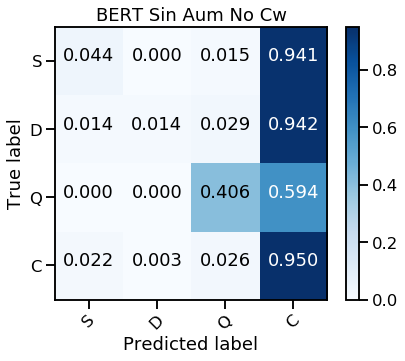

Test_ acc: 0.7698334965719883
Test_ f1 none: [0.06741573 0.02777778 0.5        0.86483324]
Test_ f1 macro: 0.36500668598131797
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.142 	F-macro_val: 0.107
Epoch 10 	acc_val: 0.622 	F-macro_val: 0.215
Epoch 20 	acc_val: 0.663 	F-macro_val: 0.317
Epoch 30 	acc_val: 0.743 	F-macro_val: 0.490
Epoch 40 	acc_val: 0.743 	F-macro_val: 0.489
Epoch 50 	acc_val: 0.750 	F-macro_val: 0.508
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


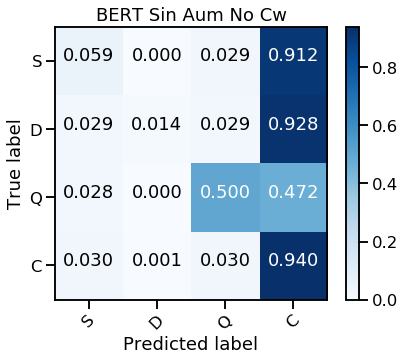

Test_ acc: 0.7727717923604309
Test_ f1 none: [0.08       0.02816901 0.56989247 0.86765579]
Test_ f1 macro: 0.38642931838823374


Ejemplo de tweet con label  commenting  y Tw_id  581299129634070530
Encoder Layer 1


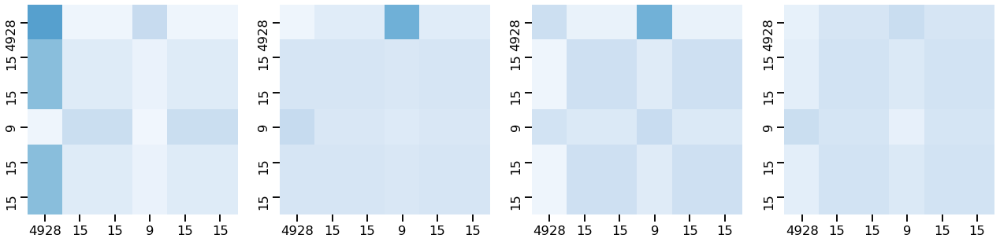

Encoder Layer 2


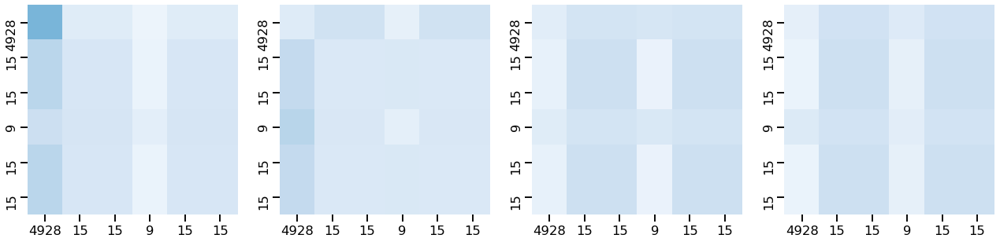



Ejemplo de tweet con label  support  y Tw_id  774995479847403520
Encoder Layer 1


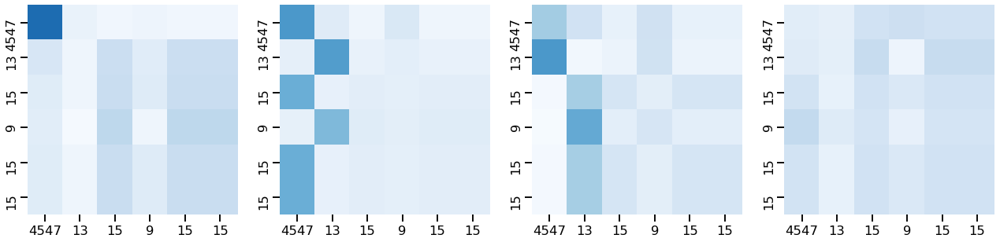

Encoder Layer 2


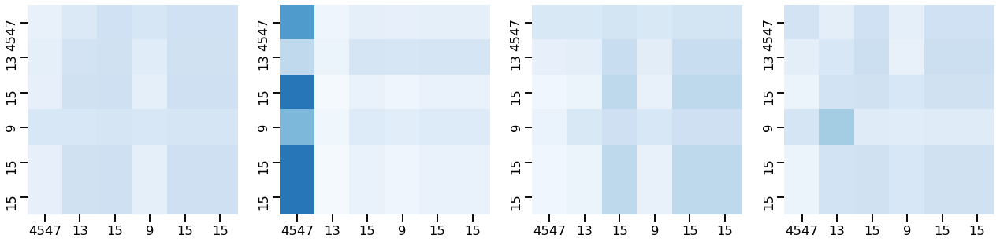



Ejemplo de tweet con label  denying  y Tw_id  767745760570044416
Encoder Layer 1


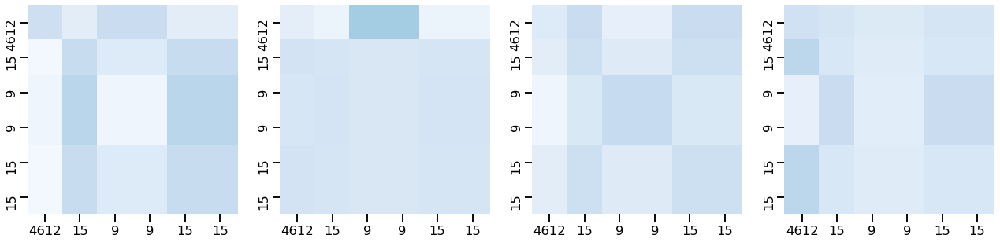

Encoder Layer 2


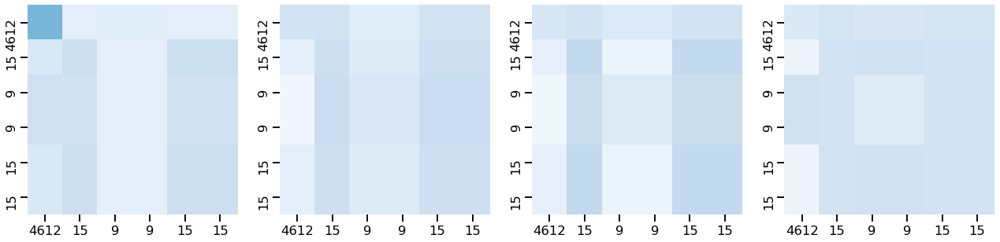



Ejemplo de tweet con label  questioning  y Tw_id  767731777205075968
Encoder Layer 1


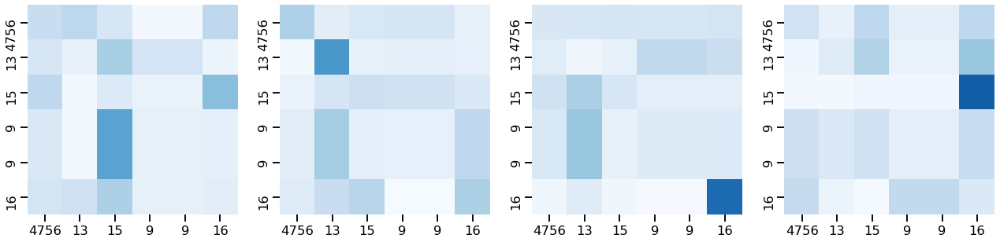

Encoder Layer 2


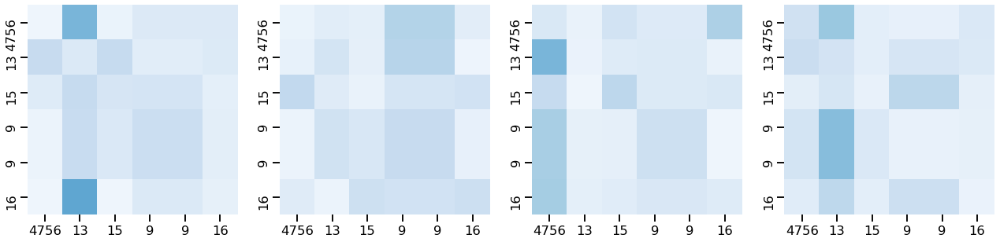

Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.219 	F-macro_val: 0.168
Epoch 10 	acc_val: 0.608 	F-macro_val: 0.223
Epoch 20 	acc_val: 0.688 	F-macro_val: 0.359
Epoch 30 	acc_val: 0.729 	F-macro_val: 0.460
Epoch 40 	acc_val: 0.733 	F-macro_val: 0.478
Epoch 50 	acc_val: 0.736 	F-macro_val: 0.480
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


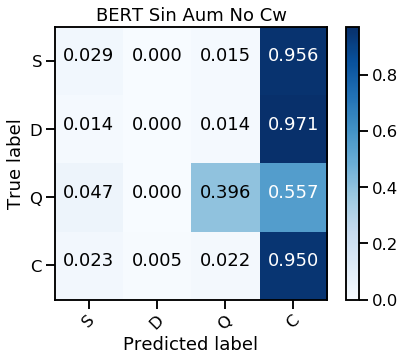

Test_ acc: 0.7668952007835456
Test_ f1 none: [0.04255319 0.         0.50299401 0.86533958]
Test_ f1 macro: 0.3527216954799356
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.236 	F-macro_val: 0.175
Epoch 10 	acc_val: 0.691 	F-macro_val: 0.375
Epoch 20 	acc_val: 0.747 	F-macro_val: 0.457
Epoch 30 	acc_val: 0.747 	F-macro_val: 0.493
Epoch 40 	acc_val: 0.753 	F-macro_val: 0.502
Epoch 50 	acc_val: 0.760 	F-macro_val: 0.502
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


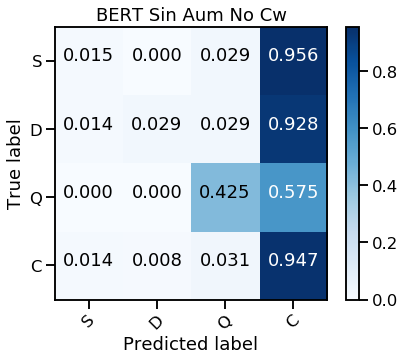

Test_ acc: 0.7688540646425074
Test_ f1 none: [0.02469136 0.05194805 0.5027933  0.86451613]
Test_ f1 macro: 0.3609872087735967
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.285 	F-macro_val: 0.219
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.424
Epoch 20 	acc_val: 0.691 	F-macro_val: 0.444
Epoch 30 	acc_val: 0.698 	F-macro_val: 0.456
Epoch 40 	acc_val: 0.691 	F-macro_val: 0.450
Epoch 50 	acc_val: 0.698 	F-macro_val: 0.454
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


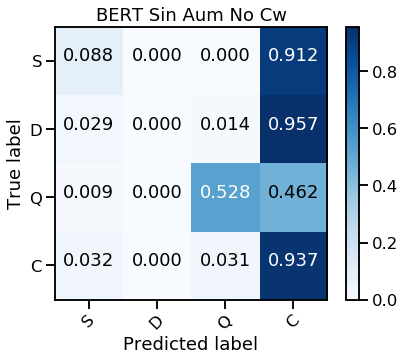

Test_ acc: 0.7747306562193927
Test_ f1 none: [0.11764706 0.         0.59893048 0.86579572]
Test_ f1 macro: 0.39559331614312754


Ejemplo de tweet con label  commenting  y Tw_id  581360647528669184
Encoder Layer 1


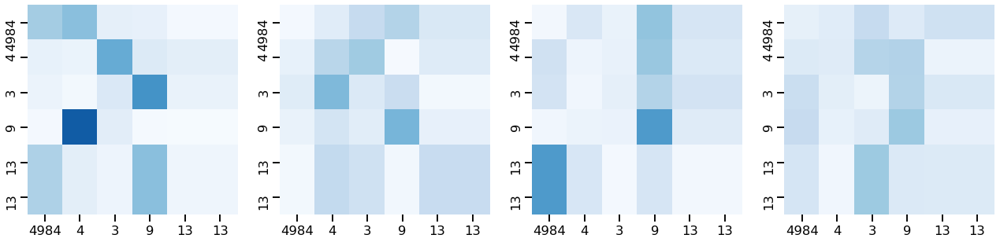

Encoder Layer 2


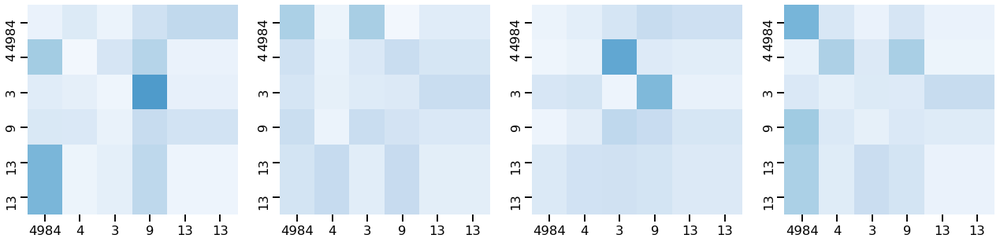



Ejemplo de tweet con label  support  y Tw_id  770001251920711682
Encoder Layer 1


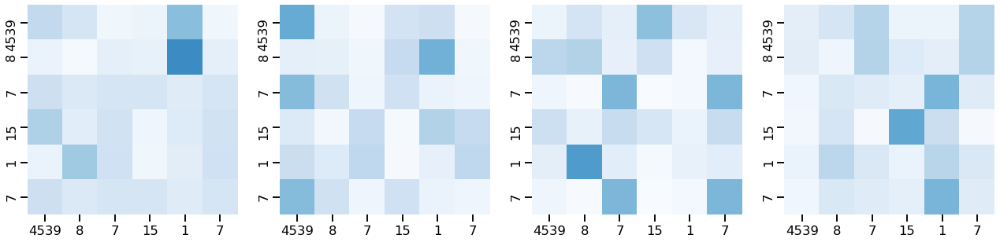

Encoder Layer 2


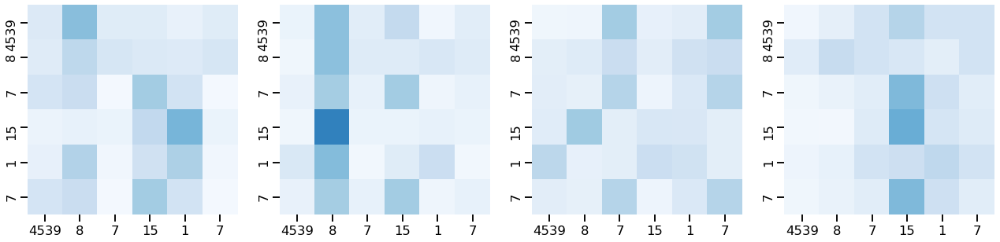



Ejemplo de tweet con label  denying  y Tw_id  764944029922590720
Encoder Layer 1


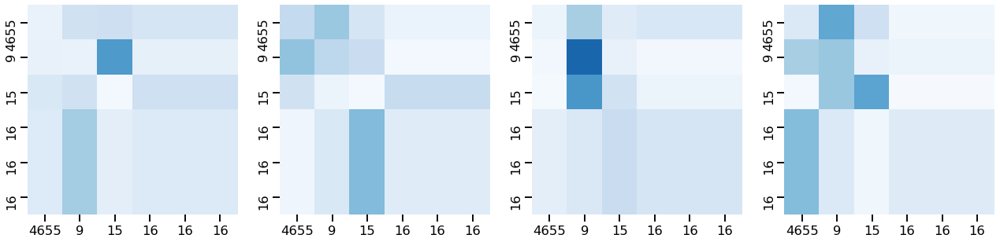

Encoder Layer 2


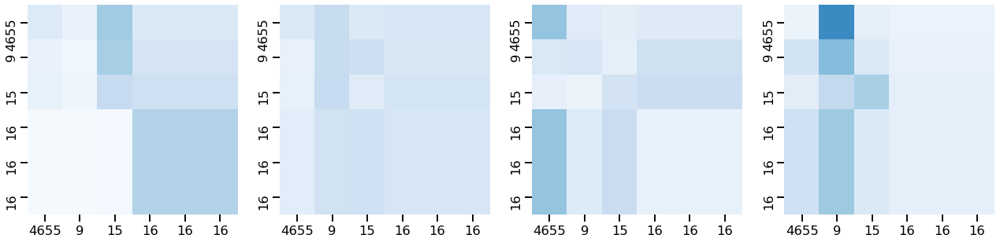



Ejemplo de tweet con label  questioning  y Tw_id  758288954848337920
Encoder Layer 1


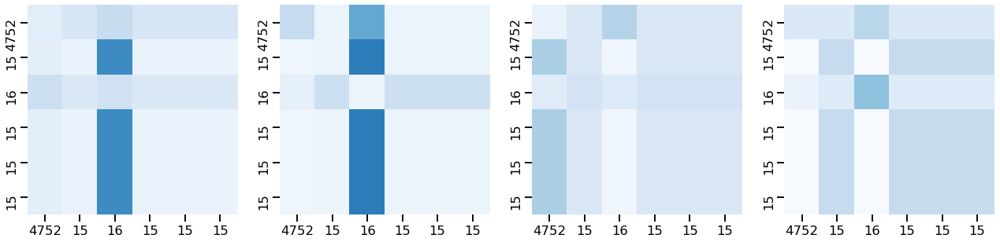

Encoder Layer 2


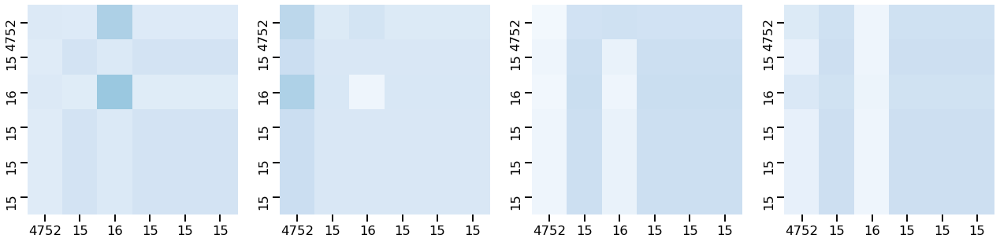

Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.212 	F-macro_val: 0.134
Epoch 10 	acc_val: 0.434 	F-macro_val: 0.245
Epoch 20 	acc_val: 0.691 	F-macro_val: 0.370
Epoch 30 	acc_val: 0.715 	F-macro_val: 0.458
Epoch 40 	acc_val: 0.708 	F-macro_val: 0.453
Epoch 50 	acc_val: 0.715 	F-macro_val: 0.486
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


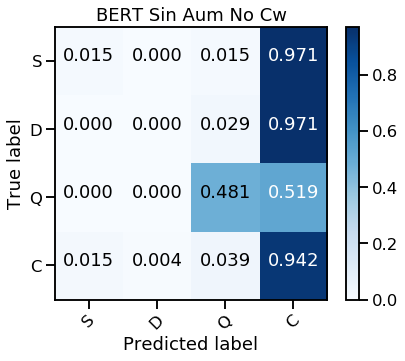

Test_ acc: 0.7688540646425074
Test_ f1 none: [0.02469136 0.         0.53684211 0.86286051]
Test_ f1 macro: 0.3560984923669888
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.267 	F-macro_val: 0.226
Epoch 10 	acc_val: 0.653 	F-macro_val: 0.346
Epoch 20 	acc_val: 0.691 	F-macro_val: 0.399
Epoch 30 	acc_val: 0.694 	F-macro_val: 0.431
Epoch 40 	acc_val: 0.694 	F-macro_val: 0.428
Epoch 50 	acc_val: 0.698 	F-macro_val: 0.434
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


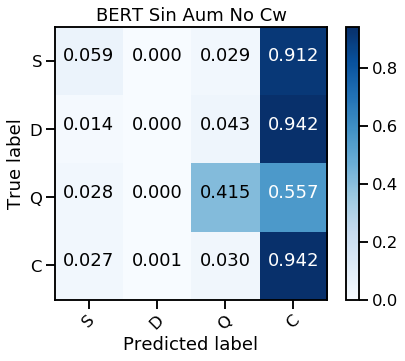

Test_ acc: 0.7649363369245837
Test_ f1 none: [0.08247423 0.         0.49438202 0.86387743]
Test_ f1 macro: 0.36018342000904974
Entrenando Run # 11
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.097 	F-macro_val: 0.073
Epoch 10 	acc_val: 0.562 	F-macro_val: 0.217
Epoch 20 	acc_val: 0.684 	F-macro_val: 0.322
Epoch 30 	acc_val: 0.719 	F-macro_val: 0.476
Epoch 40 	acc_val: 0.726 	F-macro_val: 0.471
Epoch 50 	acc_val: 0.726 	F-macro_val: 0.484
Testing run # 11
SE TUVIERON QUE REPETIR 3 EJEMPLOS


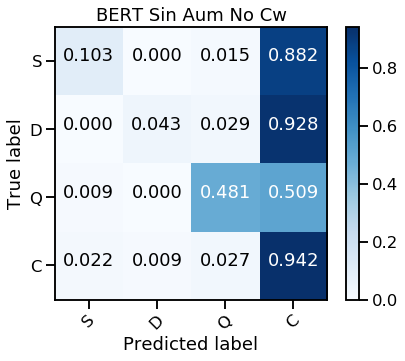

Test_ acc: 0.7776689520078355
Test_ f1 none: [0.15053763 0.07594937 0.56353591 0.86796921]
Test_ f1 macro: 0.4144980314128064


Ejemplo de tweet con label  commenting  y Tw_id  544582023956815873
Encoder Layer 1


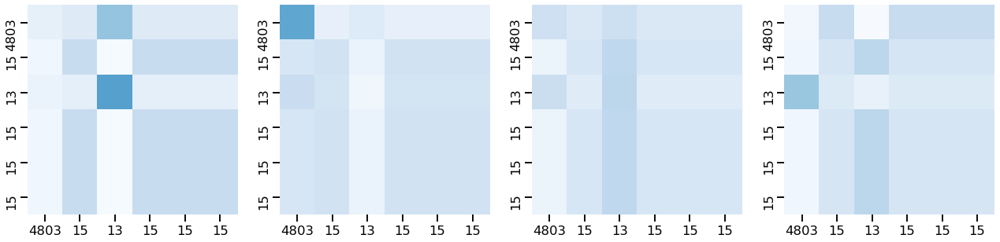

Encoder Layer 2


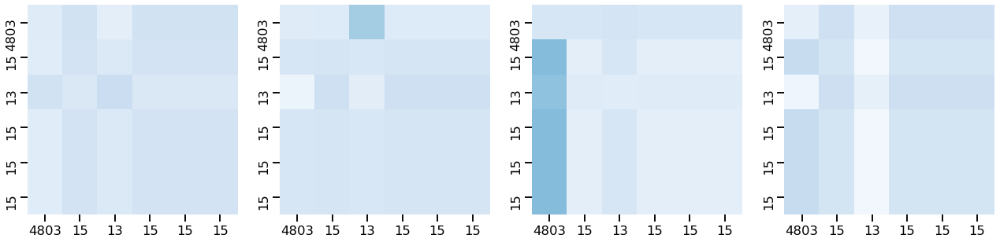



Ejemplo de tweet con label  support  y Tw_id  758515521822294016
Encoder Layer 1


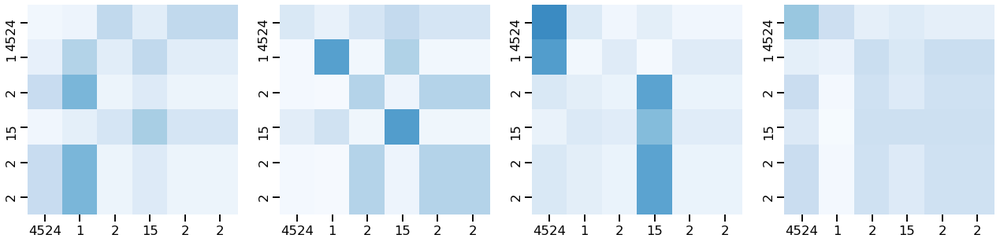

Encoder Layer 2


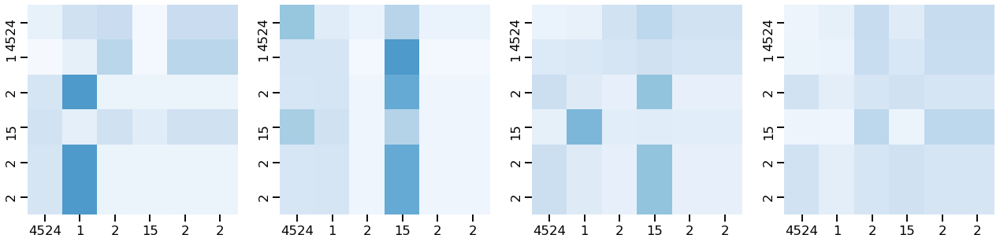



Ejemplo de tweet con label  denying  y Tw_id  764944029922590720
Encoder Layer 1


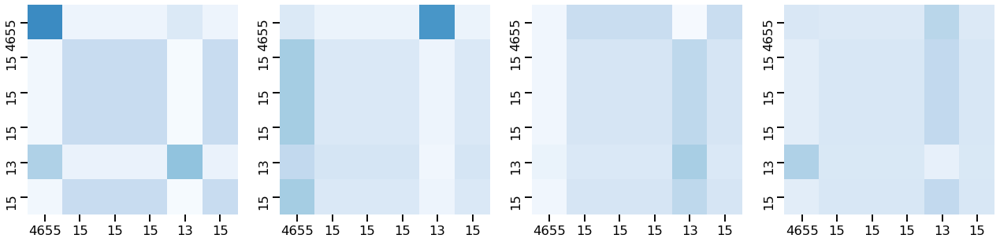

Encoder Layer 2


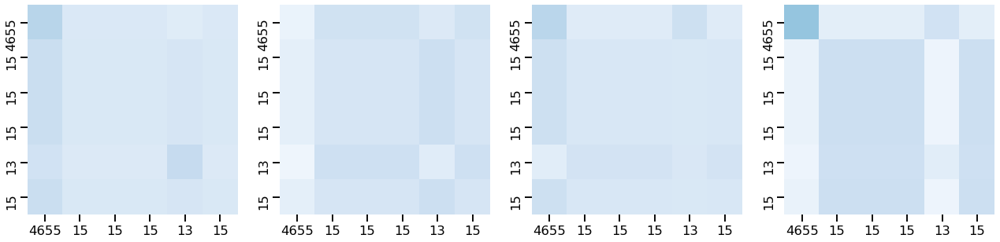



Ejemplo de tweet con label  questioning  y Tw_id  769044993768034305
Encoder Layer 1


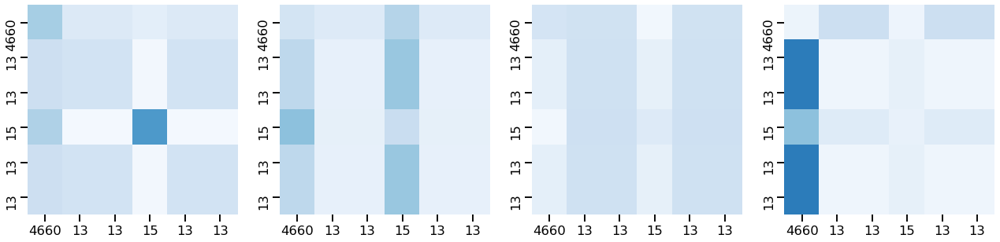

Encoder Layer 2


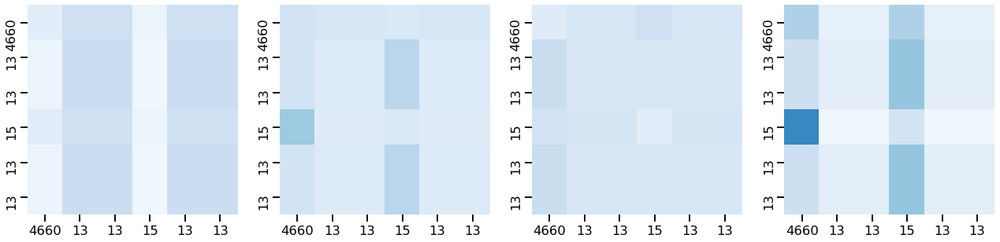

Entrenando Run # 12
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.101 	F-macro_val: 0.073
Epoch 10 	acc_val: 0.573 	F-macro_val: 0.249
Epoch 20 	acc_val: 0.653 	F-macro_val: 0.296
Epoch 30 	acc_val: 0.701 	F-macro_val: 0.446
Epoch 40 	acc_val: 0.715 	F-macro_val: 0.467
Epoch 50 	acc_val: 0.726 	F-macro_val: 0.483
Testing run # 12
SE TUVIERON QUE REPETIR 3 EJEMPLOS


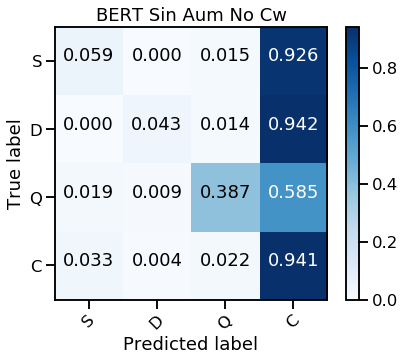

Test_ acc: 0.7639569049951028
Test_ f1 none: [0.08       0.07894737 0.4939759  0.86117647]
Test_ f1 macro: 0.3785249356559365
Entrenando Run # 13
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.111 	F-macro_val: 0.108
Epoch 10 	acc_val: 0.594 	F-macro_val: 0.300
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.358
Epoch 30 	acc_val: 0.722 	F-macro_val: 0.435
Epoch 40 	acc_val: 0.722 	F-macro_val: 0.455
Epoch 50 	acc_val: 0.729 	F-macro_val: 0.464
Testing run # 13
SE TUVIERON QUE REPETIR 3 EJEMPLOS


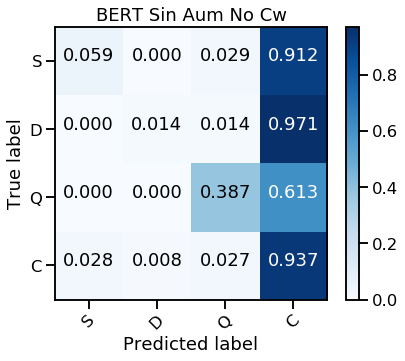

Test_ acc: 0.7590597453476984
Test_ f1 none: [0.08510638 0.02631579 0.47953216 0.85714286]
Test_ f1 macro: 0.3620242983344887
Entrenando Run # 14
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.219 	F-macro_val: 0.160
Epoch 10 	acc_val: 0.642 	F-macro_val: 0.345
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.401
Epoch 30 	acc_val: 0.747 	F-macro_val: 0.492
Epoch 40 	acc_val: 0.750 	F-macro_val: 0.499
Epoch 50 	acc_val: 0.750 	F-macro_val: 0.495
Testing run # 14
SE TUVIERON QUE REPETIR 3 EJEMPLOS


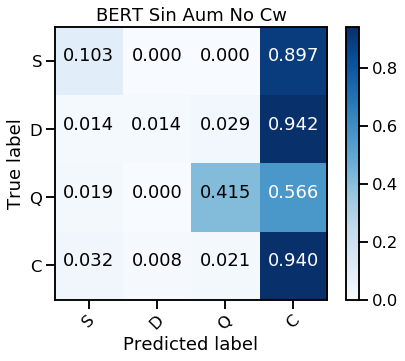

Test_ acc: 0.7668952007835456
Test_ f1 none: [0.13592233 0.02631579 0.52380952 0.86253687]
Test_ f1 macro: 0.38714612913415936
Entrenando Run # 15
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.191 	F-macro_val: 0.129
Epoch 10 	acc_val: 0.542 	F-macro_val: 0.319
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.342
Epoch 30 	acc_val: 0.715 	F-macro_val: 0.471
Epoch 40 	acc_val: 0.708 	F-macro_val: 0.467
Epoch 50 	acc_val: 0.722 	F-macro_val: 0.508
Testing run # 15
SE TUVIERON QUE REPETIR 3 EJEMPLOS


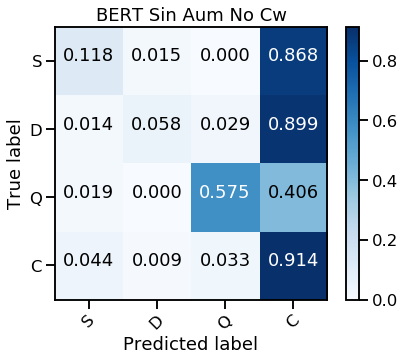

Test_ acc: 0.7678746327130265
Test_ f1 none: [0.14159292 0.09876543 0.62564103 0.86025408]
Test_ f1 macro: 0.4315633653945867


Ejemplo de tweet con label  commenting  y Tw_id  552792005559189504
Encoder Layer 1


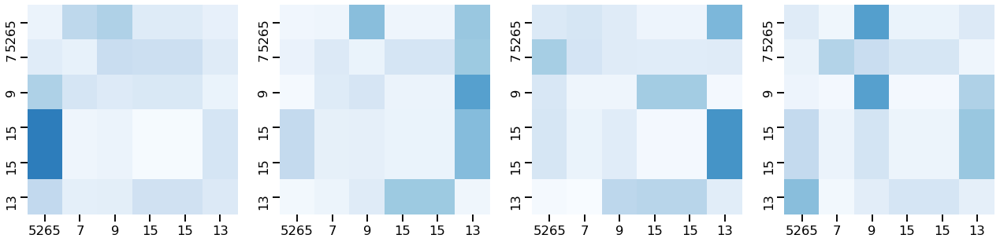

Encoder Layer 2


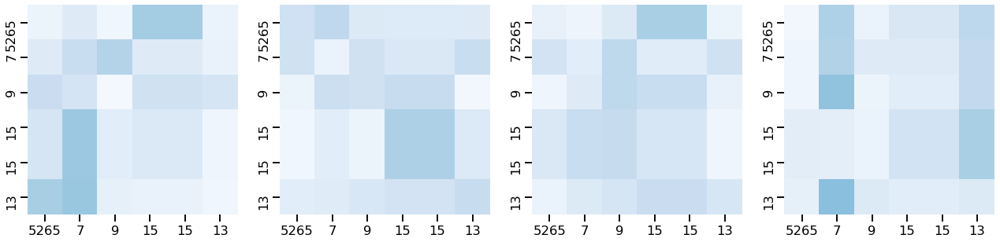



Ejemplo de tweet con label  support  y Tw_id  769188567180533760
Encoder Layer 1


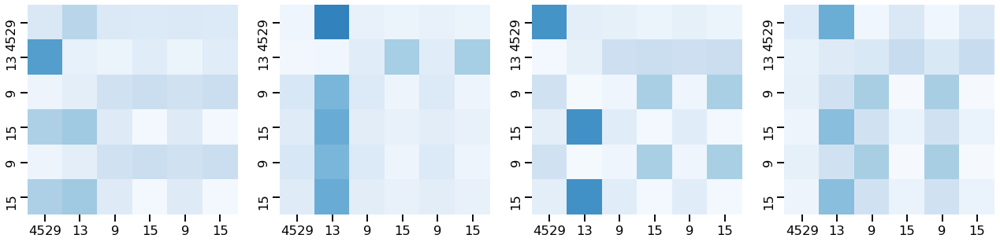

Encoder Layer 2


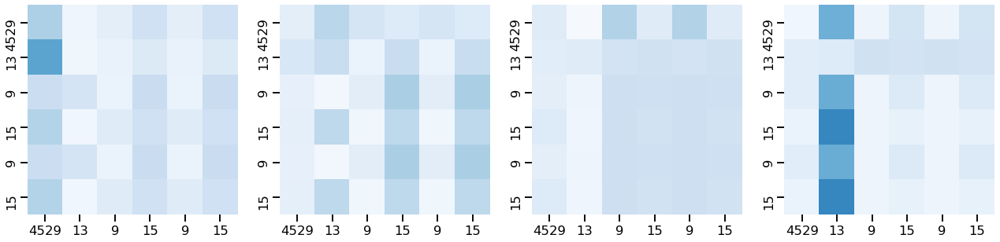



Ejemplo de tweet con label  denying  y Tw_id  775021186283671552
Encoder Layer 1


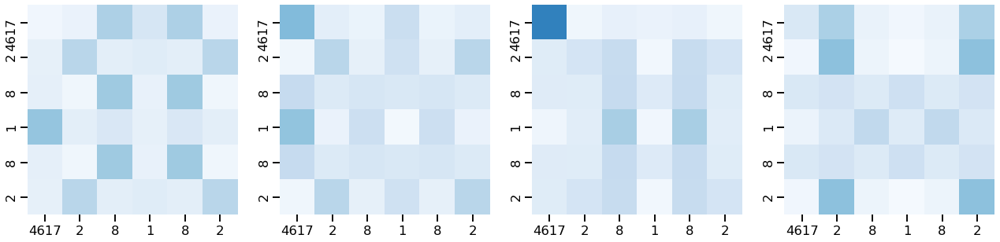

Encoder Layer 2


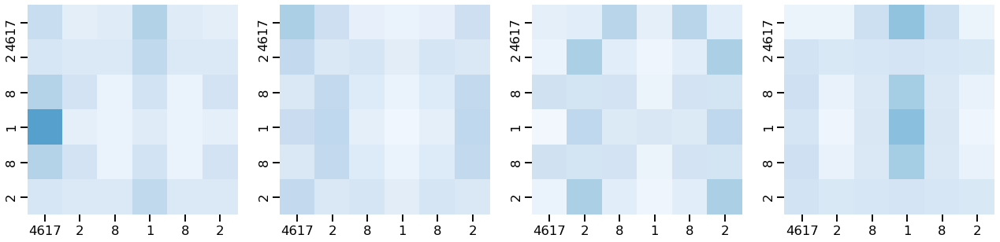



Ejemplo de tweet con label  questioning  y Tw_id  758750489047539714
Encoder Layer 1


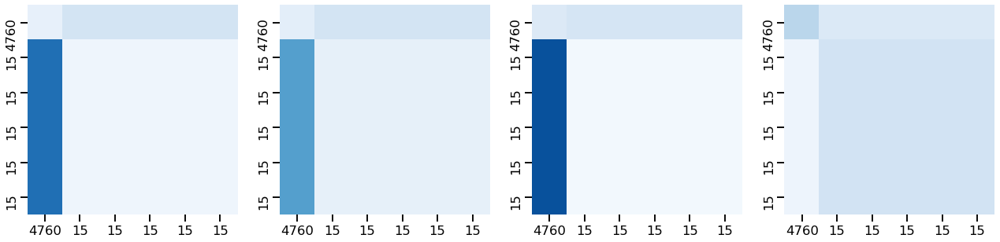

Encoder Layer 2


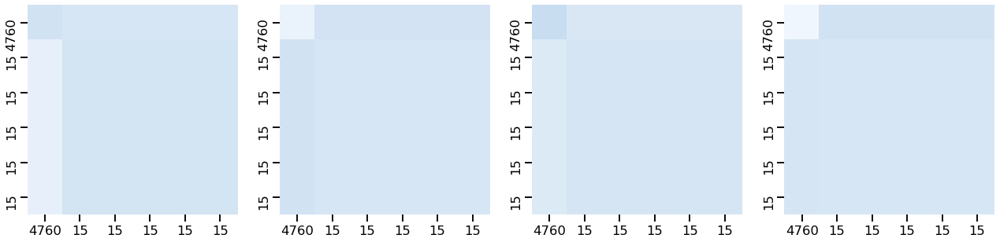

Entrenando Run # 16
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.115 	F-macro_val: 0.103
Epoch 10 	acc_val: 0.493 	F-macro_val: 0.279
Epoch 20 	acc_val: 0.691 	F-macro_val: 0.419
Epoch 30 	acc_val: 0.719 	F-macro_val: 0.450
Epoch 40 	acc_val: 0.712 	F-macro_val: 0.459
Epoch 50 	acc_val: 0.722 	F-macro_val: 0.475
Testing run # 16
SE TUVIERON QUE REPETIR 3 EJEMPLOS


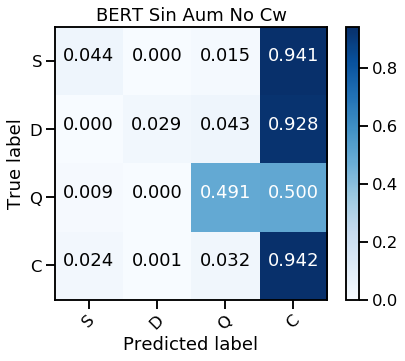

Test_ acc: 0.7737512242899118
Test_ f1 none: [0.06593407 0.05555556 0.55614973 0.86643026]
Test_ f1 macro: 0.3860174035393059
Entrenando Run # 17
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.132 	F-macro_val: 0.138
Epoch 10 	acc_val: 0.594 	F-macro_val: 0.343
Epoch 20 	acc_val: 0.701 	F-macro_val: 0.433
Epoch 30 	acc_val: 0.743 	F-macro_val: 0.494
Epoch 40 	acc_val: 0.747 	F-macro_val: 0.496
Epoch 50 	acc_val: 0.736 	F-macro_val: 0.484
Testing run # 17
SE TUVIERON QUE REPETIR 3 EJEMPLOS


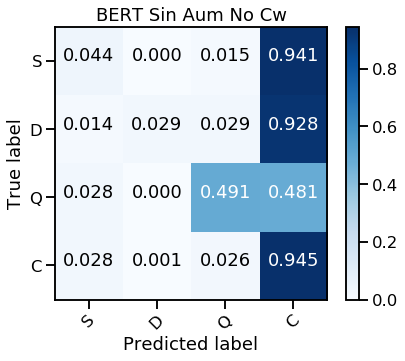

Test_ acc: 0.7757100881488737
Test_ f1 none: [0.06185567 0.05555556 0.57458564 0.86879433]
Test_ f1 macro: 0.3901977968147248
Entrenando Run # 18
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.347 	F-macro_val: 0.212
Epoch 10 	acc_val: 0.653 	F-macro_val: 0.311
Epoch 20 	acc_val: 0.726 	F-macro_val: 0.436
Epoch 30 	acc_val: 0.740 	F-macro_val: 0.488
Epoch 40 	acc_val: 0.733 	F-macro_val: 0.490
Epoch 50 	acc_val: 0.743 	F-macro_val: 0.500
Testing run # 18
SE TUVIERON QUE REPETIR 3 EJEMPLOS


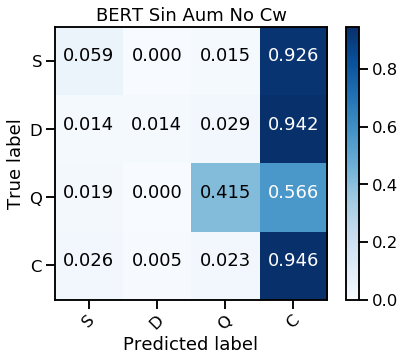

Test_ acc: 0.7688540646425074
Test_ f1 none: [0.08421053 0.02702703 0.51461988 0.86486486]
Test_ f1 macro: 0.37268057531215426
Entrenando Run # 19
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.226 	F-macro_val: 0.170
Epoch 10 	acc_val: 0.632 	F-macro_val: 0.325
Epoch 20 	acc_val: 0.740 	F-macro_val: 0.495
Epoch 30 	acc_val: 0.743 	F-macro_val: 0.503
Epoch 40 	acc_val: 0.764 	F-macro_val: 0.532
Epoch 50 	acc_val: 0.764 	F-macro_val: 0.534
Testing run # 19
SE TUVIERON QUE REPETIR 3 EJEMPLOS


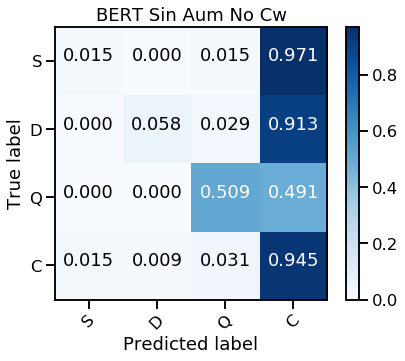

Test_ acc: 0.7776689520078355
Test_ f1 none: [0.02469136 0.1        0.57754011 0.8677686 ]
Test_ f1 macro: 0.3925000150044713
Entrenando Run # 20
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.295 	F-macro_val: 0.184
Epoch 10 	acc_val: 0.653 	F-macro_val: 0.267
Epoch 20 	acc_val: 0.684 	F-macro_val: 0.318
Epoch 30 	acc_val: 0.688 	F-macro_val: 0.319
Epoch 40 	acc_val: 0.698 	F-macro_val: 0.438
Epoch 50 	acc_val: 0.722 	F-macro_val: 0.465
Testing run # 20
SE TUVIERON QUE REPETIR 3 EJEMPLOS


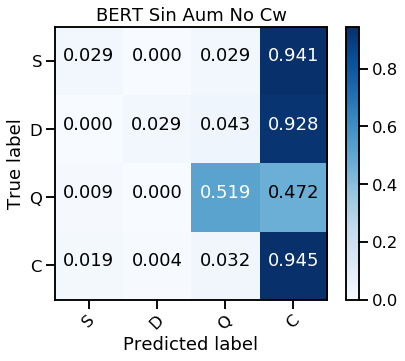

Test_ acc: 0.7776689520078355
Test_ f1 none: [0.04651163 0.05405405 0.57591623 0.8693081 ]
Test_ f1 macro: 0.38644750351062107


In [14]:
global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
best_macro={'F_ma':0.1 , 'Run':0}

dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}
  
prob=0.0
bs=32

for x in range(1,21): 
    print ("Entrenando Run #", x)
    cnn1 = load_model(path_m+str(prob)+'/cnn1_'+str(x)+'-exec.h5')
    cnn2 = load_model(path_m+str(prob)+'/cnn2_'+str(x)+'-exec.h5')
    rnn1 = load_model(path_m+str(prob)+'/rnn1_'+str(x)+'-exec.h5')
    rnn2 = load_model(path_m+str(prob)+'/rnn2_'+str(x)+'-exec.h5')
    rnn3 = load_model(path_m+str(prob)+'/rnn3_'+str(x)+'-exec.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    b_dim=768
    """espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']"""
    K_list_ext, index_embeddings, lab_str_embeddings, dict_match_kd = completar_kdummy([0,1,2,3])
    largo=len(index_embeddings)
    print("Index embeddings con preds", largo, ". Ult elemento:", index_embeddings[-1])
    
    for i in range(len(sentences)):
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector
            
        index_embeddings.append(i+largo)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
      
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector

        index_embeddings.append(num+largo+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    
    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]

    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, K_list_new, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model,  1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))


    for epoch in range(60):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')

        model.eval()
        DATA_VAL=data_gen(bs, 'Val', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)

        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(DATA_VAL, model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val: %.3f" % acc_val.numpy(), "\tF-macro_val: %.3f" % fma_val.numpy())

    model.eval()
    print ("Testing run #",x)
    DATA_TEST=data_gen(bs, 'Test', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)

    predicciones = run_epoch(DATA_TEST, model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)

    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

    plot_cm(cm_norma(glo_cm),["S","D","Q","C"],"BERT Sin Aum No Cw")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    if glo_fma>best_macro['F_ma']:
        best_macro['F_ma']=glo_fma
        best_macro['Run']=x                
        tope=4520

        for key in keys: 
            mask_s=test["Label"]==key
            q_tid=np.random.choice(test["Tw_id"][mask_s])
            q_ide=list(test["Tw_id"].values).index(q_tid)

            model.eval()

            temp2= [tope + q_ide]

            for m in range(n_machines): 
                query=match_kdummy(new_matrix[m][q_ide])
                temp2= temp2 + [dict_match_kd[query]] 
                #temp2= temp2 + [np.argmax(matrix_test[m][q_ide])+1] 

            sent = [temp2]
            src = torch.LongTensor([w for w in sent])
            src = Variable(src)
            src_mask = src_mask=  (src != 0).unsqueeze(-2)
            out = model.forward(src, src_mask)
            print ("\n\nEjemplo de tweet con label ", key, " y Tw_id ", q_tid)
            for layer in range(2):
                fig, axs = plt.subplots(1,4, figsize=(22,11))
                print("Encoder Layer", layer+1)
                for h in range(4):
                    draw(model.encoder.layers[layer].self_attn.attn[0, h].data, 
                                axs[h], sent, color="Blues")
                plt.show()

In [15]:
best_macro

{'F_ma': 0.4315633653945867, 'Run': 15}

Acc: 0.770 -- deviation: 0.006
F-score: 0.372 -- deviation: 0.039
(0.0_No CW) SDQC: 0.0731121145729848 0.035319039127916146 0.5131844763279345 0.864882112896386


Confusion counts
[[7.000e+01 1.000e+00 2.200e+01 1.267e+03]
 [1.300e+01 2.700e+01 4.000e+01 1.300e+03]
 [2.900e+01 1.000e+00 9.300e+02 1.160e+03]
 [3.690e+02 7.100e+01 4.250e+02 1.470e+04]]


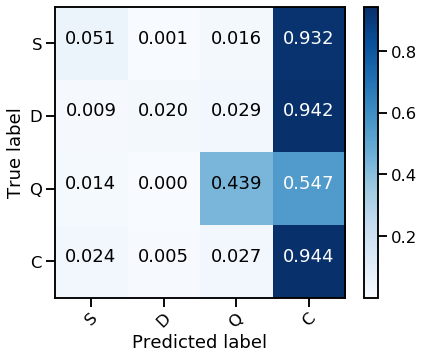

In [16]:
print ("Acc: %.3f" % np.mean(np.asarray(global_accs)), "-- deviation: %.3f" % np.std(np.asarray(global_accs)))
print ("F-score: %.3f" % np.mean(np.asarray(global_fmacros)), "-- deviation: %.3f" % np.std(np.asarray(global_fmacros)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0_No CW) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
    
print (m_temp)

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='Blues')

[1.25980975 3.18168168 3.21060606 0.38752743]
Entrenando Run # 1





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.222 	F-macro_val: 0.197
Epoch 10 	acc_val: 0.299 	F-macro_val: 0.246
Epoch 20 	acc_val: 0.299 	F-macro_val: 0.255
Epoch 30 	acc_val: 0.302 	F-macro_val: 0.274
Epoch 40 	acc_val: 0.323 	F-macro_val: 0.291
Epoch 50 	acc_val: 0.406 	F-macro_val: 0.357
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


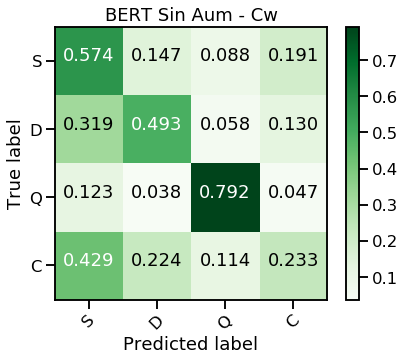

Test_ acc: 0.33104799216454456
Test_ f1 none: [0.16386555 0.23367698 0.58131488 0.36713996]
Test_ f1 macro: 0.3364993401220717


Ejemplo de tweet con label  commenting  y Tw_id  524996856431251456
Encoder Layer 1


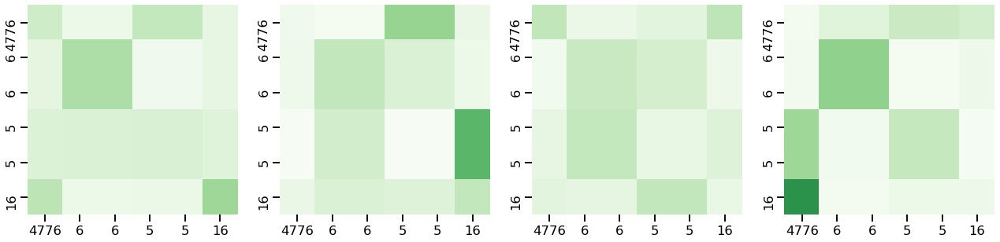

Encoder Layer 2


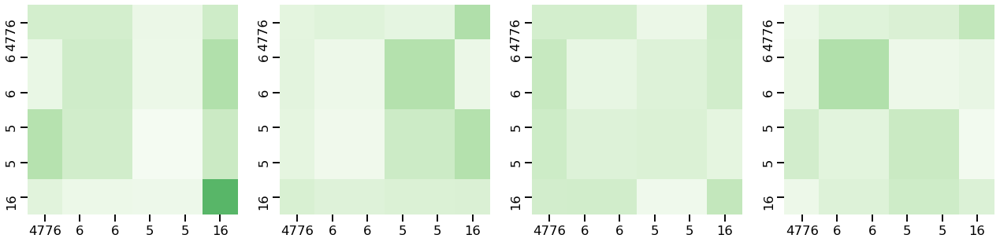



Ejemplo de tweet con label  support  y Tw_id  764993694466383872
Encoder Layer 1


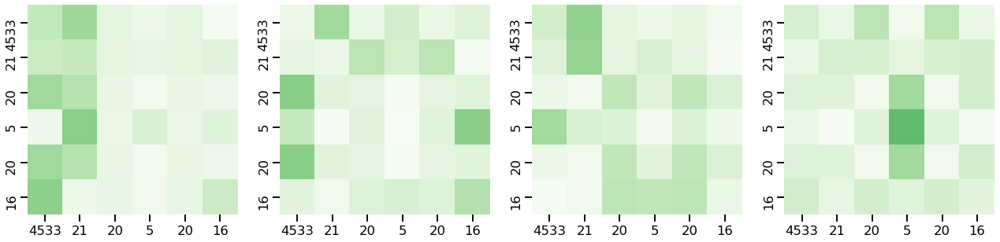

Encoder Layer 2


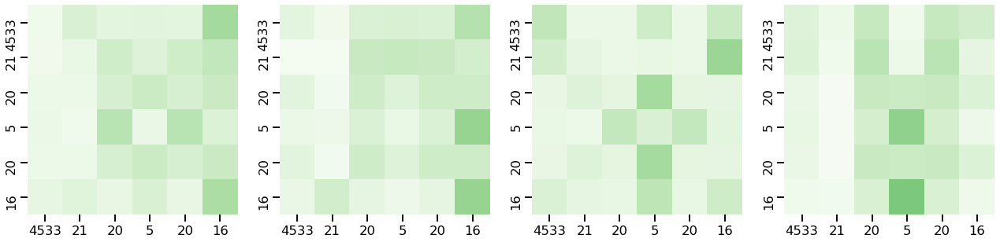



Ejemplo de tweet con label  denying  y Tw_id  758334112662904834
Encoder Layer 1


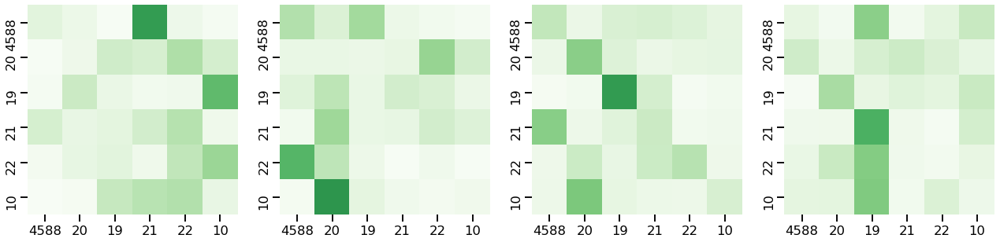

Encoder Layer 2


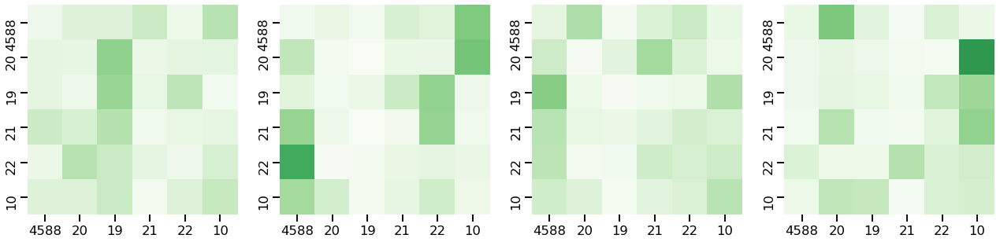



Ejemplo de tweet con label  questioning  y Tw_id  580356785065844736
Encoder Layer 1


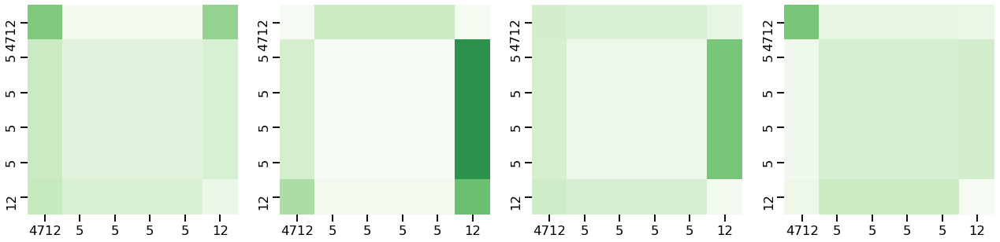

Encoder Layer 2


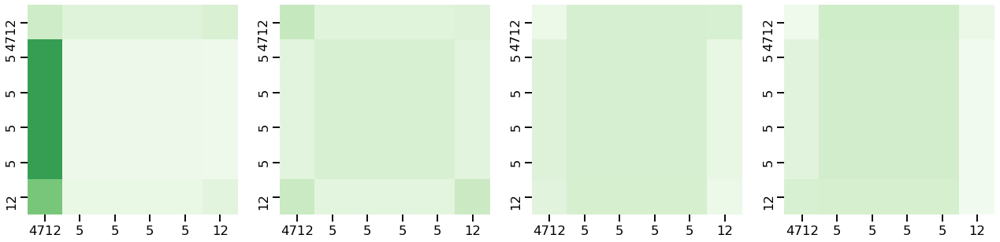

Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.274 	F-macro_val: 0.191
Epoch 10 	acc_val: 0.285 	F-macro_val: 0.242
Epoch 20 	acc_val: 0.354 	F-macro_val: 0.343
Epoch 30 	acc_val: 0.372 	F-macro_val: 0.358
Epoch 40 	acc_val: 0.431 	F-macro_val: 0.407
Epoch 50 	acc_val: 0.462 	F-macro_val: 0.425
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


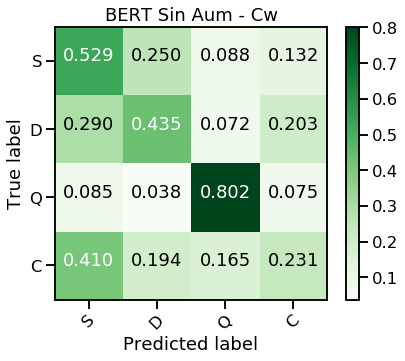

Test_ acc: 0.32419196865817823
Test_ f1 none: [0.15929204 0.22140221 0.51515152 0.36400404]
Test_ f1 macro: 0.31496245226531716
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.076 	F-macro_val: 0.090
Epoch 10 	acc_val: 0.191 	F-macro_val: 0.198
Epoch 20 	acc_val: 0.285 	F-macro_val: 0.253
Epoch 30 	acc_val: 0.309 	F-macro_val: 0.281
Epoch 40 	acc_val: 0.333 	F-macro_val: 0.312
Epoch 50 	acc_val: 0.455 	F-macro_val: 0.402
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


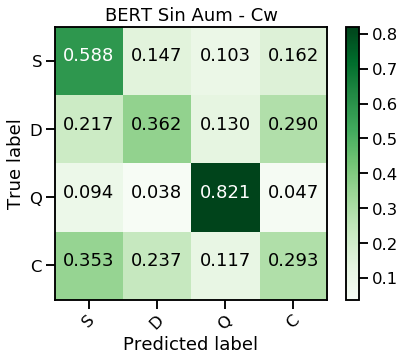

Test_ acc: 0.3721841332027424
Test_ f1 none: [0.19607843 0.17123288 0.58       0.43761996]
Test_ f1 macro: 0.34623281742429046


Ejemplo de tweet con label  commenting  y Tw_id  544285237698506752
Encoder Layer 1


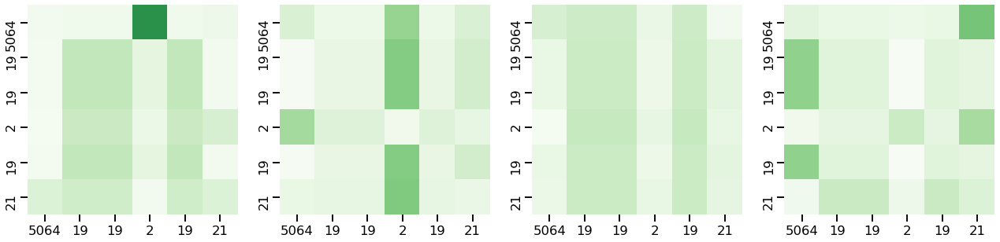

Encoder Layer 2


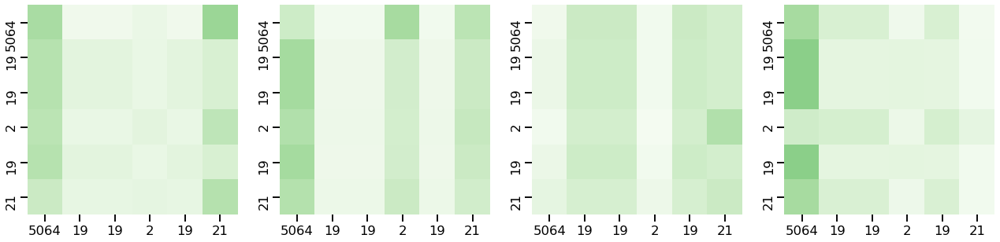



Ejemplo de tweet con label  support  y Tw_id  769012041722003456
Encoder Layer 1


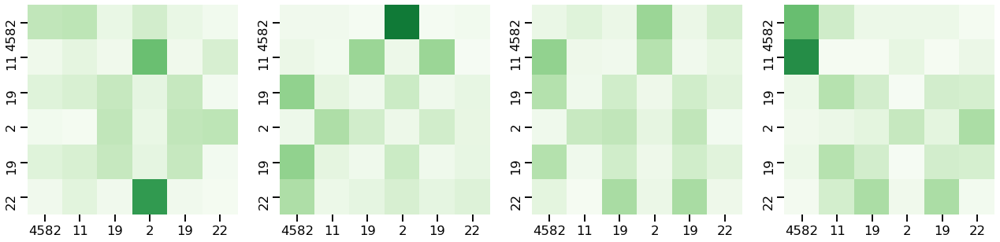

Encoder Layer 2


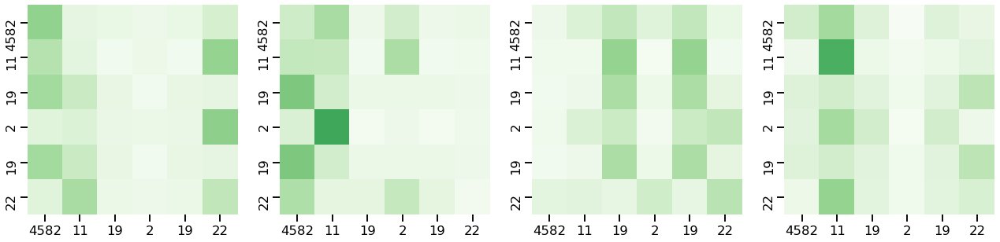



Ejemplo de tweet con label  denying  y Tw_id  758463868024852480
Encoder Layer 1


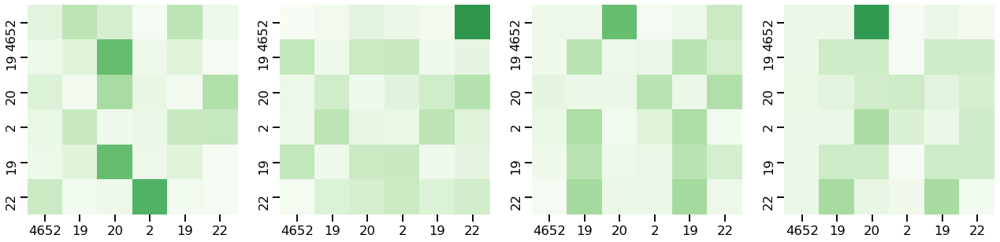

Encoder Layer 2


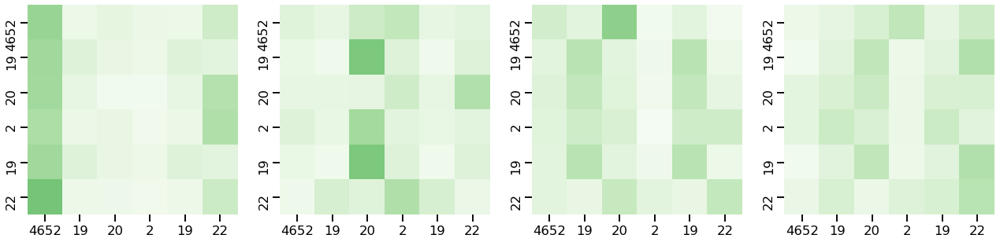



Ejemplo de tweet con label  questioning  y Tw_id  767727125608660992
Encoder Layer 1


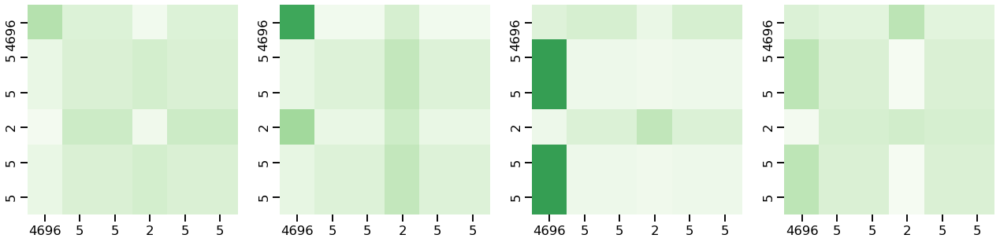

Encoder Layer 2


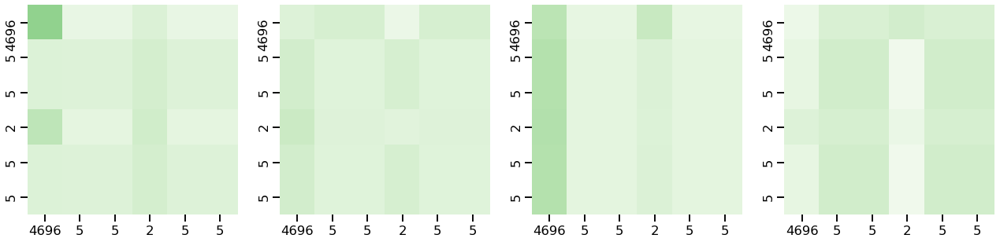

Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.194 	F-macro_val: 0.141
Epoch 10 	acc_val: 0.299 	F-macro_val: 0.231
Epoch 20 	acc_val: 0.431 	F-macro_val: 0.367
Epoch 30 	acc_val: 0.458 	F-macro_val: 0.394
Epoch 40 	acc_val: 0.462 	F-macro_val: 0.393
Epoch 50 	acc_val: 0.500 	F-macro_val: 0.415
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


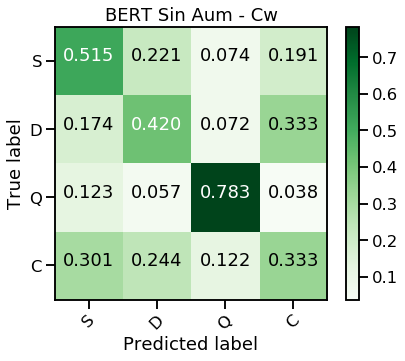

Test_ acc: 0.39764936336924583
Test_ f1 none: [0.19337017 0.18770227 0.56462585 0.48096565]
Test_ f1 macro: 0.35666598169230246


Ejemplo de tweet con label  commenting  y Tw_id  774994943181926400
Encoder Layer 1


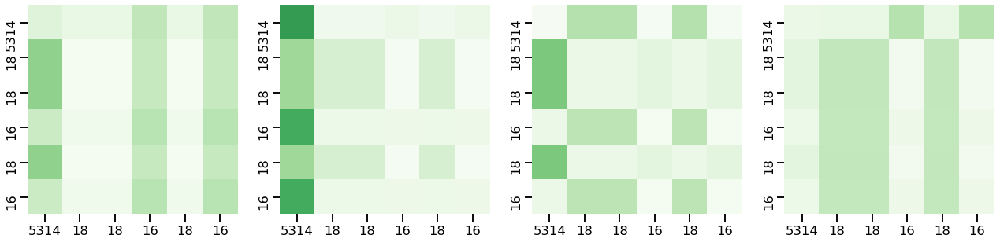

Encoder Layer 2


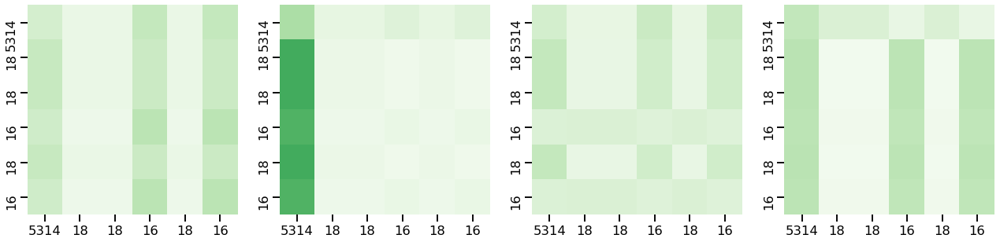



Ejemplo de tweet con label  support  y Tw_id  498298371615244289
Encoder Layer 1


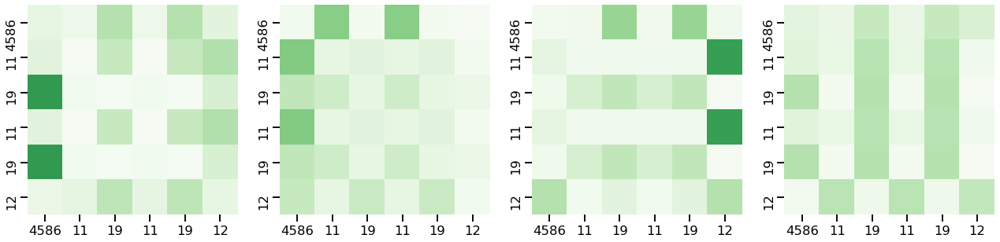

Encoder Layer 2


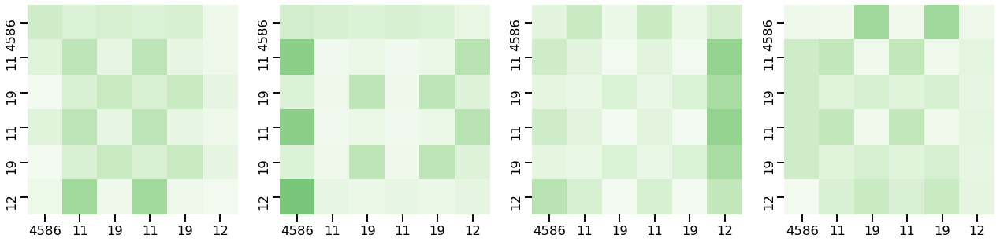



Ejemplo de tweet con label  denying  y Tw_id  758335648541671424
Encoder Layer 1


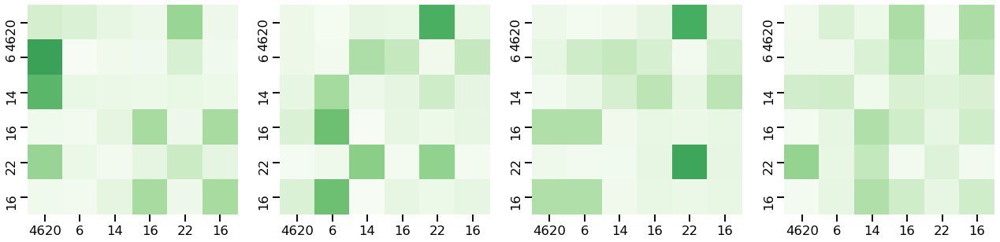

Encoder Layer 2


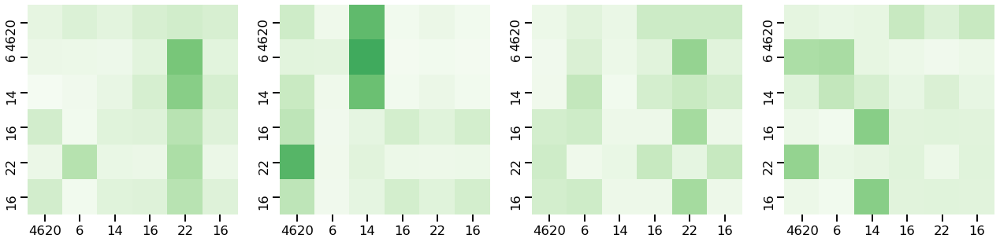



Ejemplo de tweet con label  questioning  y Tw_id  524925725317795840
Encoder Layer 1


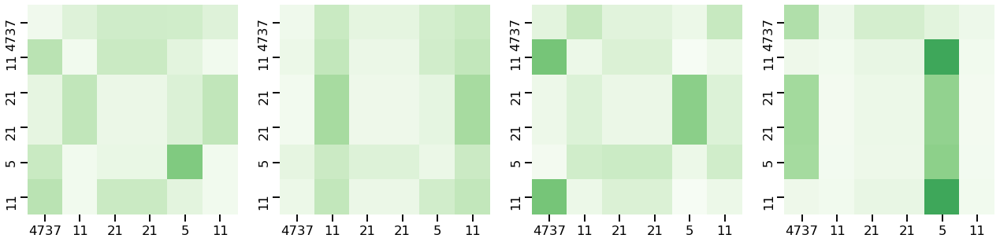

Encoder Layer 2


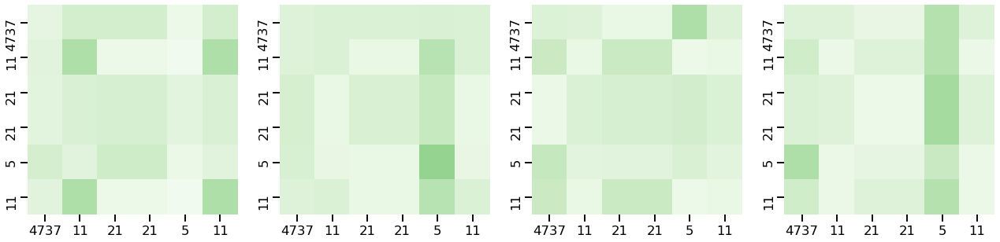

Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.233 	F-macro_val: 0.177
Epoch 10 	acc_val: 0.344 	F-macro_val: 0.304
Epoch 20 	acc_val: 0.451 	F-macro_val: 0.386
Epoch 30 	acc_val: 0.465 	F-macro_val: 0.403
Epoch 40 	acc_val: 0.500 	F-macro_val: 0.433
Epoch 50 	acc_val: 0.542 	F-macro_val: 0.452
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


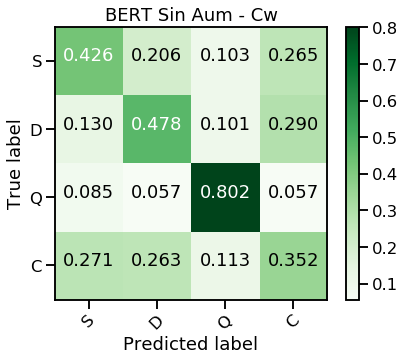

Test_ acc: 0.41234084231145934
Test_ f1 none: [0.17791411 0.20183486 0.58020478 0.5       ]
Test_ f1 macro: 0.36498843774294143


Ejemplo de tweet con label  commenting  y Tw_id  770234243356233728
Encoder Layer 1


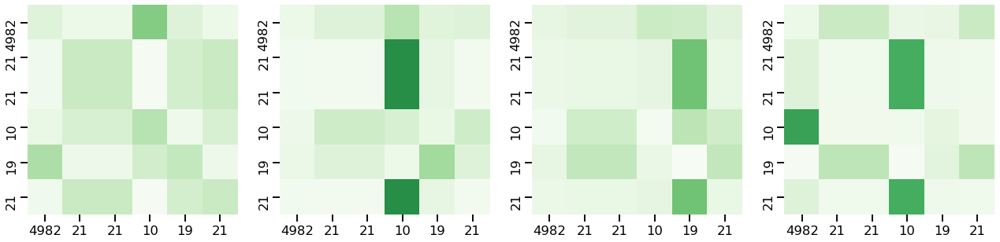

Encoder Layer 2


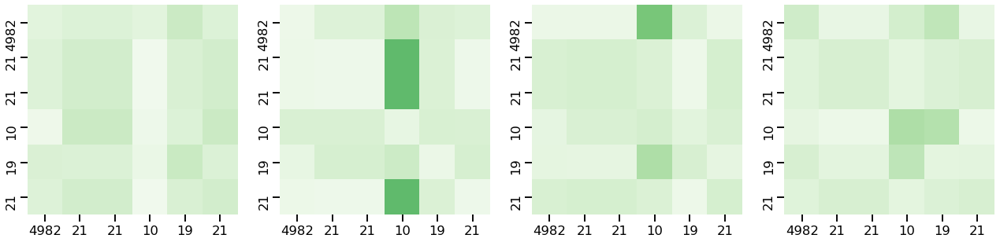



Ejemplo de tweet con label  support  y Tw_id  774991762687483908
Encoder Layer 1


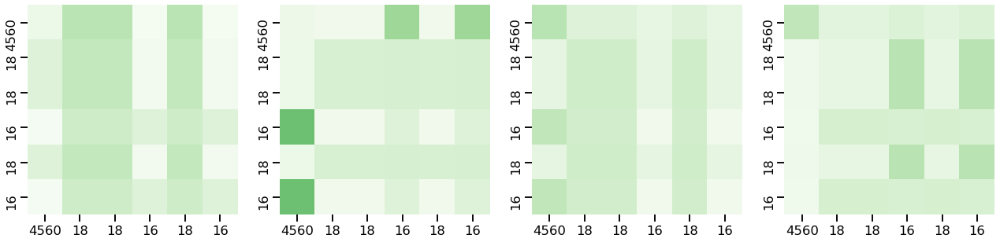

Encoder Layer 2


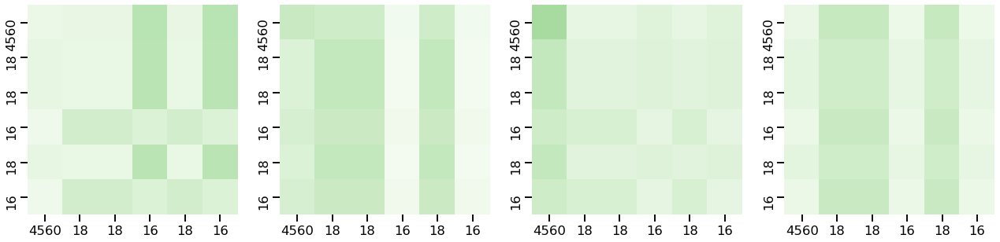



Ejemplo de tweet con label  denying  y Tw_id  764958204493176832
Encoder Layer 1


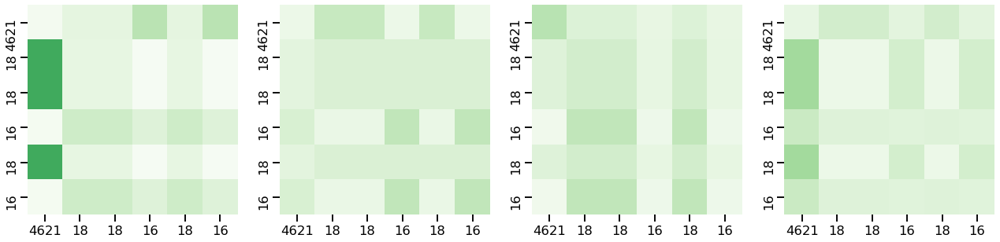

Encoder Layer 2


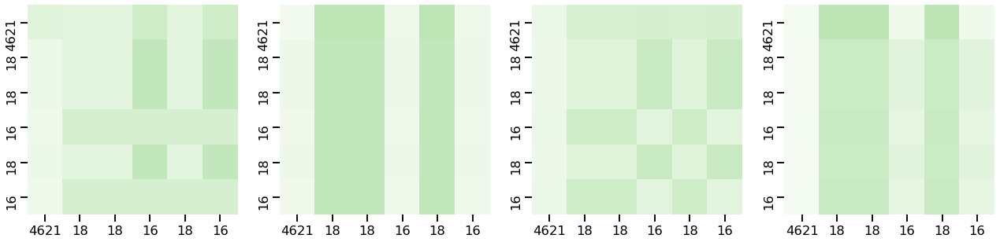



Ejemplo de tweet con label  questioning  y Tw_id  580359656750653441
Encoder Layer 1


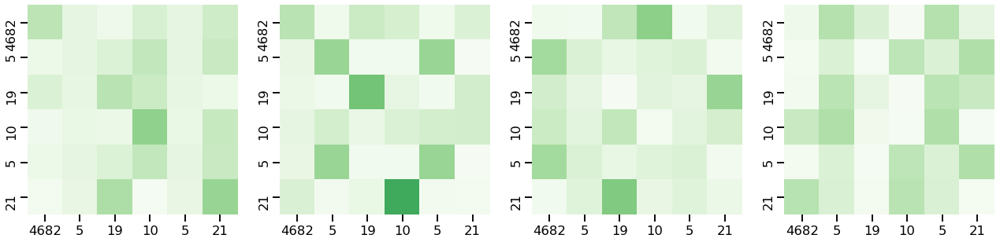

Encoder Layer 2


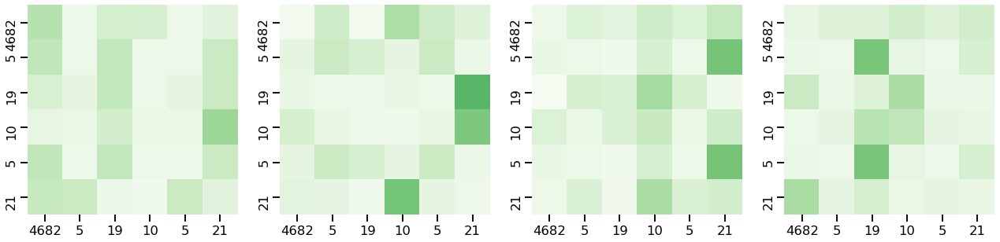

Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.170 	F-macro_val: 0.164
Epoch 10 	acc_val: 0.309 	F-macro_val: 0.313
Epoch 20 	acc_val: 0.399 	F-macro_val: 0.373
Epoch 30 	acc_val: 0.493 	F-macro_val: 0.446
Epoch 40 	acc_val: 0.528 	F-macro_val: 0.477
Epoch 50 	acc_val: 0.549 	F-macro_val: 0.490
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


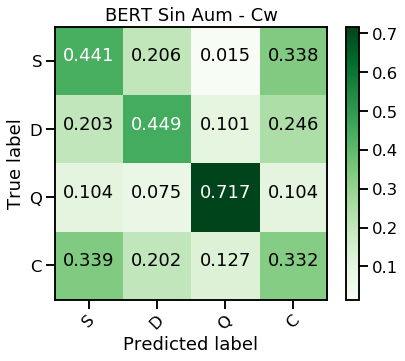

Test_ acc: 0.3868756121449559
Test_ f1 none: [0.15503876 0.22222222 0.52595156 0.47470101]
Test_ f1 macro: 0.344478387741273
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.208 	F-macro_val: 0.175
Epoch 10 	acc_val: 0.292 	F-macro_val: 0.262
Epoch 20 	acc_val: 0.368 	F-macro_val: 0.349
Epoch 30 	acc_val: 0.396 	F-macro_val: 0.379
Epoch 40 	acc_val: 0.406 	F-macro_val: 0.376
Epoch 50 	acc_val: 0.434 	F-macro_val: 0.402
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


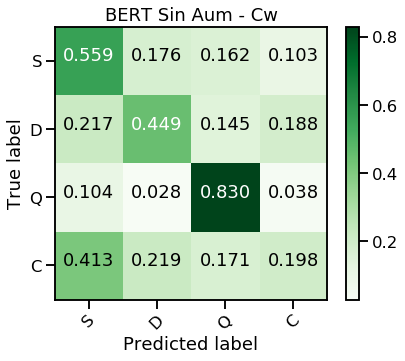

Test_ acc: 0.3046033300685602
Test_ f1 none: [0.16777042 0.21754386 0.50574713 0.32217573]
Test_ f1 macro: 0.3033092844323816
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.229 	F-macro_val: 0.176
Epoch 10 	acc_val: 0.323 	F-macro_val: 0.272
Epoch 20 	acc_val: 0.378 	F-macro_val: 0.328
Epoch 30 	acc_val: 0.378 	F-macro_val: 0.330
Epoch 40 	acc_val: 0.444 	F-macro_val: 0.377
Epoch 50 	acc_val: 0.472 	F-macro_val: 0.399
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


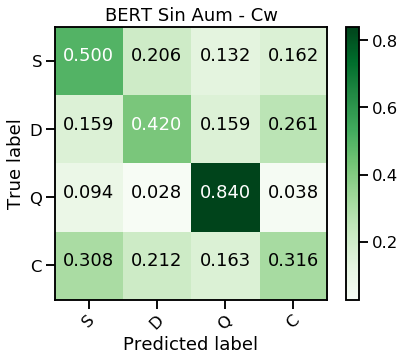

Test_ acc: 0.38981390793339865
Test_ f1 none: [0.18732782 0.20714286 0.52046784 0.46546831]
Test_ f1 macro: 0.3451017059048841
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.194 	F-macro_val: 0.137
Epoch 10 	acc_val: 0.274 	F-macro_val: 0.219
Epoch 20 	acc_val: 0.330 	F-macro_val: 0.296
Epoch 30 	acc_val: 0.385 	F-macro_val: 0.355


KeyboardInterrupt: 

In [11]:
class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
print (class_weights)

global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
best_macro={'F_ma':0.1 , 'Run':0}

prob=0.0
bs=32

for x in range(1,21): 
    print ("Entrenando Run #", x)
    cnn1 = load_model(path_m+str(prob)+'cw/cnn1_'+str(x)+'-exec.h5')
    cnn2 = load_model(path_m+str(prob)+'cw/cnn2_'+str(x)+'-exec.h5')
    rnn1 = load_model(path_m+str(prob)+'cw/rnn1_'+str(x)+'-exec.h5')
    rnn2 = load_model(path_m+str(prob)+'cw/rnn2_'+str(x)+'-exec.h5')
    rnn3 = load_model(path_m+str(prob)+'cw/rnn3_'+str(x)+'-exec.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    b_dim=768
    """espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']"""
    K_list_ext, index_embeddings, lab_str_embeddings, dict_match_kd = completar_kdummy([0,1,2,3])
    largo=len(index_embeddings)
    print("Index embeddings con preds", largo, ". Ult elemento:", index_embeddings[-1])
    
    for i in range(len(sentences)):
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector
            
        index_embeddings.append(i+largo)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
      
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector

        index_embeddings.append(num+largo+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    
    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, K_list_new, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model,  1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    for epoch in range(60):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')

        model.eval()
        DATA_VAL=data_gen(bs, 'Val', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)

        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(DATA_VAL, model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val: %.3f" % acc_val.numpy(), "\tF-macro_val: %.3f" % fma_val.numpy())

    model.eval()
    print ("Testing run #",x)
    DATA_TEST=data_gen(bs, 'Test', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)

    predicciones = run_epoch(DATA_TEST, model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)
    
    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

    plot_cm(cm_norma(glo_cm),["S","D","Q","C"],"BERT Sin Aum - Cw", cmap="Greens")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    if glo_fma>best_macro['F_ma']:
        best_macro['F_ma']=glo_fma
        best_macro['Run']=x                
        tope=4520

        for key in keys: 
            mask_s=test["Label"]==key
            q_tid=np.random.choice(test["Tw_id"][mask_s])
            q_ide=list(test["Tw_id"].values).index(q_tid)

            model.eval()

            temp2= [tope + q_ide]

            for m in range(n_machines): 
                query=match_kdummy(new_matrix[m][q_ide])
                temp2= temp2 + [dict_match_kd[query]] 
                #temp2= temp2 + [np.argmax(matrix_test[m][q_ide])+1] 

            sent = [temp2]
            src = torch.LongTensor([w for w in sent])
            src = Variable(src)
            src_mask = src_mask=  (src != 0).unsqueeze(-2)
            out = model.forward(src, src_mask)
            print ("\n\nEjemplo de tweet con label ", key, " y Tw_id ", q_tid)
            for layer in range(2):
                fig, axs = plt.subplots(1,4, figsize=(22,11))
                print("Encoder Layer", layer+1)
                for h in range(4):
                    draw(model.encoder.layers[layer].self_attn.attn[0, h].data, 
                                axs[h], sent, color="Greens")
                plt.show()

In [ ]:
best_macro

In [ ]:
print ("Acc: %.3f" % np.mean(np.asarray(global_accs)), "-- deviation: %.3f" % np.std(np.asarray(global_accs)))
print ("F-score: %.3f" % np.mean(np.asarray(global_fmacros)), "-- deviation: %.3f" % np.std(np.asarray(global_fmacros)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0CW) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
    
print (m_temp)

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='Greens')

In [11]:
#pond=[0.04, 0.14, 0.27, 0.55]
pond=[0.55, 0.27, 0.14, 0.04]
b_dim=768
Ks= ortho_group.rvs(dim=b_dim)
random=np.random.randint(Ks.shape[0], size=4)
dummies=Ks[random]

In [11]:
class_weights= np.asarray([1.0, 1.0, 1.0, 1.0])
path_a='../../../Datasets/CSV_Stance/Aumento_ofi/' 

print ("Pesos de clases:", class_weights)

Pesos de clases: [1. 1. 1. 1.]


In [12]:
def train_transformer(prob, num_epochs, path_a, path_m, c_gama,  xfrom=1, xto=20):    
    global_accs=[]
    global_fnones=[]
    global_fmacros=[]
    global_cms=[]
    global_attn=[]
    best_macro={'F_ma':0.1 , 'Run':0}

    bs=32

    for x in range(xfrom, xto + 1):

        macro_augmented= np.load(path_a + 'balance_GloVe_' + str(int(prob*100)) + '_'+ str(x)+'_run.npy', allow_pickle=True)

        ids_train=macro_augmented[:,0]
        tws_train=macro_augmented[:,1]
        labels_train=macro_augmented[:,2]
        class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
        print ("Pesos de clases:", class_weights)

        etiq=np.asarray(labels_train)
        sentences = tws_train
        n_labels = etiq.copy()
        y_train=to_categorical(n_labels,num_classes=4)

        input_ids=[]
        for sent in sentences:
            encoded_sent=[]
            for wd in sent:
                try:
                    encoded_sent.append(token_2_idx[wd])
                except:
                    continue
            input_ids.append(encoded_sent)

        input_ids = pad_sequences(input_ids,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
        shape=np.asarray(input_ids).shape

        x_train=np.zeros((shape[0], shape[1], emb))
        j=0
        for in_id in input_ids:
            x_train[j]=EMB_matrix[in_id]
            j+=1

        ################################################    
        print ("Entrenando Run #", x)
        cnn1 = load_model(path_m+str(prob)+'/cnn1_'+str(x)+'-exec.h5')
        cnn2 = load_model(path_m+str(prob)+'/cnn2_'+str(x)+'-exec.h5')
        rnn1 = load_model(path_m+str(prob)+'/rnn1_'+str(x)+'-exec.h5')
        rnn2 = load_model(path_m+str(prob)+'/rnn2_'+str(x)+'-exec.h5')
        rnn3 = load_model(path_m+str(prob)+'/rnn3_'+str(x)+'-exec.h5')

        list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
        index_models=np.arange(5)
        dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
        modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
        ind=np.arange(5)
        dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

        predicciones_all=[]
        predicciones_all_val=[]
        predicciones_all_test=[]

        print ("agregando predicciones Train")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
        print ("agregando predicciones Val")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
        print ("agregando predicciones Test")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

        matrix=np.asarray(predicciones_all)
        matrix_val=np.asarray(predicciones_all_val)
        matrix_test=np.asarray(predicciones_all_test)
        new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)

        b_dim=768
        """espacio=[np.ones(b_dim)]
        Ks= ortho_group.rvs(dim=b_dim)
        random=np.random.randint(Ks.shape[0], size=4)
        K_list=Ks[random]
        K_list_ext=espacio+list(K_list)
        index_embeddings=[0,1,2,3,4]
        lab_str_embeddings=['','','','','']"""
        K_list_ext, index_embeddings, lab_str_embeddings, dict_match_kd = completar_kdummy([0,1,2,3])
        largo=len(index_embeddings)
        print("Index embeddings con preds", largo, ". Ult elemento:", index_embeddings[-1])

        for i in range(len(sentences)):
            tw_tr=tws_train[i]
            clase=dict_cl[labels_train[i]]            
            tw=' '.join([word for word in tw_tr])
            vector= bc.encode([tw])[0]
            final_bert= vector
            index_embeddings.append(i+largo)
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)

        objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
        objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
        lab_val=val['Label']
        lab_test=test['Label']
        tw_val=val['Tweet']
        tw_test=test['Tweet']
        llaves=np.concatenate([objs_val,objs_test])
        clases=np.concatenate([lab_val,lab_test])
        sent_all=np.concatenate([tw_val,tw_test])

        for num in range(len(llaves)):
            i=llaves[num]
            clase=clases[num]
            tw_tr=sent_all[num]
            encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
            vector=bc.encode([encoded_tok])[0]
            final_bert= vector

            index_embeddings.append(num+largo+train.shape[0])
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)


        K_list_new= np.asarray(K_list_ext, dtype='float32')
        
        keras.backend.clear_session()
        gc.collect()
        
        ###################################### TRANSFORMER ###############################
        hist_train_loss=[]
        hist_train_acc=[]
        hist_train_fma=[]
        hist_val_loss=[]
        hist_val_acc=[]
        hist_val_fma=[]

        V = 4
        pesos = torch.from_numpy(class_weights).float()
        criterion = FocalLoss(weights=pesos)
        model = make_model_concat(4, K_list_new, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
        model_opt = NoamOpt(model.src_embed[0].d_model,  1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))


        for epoch in range(num_epochs):
            model.train()
            DATA=data_gen(bs, 'Train', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)  
            loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')

            model.eval()
            DATA_VAL=data_gen(bs, 'Val', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)
            loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(DATA_VAL, model, SimpleLossComputeFL(criterion, None),'Val')
            if epoch%10==0:
                print ("Epoch",epoch, "\tacc_val: %.3f" % acc_val.numpy(), "\tF-macro_val: %.3f" % fma_val.numpy())

        model.eval()
        print ("Testing run #",x)
        DATA_TEST=data_gen(bs, 'Test', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings, dict_match_kd)
        predicciones = run_epoch(DATA_TEST, model, SimpleLossComputeFL(criterion, None),'Test')
        predicciones=np.concatenate(predicciones, axis=-1)

        glo_acc=accuracy_score(etiq_t, predicciones[:-3])
        glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
        glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

        glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

        plot_cm(cm_norma(glo_cm),["S","D","Q","C"],"BERT Aum"+str(prob), cmap=c_gama)
        global_accs.append(glo_acc)
        global_fnones.append(glo_fno)
        global_fmacros.append(glo_fma)
        global_cms.append(glo_cm)
        print("Test_ acc:",glo_acc) 
        print("Test_ f1 none:",glo_fno) 
        print("Test_ f1 macro:",glo_fma) 

        if glo_fma>best_macro['F_ma']:
            best_macro['F_ma']=glo_fma
            best_macro['Run']=x                
            tope=11218

            for key in keys: 
                mask_s=test["Label"]==key
                q_tid=np.random.choice(test["Tw_id"][mask_s])
                q_ide=list(test["Tw_id"].values).index(q_tid)

                model.eval()

                temp2= [tope + q_ide]

                for m in range(n_machines): 
                    query=match_kdummy(new_matrix[m][q_ide])
                    temp2= temp2 + [dict_match_kd[query]] 
                    #temp2= temp2 + [np.argmax(matrix_test[m][q_ide])+1] 

                sent = [temp2]
                src = torch.LongTensor([w for w in sent])
                src = Variable(src)
                src_mask = src_mask=  (src != 0).unsqueeze(-2)
                out = model.forward(src, src_mask)
                print ("\n\nEjemplo de tweet con label ", key, " y Tw_id ", q_tid)
                for layer in range(2):
                    fig, axs = plt.subplots(1,4, figsize=(22,11))
                    print("Encoder Layer", layer+1)
                    for h in range(4):
                        draw(model.encoder.layers[layer].self_attn.attn[0, h].data, 
                            axs[h], sent, color=c_gama)
                    plt.show()
                    
    return best_macro, global_accs, global_fnones, global_fmacros, global_cms

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 1





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.385 	F-macro_val: 0.215
Epoch 10 	acc_val: 0.688 	F-macro_val: 0.566
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.538
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


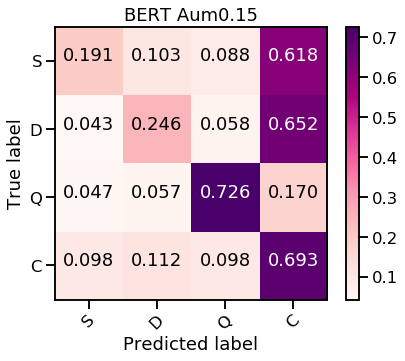

Test_ acc: 0.6327130264446621
Test_ f1 none: [0.15757576 0.1827957  0.57249071 0.7580872 ]
Test_ f1 macro: 0.41773734098634174


Ejemplo de tweet con label  commenting  y Tw_id  758650087786635265
Encoder Layer 1


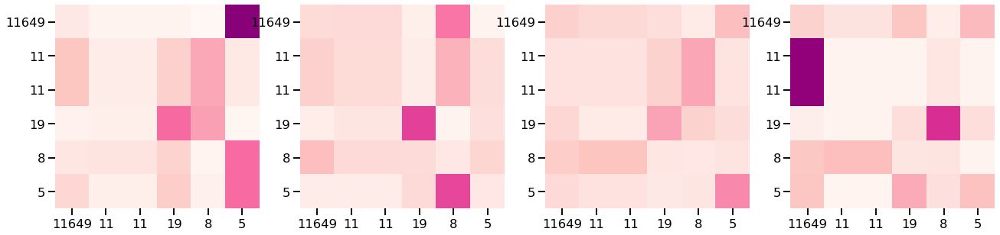

Encoder Layer 2


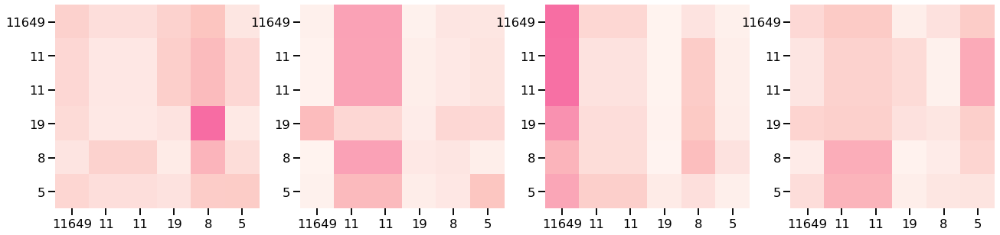



Ejemplo de tweet con label  support  y Tw_id  767865278088769537
Encoder Layer 1


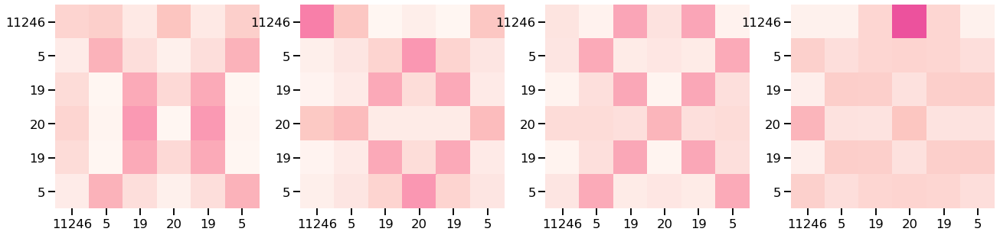

Encoder Layer 2


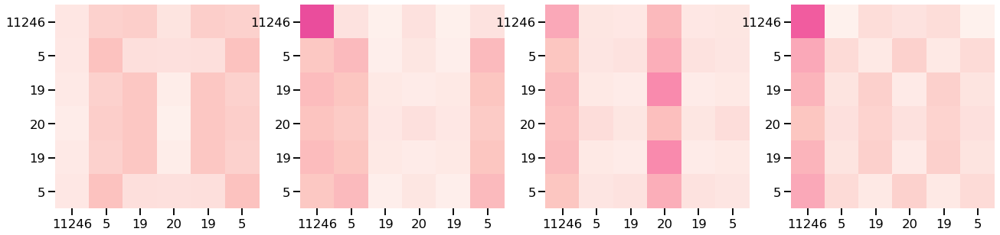



Ejemplo de tweet con label  denying  y Tw_id  769989851370360832
Encoder Layer 1


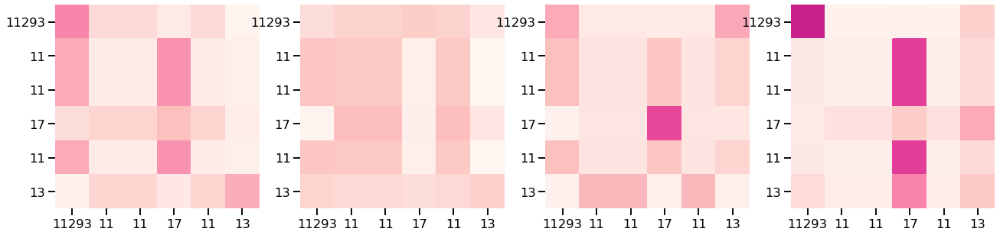

Encoder Layer 2


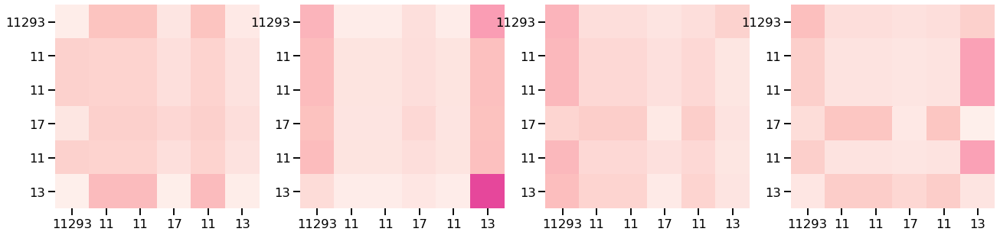



Ejemplo de tweet con label  questioning  y Tw_id  758354844264435714
Encoder Layer 1


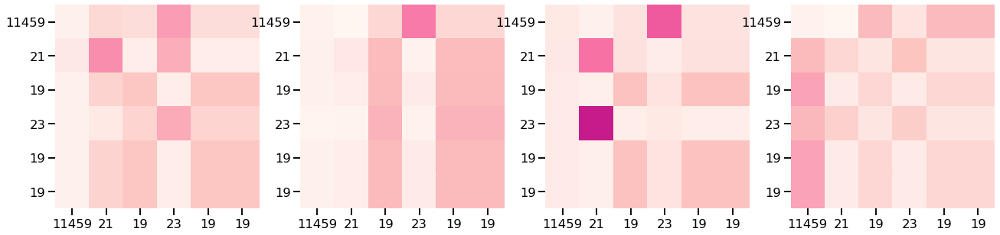

Encoder Layer 2


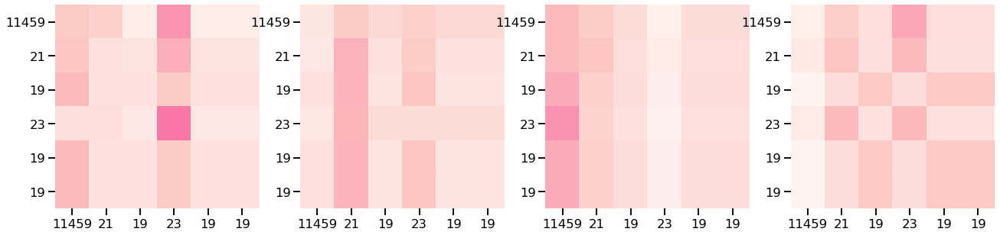

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.347 	F-macro_val: 0.212
Epoch 10 	acc_val: 0.667 	F-macro_val: 0.486
Epoch 20 	acc_val: 0.681 	F-macro_val: 0.512
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


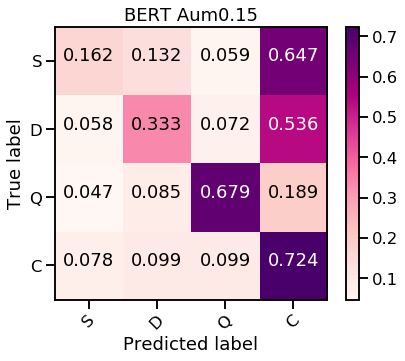

Test_ acc: 0.6552399608227228
Test_ f1 none: [0.14765101 0.2459893  0.54545455 0.78085992]
Test_ f1 macro: 0.4299886934402589


Ejemplo de tweet con label  commenting  y Tw_id  775048384642109440
Encoder Layer 1


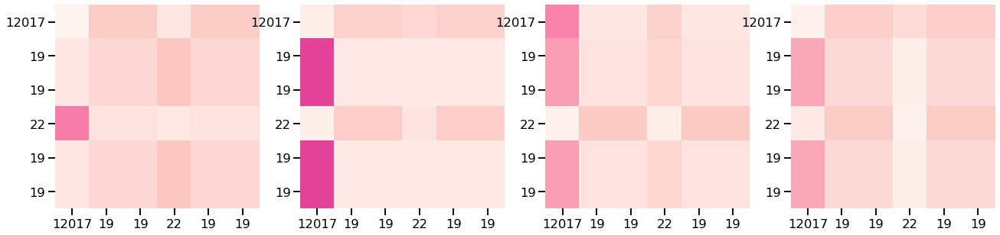

Encoder Layer 2


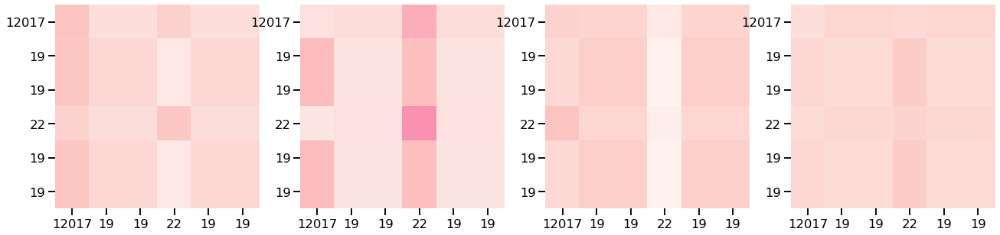



Ejemplo de tweet con label  support  y Tw_id  498298019045847040
Encoder Layer 1


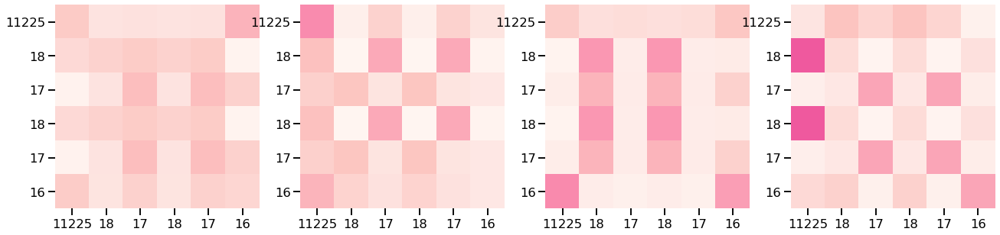

Encoder Layer 2


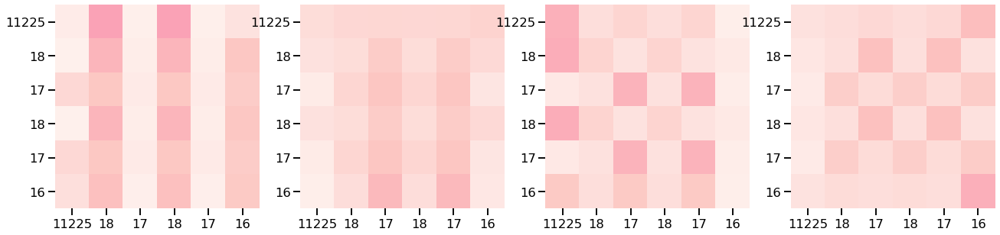



Ejemplo de tweet con label  denying  y Tw_id  758474098838122496
Encoder Layer 1


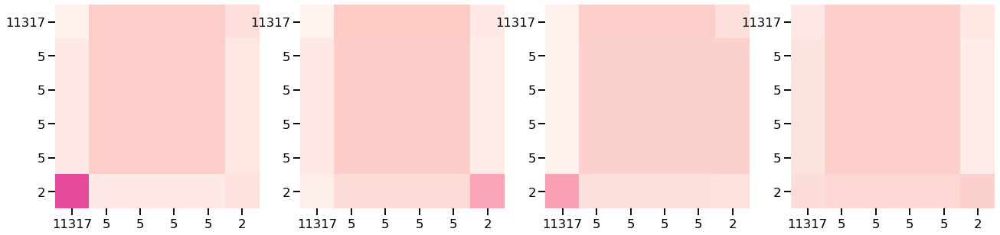

Encoder Layer 2


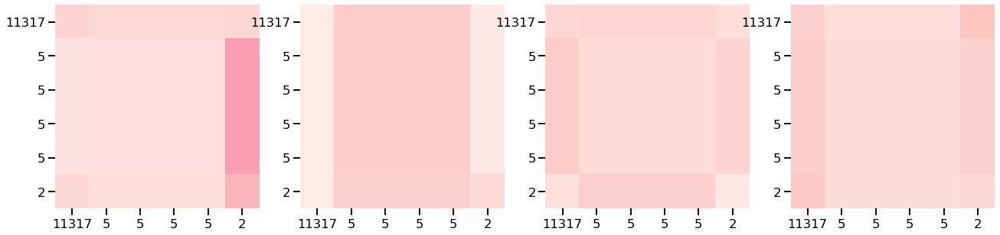



Ejemplo de tweet con label  questioning  y Tw_id  498490564887990272
Encoder Layer 1


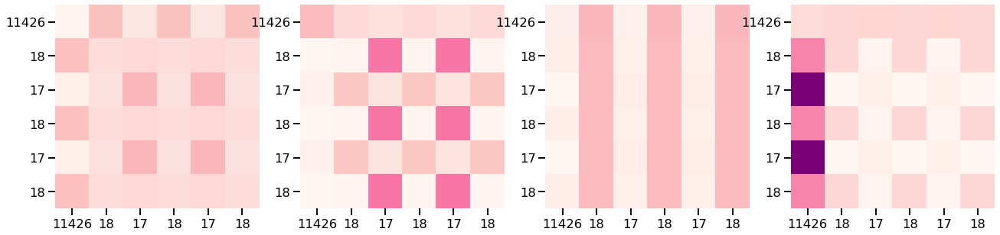

Encoder Layer 2


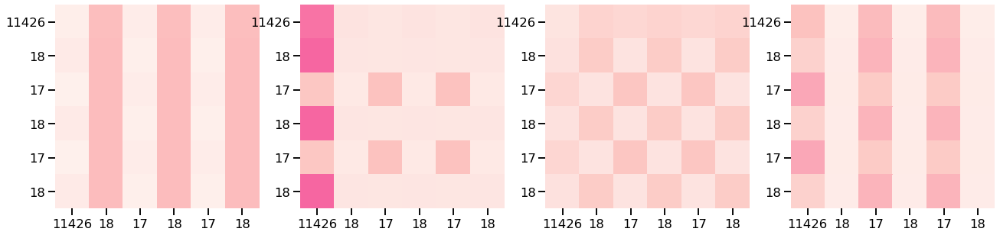

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.247 	F-macro_val: 0.179
Epoch 10 	acc_val: 0.622 	F-macro_val: 0.497
Epoch 20 	acc_val: 0.639 	F-macro_val: 0.508
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


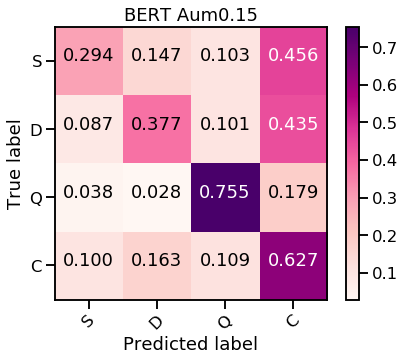

Test_ acc: 0.6013712047012733
Test_ f1 none: [0.22727273 0.2212766  0.56140351 0.72511144]
Test_ f1 macro: 0.43376606827422903


Ejemplo de tweet con label  commenting  y Tw_id  553558438790565888
Encoder Layer 1


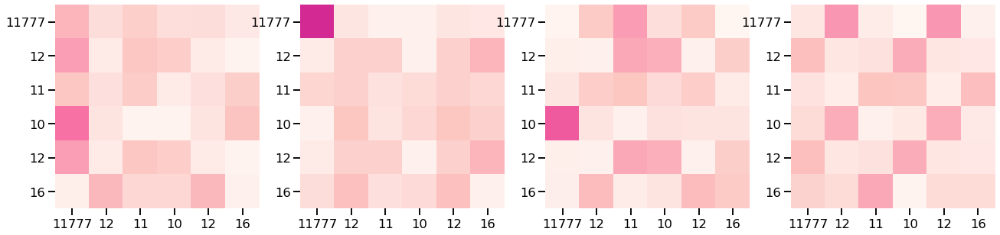

Encoder Layer 2


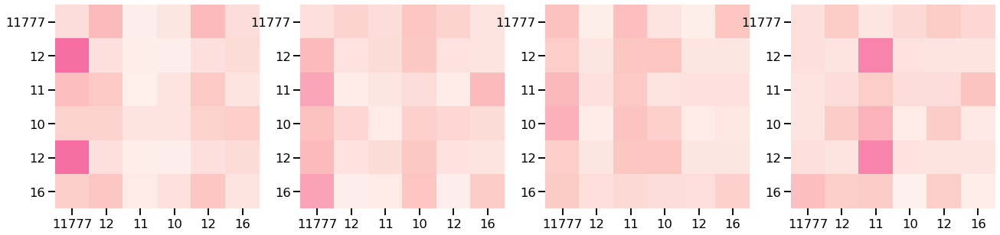



Ejemplo de tweet con label  support  y Tw_id  581360312143724544
Encoder Layer 1


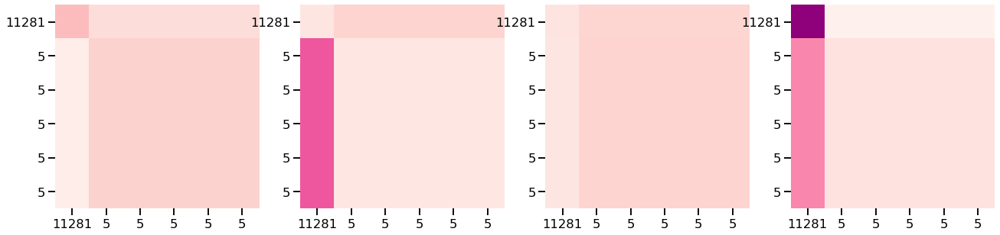

Encoder Layer 2


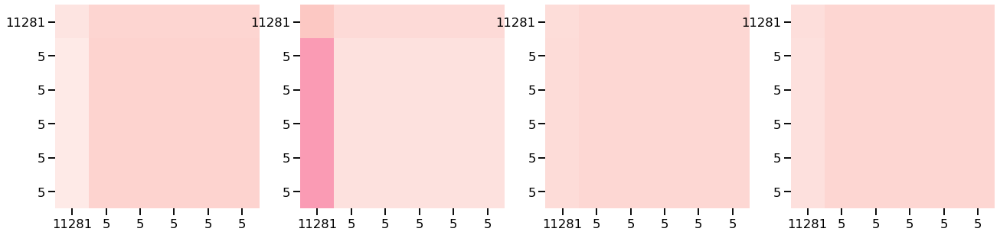



Ejemplo de tweet con label  denying  y Tw_id  553562840808697856
Encoder Layer 1


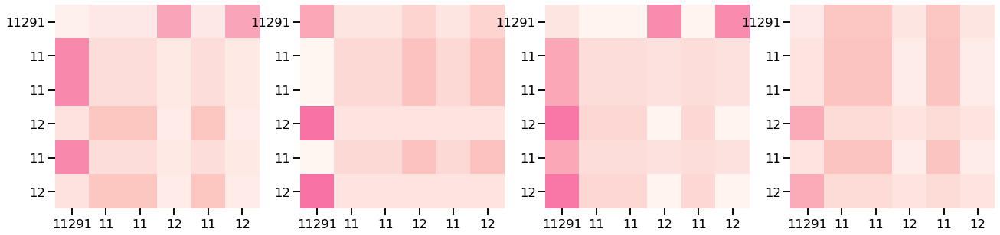

Encoder Layer 2


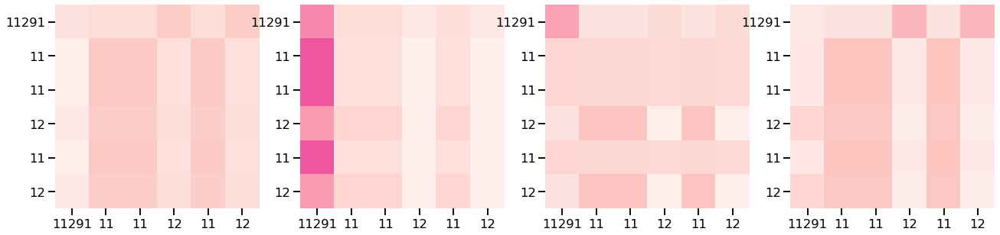



Ejemplo de tweet con label  questioning  y Tw_id  758288954848337920
Encoder Layer 1


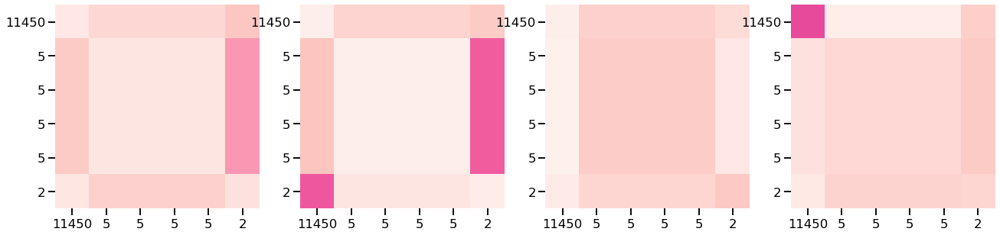

Encoder Layer 2


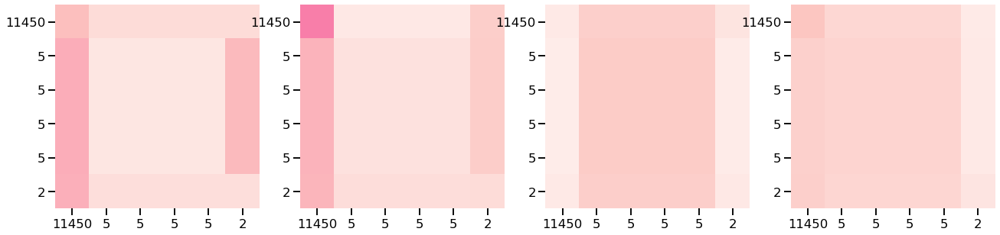

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.243 	F-macro_val: 0.174
Epoch 10 	acc_val: 0.660 	F-macro_val: 0.507
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.514
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


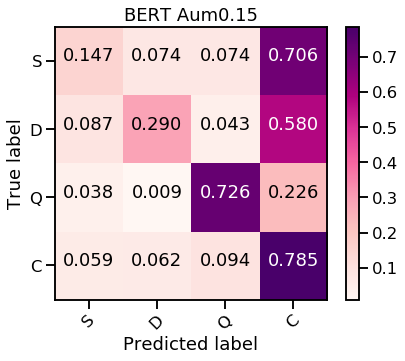

Test_ acc: 0.703232125367287
Test_ f1 none: [0.14925373 0.27972028 0.58333333 0.81412392]
Test_ f1 macro: 0.4566078154463261


Ejemplo de tweet con label  commenting  y Tw_id  581190518044000256
Encoder Layer 1


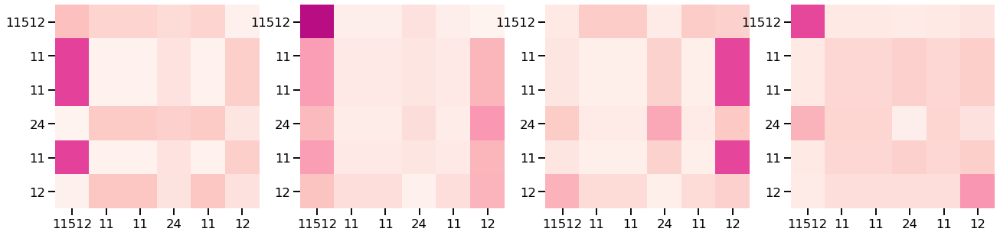

Encoder Layer 2


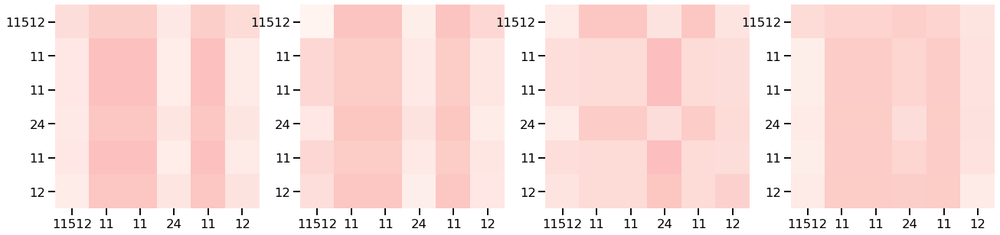



Ejemplo de tweet con label  support  y Tw_id  774992285557678080
Encoder Layer 1


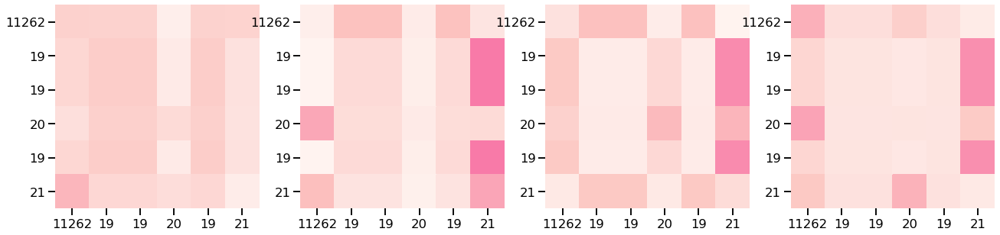

Encoder Layer 2


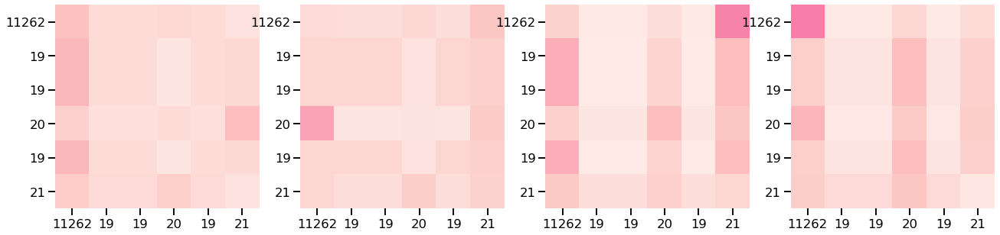



Ejemplo de tweet con label  denying  y Tw_id  763151780087672832
Encoder Layer 1


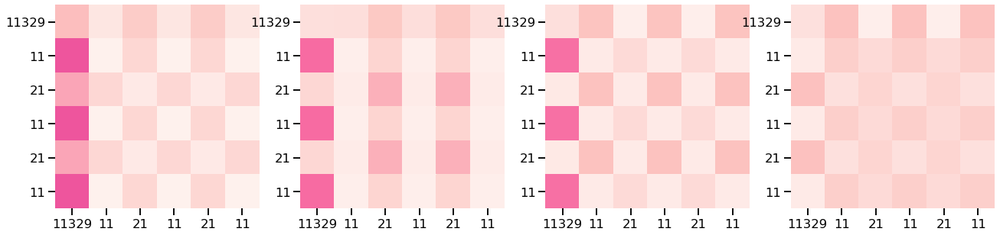

Encoder Layer 2


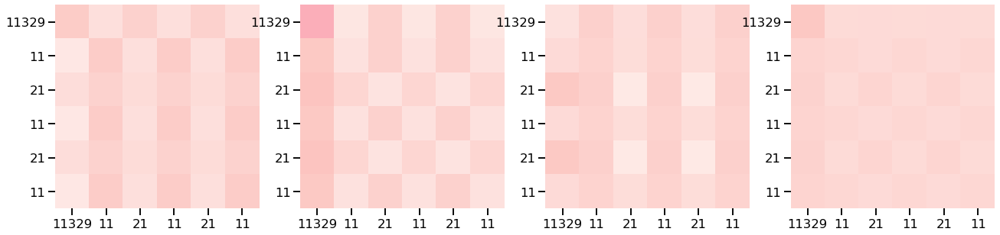



Ejemplo de tweet con label  questioning  y Tw_id  498314140436684800
Encoder Layer 1


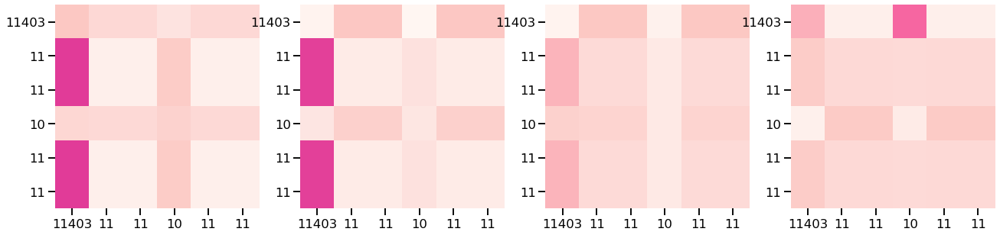

Encoder Layer 2


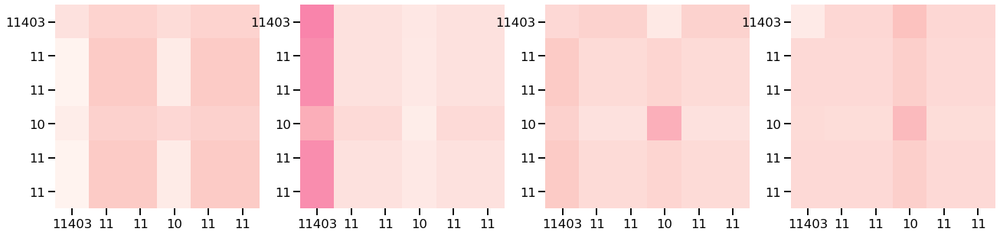

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.271 	F-macro_val: 0.183
Epoch 10 	acc_val: 0.632 	F-macro_val: 0.511
Epoch 20 	acc_val: 0.653 	F-macro_val: 0.519
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


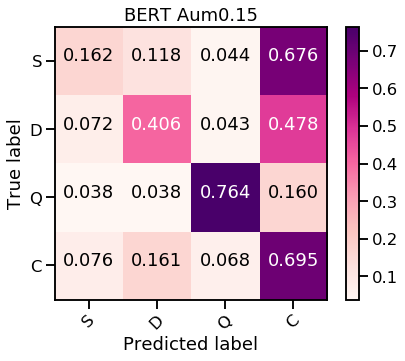

Test_ acc: 0.6474045053868757
Test_ f1 none: [0.14965986 0.23931624 0.65853659 0.76466431]
Test_ f1 macro: 0.45304424989543374
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.385 	F-macro_val: 0.218
Epoch 10 	acc_val: 0.646 	F-macro_val: 0.509
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.530
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


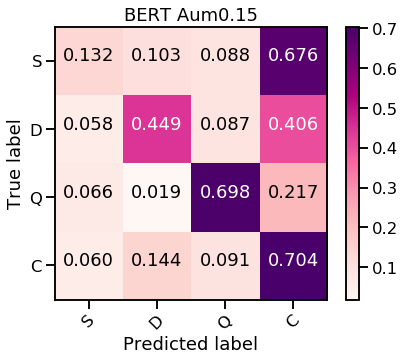

Test_ acc: 0.6483839373163565
Test_ f1 none: [0.13333333 0.28054299 0.56273764 0.77020379]
Test_ f1 macro: 0.4367044392859858
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.253 	F-macro_val: 0.197
Epoch 10 	acc_val: 0.632 	F-macro_val: 0.515
Epoch 20 	acc_val: 0.660 	F-macro_val: 0.542
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


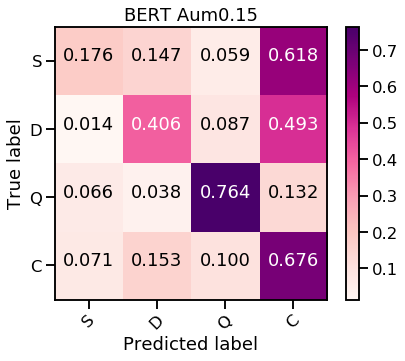

Test_ acc: 0.633692458374143
Test_ f1 none: [0.16783217 0.24347826 0.58909091 0.75466284]
Test_ f1 macro: 0.43876604463467417
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.132 	F-macro_val: 0.102
Epoch 10 	acc_val: 0.677 	F-macro_val: 0.550
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.583
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


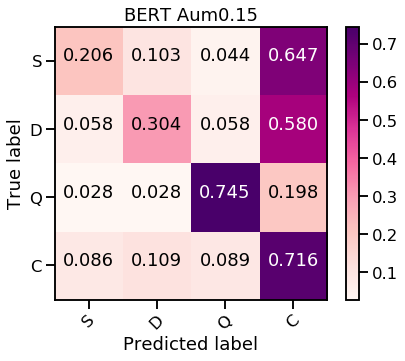

Test_ acc: 0.6571988246816847
Test_ f1 none: [0.17948718 0.22702703 0.60536398 0.77361111]
Test_ f1 macro: 0.4463723255749118
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.229 	F-macro_val: 0.167
Epoch 10 	acc_val: 0.653 	F-macro_val: 0.491
Epoch 20 	acc_val: 0.667 	F-macro_val: 0.497
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


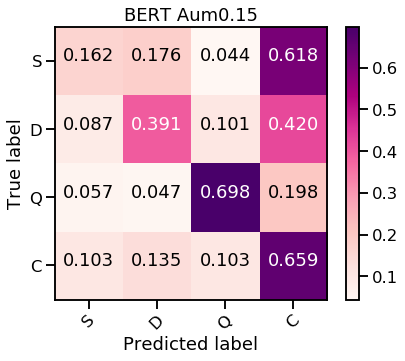

Test_ acc: 0.6121449559255632
Test_ f1 none: [0.12865497 0.24770642 0.54814815 0.74186551]
Test_ f1 macro: 0.41659376267202974
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.222 	F-macro_val: 0.178
Epoch 10 	acc_val: 0.653 	F-macro_val: 0.516
Epoch 20 	acc_val: 0.642 	F-macro_val: 0.501
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


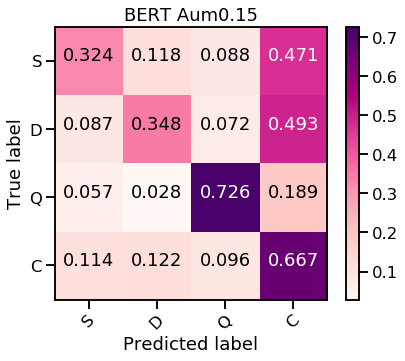

Test_ acc: 0.6287952987267384
Test_ f1 none: [0.23036649 0.24120603 0.57249071 0.7505423 ]
Test_ f1 macro: 0.4486513819915735
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 11
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.278 	F-macro_val: 0.223
Epoch 10 	acc_val: 0.649 	F-macro_val: 0.496
Epoch 20 	acc_val: 0.663 	F-macro_val: 0.516
Testing run # 11
SE TUVIERON QUE REPETIR 3 EJEMPLOS


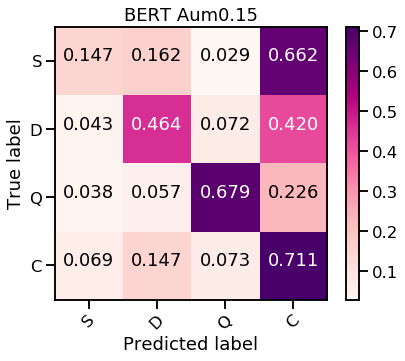

Test_ acc: 0.653281096963761
Test_ f1 none: [0.14388489 0.27586207 0.59504132 0.77396781]
Test_ f1 macro: 0.44718902325575016
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 12
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.205 	F-macro_val: 0.165
Epoch 10 	acc_val: 0.667 	F-macro_val: 0.525
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.567
Testing run # 12
SE TUVIERON QUE REPETIR 3 EJEMPLOS


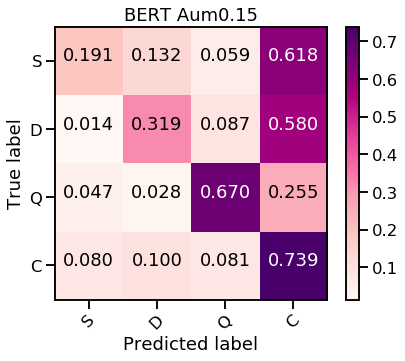

Test_ acc: 0.6669931439764937
Test_ f1 none: [0.17449664 0.24309392 0.568      0.78659371]
Test_ f1 macro: 0.44304606854939443
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 13
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.184 	F-macro_val: 0.139
Epoch 10 	acc_val: 0.601 	F-macro_val: 0.480
Epoch 20 	acc_val: 0.649 	F-macro_val: 0.497
Testing run # 13
SE TUVIERON QUE REPETIR 3 EJEMPLOS


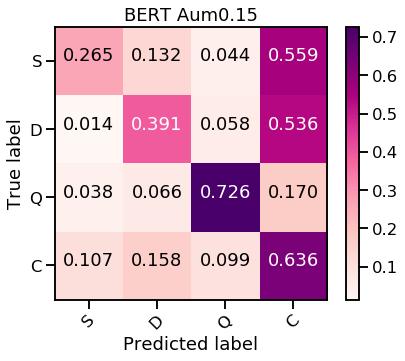

Test_ acc: 0.604309500489716
Test_ f1 none: [0.20689655 0.22978723 0.57677903 0.72474378]
Test_ f1 macro: 0.4345516473590839
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 14
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.333 	F-macro_val: 0.213
Epoch 10 	acc_val: 0.625 	F-macro_val: 0.492
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.528
Testing run # 14
SE TUVIERON QUE REPETIR 3 EJEMPLOS


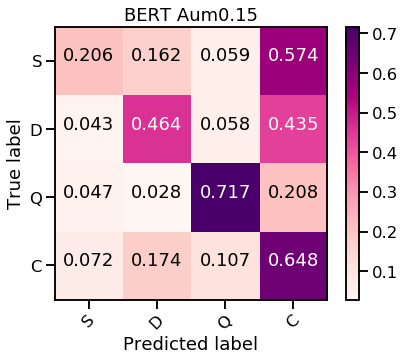

Test_ acc: 0.6131243878550441
Test_ f1 none: [0.19178082 0.256      0.55677656 0.73415878]
Test_ f1 macro: 0.4346790387741011
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 15
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.354 	F-macro_val: 0.253
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.525
Epoch 20 	acc_val: 0.656 	F-macro_val: 0.515
Testing run # 15
SE TUVIERON QUE REPETIR 3 EJEMPLOS


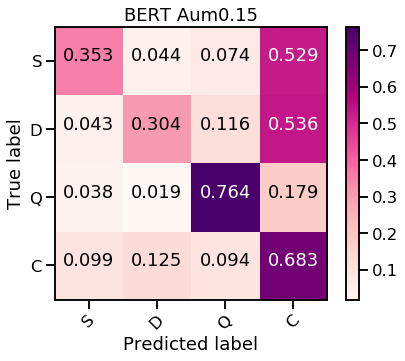

Test_ acc: 0.643486777668952
Test_ f1 none: [0.27272727 0.21875    0.59340659 0.75802998]
Test_ f1 macro: 0.46072846118014754


Ejemplo de tweet con label  commenting  y Tw_id  764940536461533184
Encoder Layer 1


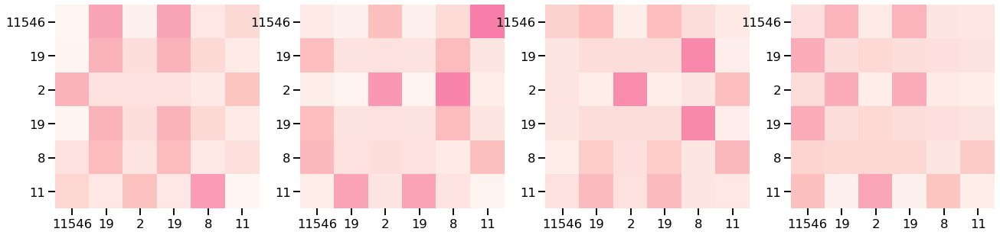

Encoder Layer 2


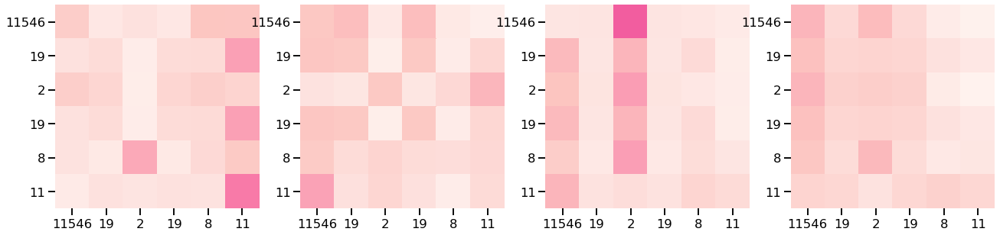



Ejemplo de tweet con label  support  y Tw_id  498297185834786816
Encoder Layer 1


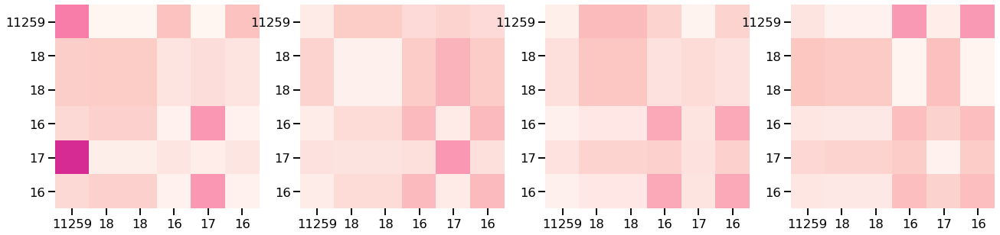

Encoder Layer 2


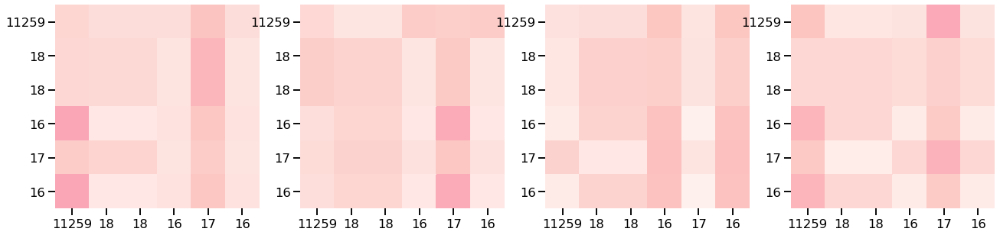



Ejemplo de tweet con label  denying  y Tw_id  758342047237492736
Encoder Layer 1


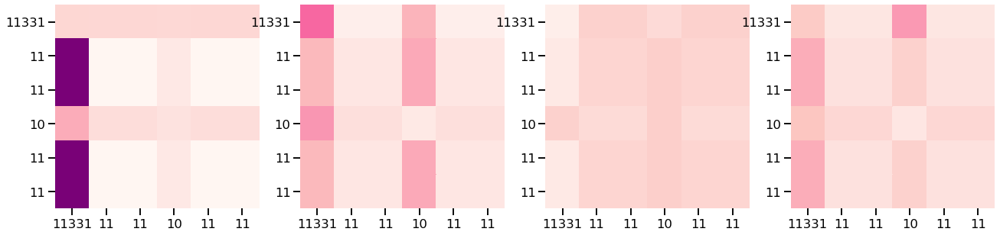

Encoder Layer 2


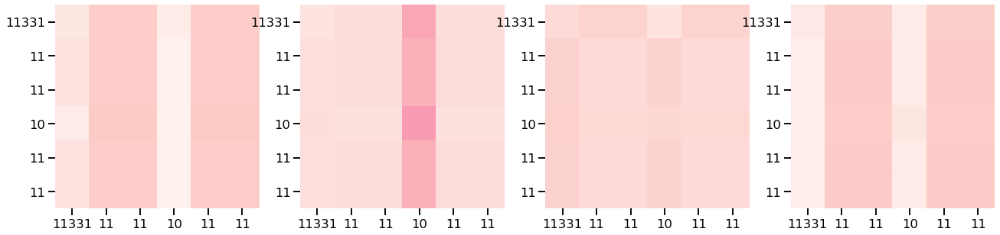



Ejemplo de tweet con label  questioning  y Tw_id  544275904831422464
Encoder Layer 1


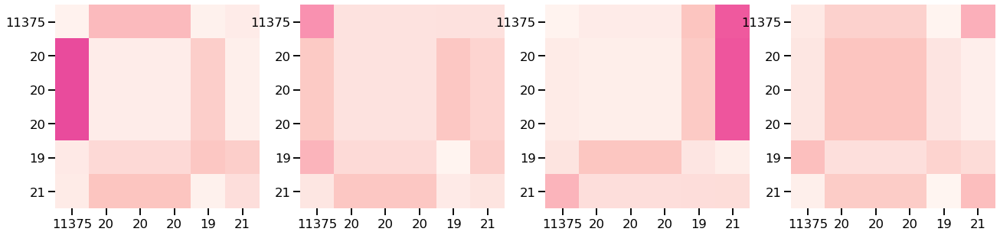

Encoder Layer 2


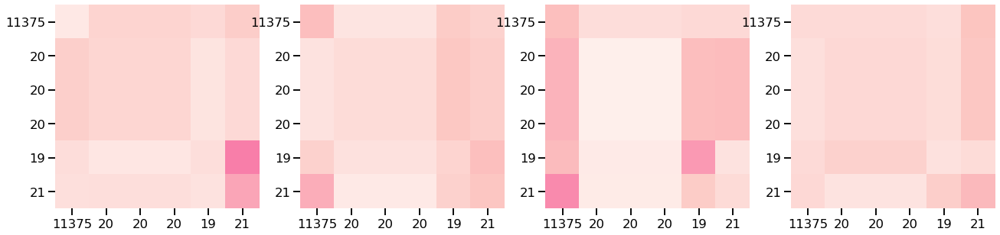

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 16
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.177 	F-macro_val: 0.158
Epoch 10 	acc_val: 0.590 	F-macro_val: 0.477
Epoch 20 	acc_val: 0.646 	F-macro_val: 0.486
Testing run # 16
SE TUVIERON QUE REPETIR 3 EJEMPLOS


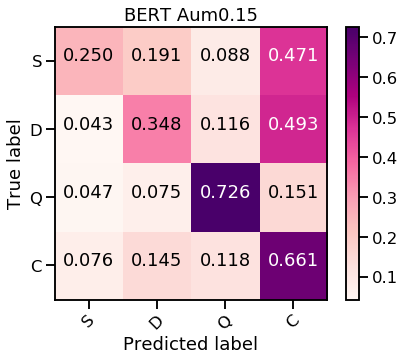

Test_ acc: 0.6190009794319294
Test_ f1 none: [0.22368421 0.21145374 0.53287197 0.74818049]
Test_ f1 macro: 0.4290476055608582
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 17
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.260 	F-macro_val: 0.201
Epoch 10 	acc_val: 0.639 	F-macro_val: 0.511
Epoch 20 	acc_val: 0.667 	F-macro_val: 0.518
Testing run # 17
SE TUVIERON QUE REPETIR 3 EJEMPLOS


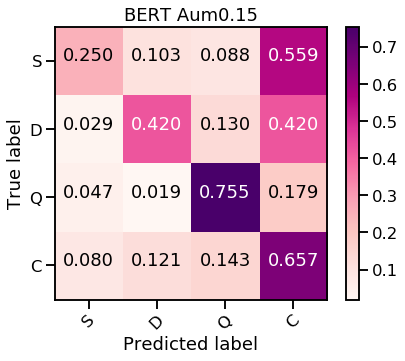

Test_ acc: 0.623898139079334
Test_ f1 none: [0.22077922 0.28855721 0.51282051 0.74327273]
Test_ f1 macro: 0.4413574187007023
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 18
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.528 	F-macro_val: 0.250
Epoch 10 	acc_val: 0.670 	F-macro_val: 0.518
Epoch 20 	acc_val: 0.660 	F-macro_val: 0.507
Testing run # 18
SE TUVIERON QUE REPETIR 3 EJEMPLOS


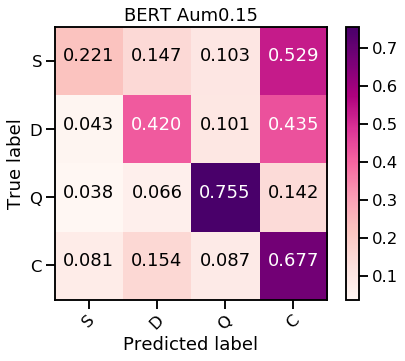

Test_ acc: 0.6376101860920667
Test_ f1 none: [0.19607843 0.24680851 0.59701493 0.76046176]
Test_ f1 macro: 0.4500909069614354
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 19
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.378 	F-macro_val: 0.221
Epoch 10 	acc_val: 0.635 	F-macro_val: 0.492
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.526
Testing run # 19
SE TUVIERON QUE REPETIR 3 EJEMPLOS


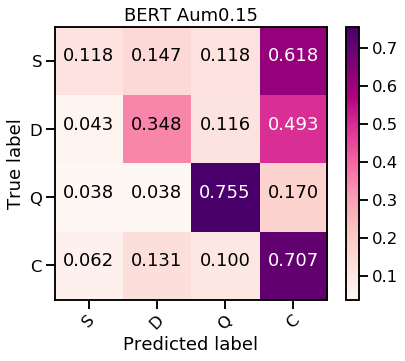

Test_ acc: 0.6483839373163565
Test_ f1 none: [0.1221374  0.22966507 0.57142857 0.77355837]
Test_ f1 macro: 0.42419735406853404
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 20
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.139 	F-macro_val: 0.120
Epoch 10 	acc_val: 0.646 	F-macro_val: 0.502
Epoch 20 	acc_val: 0.656 	F-macro_val: 0.497
Testing run # 20
SE TUVIERON QUE REPETIR 3 EJEMPLOS


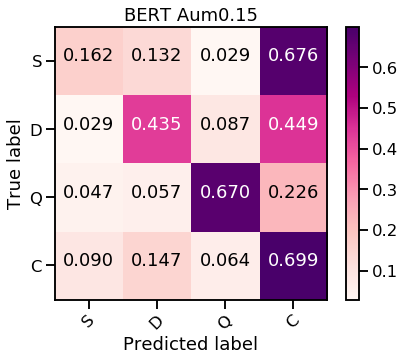

Test_ acc: 0.6425073457394711
Test_ f1 none: [0.14102564 0.26315789 0.60425532 0.76458187]
Test_ f1 macro: 0.44325518105041284


In [15]:
best_15, all_accs, all_fno, all_ma, all_cm =train_transformer(0.15, 30, path_a, path_m, "RdPu")

In [16]:
best_15 

{'F_ma': 0.46072846118014754, 'Run': 15}

Acc: 0.639 -- deviation: 0.023
F-score: 0.439 -- deviation: 0.012
(0.15) SDQC: 0.17822891607214994 0.24360972531195096 0.5753722434933964 0.7600640806549397


Confusion counts
[[  280.   175.    94.   811.]
 [   69.   515.   115.   681.]
 [   96.    88.  1537.   399.]
 [ 1292.  2070.  1489. 10709.]]


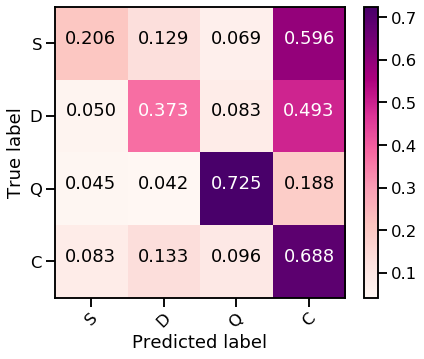

In [17]:
#best_15, all_accs, all_fno, all_ma, all_cm
print ("Acc: %.3f" % np.mean(np.asarray(all_accs)), "-- deviation: %.3f" % np.std(np.asarray(all_accs)))
print ("F-score: %.3f" % np.mean(np.asarray(all_ma)), "-- deviation: %.3f" % np.std(np.asarray(all_ma)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(all_fno)[:,0])
den=np.mean(np.asarray(all_fno)[:,1])
que=np.mean(np.asarray(all_fno)[:,2])
com=np.mean(np.asarray(all_fno)[:,3])

print ("(0.15) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in all_cm:
    m_temp+=np.asarray(m)
    
print (m_temp)

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='RdPu')

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 1





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.299 	F-macro_val: 0.201
Epoch 10 	acc_val: 0.656 	F-macro_val: 0.536
Epoch 20 	acc_val: 0.653 	F-macro_val: 0.519
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


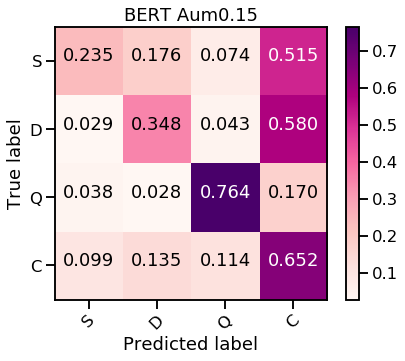

Test_ acc: 0.6150832517140059
Test_ f1 none: [0.19161677 0.22535211 0.57042254 0.73584906]
Test_ f1 macro: 0.43081011773954087


Ejemplo de tweet con label  commenting  y Tw_id  581360970716614656
Encoder Layer 1


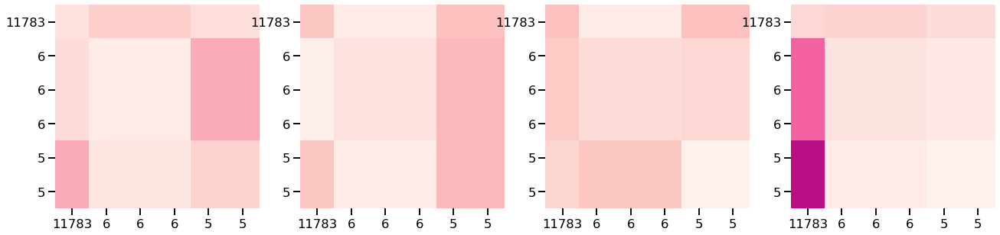

Encoder Layer 2


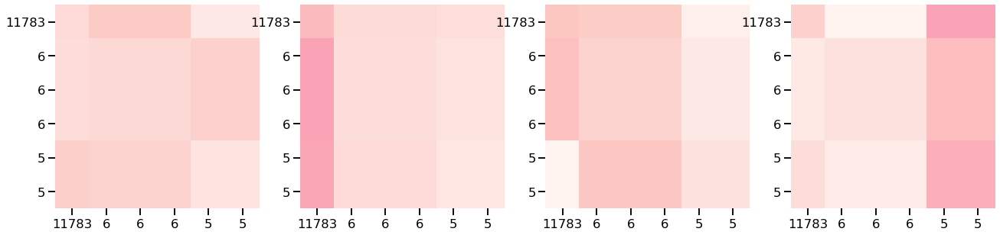



Ejemplo de tweet con label  support  y Tw_id  552793839782862848
Encoder Layer 1


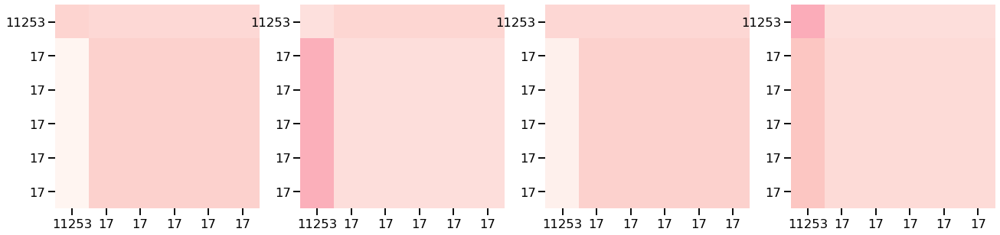

Encoder Layer 2


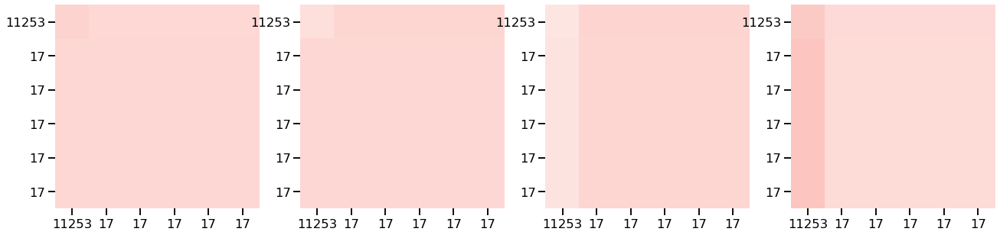



Ejemplo de tweet con label  denying  y Tw_id  758741157106978817
Encoder Layer 1


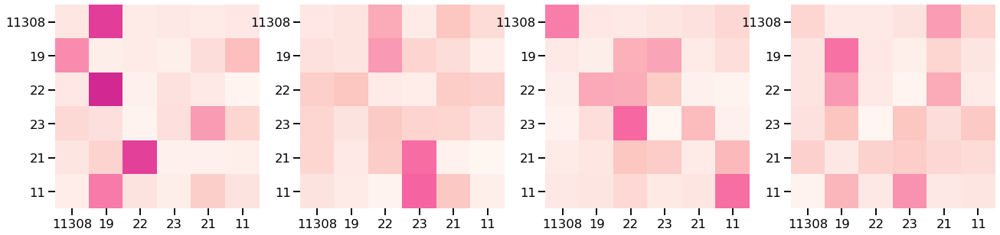

Encoder Layer 2


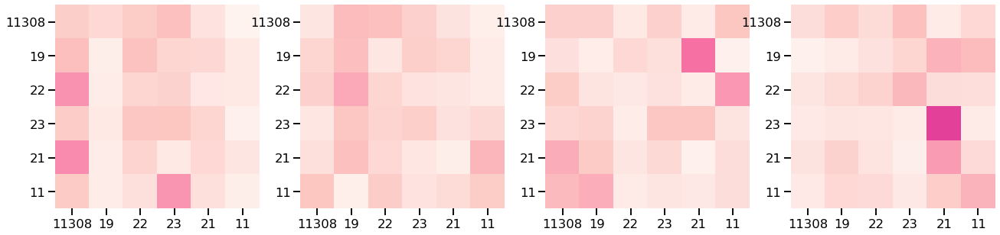



Ejemplo de tweet con label  questioning  y Tw_id  767729212190961666
Encoder Layer 1


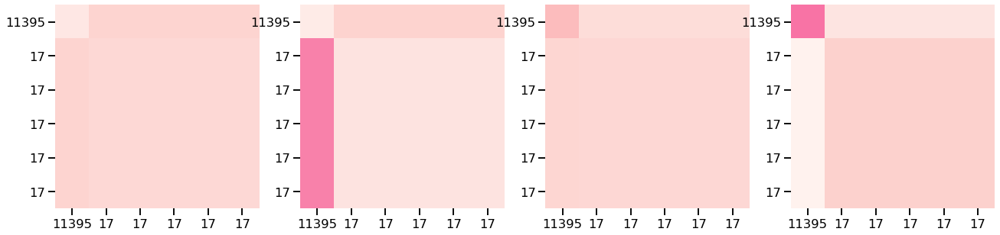

Encoder Layer 2


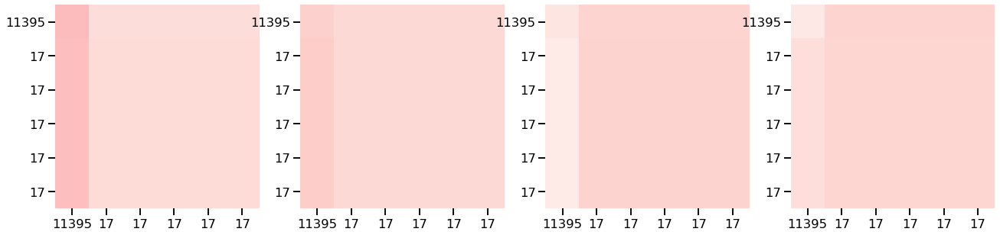

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.372 	F-macro_val: 0.263
Epoch 10 	acc_val: 0.656 	F-macro_val: 0.504
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.527
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


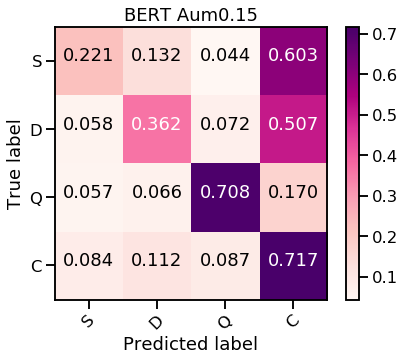

Test_ acc: 0.6591576885406464
Test_ f1 none: [0.18987342 0.25380711 0.58365759 0.78041958]
Test_ f1 macro: 0.4519394230721806


Ejemplo de tweet con label  commenting  y Tw_id  767749943360643076
Encoder Layer 1


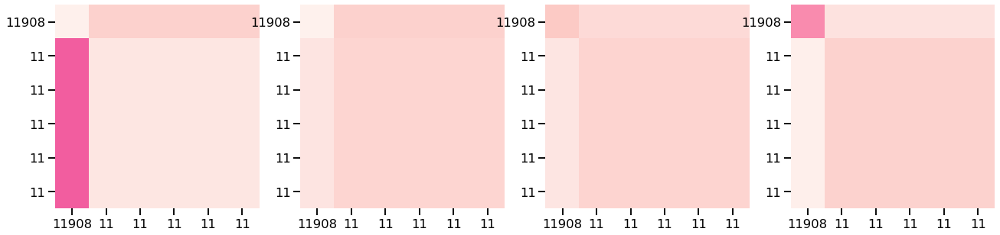

Encoder Layer 2


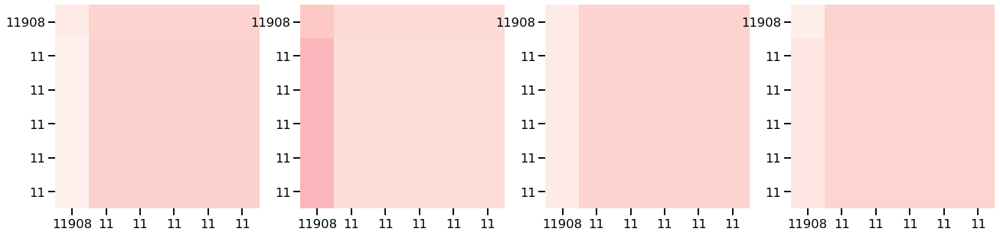



Ejemplo de tweet con label  support  y Tw_id  769993008896995328
Encoder Layer 1


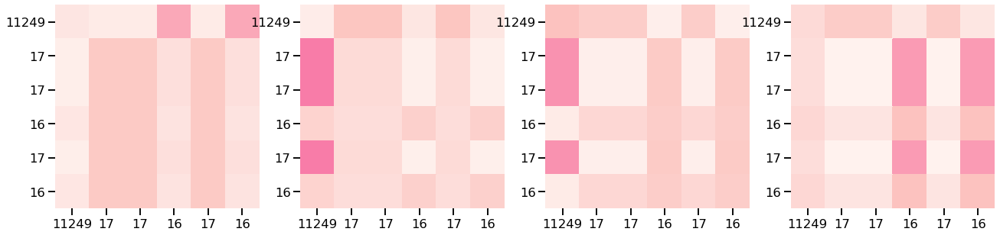

Encoder Layer 2


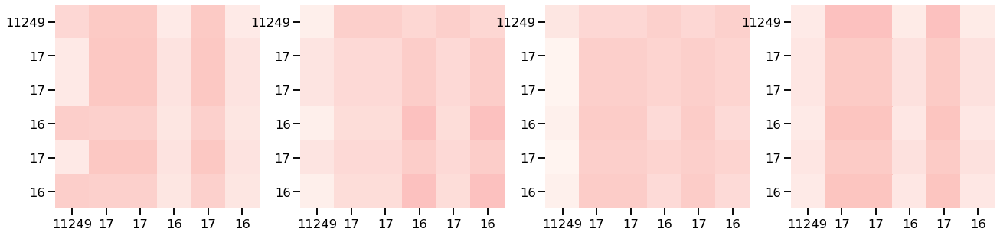



Ejemplo de tweet con label  denying  y Tw_id  758325596439076870
Encoder Layer 1


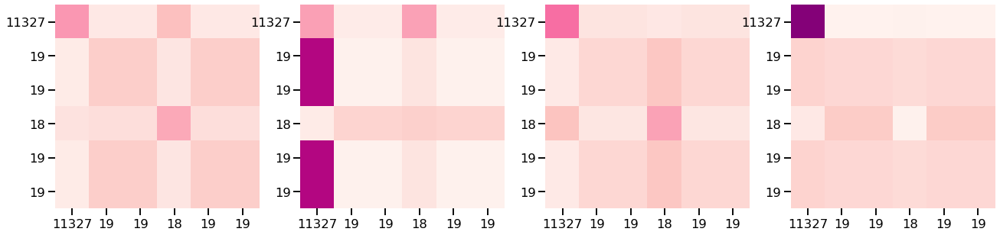

Encoder Layer 2


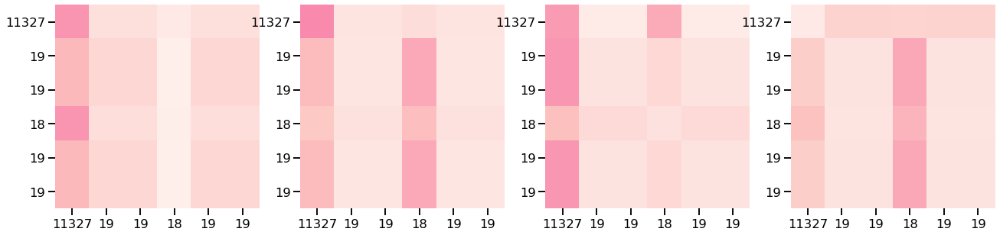



Ejemplo de tweet con label  questioning  y Tw_id  524926167569022977
Encoder Layer 1


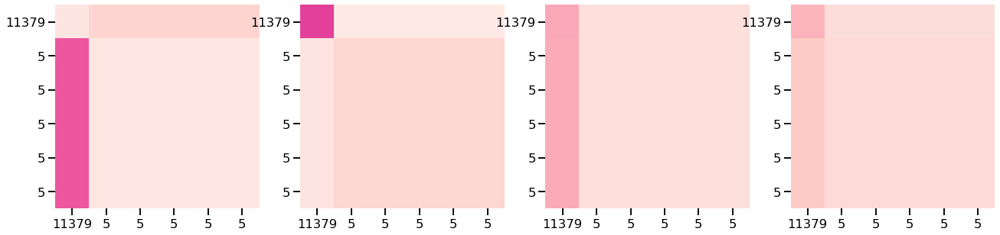

Encoder Layer 2


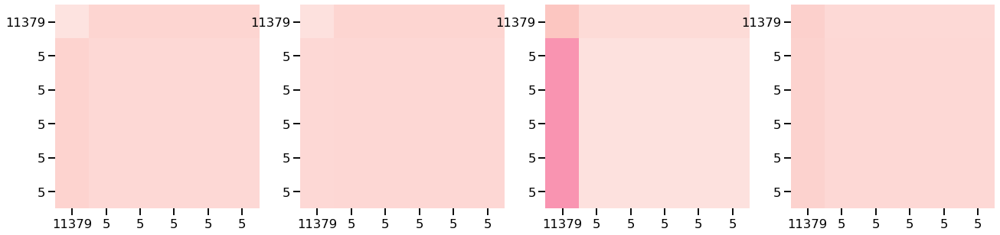

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.299 	F-macro_val: 0.225
Epoch 10 	acc_val: 0.618 	F-macro_val: 0.495
Epoch 20 	acc_val: 0.622 	F-macro_val: 0.496
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


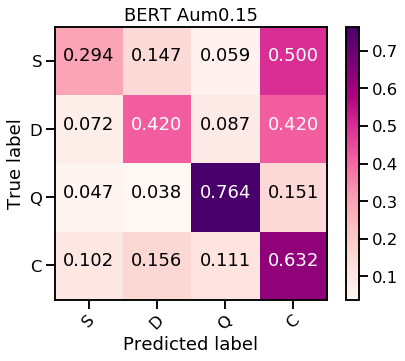

Test_ acc: 0.6092066601371204
Test_ f1 none: [0.2259887  0.24892704 0.57243816 0.72942921]
Test_ f1 macro: 0.44419577713890435
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.181 	F-macro_val: 0.174
Epoch 10 	acc_val: 0.677 	F-macro_val: 0.501
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.517
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


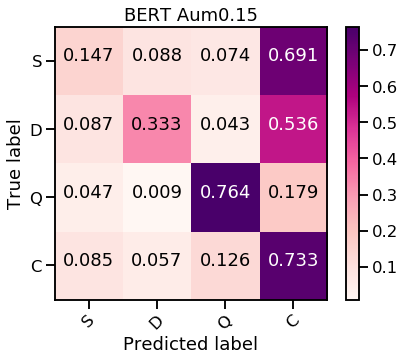

Test_ acc: 0.6699314397649363
Test_ f1 none: [0.12903226 0.32167832 0.55290102 0.78566506]
Test_ f1 macro: 0.44731916555347806
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.247 	F-macro_val: 0.172
Epoch 10 	acc_val: 0.653 	F-macro_val: 0.513
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.543
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


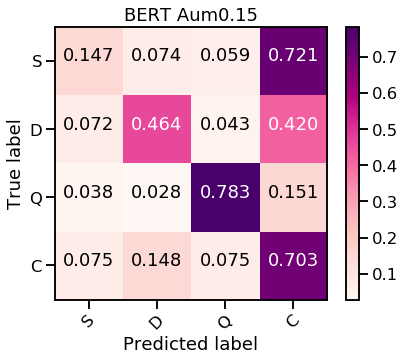

Test_ acc: 0.6581782566111655
Test_ f1 none: [0.13793103 0.28571429 0.65354331 0.77096547]
Test_ f1 macro: 0.46203852398088646


Ejemplo de tweet con label  commenting  y Tw_id  768860032536420352
Encoder Layer 1


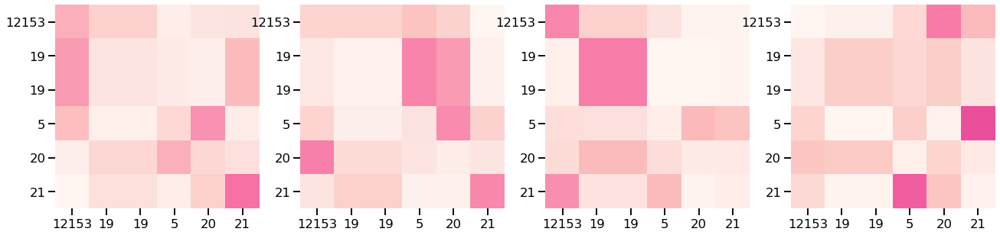

Encoder Layer 2


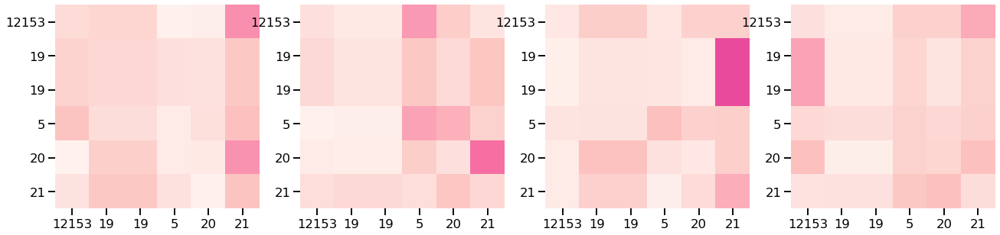



Ejemplo de tweet con label  support  y Tw_id  801684107616890880
Encoder Layer 1


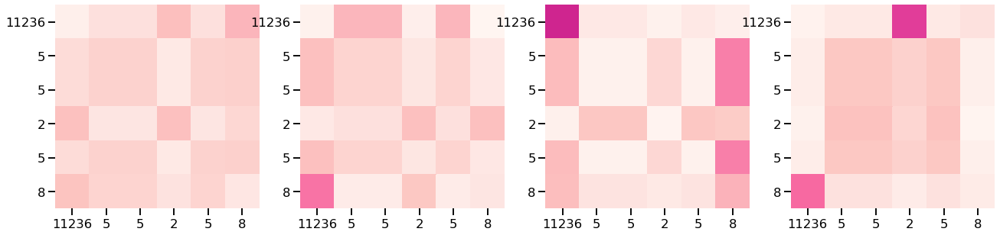

Encoder Layer 2


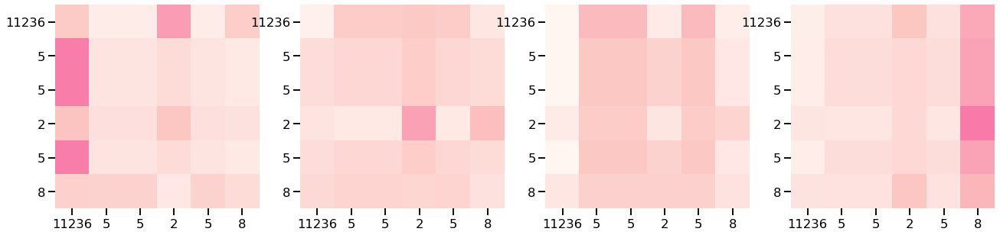



Ejemplo de tweet con label  denying  y Tw_id  765252851782254592
Encoder Layer 1


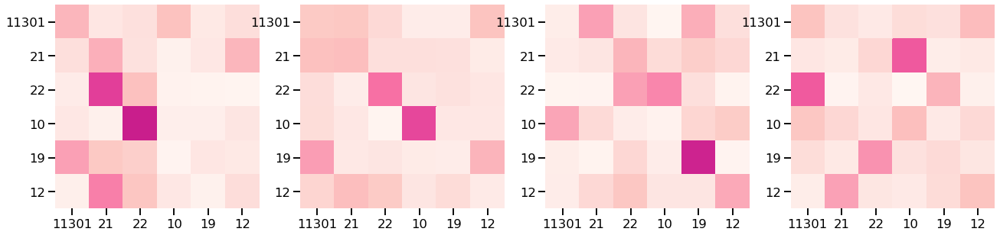

Encoder Layer 2


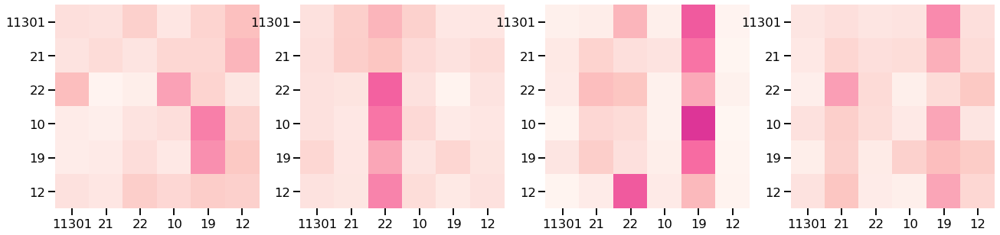



Ejemplo de tweet con label  questioning  y Tw_id  581154859715530752
Encoder Layer 1


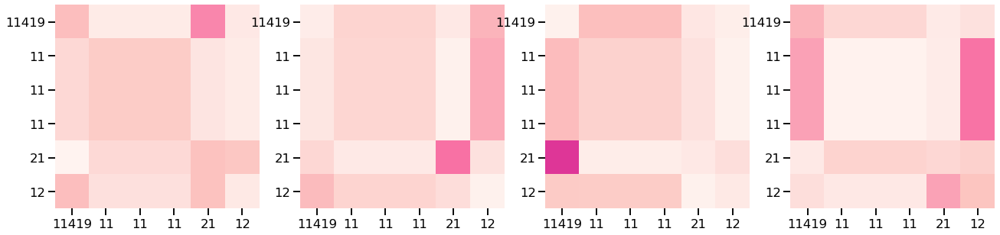

Encoder Layer 2


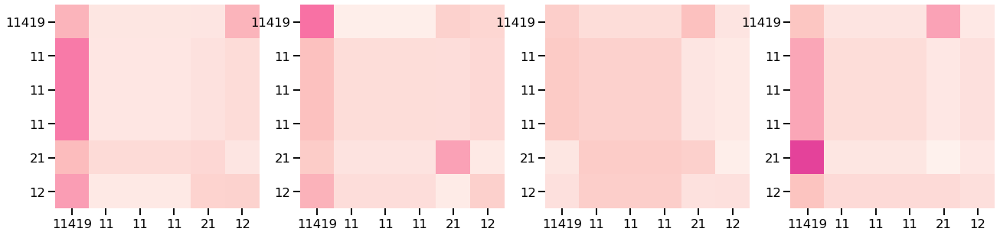

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.344 	F-macro_val: 0.278
Epoch 10 	acc_val: 0.674 	F-macro_val: 0.525
Epoch 20 	acc_val: 0.712 	F-macro_val: 0.546
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


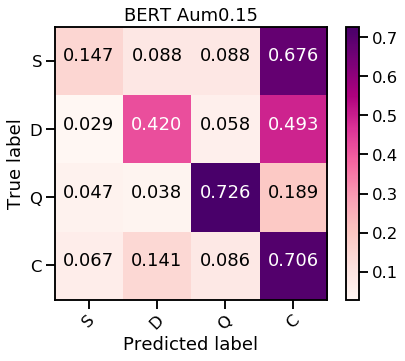

Test_ acc: 0.6513222331047992
Test_ f1 none: [0.1459854  0.26605505 0.59230769 0.76944639]
Test_ f1 macro: 0.4434486326673097
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.205 	F-macro_val: 0.180
Epoch 10 	acc_val: 0.667 	F-macro_val: 0.523
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.522
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


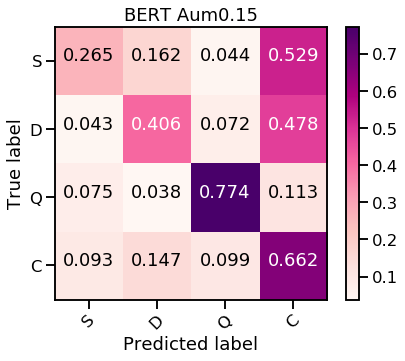

Test_ acc: 0.6297747306562194
Test_ f1 none: [0.21301775 0.24778761 0.6007326  0.7496361 ]
Test_ f1 macro: 0.4527935154531092
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.253 	F-macro_val: 0.216
Epoch 10 	acc_val: 0.688 	F-macro_val: 0.543
Epoch 20 	acc_val: 0.715 	F-macro_val: 0.584
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


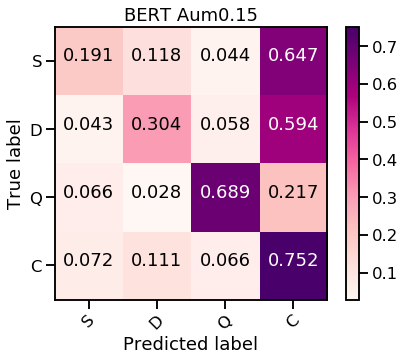

Test_ acc: 0.6777668952007836
Test_ f1 none: [0.17687075 0.22459893 0.61603376 0.79537729]
Test_ f1 macro: 0.4532201821031112
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.292 	F-macro_val: 0.236
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.510
Epoch 20 	acc_val: 0.674 	F-macro_val: 0.508
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


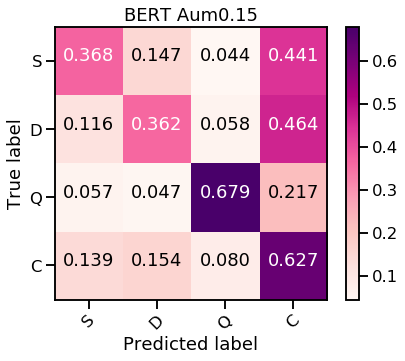

Test_ acc: 0.5974534769833496
Test_ f1 none: [0.23255814 0.21834061 0.58299595 0.72242783]
Test_ f1 macro: 0.43908063338543024
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.264 	F-macro_val: 0.213
Epoch 10 	acc_val: 0.639 	F-macro_val: 0.503
Epoch 20 	acc_val: 0.674 	F-macro_val: 0.521
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


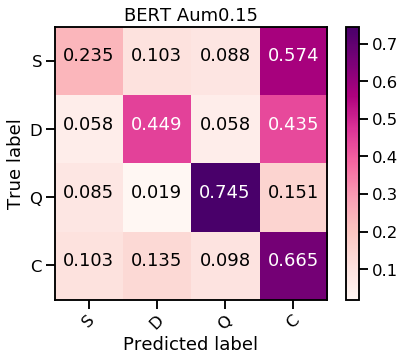

Test_ acc: 0.6297747306562194
Test_ f1 none: [0.18079096 0.28971963 0.58302583 0.74927536]
Test_ f1 macro: 0.45070294479933626
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 11
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.396 	F-macro_val: 0.267
Epoch 10 	acc_val: 0.622 	F-macro_val: 0.478
Epoch 20 	acc_val: 0.663 	F-macro_val: 0.493
Testing run # 11
SE TUVIERON QUE REPETIR 3 EJEMPLOS


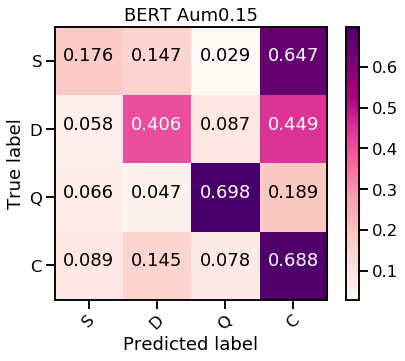

Test_ acc: 0.6356513222331048
Test_ f1 none: [0.15       0.24888889 0.59437751 0.75994318]
Test_ f1 macro: 0.4383023951868078
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 12
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.267 	F-macro_val: 0.177
Epoch 10 	acc_val: 0.681 	F-macro_val: 0.536
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.559
Testing run # 12
SE TUVIERON QUE REPETIR 3 EJEMPLOS


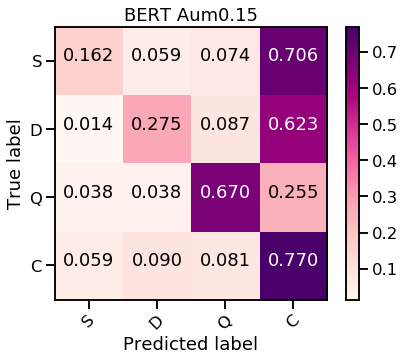

Test_ acc: 0.6856023506366308
Test_ f1 none: [0.16923077 0.22891566 0.56573705 0.80133779]
Test_ f1 macro: 0.4413053190790852
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 13
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.198 	F-macro_val: 0.179
Epoch 10 	acc_val: 0.587 	F-macro_val: 0.461
Epoch 20 	acc_val: 0.604 	F-macro_val: 0.467
Testing run # 13
SE TUVIERON QUE REPETIR 3 EJEMPLOS


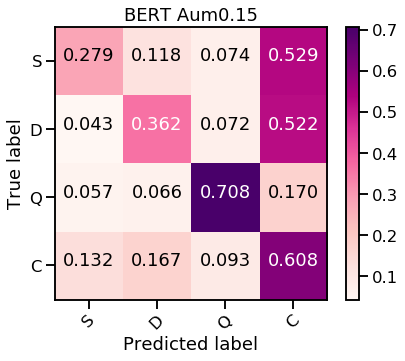

Test_ acc: 0.5798237022526934
Test_ f1 none: [0.19095477 0.20920502 0.57034221 0.7054437 ]
Test_ f1 macro: 0.41898642471133296
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 14
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.312 	F-macro_val: 0.177
Epoch 10 	acc_val: 0.608 	F-macro_val: 0.474
Epoch 20 	acc_val: 0.642 	F-macro_val: 0.497
Testing run # 14
SE TUVIERON QUE REPETIR 3 EJEMPLOS


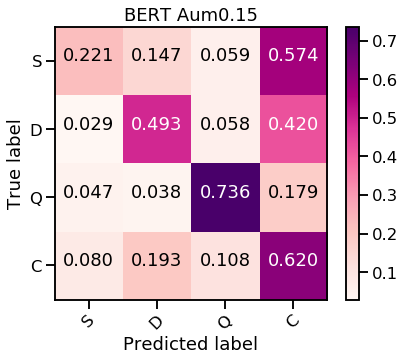

Test_ acc: 0.5964740450538688
Test_ f1 none: [0.19736842 0.25468165 0.56521739 0.71566444]
Test_ f1 macro: 0.4332329749480571
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 15
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.319 	F-macro_val: 0.228
Epoch 10 	acc_val: 0.688 	F-macro_val: 0.528
Epoch 20 	acc_val: 0.691 	F-macro_val: 0.532
Testing run # 15
SE TUVIERON QUE REPETIR 3 EJEMPLOS


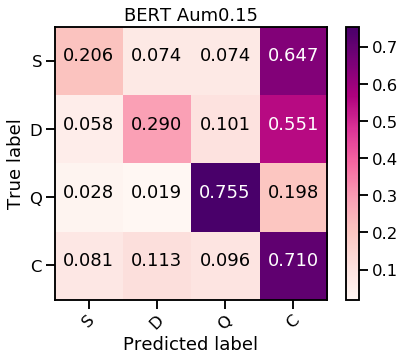

Test_ acc: 0.6523016650342801
Test_ f1 none: [0.18421053 0.2173913  0.58608059 0.77041172]
Test_ f1 macro: 0.4395235351002165
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 16
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.312 	F-macro_val: 0.199
Epoch 10 	acc_val: 0.628 	F-macro_val: 0.496
Epoch 20 	acc_val: 0.656 	F-macro_val: 0.521
Testing run # 16
SE TUVIERON QUE REPETIR 3 EJEMPLOS


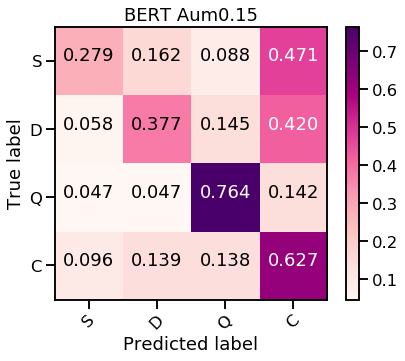

Test_ acc: 0.6013712047012733
Test_ f1 none: [0.22222222 0.23744292 0.52258065 0.72727273]
Test_ f1 macro: 0.42737962925766726
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 17
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.198 	F-macro_val: 0.179
Epoch 10 	acc_val: 0.628 	F-macro_val: 0.502
Epoch 20 	acc_val: 0.684 	F-macro_val: 0.558
Testing run # 17
SE TUVIERON QUE REPETIR 3 EJEMPLOS


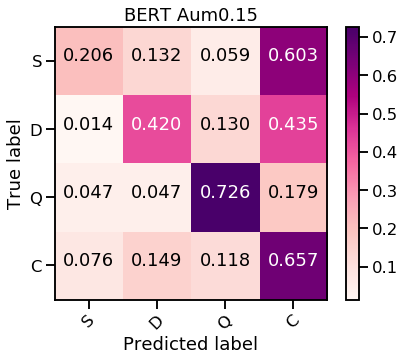

Test_ acc: 0.6180215475024485
Test_ f1 none: [0.19047619 0.25438596 0.53472222 0.74111675]
Test_ f1 macro: 0.43017528221993223
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 18
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.184 	F-macro_val: 0.155
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.533
Epoch 20 	acc_val: 0.688 	F-macro_val: 0.560
Testing run # 18
SE TUVIERON QUE REPETIR 3 EJEMPLOS


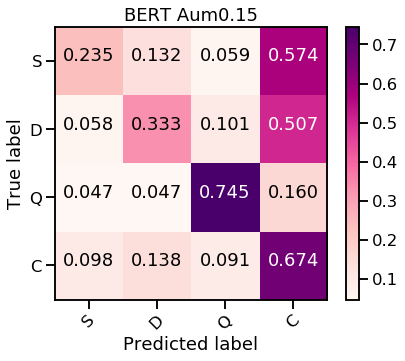

Test_ acc: 0.6287952987267384
Test_ f1 none: [0.18934911 0.21596244 0.5917603  0.75233309]
Test_ f1 macro: 0.43735123685192356
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 19
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.309 	F-macro_val: 0.211
Epoch 10 	acc_val: 0.625 	F-macro_val: 0.490
Epoch 20 	acc_val: 0.642 	F-macro_val: 0.502
Testing run # 19
SE TUVIERON QUE REPETIR 3 EJEMPLOS


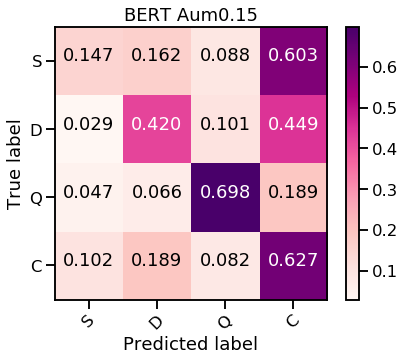

Test_ acc: 0.5886385896180215
Test_ f1 none: [0.12195122 0.22053232 0.57587549 0.71870398]
Test_ f1 macro: 0.4092657504302721
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 20
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Index embeddings con preds 25 . Ult elemento: 24
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.212 	F-macro_val: 0.158
Epoch 10 	acc_val: 0.677 	F-macro_val: 0.514
Epoch 20 	acc_val: 0.674 	F-macro_val: 0.506
Testing run # 20
SE TUVIERON QUE REPETIR 3 EJEMPLOS


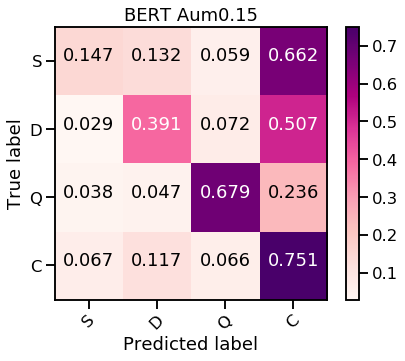

Test_ acc: 0.6787463271302644
Test_ f1 none: [0.14705882 0.26865672 0.60504202 0.79618269]
Test_ f1 macro: 0.45423506062682073


In [13]:
best_15, all_accs, all_fno, all_ma, all_cm =train_transformer(0.15, 30, path_a, path_m, "RdPu")

In [14]:
best_15 

{'F_ma': 0.46203852398088646, 'Run': 5}

Acc: 0.633 -- deviation: 0.031
F-score: 0.440 -- deviation: 0.013
(0.15) SDQC: 0.17932436185803743 0.24690217894736052 0.5809896930504739 0.7538450710052086


Confusion counts
[[  293.   170.    87.   810.]
 [   69.   527.   107.   677.]
 [  108.    85.  1545.   382.]
 [ 1397.  2127.  1472. 10564.]]


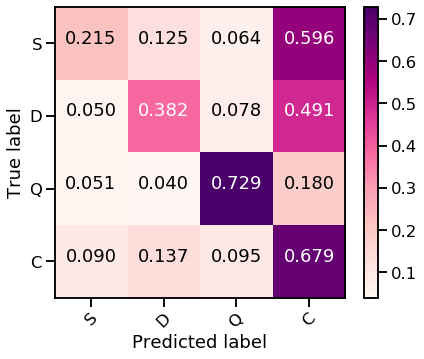

In [15]:
#best_15, all_accs, all_fno, all_ma, all_cm
print ("Acc: %.3f" % np.mean(np.asarray(all_accs)), "-- deviation: %.3f" % np.std(np.asarray(all_accs)))
print ("F-score: %.3f" % np.mean(np.asarray(all_ma)), "-- deviation: %.3f" % np.std(np.asarray(all_ma)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(all_fno)[:,0])
den=np.mean(np.asarray(all_fno)[:,1])
que=np.mean(np.asarray(all_fno)[:,2])
com=np.mean(np.asarray(all_fno)[:,3])

print ("(0.15) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in all_cm:
    m_temp+=np.asarray(m)
    
print (m_temp)

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='RdPu')

In [ ]:
### VIEJO

Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.052 	F-macro_val: 0.051
Epoch 10 	acc_val: 0.660 	F-macro_val: 0.307
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.364
Epoch 30 	acc_val: 0.726 	F-macro_val: 0.429
Epoch 40 	acc_val: 0.722 	F-macro_val: 0.432
Epoch 50 	acc_val: 0.715 	F-macro_val: 0.426
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


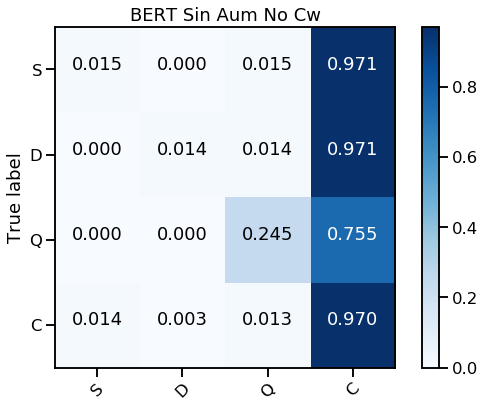

Test_ acc: 0.7668952007835456
Test_ f1 none: [0.025      0.02777778 0.36111111 0.86483391]
Test_ f1 macro: 0.31968069873997706


Ejemplo de tweet con label  commenting
Encoder Layer 1


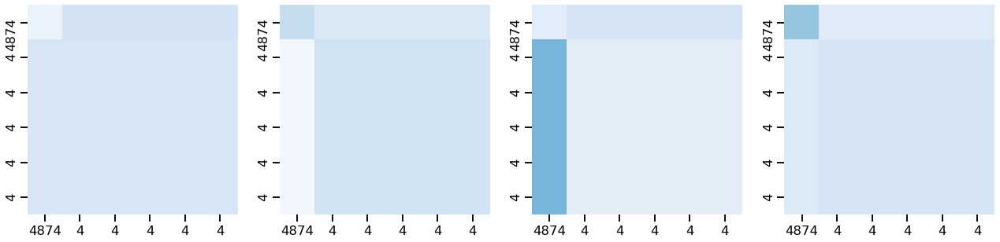

Encoder Layer 2


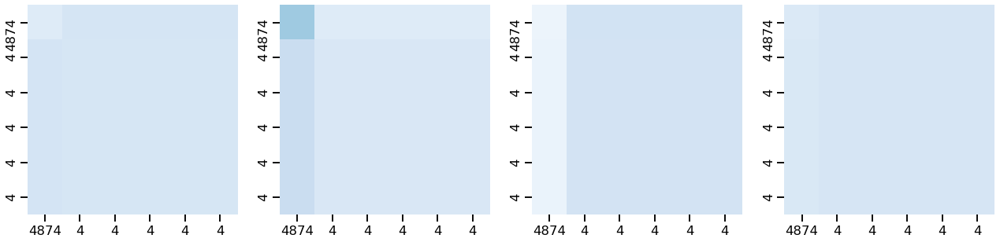



Ejemplo de tweet con label  support
Encoder Layer 1


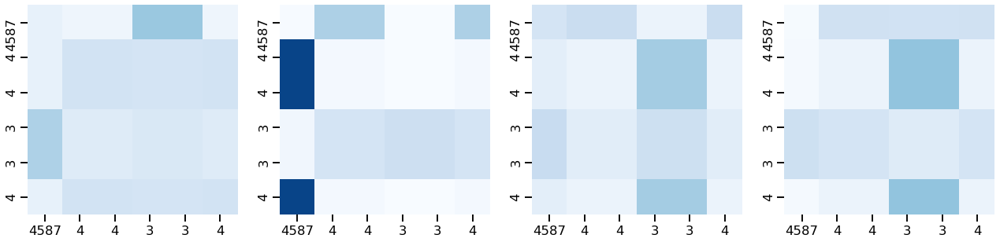

Encoder Layer 2


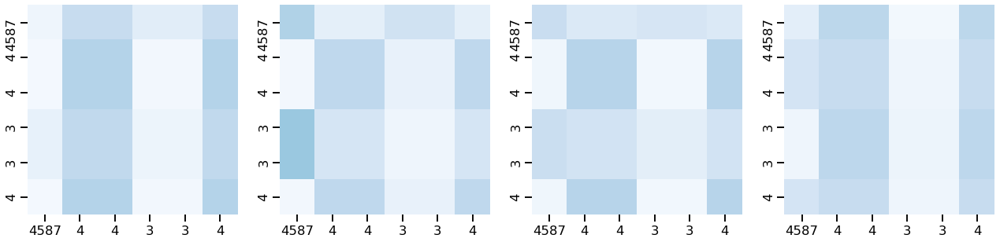



Ejemplo de tweet con label  denying
Encoder Layer 1


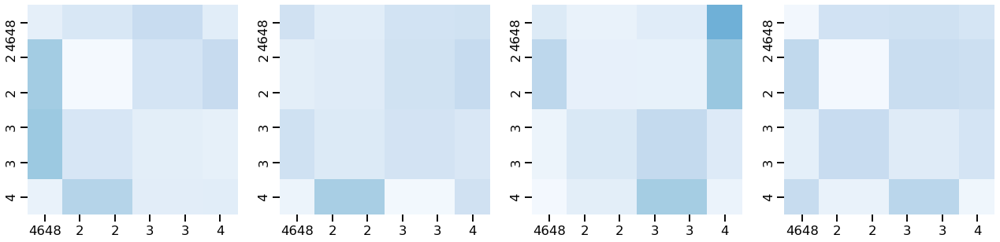

Encoder Layer 2


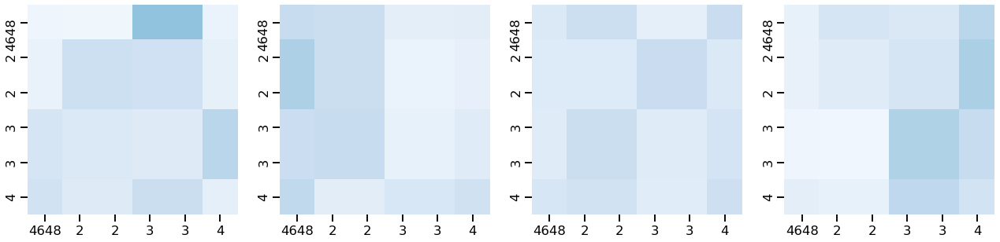



Ejemplo de tweet con label  questioning
Encoder Layer 1


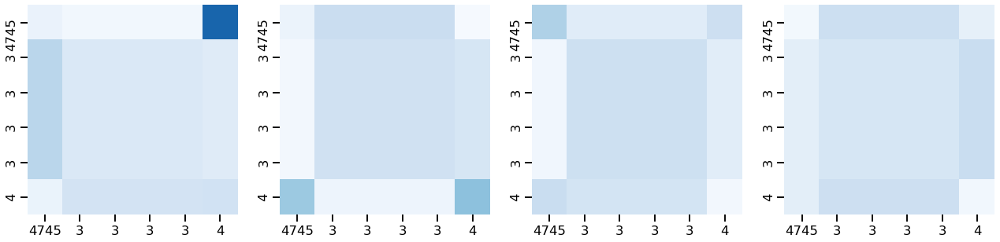

Encoder Layer 2


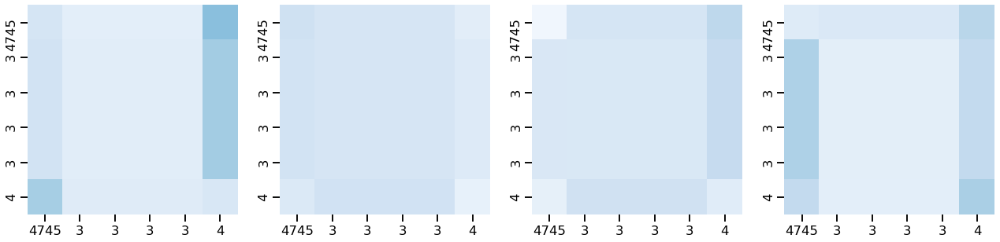

Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.323 	F-macro_val: 0.185
Epoch 10 	acc_val: 0.608 	F-macro_val: 0.204
Epoch 20 	acc_val: 0.653 	F-macro_val: 0.294
Epoch 30 	acc_val: 0.740 	F-macro_val: 0.513
Epoch 40 	acc_val: 0.722 	F-macro_val: 0.501
Epoch 50 	acc_val: 0.733 	F-macro_val: 0.519
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


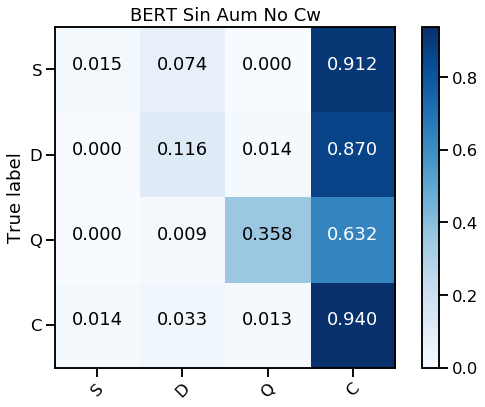

Test_ acc: 0.761998041136141
Test_ f1 none: [0.025      0.14678899 0.49032258 0.86101296]
Test_ f1 macro: 0.38078113197254154


Ejemplo de tweet con label  commenting
Encoder Layer 1


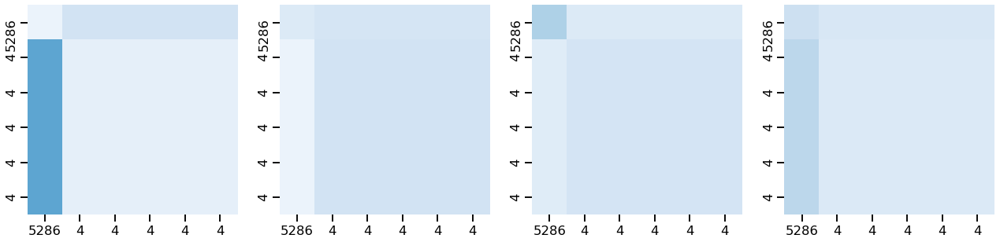

Encoder Layer 2


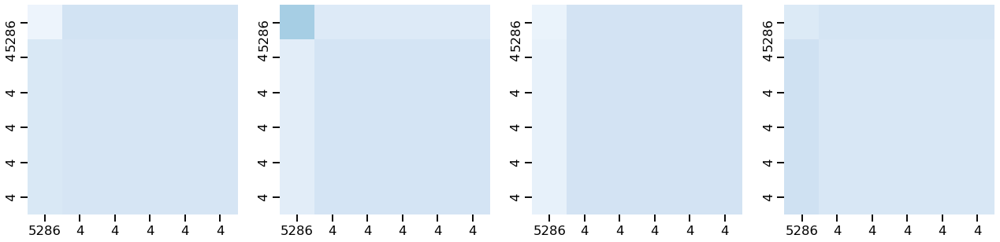



Ejemplo de tweet con label  support
Encoder Layer 1


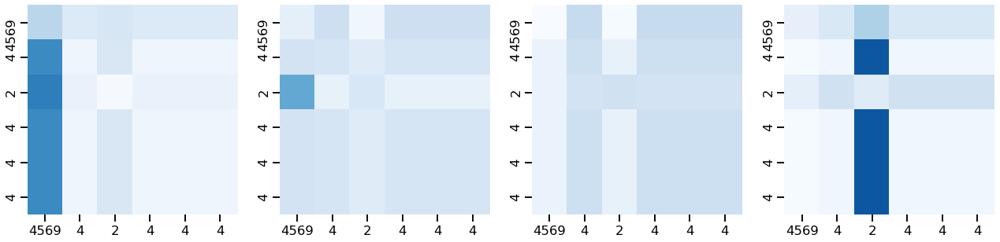

Encoder Layer 2


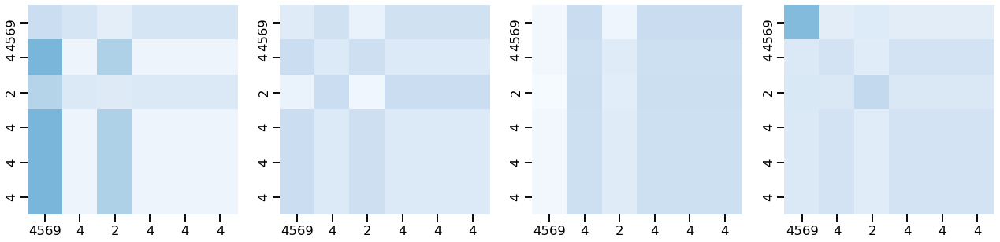



Ejemplo de tweet con label  denying
Encoder Layer 1


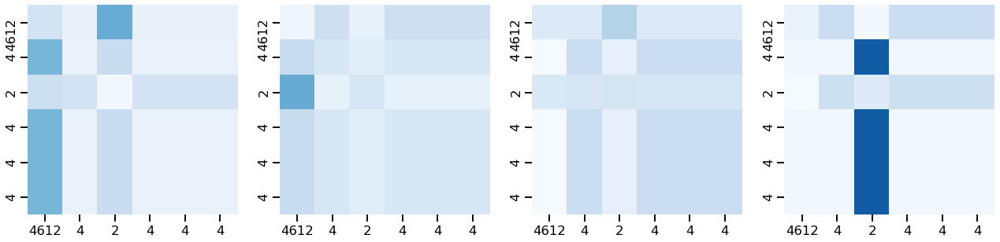

Encoder Layer 2


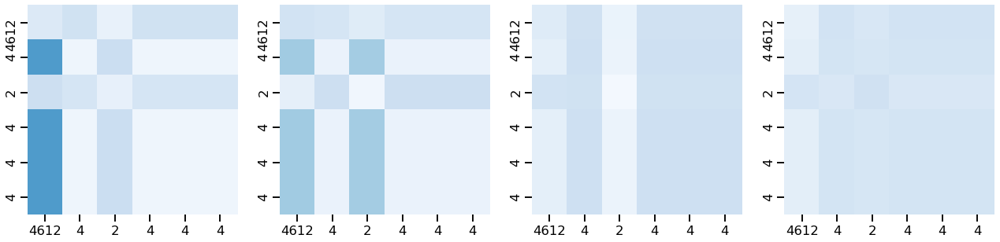



Ejemplo de tweet con label  questioning
Encoder Layer 1


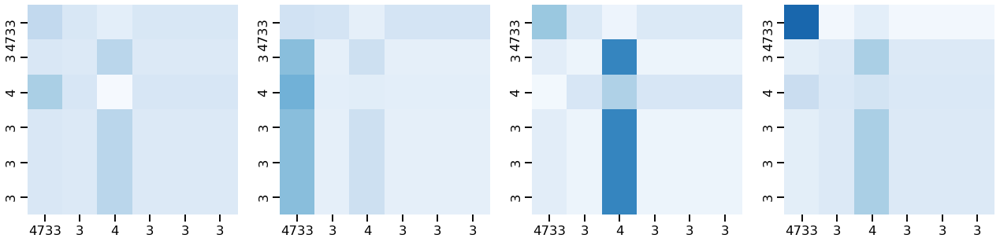

Encoder Layer 2


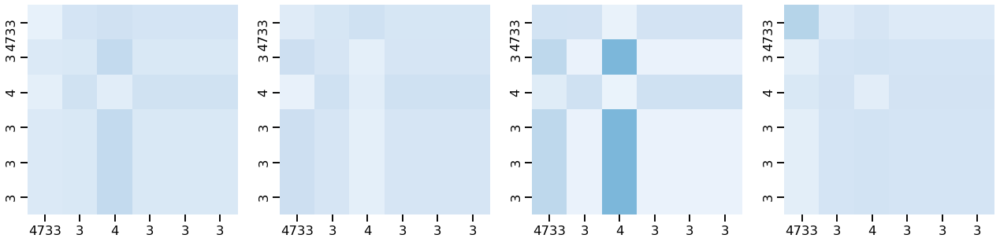

Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.396 	F-macro_val: 0.207
Epoch 10 	acc_val: 0.632 	F-macro_val: 0.269
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.423
Epoch 30 	acc_val: 0.705 	F-macro_val: 0.453
Epoch 40 	acc_val: 0.712 	F-macro_val: 0.467
Epoch 50 	acc_val: 0.712 	F-macro_val: 0.495
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


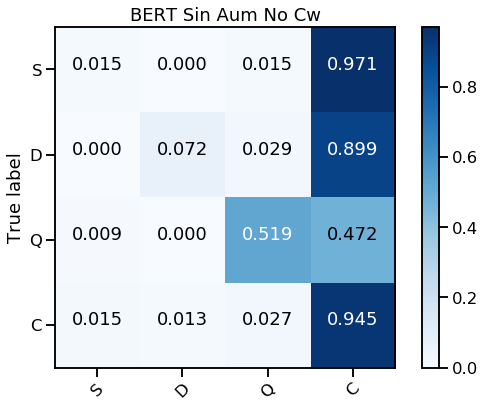

Test_ acc: 0.7796278158667973
Test_ f1 none: [0.02439024 0.11904762 0.59459459 0.8693081 ]
Test_ f1 macro: 0.4018351398149036


Ejemplo de tweet con label  commenting
Encoder Layer 1


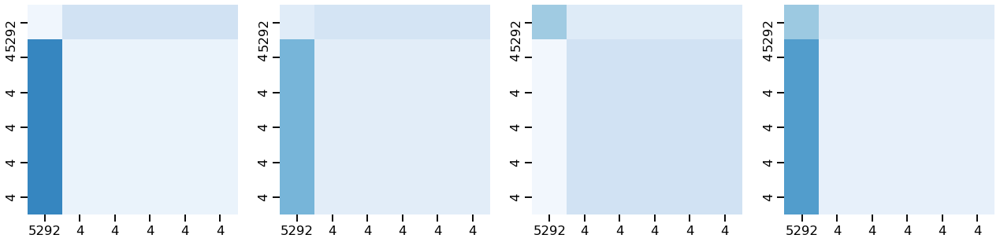

Encoder Layer 2


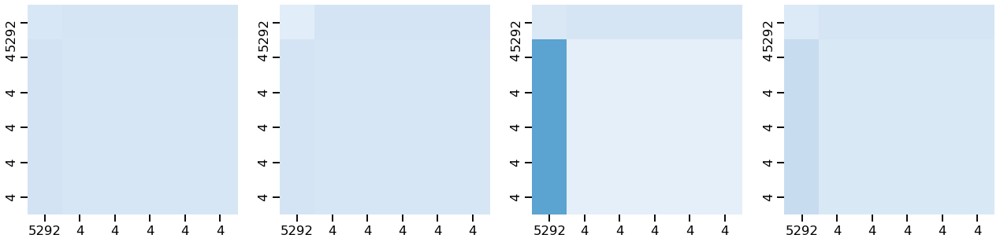



Ejemplo de tweet con label  support
Encoder Layer 1


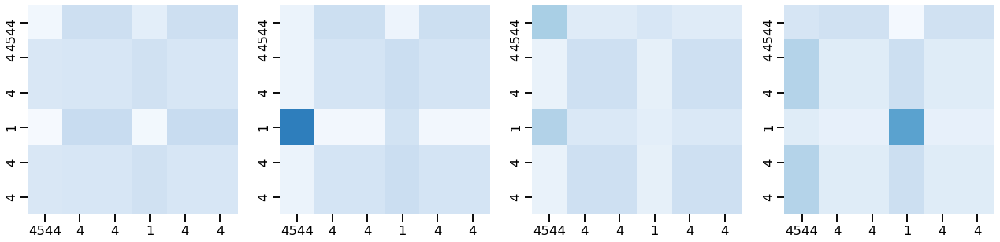

Encoder Layer 2


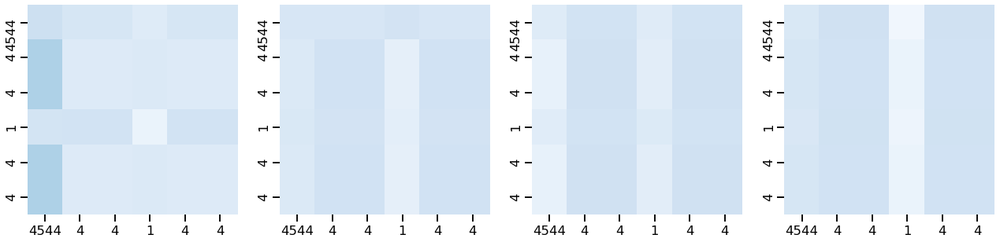



Ejemplo de tweet con label  denying
Encoder Layer 1


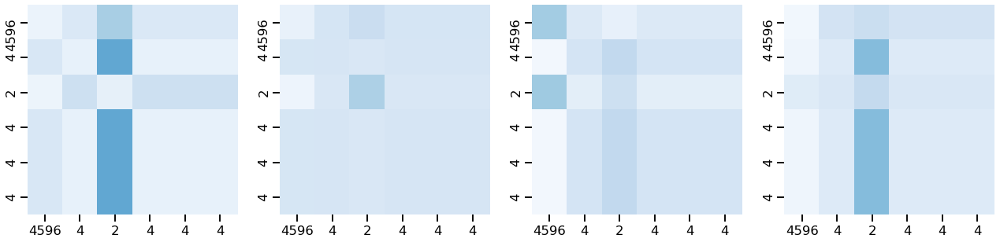

Encoder Layer 2


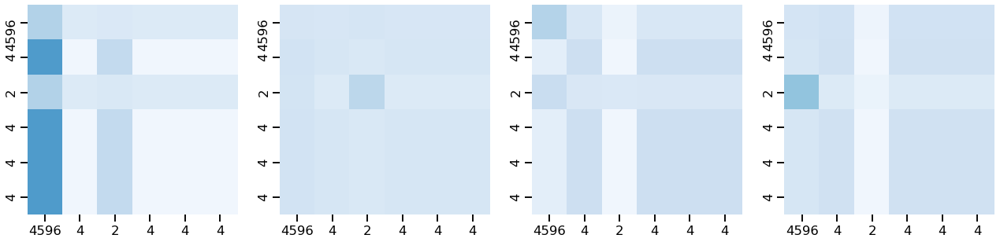



Ejemplo de tweet con label  questioning
Encoder Layer 1


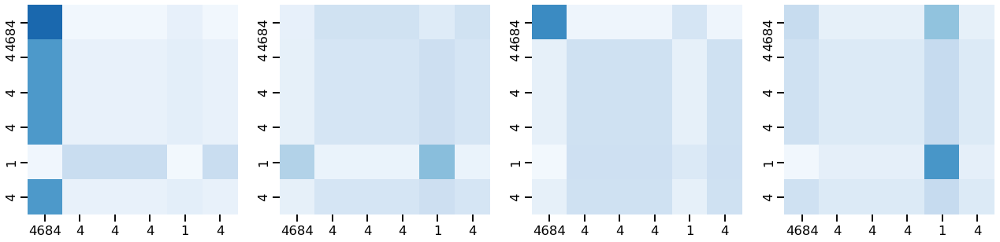

Encoder Layer 2


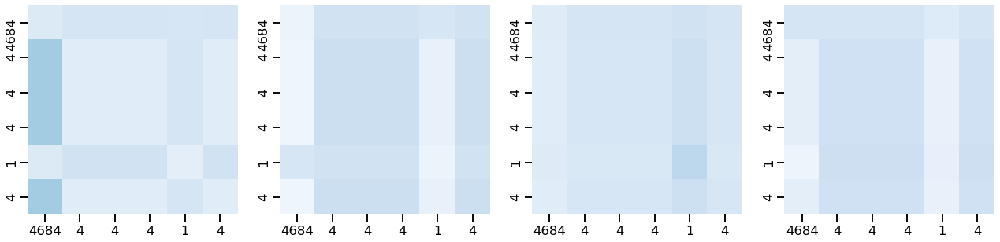

Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.215 	F-macro_val: 0.140
Epoch 10 	acc_val: 0.681 	F-macro_val: 0.388
Epoch 20 	acc_val: 0.712 	F-macro_val: 0.447
Epoch 30 	acc_val: 0.733 	F-macro_val: 0.468
Epoch 40 	acc_val: 0.726 	F-macro_val: 0.461
Epoch 50 	acc_val: 0.736 	F-macro_val: 0.480
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


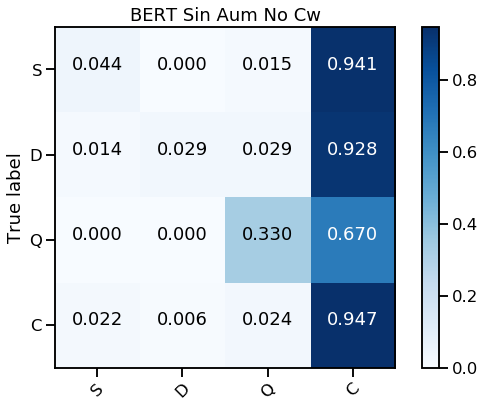

Test_ acc: 0.7610186092066601
Test_ f1 none: [0.06741573 0.05263158 0.42944785 0.85997666]
Test_ f1 macro: 0.3523679562055782
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.149 	F-macro_val: 0.151
Epoch 10 	acc_val: 0.684 	F-macro_val: 0.391
Epoch 20 	acc_val: 0.726 	F-macro_val: 0.458
Epoch 30 	acc_val: 0.747 	F-macro_val: 0.502
Epoch 40 	acc_val: 0.750 	F-macro_val: 0.532
Epoch 50 	acc_val: 0.747 	F-macro_val: 0.535
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


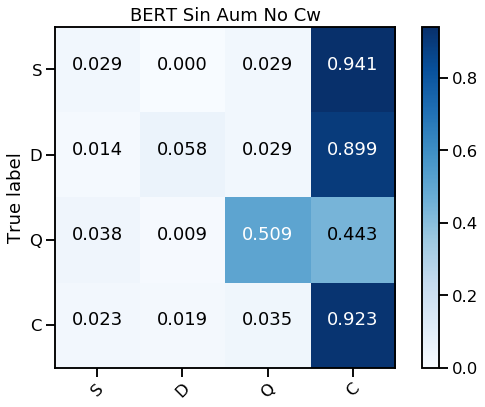

Test_ acc: 0.761998041136141
Test_ f1 none: [0.04301075 0.08988764 0.56544503 0.86039545]
Test_ f1 macro: 0.3896847164226739
Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.174 	F-macro_val: 0.151
Epoch 10 	acc_val: 0.670 	F-macro_val: 0.325
Epoch 20 	acc_val: 0.722 	F-macro_val: 0.456
Epoch 30 	acc_val: 0.740 	F-macro_val: 0.476
Epoch 40 	acc_val: 0.743 	F-macro_val: 0.482
Epoch 50 	acc_val: 0.747 	F-macro_val: 0.497
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


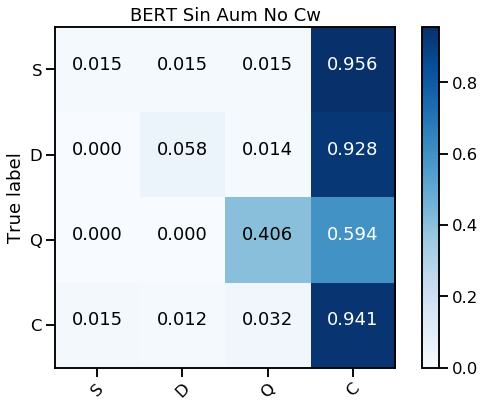

Test_ acc: 0.7639569049951028
Test_ f1 none: [0.02469136 0.09638554 0.48863636 0.86016451]
Test_ f1 macro: 0.3674694440420388
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.139 	F-macro_val: 0.123
Epoch 10 	acc_val: 0.635 	F-macro_val: 0.287
Epoch 20 	acc_val: 0.740 	F-macro_val: 0.480
Epoch 30 	acc_val: 0.740 	F-macro_val: 0.475
Epoch 40 	acc_val: 0.750 	F-macro_val: 0.492
Epoch 50 	acc_val: 0.757 	F-macro_val: 0.497
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


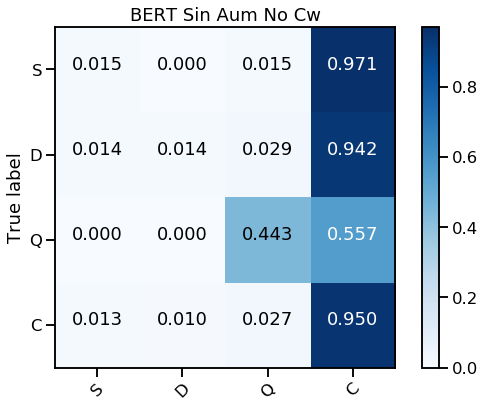

Test_ acc: 0.77179236043095
Test_ f1 none: [0.025      0.02564103 0.53107345 0.86584651]
Test_ f1 macro: 0.36189024658034374
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.344 	F-macro_val: 0.231
Epoch 10 	acc_val: 0.628 	F-macro_val: 0.364
Epoch 20 	acc_val: 0.688 	F-macro_val: 0.445
Epoch 30 	acc_val: 0.694 	F-macro_val: 0.450
Epoch 40 	acc_val: 0.691 	F-macro_val: 0.452
Epoch 50 	acc_val: 0.708 	F-macro_val: 0.461
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


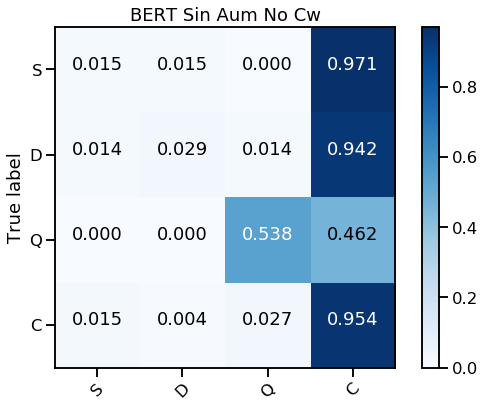

Test_ acc: 0.7855044074436827
Test_ f1 none: [0.02439024 0.05333333 0.61621622 0.87294118]
Test_ f1 macro: 0.3917202424806442
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.552 	F-macro_val: 0.276
Epoch 10 	acc_val: 0.684 	F-macro_val: 0.390
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.427
Epoch 30 	acc_val: 0.694 	F-macro_val: 0.434
Epoch 40 	acc_val: 0.691 	F-macro_val: 0.463
Epoch 50 	acc_val: 0.705 	F-macro_val: 0.481
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


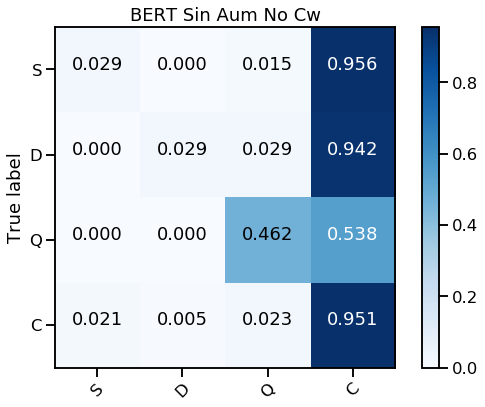

Test_ acc: 0.7766895200783546
Test_ f1 none: [0.04651163 0.05333333 0.55681818 0.86803519]
Test_ f1 macro: 0.3811745834185819
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.174 	F-macro_val: 0.168
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.305
Epoch 20 	acc_val: 0.694 	F-macro_val: 0.398
Epoch 30 	acc_val: 0.712 	F-macro_val: 0.436
Epoch 40 	acc_val: 0.715 	F-macro_val: 0.455
Epoch 50 	acc_val: 0.722 	F-macro_val: 0.473
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


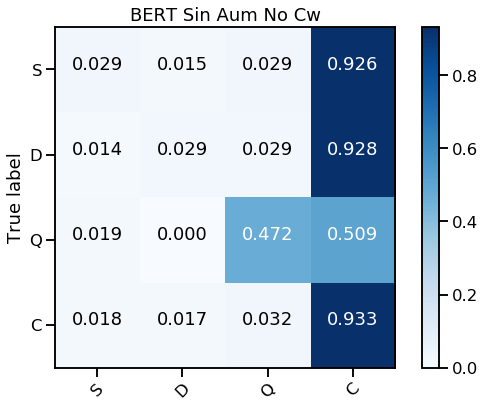

Test_ acc: 0.7639569049951028
Test_ f1 none: [0.04597701 0.04705882 0.54054054 0.86172107]
Test_ f1 macro: 0.3738243609533659
Entrenando Run # 11
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.382 	F-macro_val: 0.332
Epoch 10 	acc_val: 0.712 	F-macro_val: 0.457
Epoch 20 	acc_val: 0.736 	F-macro_val: 0.501
Epoch 30 	acc_val: 0.740 	F-macro_val: 0.511
Epoch 40 	acc_val: 0.747 	F-macro_val: 0.581
Epoch 50 	acc_val: 0.733 	F-macro_val: 0.575
Testing run # 11
SE TUVIERON QUE REPETIR 3 EJEMPLOS


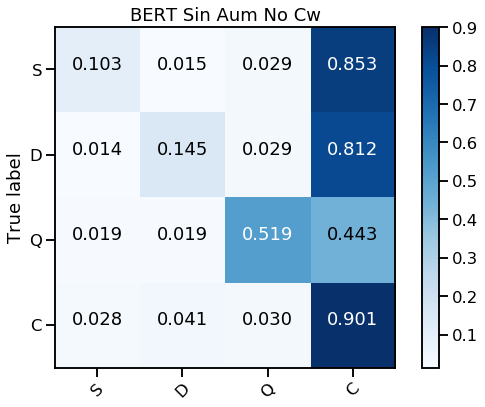

Test_ acc: 0.7571008814887366
Test_ f1 none: [0.14       0.1754386  0.58510638 0.85487805]
Test_ f1 macro: 0.4388557570626098


Ejemplo de tweet con label  commenting
Encoder Layer 1


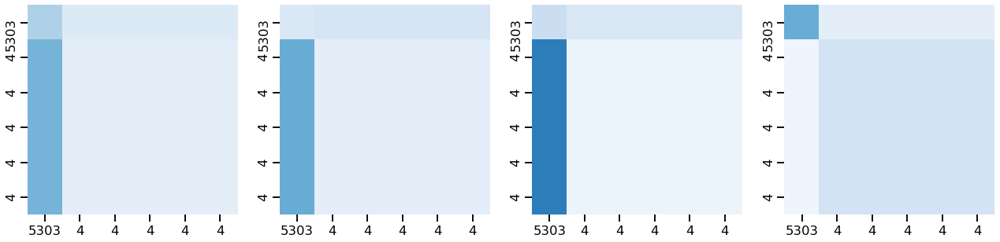

Encoder Layer 2


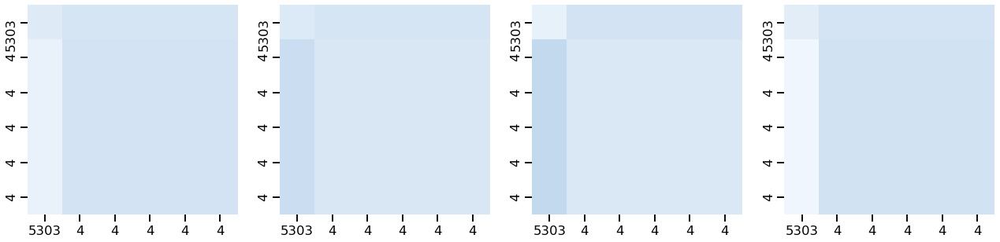



Ejemplo de tweet con label  support
Encoder Layer 1


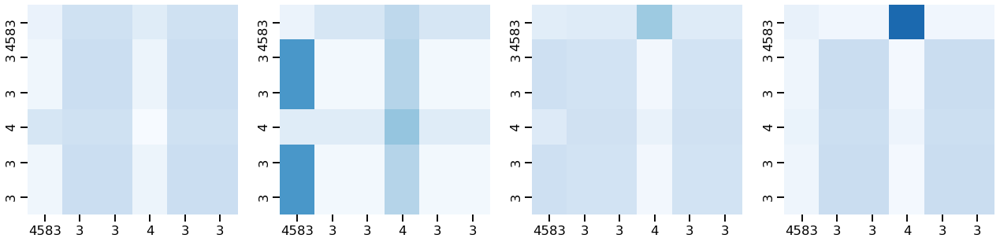

Encoder Layer 2


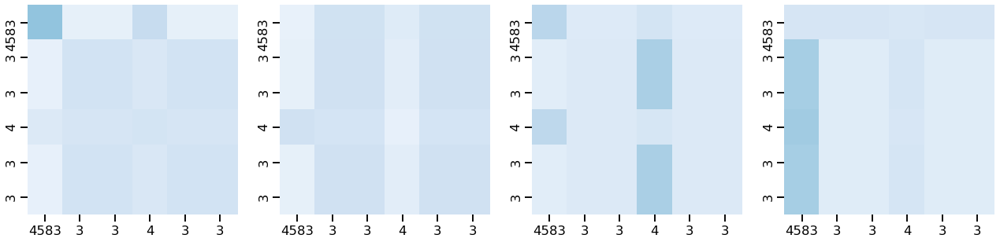



Ejemplo de tweet con label  denying
Encoder Layer 1


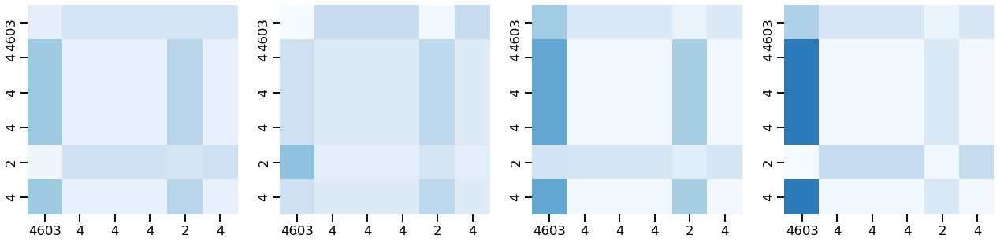

Encoder Layer 2


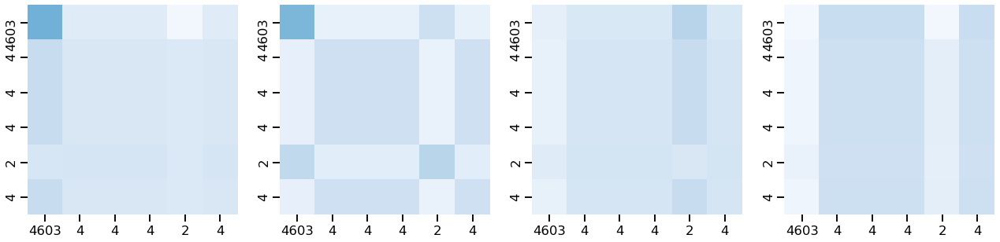



Ejemplo de tweet con label  questioning
Encoder Layer 1


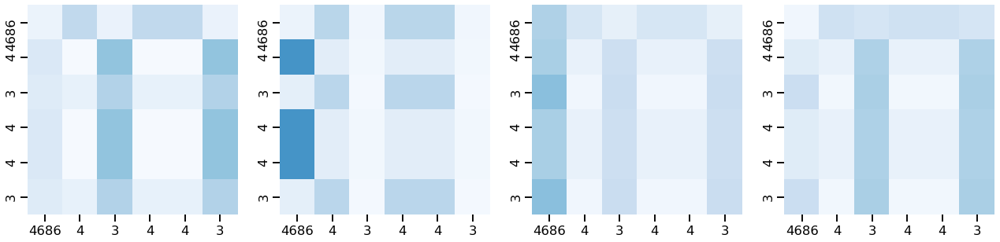

Encoder Layer 2


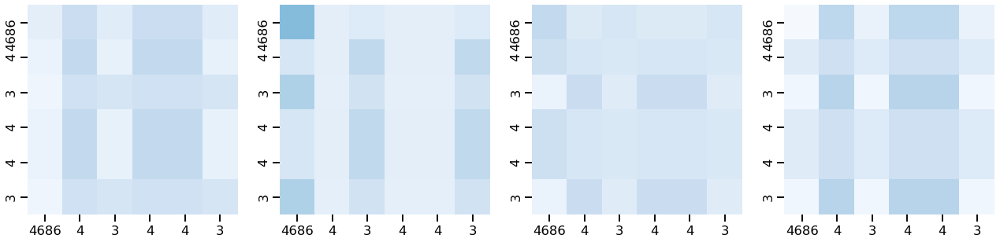

Entrenando Run # 12
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.274 	F-macro_val: 0.226
Epoch 10 	acc_val: 0.674 	F-macro_val: 0.420
Epoch 20 	acc_val: 0.719 	F-macro_val: 0.482
Epoch 30 	acc_val: 0.712 	F-macro_val: 0.481
Epoch 40 	acc_val: 0.712 	F-macro_val: 0.507
Epoch 50 	acc_val: 0.708 	F-macro_val: 0.494
Testing run # 12
SE TUVIERON QUE REPETIR 3 EJEMPLOS


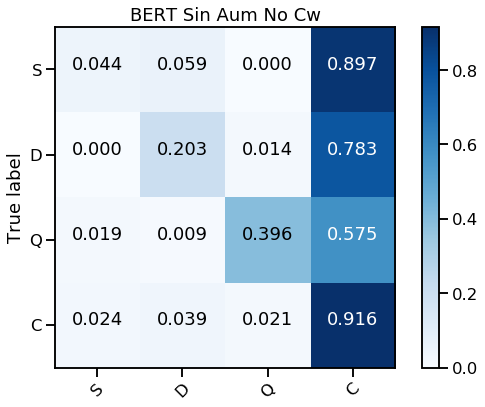

Test_ acc: 0.7561214495592556
Test_ f1 none: [0.06521739 0.23728814 0.50909091 0.85542891]
Test_ f1 macro: 0.41675633755140845
Entrenando Run # 13
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.260 	F-macro_val: 0.171
Epoch 10 	acc_val: 0.611 	F-macro_val: 0.205
Epoch 20 	acc_val: 0.677 	F-macro_val: 0.356
Epoch 30 	acc_val: 0.747 	F-macro_val: 0.492
Epoch 40 	acc_val: 0.743 	F-macro_val: 0.488
Epoch 50 	acc_val: 0.747 	F-macro_val: 0.489
Testing run # 13
SE TUVIERON QUE REPETIR 3 EJEMPLOS


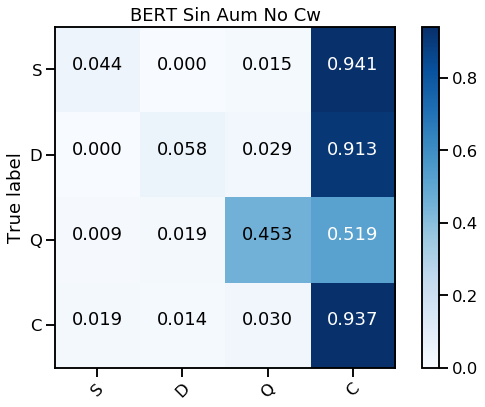

Test_ acc: 0.7678746327130265
Test_ f1 none: [0.06896552 0.09302326 0.53333333 0.86323268]
Test_ f1 macro: 0.3896386971122643
Entrenando Run # 14
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.101 	F-macro_val: 0.081
Epoch 10 	acc_val: 0.649 	F-macro_val: 0.294
Epoch 20 	acc_val: 0.684 	F-macro_val: 0.388
Epoch 30 	acc_val: 0.729 	F-macro_val: 0.460
Epoch 40 	acc_val: 0.726 	F-macro_val: 0.465
Epoch 50 	acc_val: 0.719 	F-macro_val: 0.460
Testing run # 14
SE TUVIERON QUE REPETIR 3 EJEMPLOS


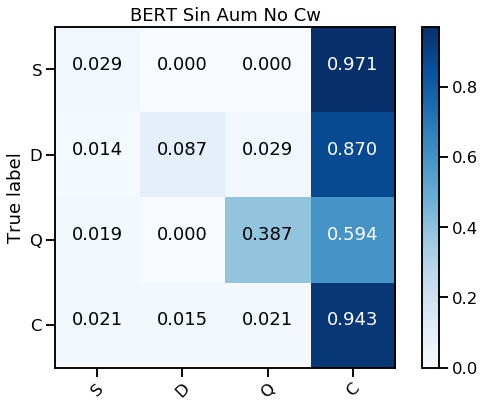

Test_ acc: 0.7668952007835456
Test_ f1 none: [0.04494382 0.13793103 0.4969697  0.86302175]
Test_ f1 macro: 0.3857165758969539
Entrenando Run # 15
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.267 	F-macro_val: 0.177
Epoch 10 	acc_val: 0.615 	F-macro_val: 0.288
Epoch 20 	acc_val: 0.677 	F-macro_val: 0.430
Epoch 30 	acc_val: 0.691 	F-macro_val: 0.481
Epoch 40 	acc_val: 0.715 	F-macro_val: 0.525
Epoch 50 	acc_val: 0.705 	F-macro_val: 0.522
Testing run # 15
SE TUVIERON QUE REPETIR 3 EJEMPLOS


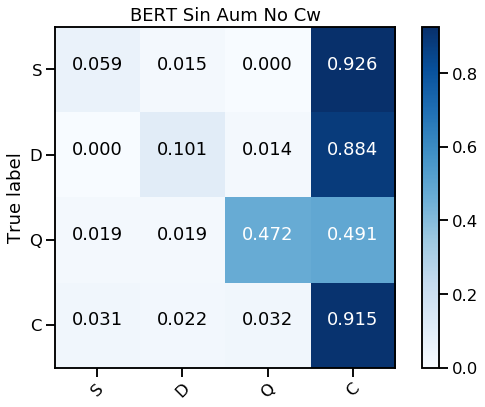

Test_ acc: 0.7571008814887366
Test_ f1 none: [0.08163265 0.14583333 0.54945055 0.8547419 ]
Test_ f1 macro: 0.4079146081509527
Entrenando Run # 16
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.122 	F-macro_val: 0.102
Epoch 10 	acc_val: 0.660 	F-macro_val: 0.294
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.397
Epoch 30 	acc_val: 0.726 	F-macro_val: 0.456
Epoch 40 	acc_val: 0.740 	F-macro_val: 0.471
Epoch 50 	acc_val: 0.743 	F-macro_val: 0.478
Testing run # 16
SE TUVIERON QUE REPETIR 3 EJEMPLOS


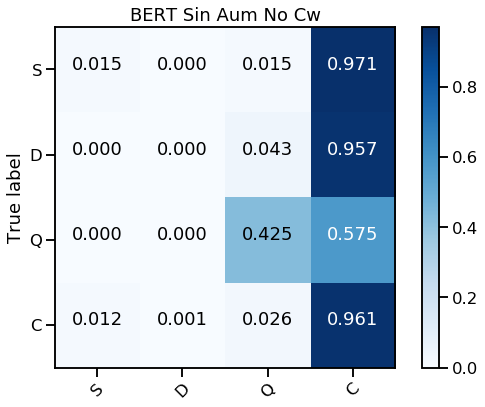

Test_ acc: 0.7776689520078355
Test_ f1 none: [0.02564103 0.         0.51428571 0.87027341]
Test_ f1 macro: 0.3525500386756931
Entrenando Run # 17
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.365 	F-macro_val: 0.263
Epoch 10 	acc_val: 0.715 	F-macro_val: 0.449
Epoch 20 	acc_val: 0.729 	F-macro_val: 0.464
Epoch 30 	acc_val: 0.743 	F-macro_val: 0.488
Epoch 40 	acc_val: 0.736 	F-macro_val: 0.489
Epoch 50 	acc_val: 0.740 	F-macro_val: 0.487
Testing run # 17
SE TUVIERON QUE REPETIR 3 EJEMPLOS


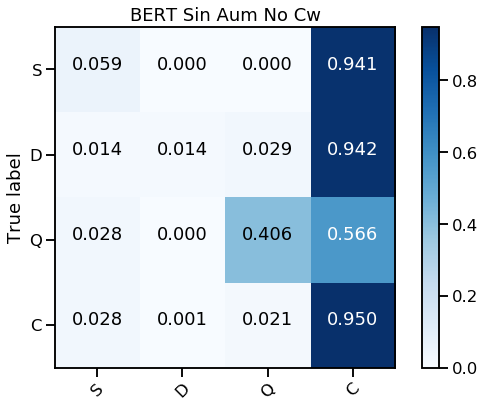

Test_ acc: 0.7708129285014691
Test_ f1 none: [0.08163265 0.02816901 0.51497006 0.86635404]
Test_ f1 macro: 0.3727814428936558
Entrenando Run # 18
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.111 	F-macro_val: 0.096
Epoch 10 	acc_val: 0.573 	F-macro_val: 0.199
Epoch 20 	acc_val: 0.719 	F-macro_val: 0.482
Epoch 30 	acc_val: 0.726 	F-macro_val: 0.524
Epoch 40 	acc_val: 0.722 	F-macro_val: 0.549
Epoch 50 	acc_val: 0.733 	F-macro_val: 0.547
Testing run # 18
SE TUVIERON QUE REPETIR 3 EJEMPLOS


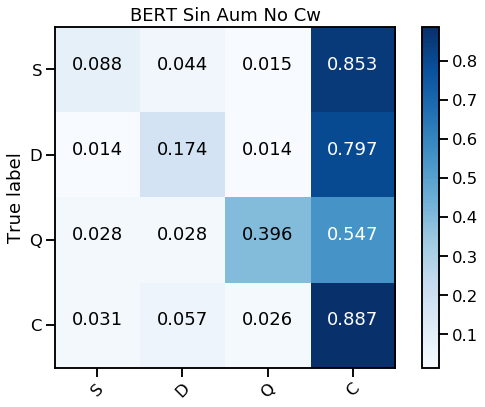

Test_ acc: 0.7345739471106758
Test_ f1 none: [0.11764706 0.18320611 0.49411765 0.84197682]
Test_ f1 macro: 0.4092369069709399
Entrenando Run # 19
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.167 	F-macro_val: 0.179
Epoch 10 	acc_val: 0.715 	F-macro_val: 0.459
Epoch 20 	acc_val: 0.740 	F-macro_val: 0.497
Epoch 30 	acc_val: 0.747 	F-macro_val: 0.534
Epoch 40 	acc_val: 0.757 	F-macro_val: 0.567
Epoch 50 	acc_val: 0.760 	F-macro_val: 0.581
Testing run # 19
SE TUVIERON QUE REPETIR 3 EJEMPLOS


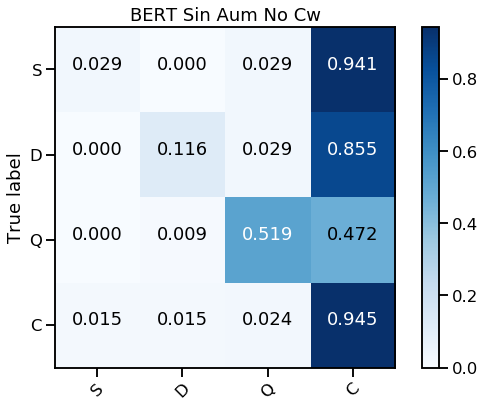

Test_ acc: 0.7835455435847208
Test_ f1 none: [0.04878049 0.17777778 0.59782609 0.87188612]
Test_ f1 macro: 0.4240676183839047
Entrenando Run # 20
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.403 	F-macro_val: 0.200
Epoch 10 	acc_val: 0.625 	F-macro_val: 0.218
Epoch 20 	acc_val: 0.712 	F-macro_val: 0.447
Epoch 30 	acc_val: 0.736 	F-macro_val: 0.478
Epoch 40 	acc_val: 0.740 	F-macro_val: 0.506
Epoch 50 	acc_val: 0.740 	F-macro_val: 0.517
Testing run # 20
SE TUVIERON QUE REPETIR 3 EJEMPLOS


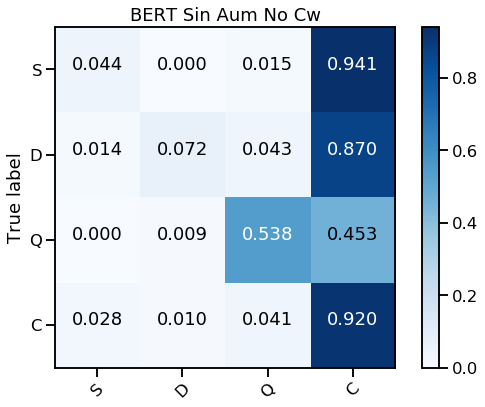

Test_ acc: 0.7649363369245837
Test_ f1 none: [0.06382979 0.12048193 0.57286432 0.85954382]
Test_ f1 macro: 0.40417996351998425


In [20]:
global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
best_macro={'F_ma':0.1 , 'Run':0}

dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}
  
prob=0.0
bs=32

for x in range(1,21): 
    print ("Entrenando Run #", x)
    cnn1 = load_model(path_m+str(prob)+'/cnn1_'+str(x)+'-exec.h5')
    cnn2 = load_model(path_m+str(prob)+'/cnn2_'+str(x)+'-exec.h5')
    rnn1 = load_model(path_m+str(prob)+'/rnn1_'+str(x)+'-exec.h5')
    rnn2 = load_model(path_m+str(prob)+'/rnn2_'+str(x)+'-exec.h5')
    rnn3 = load_model(path_m+str(prob)+'/rnn3_'+str(x)+'-exec.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    b_dim=768
    """espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']"""
    K_list_ext, index_embeddings, lab_str_embeddings, dict_match_kd = completar_kdummy([0,1,2,3])
    largo=len(index_embeddings)
    print("Index embeddings con preds", largo. ". Ult elemento:", index_embeddings[-1])
    
    for i in range(len(sentences)):
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector
            
        index_embeddings.append(i+largo)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
      
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector

        index_embeddings.append(num+largo+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    
    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model,  1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    
    for epoch in range(60):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        
        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val: %.3f" % acc_val.numpy(), "\tF-macro_val: %.3f" % fma_val.numpy())
    
    model.eval()
    print ("Testing run #",x)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)
    
    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

    plot_cm(cm_norma(glo_cm),["S","D","Q","C"],"BERT Sin Aum No Cw")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    if glo_fma>best_macro['F_ma']:
        best_macro['F_ma']=glo_fma
        best_macro['Run']=x                
        tope=4520

        for key in keys: 
            mask_s=test["Label"]==key
            q_tid=np.random.choice(test["Tw_id"][mask_s])
            q_ide=list(test["Tw_id"].values).index(q_tid)

            model.eval()

            temp2= [tope + q_ide]

            for m in range(n_machines): 
                temp2= temp2 + [np.argmax(matrix_test[m][q_ide])+1] 

            sent = [temp2]
            src = torch.LongTensor([w for w in sent])
            src = Variable(src)
            src_mask = src_mask=  (src != 0).unsqueeze(-2)
            out = model.forward(src, src_mask)
            print ("\n\nEjemplo de tweet con label ", key, " y Tw_id ", q_tid)
            for layer in range(2):
                fig, axs = plt.subplots(1,4, figsize=(22,11))
                print("Encoder Layer", layer+1)
                for h in range(4):
                    draw(model.encoder.layers[layer].self_attn.attn[0, h].data, 
                        axs[h], sent, cmap="Blues")
                plt.show()

In [21]:
best_macro

{'F_ma': 0.4388557570626098, 'Run': 11}

Acc: 0.767 -- deviation: 0.011
F-score: 0.386 -- deviation: 0.027
(0.0_No CW) NIPS: 0.05448386813262103 0.10055174236057607 0.5271110307720577 0.8622786521045486


Confusion counts
[[5.000e+01 1.700e+01 1.800e+01 1.275e+03]
 [1.000e+01 9.800e+01 3.500e+01 1.237e+03]
 [2.200e+01 1.400e+01 9.320e+02 1.152e+03]
 [3.180e+02 2.630e+02 4.070e+02 1.457e+04]]


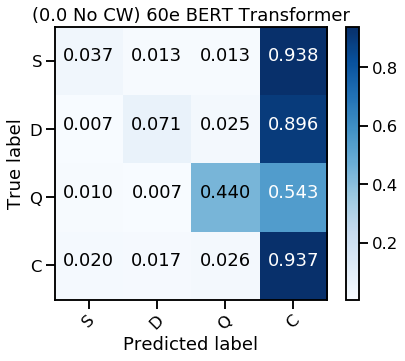

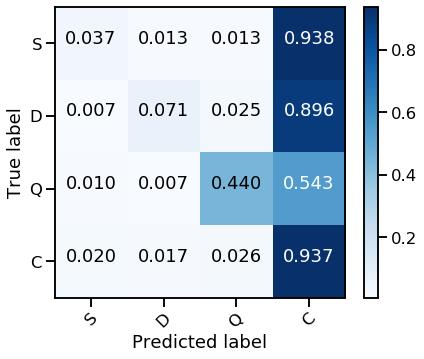

In [28]:
print ("Acc: %.3f" % np.mean(np.asarray(global_accs)), "-- deviation: %.3f" % np.std(np.asarray(global_accs)))
print ("F-score: %.3f" % np.mean(np.asarray(global_fmacros)), "-- deviation: %.3f" % np.std(np.asarray(global_fmacros)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0_No CW) NIPS:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
    
print (m_temp)
plot_cm(cm_norma(m_temp),["S","D","Q","C"],"(0.0 No CW) 60e BERT Transformer", cmap='Blues')

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='Blues')

#ponderado
#Acc: 0.770 -- deviation: 0.006
#F-score: 0.372 -- deviation: 0.039
#(0.0_No CW) SDQC: 0.0731121145729848 0.035319039127916146 0.5131844763279345 0.864882112896386

## 0.0 CW

In [29]:
class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
class_weights

array([1.26 , 3.182, 3.211, 0.388])

In [32]:
bc = BertClient() 

Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.267 	F-macro_val: 0.213
Epoch 10 	acc_val: 0.493 	F-macro_val: 0.403
Epoch 20 	acc_val: 0.556 	F-macro_val: 0.474
Epoch 30 	acc_val: 0.625 	F-macro_val: 0.510
Epoch 40 	acc_val: 0.632 	F-macro_val: 0.511
Epoch 50 	acc_val: 0.653 	F-macro_val: 0.541
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


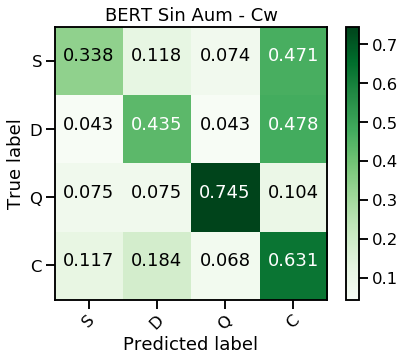

Test_ acc: 0.6101860920666013
Test_ f1 none: [0.238 0.233 0.642 0.73 ]
Test_ f1 macro: 0.4608220138436493


Ejemplo de tweet con label  commenting  y Tw_id  524938264575508482
Encoder Layer 1


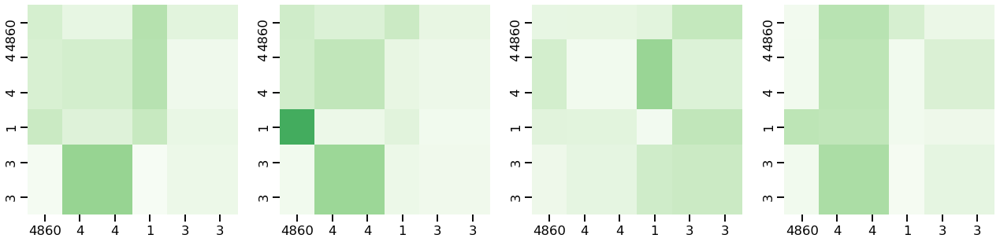

Encoder Layer 2


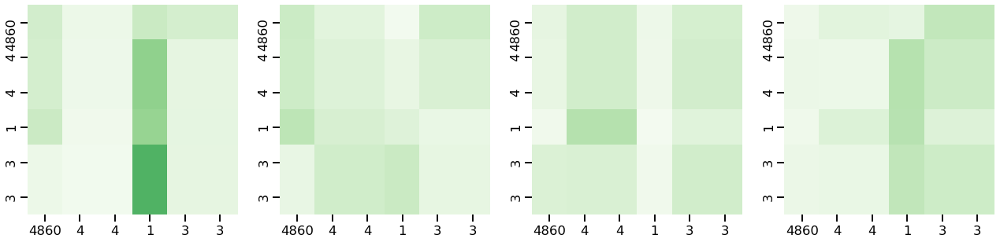



Ejemplo de tweet con label  support  y Tw_id  498299548625018880
Encoder Layer 1


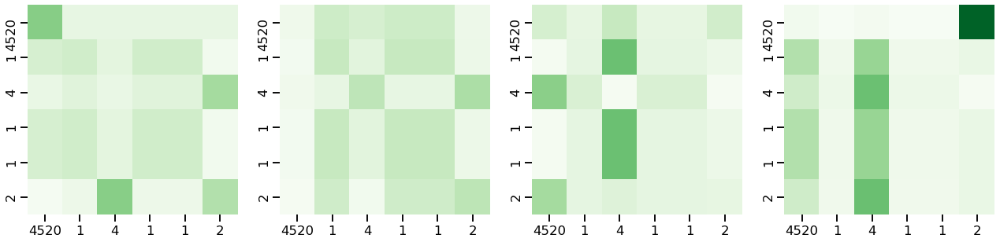

Encoder Layer 2


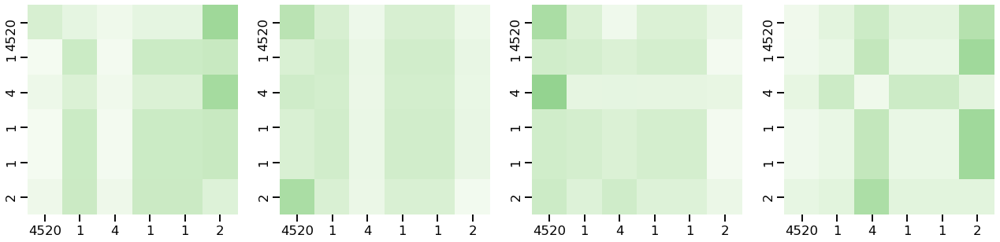



Ejemplo de tweet con label  denying  y Tw_id  758295910145204225
Encoder Layer 1


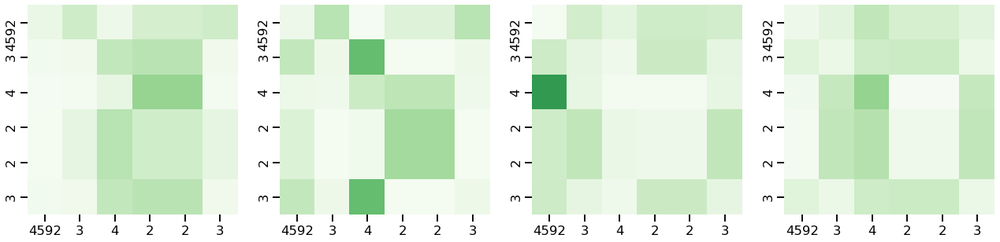

Encoder Layer 2


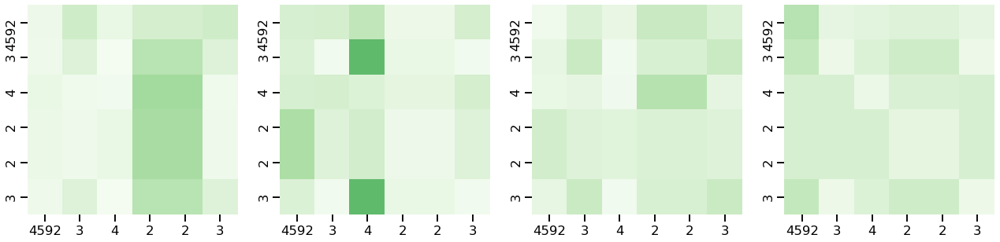



Ejemplo de tweet con label  questioning  y Tw_id  524953928320831489
Encoder Layer 1


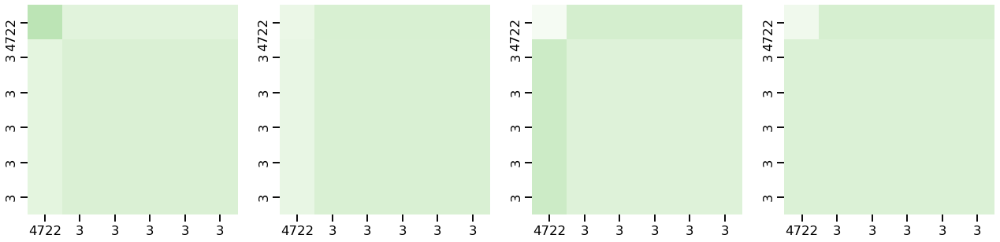

Encoder Layer 2


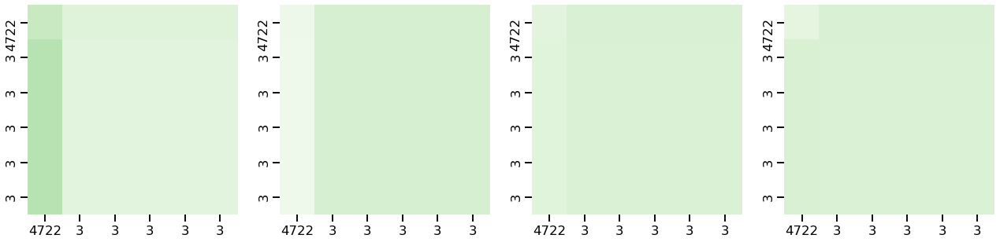

Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.101 	F-macro_val: 0.119
Epoch 10 	acc_val: 0.309 	F-macro_val: 0.289
Epoch 20 	acc_val: 0.573 	F-macro_val: 0.510
Epoch 30 	acc_val: 0.608 	F-macro_val: 0.513
Epoch 40 	acc_val: 0.628 	F-macro_val: 0.515
Epoch 50 	acc_val: 0.635 	F-macro_val: 0.524
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


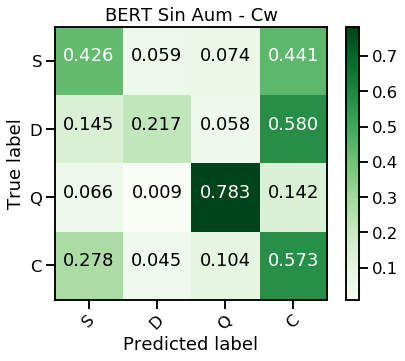

Test_ acc: 0.5612144955925563
Test_ f1 none: [0.176 0.242 0.595 0.681]
Test_ f1 macro: 0.4235278373323914
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.062 	F-macro_val: 0.058
Epoch 10 	acc_val: 0.240 	F-macro_val: 0.198
Epoch 20 	acc_val: 0.274 	F-macro_val: 0.275
Epoch 30 	acc_val: 0.292 	F-macro_val: 0.273
Epoch 40 	acc_val: 0.292 	F-macro_val: 0.274
Epoch 50 	acc_val: 0.347 	F-macro_val: 0.309
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


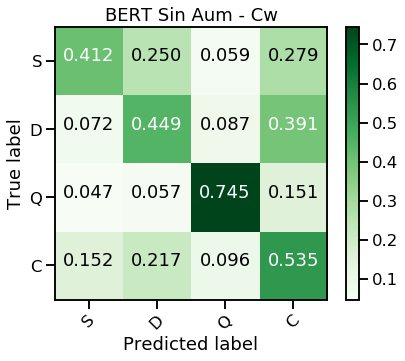

Test_ acc: 0.5426052889324192
Test_ f1 none: [0.25  0.212 0.585 0.662]
Test_ f1 macro: 0.42748358361851946
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.163 	F-macro_val: 0.130
Epoch 10 	acc_val: 0.191 	F-macro_val: 0.166
Epoch 20 	acc_val: 0.299 	F-macro_val: 0.251
Epoch 30 	acc_val: 0.351 	F-macro_val: 0.339
Epoch 40 	acc_val: 0.424 	F-macro_val: 0.404
Epoch 50 	acc_val: 0.420 	F-macro_val: 0.399
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


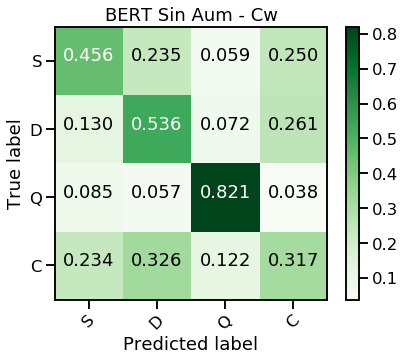

Test_ acc: 0.39373163565132224
Test_ f1 none: [0.207 0.194 0.586 0.464]
Test_ f1 macro: 0.3628048592907459
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.132 	F-macro_val: 0.104
Epoch 10 	acc_val: 0.267 	F-macro_val: 0.200
Epoch 20 	acc_val: 0.434 	F-macro_val: 0.398
Epoch 30 	acc_val: 0.465 	F-macro_val: 0.417
Epoch 40 	acc_val: 0.576 	F-macro_val: 0.491
Epoch 50 	acc_val: 0.580 	F-macro_val: 0.486
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


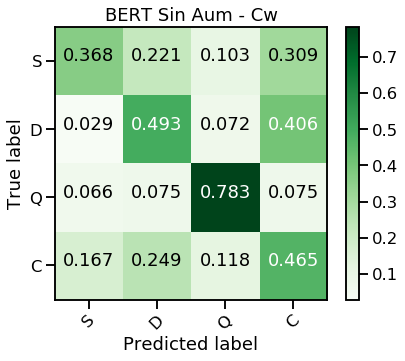

Test_ acc: 0.49363369245837413
Test_ f1 none: [0.216 0.212 0.567 0.605]
Test_ f1 macro: 0.39985389733847776
Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.125 	F-macro_val: 0.119
Epoch 10 	acc_val: 0.233 	F-macro_val: 0.219
Epoch 20 	acc_val: 0.368 	F-macro_val: 0.330
Epoch 30 	acc_val: 0.524 	F-macro_val: 0.455
Epoch 40 	acc_val: 0.569 	F-macro_val: 0.475
Epoch 50 	acc_val: 0.556 	F-macro_val: 0.466
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


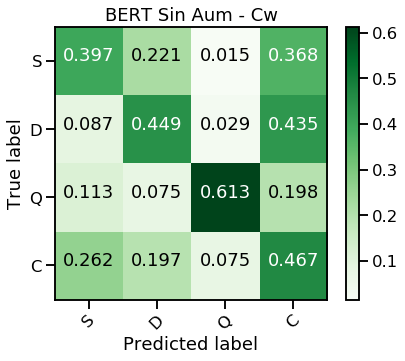

Test_ acc: 0.47600391772771794
Test_ f1 none: [0.17  0.225 0.56  0.597]
Test_ f1 macro: 0.3879696006537685
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.295 	F-macro_val: 0.218
Epoch 10 	acc_val: 0.410 	F-macro_val: 0.371
Epoch 20 	acc_val: 0.486 	F-macro_val: 0.416
Epoch 30 	acc_val: 0.444 	F-macro_val: 0.380
Epoch 40 	acc_val: 0.493 	F-macro_val: 0.414
Epoch 50 	acc_val: 0.448 	F-macro_val: 0.390
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


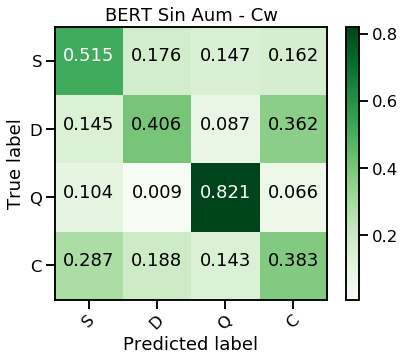

Test_ acc: 0.4387855044074437
Test_ f1 none: [0.202 0.219 0.544 0.533]
Test_ f1 macro: 0.37421187898056363
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.125 	F-macro_val: 0.114
Epoch 10 	acc_val: 0.267 	F-macro_val: 0.231
Epoch 20 	acc_val: 0.319 	F-macro_val: 0.280
Epoch 30 	acc_val: 0.319 	F-macro_val: 0.277
Epoch 40 	acc_val: 0.337 	F-macro_val: 0.296
Epoch 50 	acc_val: 0.351 	F-macro_val: 0.311
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


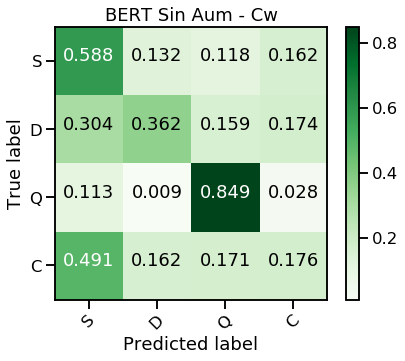

Test_ acc: 0.2859941234084231
Test_ f1 none: [0.153 0.217 0.517 0.291]
Test_ f1 macro: 0.29469398774014016
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.385 	F-macro_val: 0.249
Epoch 10 	acc_val: 0.378 	F-macro_val: 0.319
Epoch 20 	acc_val: 0.396 	F-macro_val: 0.349
Epoch 30 	acc_val: 0.535 	F-macro_val: 0.467
Epoch 40 	acc_val: 0.562 	F-macro_val: 0.487
Epoch 50 	acc_val: 0.562 	F-macro_val: 0.480
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


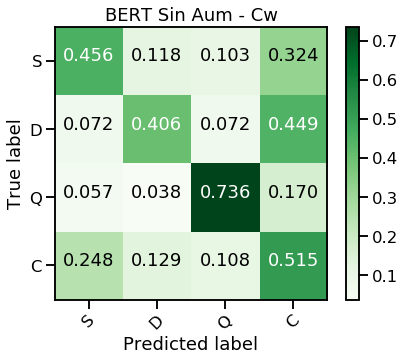

Test_ acc: 0.5269343780607247
Test_ f1 none: [0.205 0.268 0.557 0.642]
Test_ f1 macro: 0.41782647573027976
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.236 	F-macro_val: 0.132
Epoch 10 	acc_val: 0.281 	F-macro_val: 0.212
Epoch 20 	acc_val: 0.312 	F-macro_val: 0.268
Epoch 30 	acc_val: 0.333 	F-macro_val: 0.283
Epoch 40 	acc_val: 0.566 	F-macro_val: 0.478
Epoch 50 	acc_val: 0.583 	F-macro_val: 0.493
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


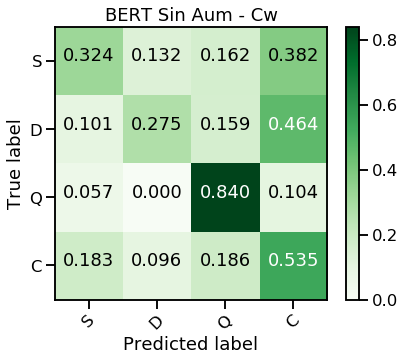

Test_ acc: 0.534769833496572
Test_ f1 none: [0.18  0.221 0.492 0.659]
Test_ f1 macro: 0.3877459466920268
Entrenando Run # 11
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.236 	F-macro_val: 0.193
Epoch 10 	acc_val: 0.361 	F-macro_val: 0.322
Epoch 20 	acc_val: 0.403 	F-macro_val: 0.372
Epoch 30 	acc_val: 0.521 	F-macro_val: 0.455
Epoch 40 	acc_val: 0.556 	F-macro_val: 0.485
Epoch 50 	acc_val: 0.538 	F-macro_val: 0.476
Testing run # 11
SE TUVIERON QUE REPETIR 3 EJEMPLOS


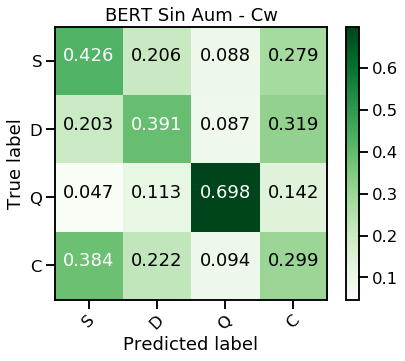

Test_ acc: 0.3555337904015671
Test_ f1 none: [0.14  0.183 0.558 0.437]
Test_ f1 macro: 0.3295097422131718
Entrenando Run # 12
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.389 	F-macro_val: 0.197
Epoch 10 	acc_val: 0.583 	F-macro_val: 0.438
Epoch 20 	acc_val: 0.622 	F-macro_val: 0.500
Epoch 30 	acc_val: 0.625 	F-macro_val: 0.505
Epoch 40 	acc_val: 0.611 	F-macro_val: 0.494
Epoch 50 	acc_val: 0.597 	F-macro_val: 0.493
Testing run # 12
SE TUVIERON QUE REPETIR 3 EJEMPLOS


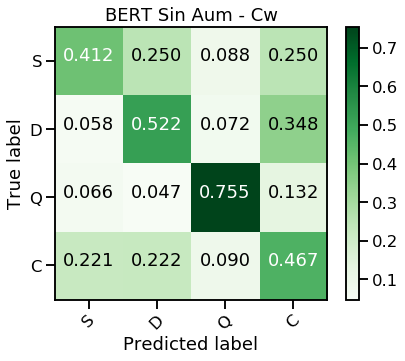

Test_ acc: 0.49657198824681686
Test_ f1 none: [0.201 0.24  0.599 0.607]
Test_ f1 macro: 0.4117477983947404
Entrenando Run # 13
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.257 	F-macro_val: 0.191
Epoch 10 	acc_val: 0.351 	F-macro_val: 0.308
Epoch 20 	acc_val: 0.330 	F-macro_val: 0.300
Epoch 30 	acc_val: 0.483 	F-macro_val: 0.424
Epoch 40 	acc_val: 0.622 	F-macro_val: 0.499
Epoch 50 	acc_val: 0.646 	F-macro_val: 0.516
Testing run # 13
SE TUVIERON QUE REPETIR 3 EJEMPLOS


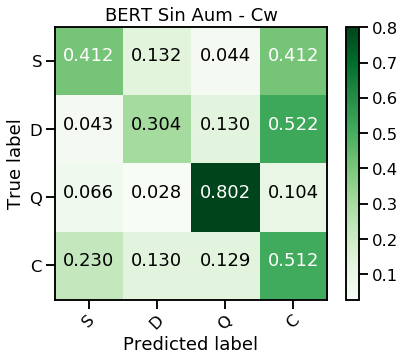

Test_ acc: 0.5210577864838394
Test_ f1 none: [0.196 0.207 0.561 0.636]
Test_ f1 macro: 0.40018371315777335
Entrenando Run # 14
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.257 	F-macro_val: 0.227
Epoch 10 	acc_val: 0.330 	F-macro_val: 0.344
Epoch 20 	acc_val: 0.396 	F-macro_val: 0.395
Epoch 30 	acc_val: 0.517 	F-macro_val: 0.468
Epoch 40 	acc_val: 0.601 	F-macro_val: 0.510
Epoch 50 	acc_val: 0.622 	F-macro_val: 0.515
Testing run # 14
SE TUVIERON QUE REPETIR 3 EJEMPLOS


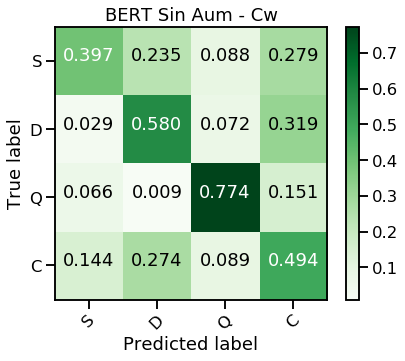

Test_ acc: 0.5220372184133203
Test_ f1 none: [0.25  0.236 0.612 0.63 ]
Test_ f1 macro: 0.4319882773584436
Entrenando Run # 15
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.264 	F-macro_val: 0.163
Epoch 10 	acc_val: 0.340 	F-macro_val: 0.321
Epoch 20 	acc_val: 0.323 	F-macro_val: 0.289
Epoch 30 	acc_val: 0.333 	F-macro_val: 0.309
Epoch 40 	acc_val: 0.375 	F-macro_val: 0.349
Epoch 50 	acc_val: 0.458 	F-macro_val: 0.421
Testing run # 15
SE TUVIERON QUE REPETIR 3 EJEMPLOS


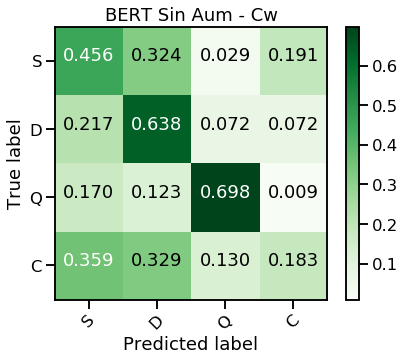

Test_ acc: 0.2850146914789422
Test_ f1 none: [0.151 0.218 0.514 0.302]
Test_ f1 macro: 0.29625291671153076
Entrenando Run # 16
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.330 	F-macro_val: 0.200
Epoch 10 	acc_val: 0.545 	F-macro_val: 0.434
Epoch 20 	acc_val: 0.622 	F-macro_val: 0.521
Epoch 30 	acc_val: 0.618 	F-macro_val: 0.527
Epoch 40 	acc_val: 0.635 	F-macro_val: 0.543
Epoch 50 	acc_val: 0.628 	F-macro_val: 0.539
Testing run # 16
SE TUVIERON QUE REPETIR 3 EJEMPLOS


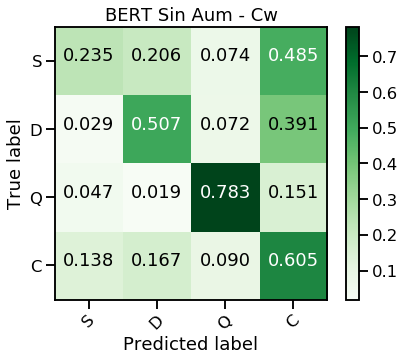

Test_ acc: 0.5925563173359452
Test_ f1 none: [0.162 0.28  0.617 0.711]
Test_ f1 macro: 0.44241498239744714
Entrenando Run # 17
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.247 	F-macro_val: 0.196
Epoch 10 	acc_val: 0.330 	F-macro_val: 0.282
Epoch 20 	acc_val: 0.344 	F-macro_val: 0.332
Epoch 30 	acc_val: 0.358 	F-macro_val: 0.337
Epoch 40 	acc_val: 0.427 	F-macro_val: 0.381
Epoch 50 	acc_val: 0.417 	F-macro_val: 0.387
Testing run # 17
SE TUVIERON QUE REPETIR 3 EJEMPLOS


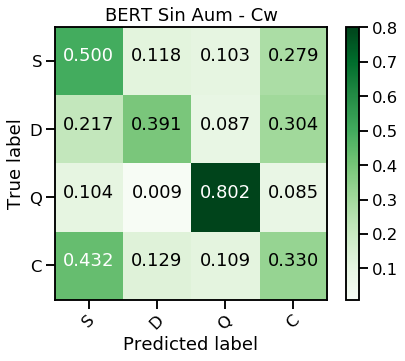

Test_ acc: 0.39471106758080315
Test_ f1 none: [0.147 0.263 0.588 0.474]
Test_ f1 macro: 0.36809284852483415
Entrenando Run # 18
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.094 	F-macro_val: 0.069
Epoch 10 	acc_val: 0.205 	F-macro_val: 0.129
Epoch 20 	acc_val: 0.309 	F-macro_val: 0.198
Epoch 30 	acc_val: 0.365 	F-macro_val: 0.352
Epoch 40 	acc_val: 0.615 	F-macro_val: 0.516
Epoch 50 	acc_val: 0.597 	F-macro_val: 0.488
Testing run # 18
SE TUVIERON QUE REPETIR 3 EJEMPLOS


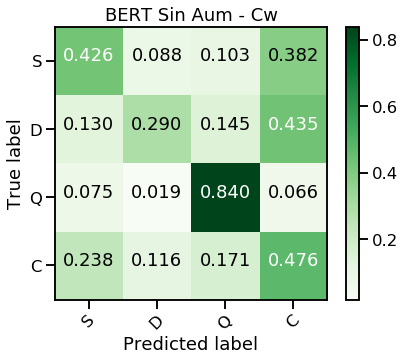

Test_ acc: 0.4975514201762977
Test_ f1 none: [0.194 0.214 0.516 0.611]
Test_ f1 macro: 0.3837227351885188
Entrenando Run # 19
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.260 	F-macro_val: 0.181
Epoch 10 	acc_val: 0.424 	F-macro_val: 0.362
Epoch 20 	acc_val: 0.438 	F-macro_val: 0.405
Epoch 30 	acc_val: 0.438 	F-macro_val: 0.392
Epoch 40 	acc_val: 0.476 	F-macro_val: 0.430
Epoch 50 	acc_val: 0.601 	F-macro_val: 0.509
Testing run # 19
SE TUVIERON QUE REPETIR 3 EJEMPLOS


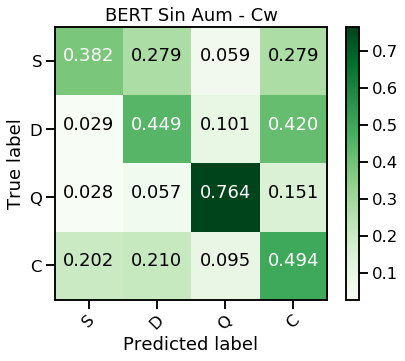

Test_ acc: 0.5112634671890304
Test_ f1 none: [0.203 0.215 0.596 0.626]
Test_ f1 macro: 0.41010460481772915
Entrenando Run # 20
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.125 	F-macro_val: 0.086
Epoch 10 	acc_val: 0.278 	F-macro_val: 0.208
Epoch 20 	acc_val: 0.309 	F-macro_val: 0.275
Epoch 30 	acc_val: 0.312 	F-macro_val: 0.279
Epoch 40 	acc_val: 0.337 	F-macro_val: 0.304
Epoch 50 	acc_val: 0.455 	F-macro_val: 0.388
Testing run # 20
SE TUVIERON QUE REPETIR 3 EJEMPLOS


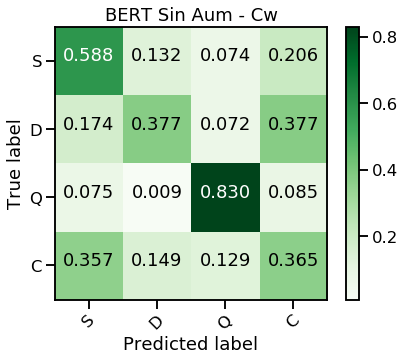

Test_ acc: 0.4289911851126347
Test_ f1 none: [0.197 0.235 0.579 0.511]
Test_ f1 macro: 0.3806342365389981


In [34]:
global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
best_macro={'F_ma':0.1 , 'Run':0}

prob=0.0
bs=32

for x in range(1,21): 
    print ("Entrenando Run #", x)
    cnn1 = load_model(path_m+str(prob)+'cw/cnn1_'+str(x)+'-exec.h5')
    cnn2 = load_model(path_m+str(prob)+'cw/cnn2_'+str(x)+'-exec.h5')
    rnn1 = load_model(path_m+str(prob)+'cw/rnn1_'+str(x)+'-exec.h5')
    rnn2 = load_model(path_m+str(prob)+'cw/rnn2_'+str(x)+'-exec.h5')
    rnn3 = load_model(path_m+str(prob)+'cw/rnn3_'+str(x)+'-exec.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    b_dim=768
    espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']

    for i in range(len(sentences)):
        #ide=ids_train[i]
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector
            
        index_embeddings.append(i+5)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
      
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
        vector=bc.encode([encoded_tok])[0]
        final_bert= vector

        index_embeddings.append(num+5+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    
    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model,  1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    
    for epoch in range(60):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        
        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val: %.3f" % acc_val.numpy(), "\tF-macro_val: %.3f" % fma_val.numpy())
    
    model.eval()
    print ("Testing run #",x)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)
    
    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

    plot_cm(cm_norma(glo_cm),["S","D","Q","C"],"BERT Sin Aum - Cw", cmap="Greens")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    if glo_fma>best_macro['F_ma']:
        best_macro['F_ma']=glo_fma
        best_macro['Run']=x                
        tope=4520

        for key in keys: 
            mask_s=test["Label"]==key
            q_tid=np.random.choice(test["Tw_id"][mask_s])
            q_ide=list(test["Tw_id"].values).index(q_tid)

            model.eval()

            temp2= [tope + q_ide]

            for m in range(n_machines): 
                temp2= temp2 + [np.argmax(matrix_test[m][q_ide])+1] 

            sent = [temp2]
            src = torch.LongTensor([w for w in sent])
            src = Variable(src)
            src_mask = src_mask=  (src != 0).unsqueeze(-2)
            out = model.forward(src, src_mask)
            print ("\n\nEjemplo de tweet con label ", key, " y Tw_id ", q_tid)
            for layer in range(2):
                fig, axs = plt.subplots(1,4, figsize=(22,11))
                print("Encoder Layer", layer+1)
                for h in range(4):
                    draw(model.encoder.layers[layer].self_attn.attn[0, h].data, 
                        axs[h], sent, color="Greens")
                plt.show()

In [35]:
best_macro

{'F_ma': 0.4608220138436493, 'Run': 1}

Acc: 0.473 -- deviation: 0.089
F-score: 0.390 -- deviation: 0.043
(0.0CW) SDQC: 0.19181812853568164 0.22671695623250665 0.5692743519423219 0.5705089505942398


Confusion counts
[[ 579.  247.  113.  421.]
 [ 156.  585.  121.  518.]
 [ 162.   89. 1641.  228.]
 [3985. 2910. 1802. 6863.]]


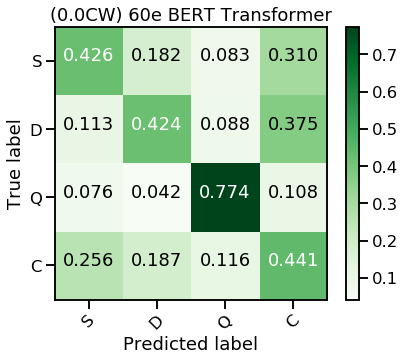

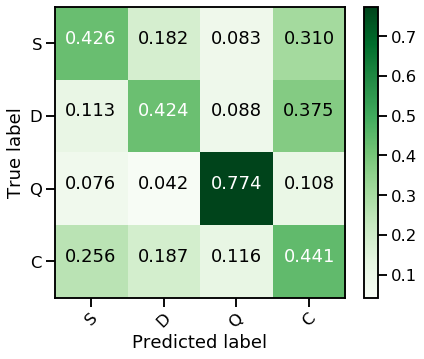

In [36]:
print ("Acc: %.3f" % np.mean(np.asarray(global_accs)), "-- deviation: %.3f" % np.std(np.asarray(global_accs)))
print ("F-score: %.3f" % np.mean(np.asarray(global_fmacros)), "-- deviation: %.3f" % np.std(np.asarray(global_fmacros)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0CW) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
    
print (m_temp)
plot_cm(cm_norma(m_temp),["S","D","Q","C"],"(0.0CW) 60e BERT Transformer", cmap='Greens')

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='Greens')

## Con aumento de datos

### 0.15

In [8]:
bc = BertClient()  

class_weights= np.asarray([1.0, 1.0, 1.0, 1.0])
path_a='../../../Datasets/CSV_Stance/Aumento_ofi/' 

print ("Pesos de clases:", class_weights)

Pesos de clases: [1. 1. 1. 1.]


In [35]:
def train_transformer(prob, num_epochs, path_a, path_m, c_gama,  xfrom=1, xto=20):    
    global_accs=[]
    global_fnones=[]
    global_fmacros=[]
    global_cms=[]
    global_attn=[]
    best_macro={'F_ma':0.1 , 'Run':0}

    bs=32

    for x in range(xfrom, xto + 1):

        macro_augmented= np.load(path_a + 'balance_GloVe_' + str(int(prob*100)) + '_'+ str(x)+'_run.npy', allow_pickle=True)

        ids_train=macro_augmented[:,0]
        tws_train=macro_augmented[:,1]
        labels_train=macro_augmented[:,2]
        class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
        print ("Pesos de clases:", class_weights)

        etiq=np.asarray(labels_train)
        sentences = tws_train
        n_labels = etiq.copy()
        y_train=to_categorical(n_labels,num_classes=4)

        input_ids=[]
        for sent in sentences:
            encoded_sent=[]
            for wd in sent:
                try:
                    encoded_sent.append(token_2_idx[wd])
                except:
                    continue
            input_ids.append(encoded_sent)

        input_ids = pad_sequences(input_ids,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
        shape=np.asarray(input_ids).shape

        x_train=np.zeros((shape[0], shape[1], emb))
        j=0
        for in_id in input_ids:
            x_train[j]=EMB_matrix[in_id]
            j+=1

        ################################################    
        print ("Entrenando Run #", x)
        cnn1 = load_model(path_m+str(prob)+'/cnn1_'+str(x)+'-exec.h5')
        cnn2 = load_model(path_m+str(prob)+'/cnn2_'+str(x)+'-exec.h5')
        rnn1 = load_model(path_m+str(prob)+'/rnn1_'+str(x)+'-exec.h5')
        rnn2 = load_model(path_m+str(prob)+'/rnn2_'+str(x)+'-exec.h5')
        rnn3 = load_model(path_m+str(prob)+'/rnn3_'+str(x)+'-exec.h5')

        list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
        index_models=np.arange(5)
        dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
        modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
        ind=np.arange(5)
        dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

        predicciones_all=[]
        predicciones_all_val=[]
        predicciones_all_test=[]

        print ("agregando predicciones Train")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
        print ("agregando predicciones Val")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
        print ("agregando predicciones Test")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

        matrix=np.asarray(predicciones_all)
        matrix_val=np.asarray(predicciones_all_val)
        matrix_test=np.asarray(predicciones_all_test)
        new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)

        b_dim=768
        espacio=[np.ones(b_dim)]
        Ks= ortho_group.rvs(dim=b_dim)
        random=np.random.randint(Ks.shape[0], size=4)
        K_list=Ks[random]
        K_list_ext=espacio+list(K_list)
        index_embeddings=[0,1,2,3,4]
        lab_str_embeddings=['','','','','']

        for i in range(len(sentences)):
            #ide=ids_train[i]
            tw_tr=tws_train[i]
            clase=dict_cl[labels_train[i]]            
            tw=' '.join([word for word in tw_tr])
            vector= bc.encode([tw])[0]
            final_bert= vector

            index_embeddings.append(i+5)
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)

        objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
        objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
        lab_val=val['Label']
        lab_test=test['Label']
        tw_val=val['Tweet']
        tw_test=test['Tweet']
        llaves=np.concatenate([objs_val,objs_test])
        clases=np.concatenate([lab_val,lab_test])
        sent_all=np.concatenate([tw_val,tw_test])

        for num in range(len(llaves)):
            i=llaves[num]
            clase=clases[num]
            tw_tr=sent_all[num]
            encoded_tok = cleaner(tw_tr)[0]  #cleaner: raw, no cleaner:augmented version
            vector=bc.encode([encoded_tok])[0]
            final_bert= vector

            index_embeddings.append(num+5+train.shape[0])
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)


        K_list_new= np.asarray(K_list_ext, dtype='float32')

        ###################################### TRANSFORMER ###############################
        hist_train_loss=[]
        hist_train_acc=[]
        hist_train_fma=[]
        hist_val_loss=[]
        hist_val_acc=[]
        hist_val_fma=[]

        V = 4
        pesos = torch.from_numpy(class_weights).float()
        criterion = FocalLoss(weights=pesos)
        model = make_model_concat(4, K_list_new, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
        model_opt = NoamOpt(model.src_embed[0].d_model,  1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))


        for epoch in range(num_epochs):
            model.train()
            DATA=data_gen(bs, 'Train', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings)  
            loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')

            model.eval()
            DATA_VAL=data_gen(bs, 'Val', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings)
            loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(DATA_VAL, model, SimpleLossComputeFL(criterion, None),'Val')
            if epoch%10==0:
                print ("Epoch",epoch, "\tacc_val: %.3f" % acc_val.numpy(), "\tF-macro_val: %.3f" % fma_val.numpy())

        model.eval()
        print ("Testing run #",x)
        DATA_TEST=data_gen(bs, 'Test', 5, new_matrix, matrix, matrix_val, matrix_test, lab_str_embeddings, index_embeddings)
        predicciones = run_epoch(DATA_TEST, model, SimpleLossComputeFL(criterion, None),'Test')
        predicciones=np.concatenate(predicciones, axis=-1)

        glo_acc=accuracy_score(etiq_t, predicciones[:-3])
        glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
        glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

        glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

        plot_cm(cm_norma(glo_cm),["S","D","Q","C"],"BERT Aum 0.15", cmap=c_gama)
        global_accs.append(glo_acc)
        global_fnones.append(glo_fno)
        global_fmacros.append(glo_fma)
        global_cms.append(glo_cm)
        print("Test_ acc:",glo_acc) 
        print("Test_ f1 none:",glo_fno) 
        print("Test_ f1 macro:",glo_fma) 

        if glo_fma>best_macro['F_ma']:
            best_macro['F_ma']=glo_fma
            best_macro['Run']=x                
            tope=4520

            for key in keys: 
                mask_s=test["Label"]==key
                q_tid=np.random.choice(test["Tw_id"][mask_s])
                q_ide=list(test["Tw_id"].values).index(q_tid)

                model.eval()

                temp2= [tope + q_ide]

                for m in range(n_machines): 
                    temp2= temp2 + [np.argmax(matrix_test[m][q_ide])+1] 

                sent = [temp2]
                src = torch.LongTensor([w for w in sent])
                src = Variable(src)
                src_mask = src_mask=  (src != 0).unsqueeze(-2)
                out = model.forward(src, src_mask)
                print ("\n\nEjemplo de tweet con label ", key, " y Tw_id ", q_tid)
                for layer in range(2):
                    fig, axs = plt.subplots(1,4, figsize=(22,11))
                    print("Encoder Layer", layer+1)
                    for h in range(4):
                        draw(model.encoder.layers[layer].self_attn.attn[0, h].data, 
                            axs[h], sent, color=c_gama)
                    plt.show()
                    
    return best_macro, global_accs, global_fnones, global_fmacros, global_cms

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.153 	F-macro_val: 0.100
Epoch 10 	acc_val: 0.698 	F-macro_val: 0.561
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.564
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


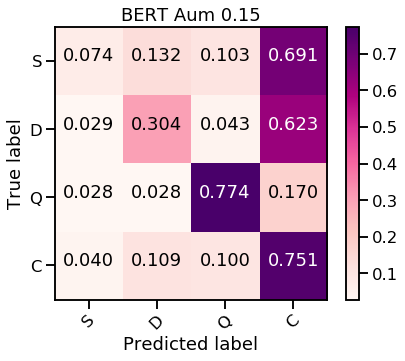

Test_ acc: 0.6777668952007836
Test_ f1 none: [0.09174312 0.22459893 0.5942029  0.79455782]
Test_ f1 macro: 0.4262756928568287


Ejemplo de tweet con label  commenting  y Tw_id  763153119035490306
Encoder Layer 1


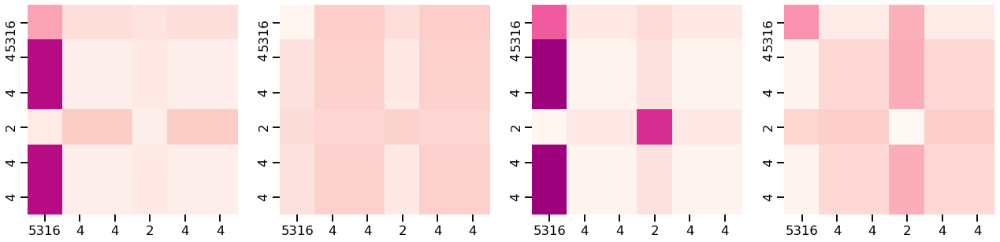

Encoder Layer 2


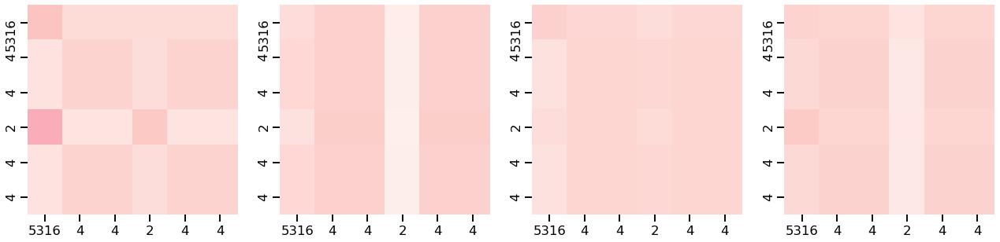



Ejemplo de tweet con label  support  y Tw_id  498295399682441217
Encoder Layer 1


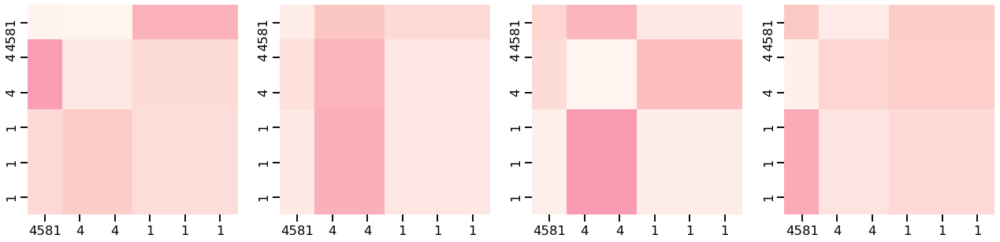

Encoder Layer 2


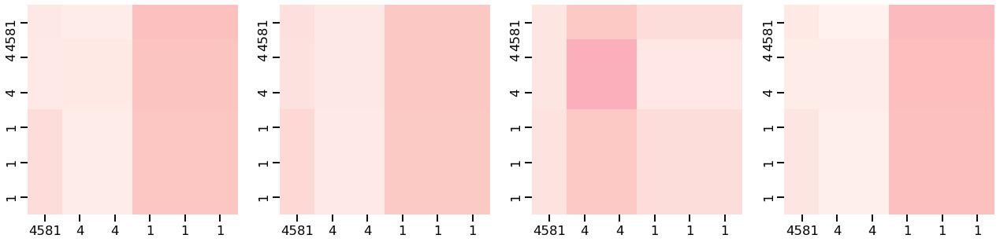



Ejemplo de tweet con label  denying  y Tw_id  580355626926231552
Encoder Layer 1


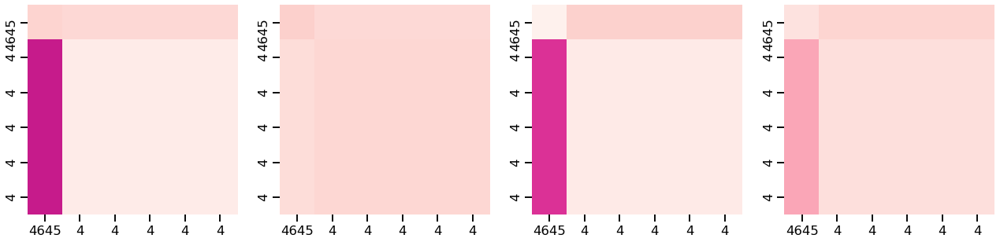

Encoder Layer 2


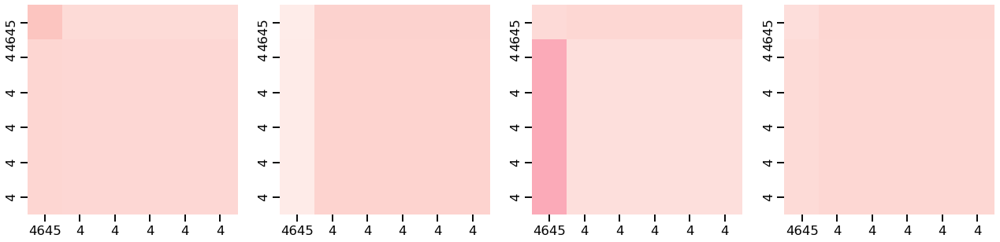



Ejemplo de tweet con label  questioning  y Tw_id  544283072720805890
Encoder Layer 1


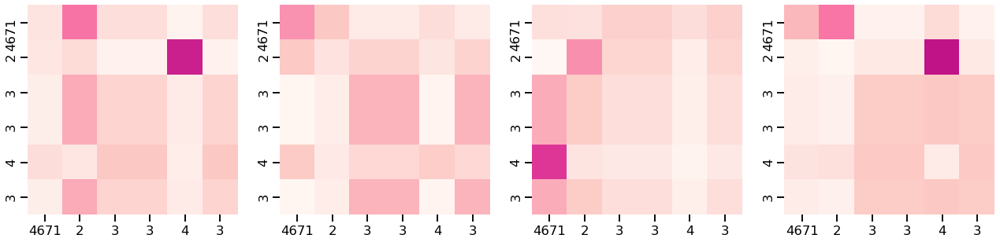

Encoder Layer 2


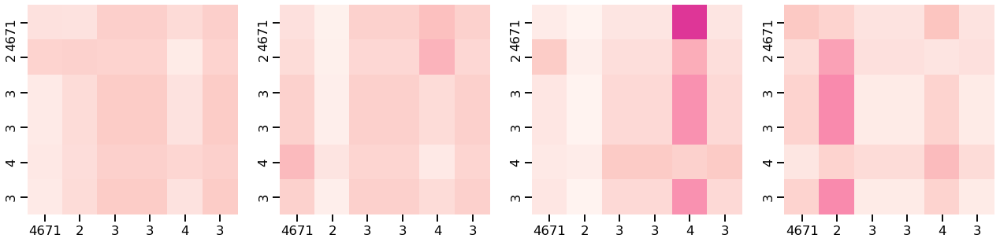

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.128 	F-macro_val: 0.141
Epoch 10 	acc_val: 0.660 	F-macro_val: 0.493
Epoch 20 	acc_val: 0.663 	F-macro_val: 0.494
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


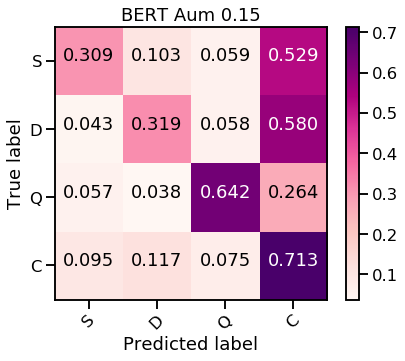

Test_ acc: 0.6523016650342801
Test_ f1 none: [0.24418605 0.22797927 0.56666667 0.77244259]
Test_ f1 macro: 0.4528186441290518


Ejemplo de tweet con label  commenting  y Tw_id  524926238243049473
Encoder Layer 1


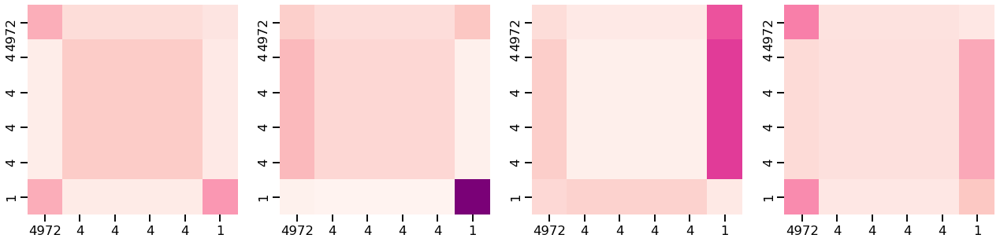

Encoder Layer 2


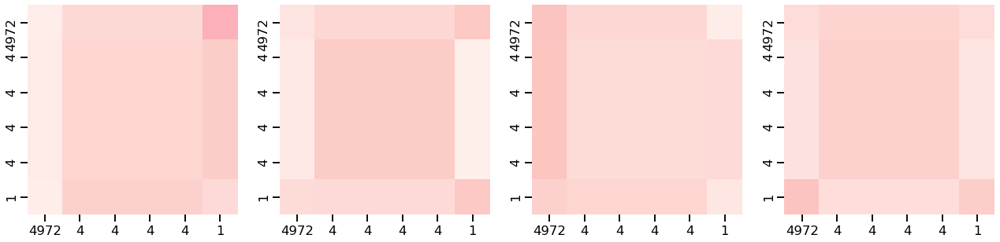



Ejemplo de tweet con label  support  y Tw_id  768898914510475264
Encoder Layer 1


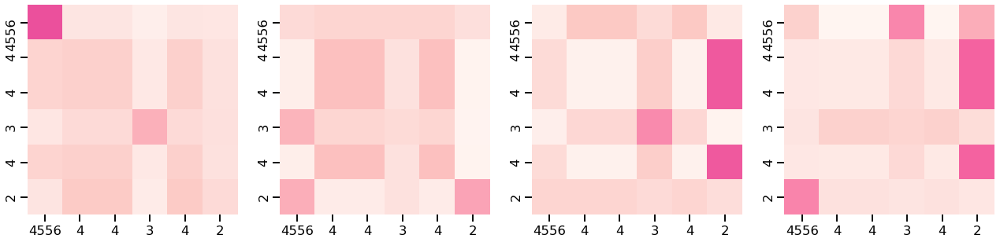

Encoder Layer 2


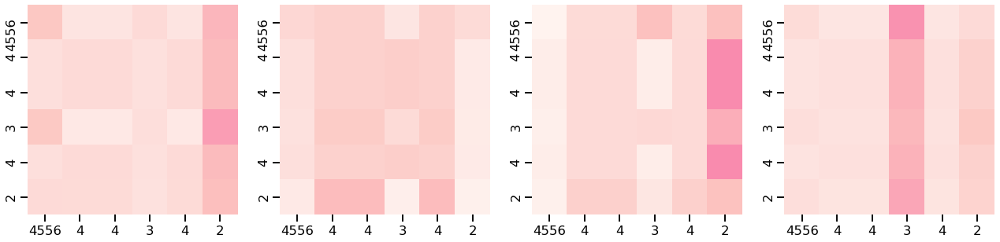



Ejemplo de tweet con label  denying  y Tw_id  764944029922590720
Encoder Layer 1


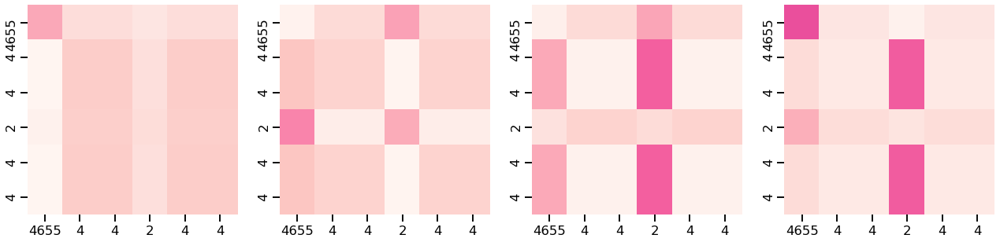

Encoder Layer 2


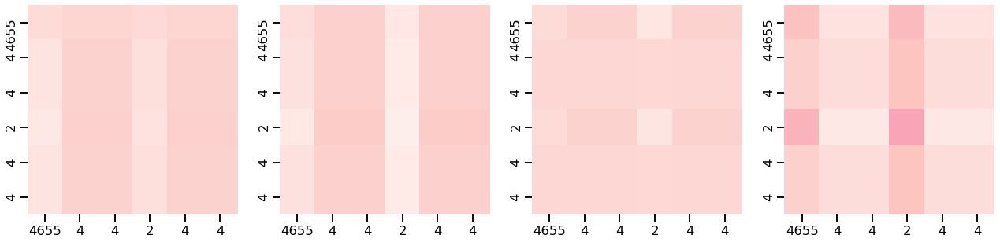



Ejemplo de tweet con label  questioning  y Tw_id  553561561139535872
Encoder Layer 1


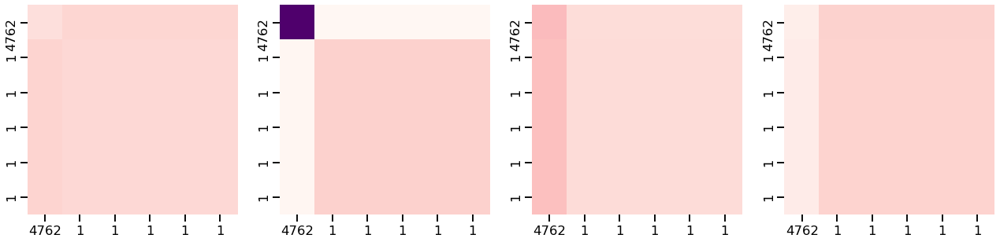

Encoder Layer 2


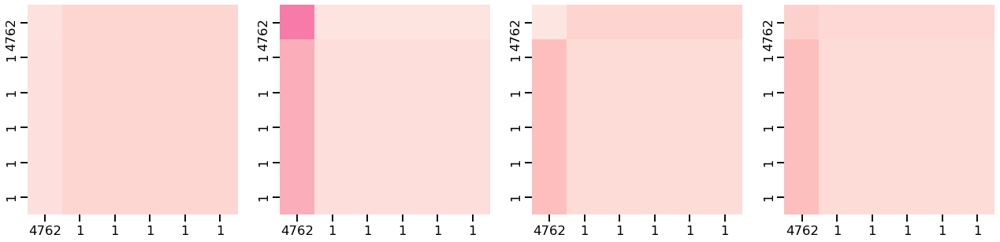

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.326 	F-macro_val: 0.190
Epoch 10 	acc_val: 0.632 	F-macro_val: 0.500
Epoch 20 	acc_val: 0.635 	F-macro_val: 0.490
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


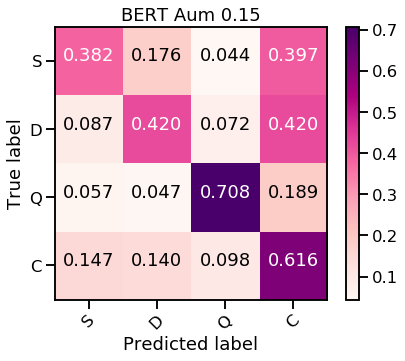

Test_ acc: 0.5964740450538688
Test_ f1 none: [0.23636364 0.25892857 0.56603774 0.71867967]
Test_ f1 macro: 0.44500240338968594
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.264 	F-macro_val: 0.188
Epoch 10 	acc_val: 0.708 	F-macro_val: 0.521
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.511
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


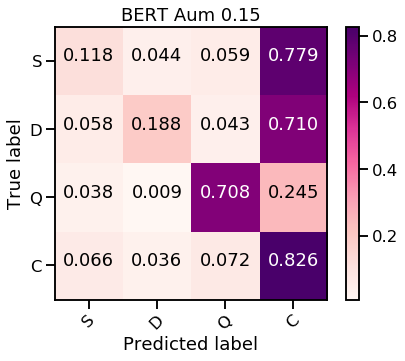

Test_ acc: 0.7238001958863859
Test_ f1 none: [0.11851852 0.22807018 0.6147541  0.83021304]
Test_ f1 macro: 0.4478889582472929
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.240 	F-macro_val: 0.151
Epoch 10 	acc_val: 0.701 	F-macro_val: 0.538
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.544
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


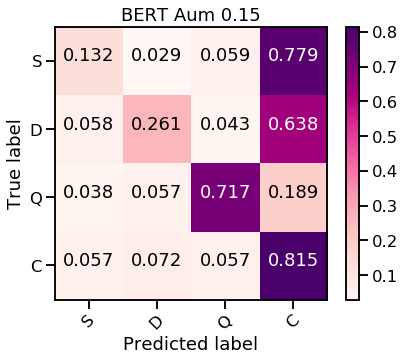

Test_ acc: 0.7218413320274241
Test_ f1 none: [0.13953488 0.2384106  0.65236052 0.8293002 ]
Test_ f1 macro: 0.46490154774388764


Ejemplo de tweet con label  commenting  y Tw_id  524935580996894720
Encoder Layer 1


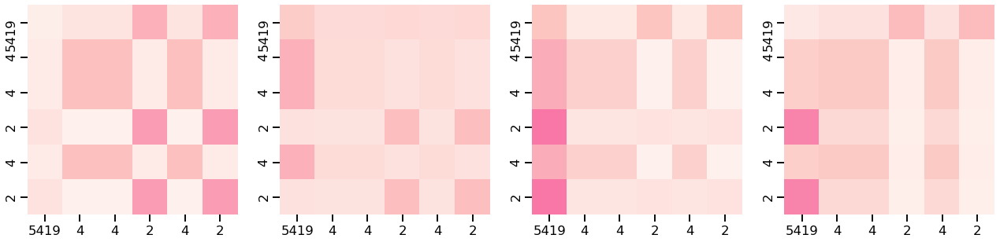

Encoder Layer 2


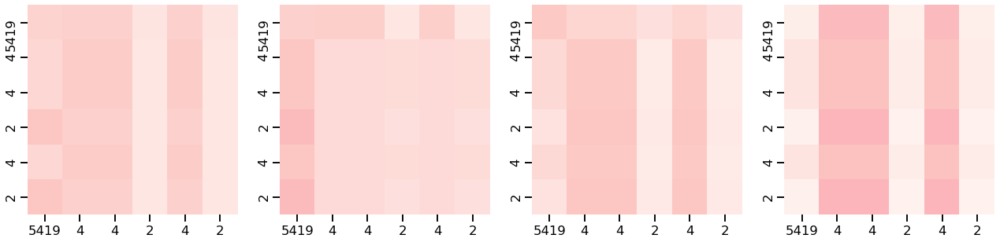



Ejemplo de tweet con label  support  y Tw_id  767730695619751938
Encoder Layer 1


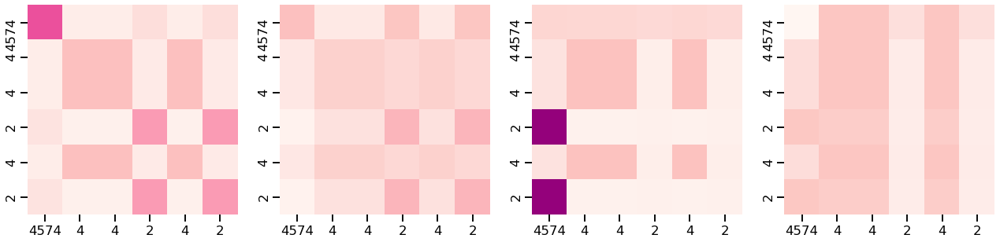

Encoder Layer 2


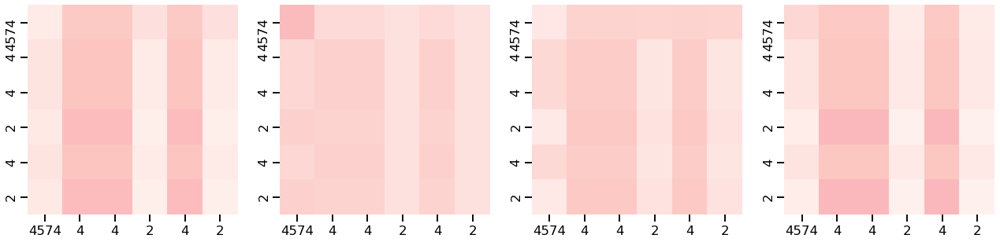



Ejemplo de tweet con label  denying  y Tw_id  581154995640221699
Encoder Layer 1


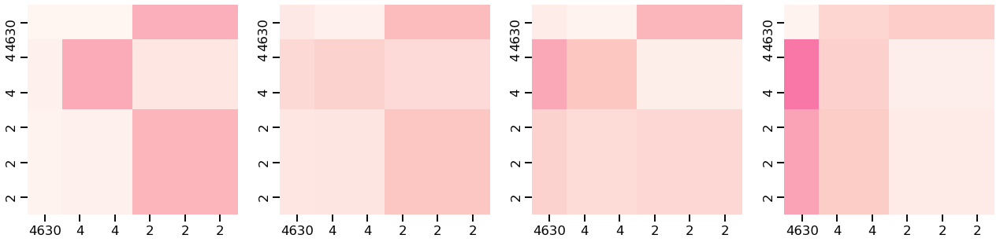

Encoder Layer 2


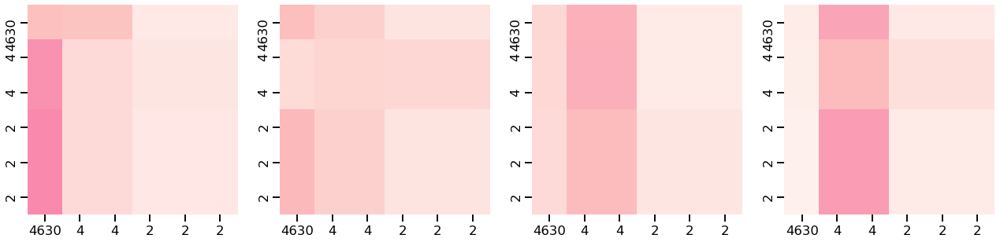



Ejemplo de tweet con label  questioning  y Tw_id  524945273358139392
Encoder Layer 1


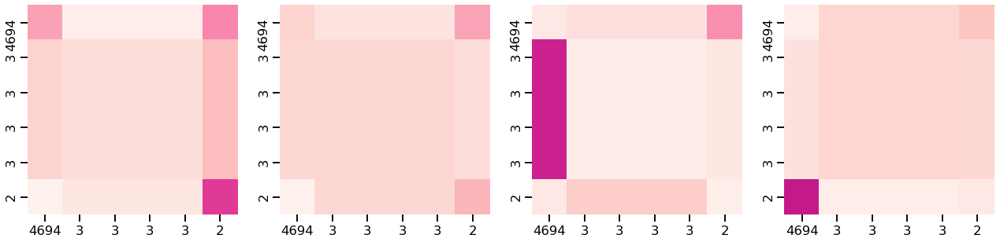

Encoder Layer 2


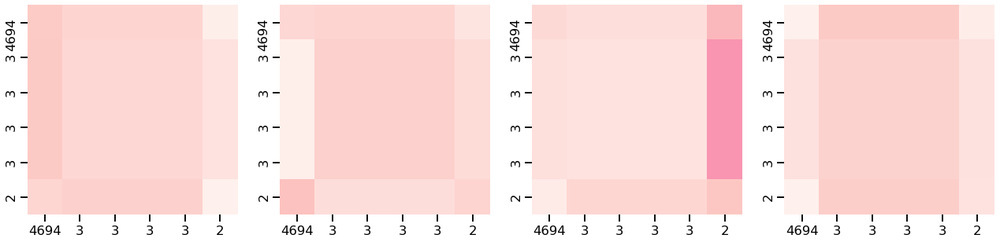

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.344 	F-macro_val: 0.292
Epoch 10 	acc_val: 0.688 	F-macro_val: 0.505
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.516
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


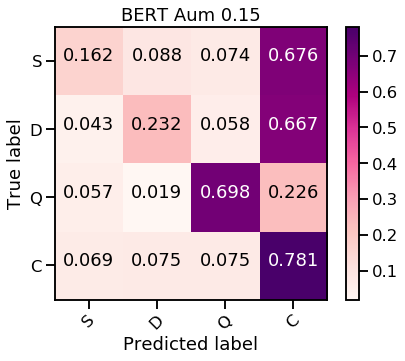

Test_ acc: 0.6944172380019589
Test_ f1 none: [0.15492958 0.21192053 0.59919028 0.80958722]
Test_ f1 macro: 0.4439069019277161
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.451 	F-macro_val: 0.301
Epoch 10 	acc_val: 0.694 	F-macro_val: 0.542
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.550
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


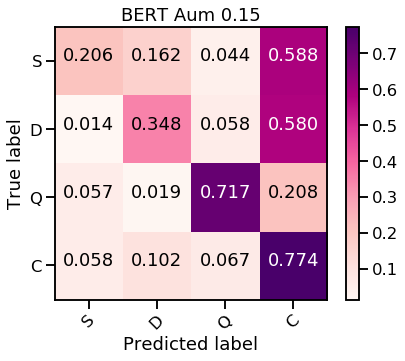

Test_ acc: 0.7012732615083251
Test_ f1 none: [0.20895522 0.25945946 0.63070539 0.81241565]
Test_ f1 macro: 0.4778839330129614


Ejemplo de tweet con label  commenting  y Tw_id  544297327402713088
Encoder Layer 1


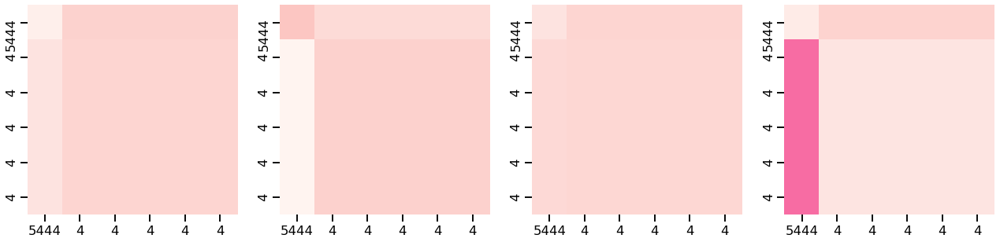

Encoder Layer 2


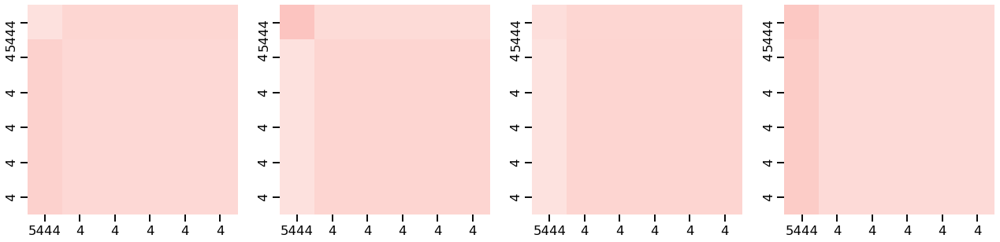



Ejemplo de tweet con label  support  y Tw_id  524942125553954816
Encoder Layer 1


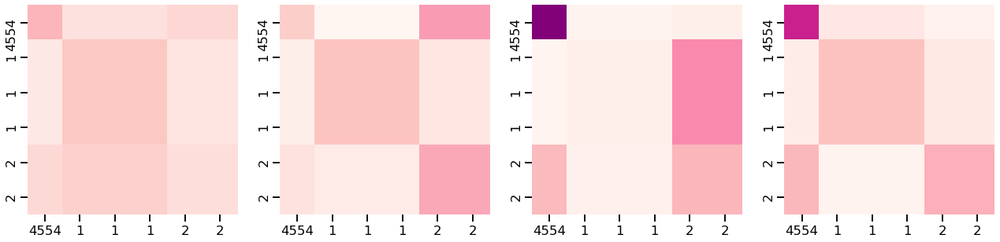

Encoder Layer 2


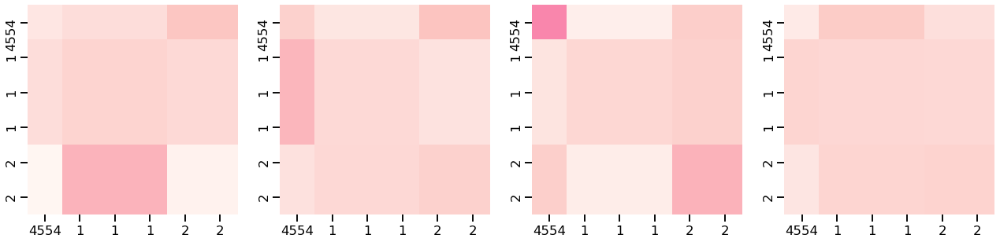



Ejemplo de tweet con label  denying  y Tw_id  758367239011766272
Encoder Layer 1


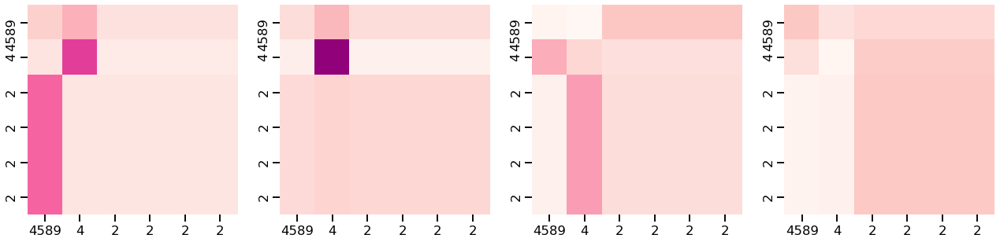

Encoder Layer 2


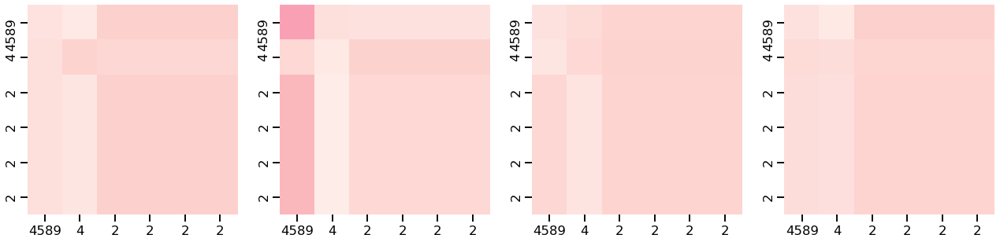



Ejemplo de tweet con label  questioning  y Tw_id  524948710942588928
Encoder Layer 1


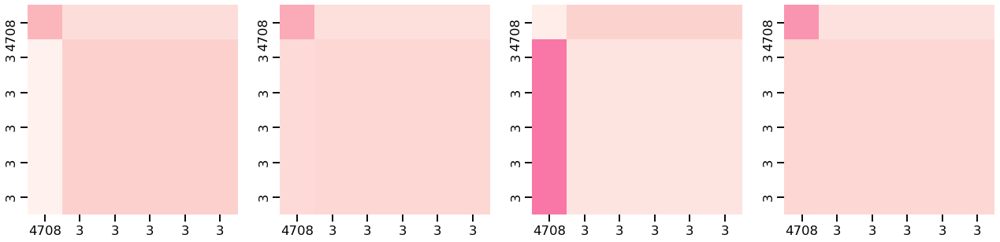

Encoder Layer 2


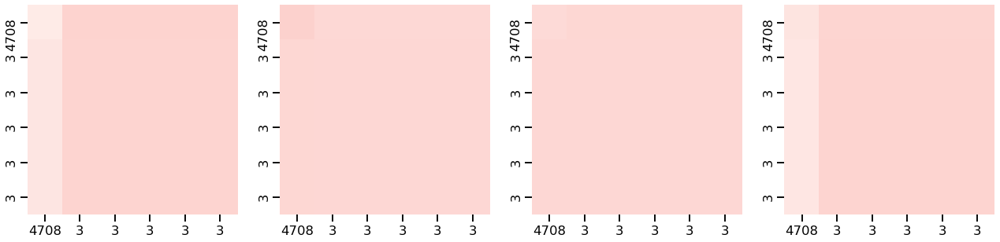

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.306 	F-macro_val: 0.170
Epoch 10 	acc_val: 0.691 	F-macro_val: 0.530
Epoch 20 	acc_val: 0.694 	F-macro_val: 0.525
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


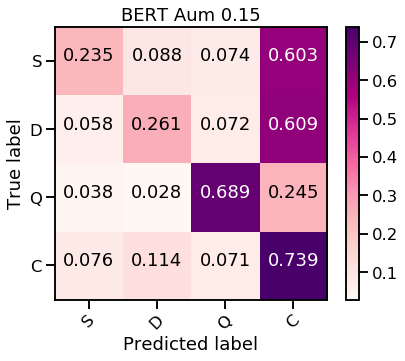

Test_ acc: 0.6679725759059746
Test_ f1 none: [0.21192053 0.19459459 0.59836066 0.78659371]
Test_ f1 macro: 0.44786737184599157
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.257 	F-macro_val: 0.199
Epoch 10 	acc_val: 0.688 	F-macro_val: 0.504
Epoch 20 	acc_val: 0.698 	F-macro_val: 0.524
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


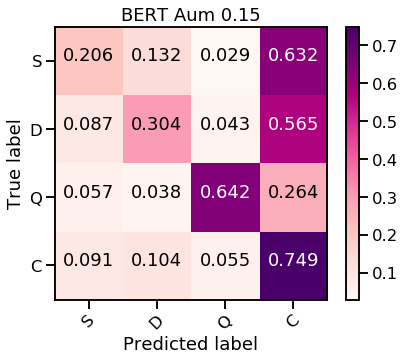

Test_ acc: 0.6718903036238981
Test_ f1 none: [0.16969697 0.22826087 0.61261261 0.79265806]
Test_ f1 macro: 0.45080712690479785
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.347 	F-macro_val: 0.245
Epoch 10 	acc_val: 0.684 	F-macro_val: 0.535
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.551
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


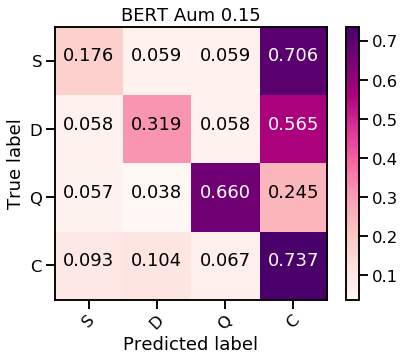

Test_ acc: 0.66307541625857
Test_ f1 none: [0.14814815 0.24444444 0.59322034 0.78278689]
Test_ f1 macro: 0.4421499542053863
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 11
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.240 	F-macro_val: 0.173
Epoch 10 	acc_val: 0.691 	F-macro_val: 0.521
Epoch 20 	acc_val: 0.701 	F-macro_val: 0.522
Testing run # 11
SE TUVIERON QUE REPETIR 3 EJEMPLOS


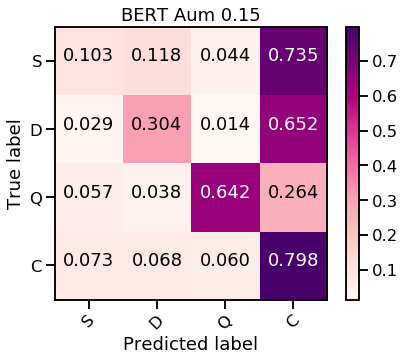

Test_ acc: 0.702252693437806
Test_ f1 none: [0.1        0.27096774 0.60444444 0.81603154]
Test_ f1 macro: 0.44786093095766266
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 12
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.104 	F-macro_val: 0.110
Epoch 10 	acc_val: 0.733 	F-macro_val: 0.578
Epoch 20 	acc_val: 0.743 	F-macro_val: 0.579
Testing run # 12
SE TUVIERON QUE REPETIR 3 EJEMPLOS


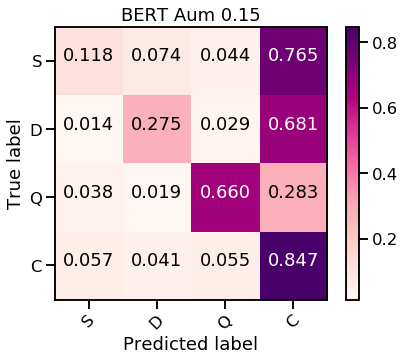

Test_ acc: 0.7404505386875612
Test_ f1 none: [0.128      0.2992126  0.625      0.84163474]
Test_ f1 macro: 0.47346183415291476
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 13
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.569 	F-macro_val: 0.374
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.502
Epoch 20 	acc_val: 0.677 	F-macro_val: 0.519
Testing run # 13
SE TUVIERON QUE REPETIR 3 EJEMPLOS


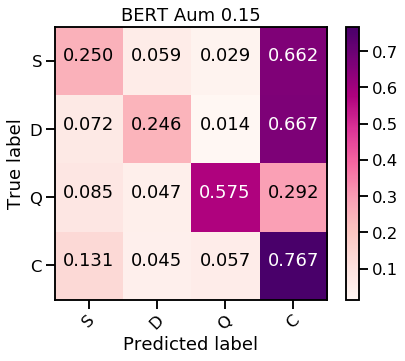

Test_ acc: 0.6777668952007836
Test_ f1 none: [0.16915423 0.26153846 0.57009346 0.79759519]
Test_ f1 macro: 0.44959533467971746
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 14
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.330 	F-macro_val: 0.273
Epoch 10 	acc_val: 0.733 	F-macro_val: 0.551
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.525
Testing run # 14
SE TUVIERON QUE REPETIR 3 EJEMPLOS


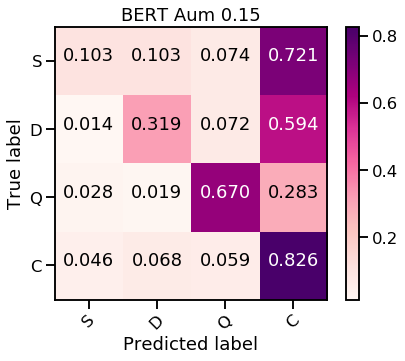

Test_ acc: 0.7277179236043095
Test_ f1 none: [0.12173913 0.2875817  0.60944206 0.83452304]
Test_ f1 macro: 0.46332148171399823
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 15
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test


In [ ]:
best_15, all_accs, all_fno, all_ma, all_cm =train_transformer(0.15, 30, path_a, path_m, "RdPu")

In [24]:
best_15  # array([0.2745098 , 0.21621622, 0.64435146, 0.79863481]

{'F_ma': 0.4834280742149052, 'Run': 15}

In [28]:
all_ma

[0.4262756928568287,
 0.4528186441290518,
 0.44500240338968594,
 0.4478889582472929,
 0.46490154774388764,
 0.4439069019277161,
 0.4778839330129614,
 0.44786737184599157,
 0.45080712690479785,
 0.4421499542053863,
 0.44786093095766266,
 0.47346183415291476,
 0.44959533467971746,
 0.46332148171399823,
 0.4834280742149052,
 0.42387101467369714,
 0.4418214373042218,
 0.460045074536493,
 0.4325468666404234,
 0.4712416749059509]

In [29]:
all_fno

[array([0.092, 0.225, 0.594, 0.795]),
 array([0.244, 0.228, 0.567, 0.772]),
 array([0.236, 0.259, 0.566, 0.719]),
 array([0.119, 0.228, 0.615, 0.83 ]),
 array([0.14 , 0.238, 0.652, 0.829]),
 array([0.155, 0.212, 0.599, 0.81 ]),
 array([0.209, 0.259, 0.631, 0.812]),
 array([0.212, 0.195, 0.598, 0.787]),
 array([0.17 , 0.228, 0.613, 0.793]),
 array([0.148, 0.244, 0.593, 0.783]),
 array([0.1  , 0.271, 0.604, 0.816]),
 array([0.128, 0.299, 0.625, 0.842]),
 array([0.169, 0.262, 0.57 , 0.798]),
 array([0.122, 0.288, 0.609, 0.835]),
 array([0.275, 0.216, 0.644, 0.799]),
 array([0.225, 0.204, 0.536, 0.73 ]),
 array([0.15 , 0.226, 0.582, 0.809]),
 array([0.203, 0.246, 0.618, 0.773]),
 array([0.146, 0.23 , 0.562, 0.792]),
 array([0.218, 0.261, 0.577, 0.829])]

In [31]:
all_accs

[0.6777668952007836,
 0.6523016650342801,
 0.5964740450538688,
 0.7238001958863859,
 0.7218413320274241,
 0.6944172380019589,
 0.7012732615083251,
 0.6679725759059746,
 0.6718903036238981,
 0.66307541625857,
 0.702252693437806,
 0.7404505386875612,
 0.6777668952007836,
 0.7277179236043095,
 0.6885406464250735,
 0.6013712047012733,
 0.693437806072478,
 0.6523016650342801,
 0.6669931439764937,
 0.7198824681684622]

Acc: 0.682 -- deviation: 0.037
F-score: 0.452 -- deviation: 0.016
(0.15) SDQC: 0.17301069812900732 0.24098979863071884 0.5978273904775772 0.7975113643714135


Confusion counts
[[  273.   142.    83.   862.]
 [   63.   408.    79.   830.]
 [  102.    72.  1436.   510.]
 [ 1249.  1407.  1093. 11811.]]


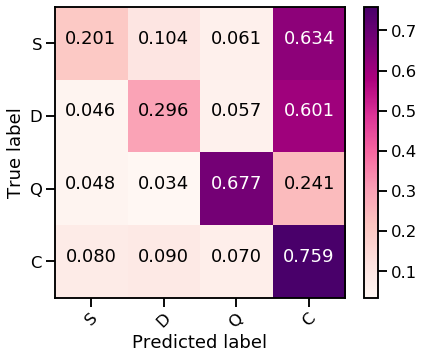

In [27]:
#best_15, all_accs, all_fno, all_ma, all_cm
print ("Acc: %.3f" % np.mean(np.asarray(all_accs)), "-- deviation: %.3f" % np.std(np.asarray(all_accs)))
print ("F-score: %.3f" % np.mean(np.asarray(all_ma)), "-- deviation: %.3f" % np.std(np.asarray(all_ma)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(all_fno)[:,0])
den=np.mean(np.asarray(all_fno)[:,1])
que=np.mean(np.asarray(all_fno)[:,2])
com=np.mean(np.asarray(all_fno)[:,3])

print ("(0.15) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in all_cm:
    m_temp+=np.asarray(m)
    
print (m_temp)

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='RdPu')

## 0.5 mask

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.278 	F-macro_val: 0.211
Epoch 10 	acc_val: 0.656 	F-macro_val: 0.493
Epoch 20 	acc_val: 0.660 	F-macro_val: 0.499
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


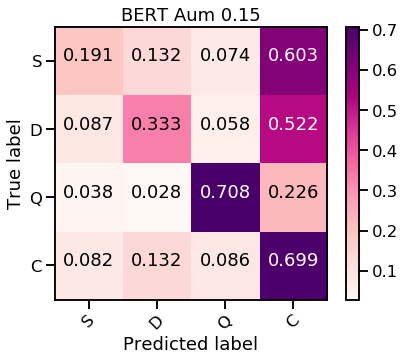

Test_ acc: 0.6415279138099902
Test_ f1 none: [0.168 0.222 0.584 0.765]
Test_ f1 macro: 0.4345509036362408


Ejemplo de tweet con label  commenting  y Tw_id  544280844060213248
Encoder Layer 1


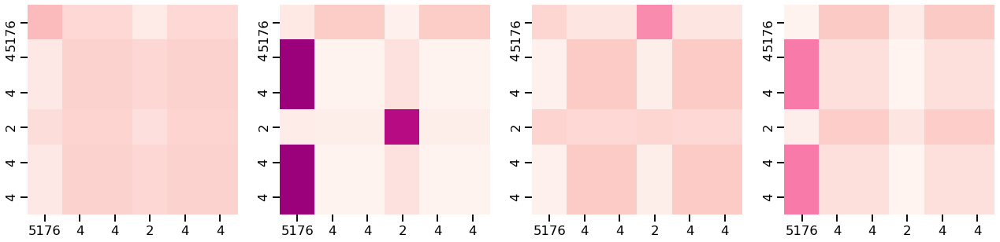

Encoder Layer 2


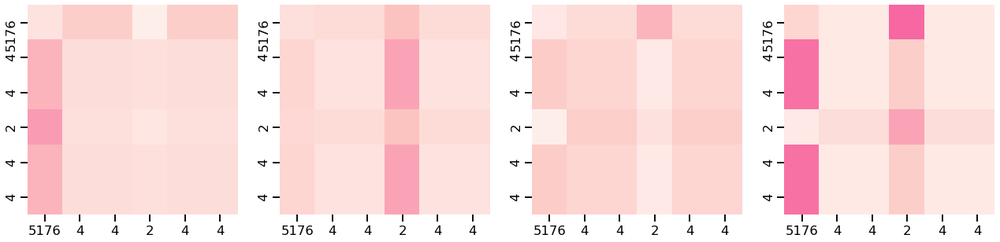



Ejemplo de tweet con label  support  y Tw_id  768863602065416192
Encoder Layer 1


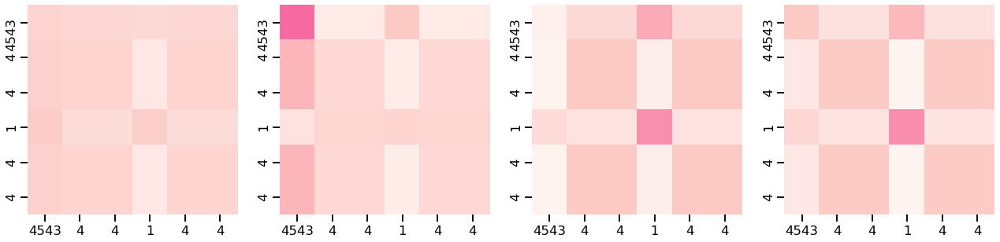

Encoder Layer 2


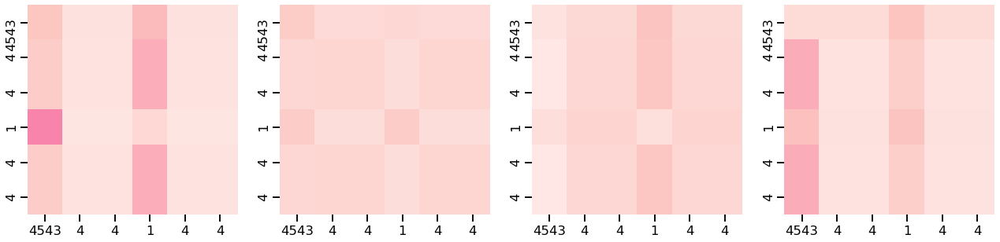



Ejemplo de tweet con label  denying  y Tw_id  758335648541671424
Encoder Layer 1


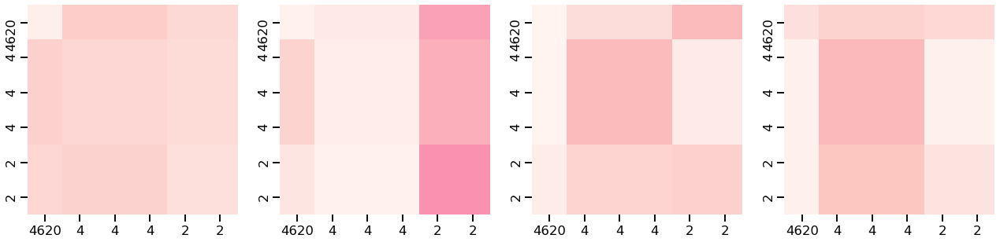

Encoder Layer 2


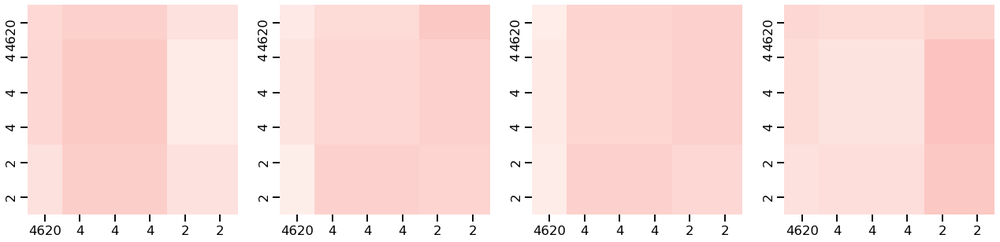



Ejemplo de tweet con label  questioning  y Tw_id  544280004860059648
Encoder Layer 1


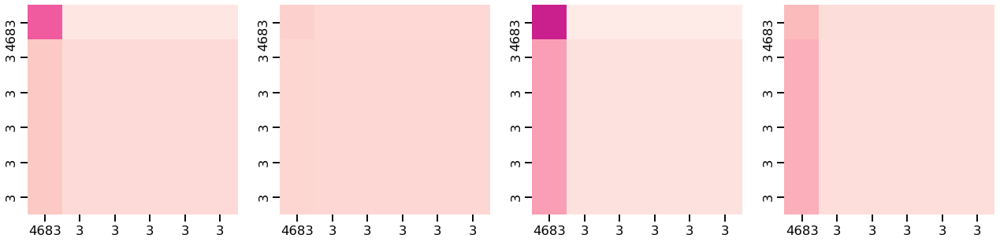

Encoder Layer 2


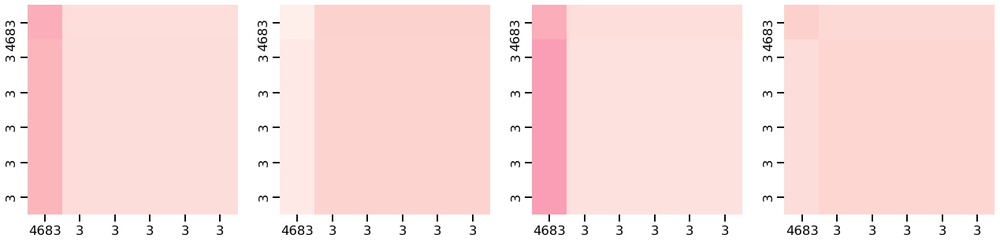

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.309 	F-macro_val: 0.177
Epoch 10 	acc_val: 0.681 	F-macro_val: 0.488
Epoch 20 	acc_val: 0.688 	F-macro_val: 0.498
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


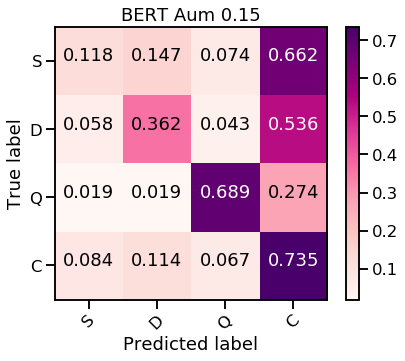

Test_ acc: 0.6640548481880509
Test_ f1 none: [0.109 0.256 0.611 0.783]
Test_ f1 macro: 0.4397894450082174


Ejemplo de tweet con label  commenting  y Tw_id  544365801503879169
Encoder Layer 1


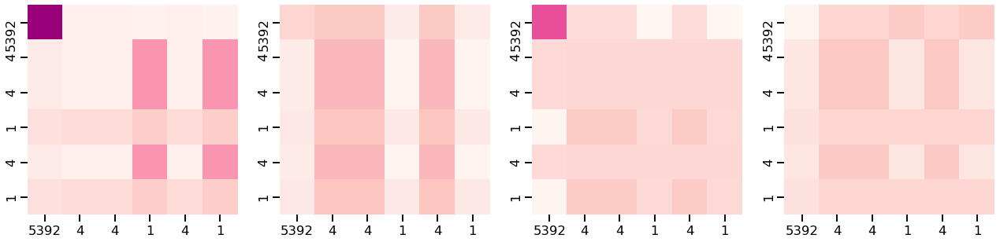

Encoder Layer 2


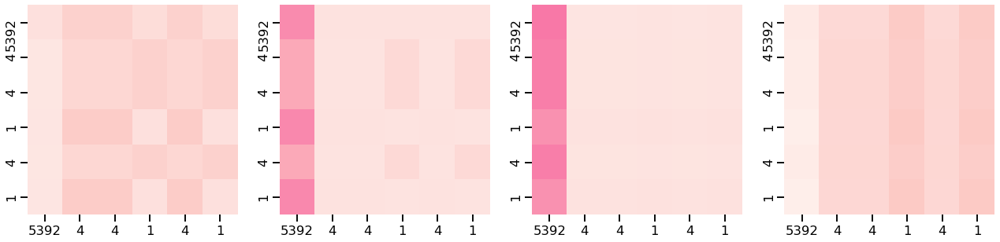



Ejemplo de tweet con label  support  y Tw_id  769993008896995328
Encoder Layer 1


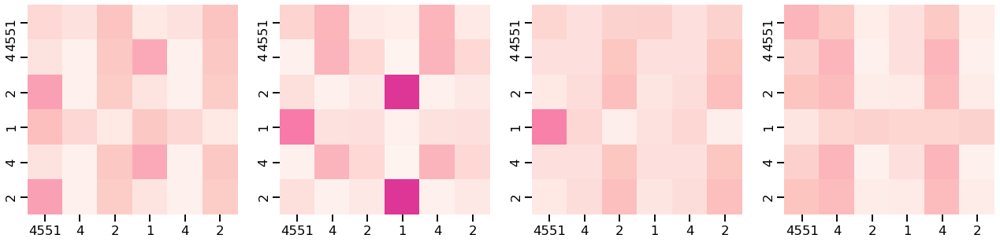

Encoder Layer 2


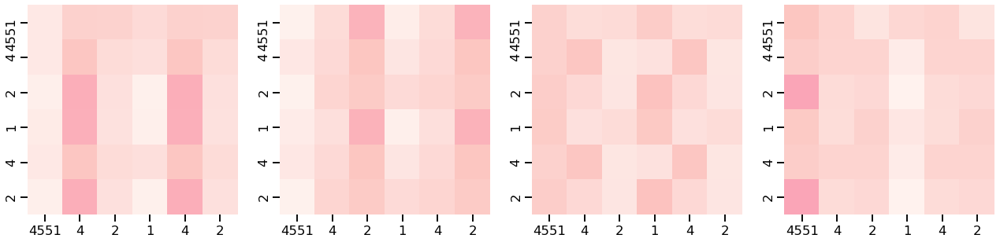



Ejemplo de tweet con label  denying  y Tw_id  498546719244578817
Encoder Layer 1


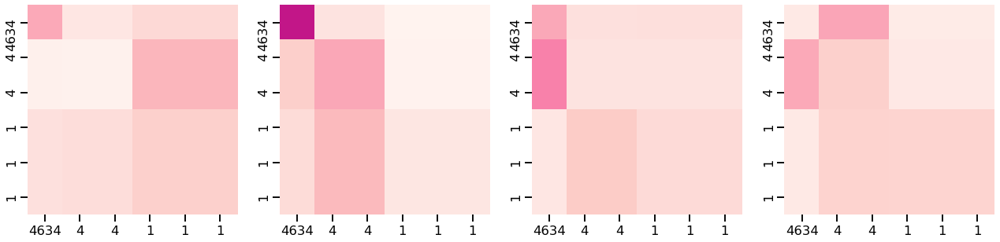

Encoder Layer 2


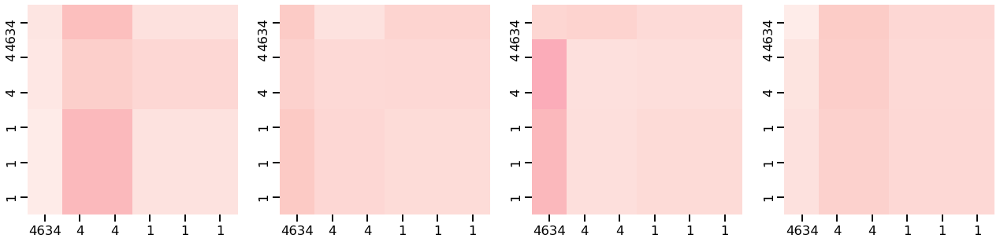



Ejemplo de tweet con label  questioning  y Tw_id  581297818528141313
Encoder Layer 1


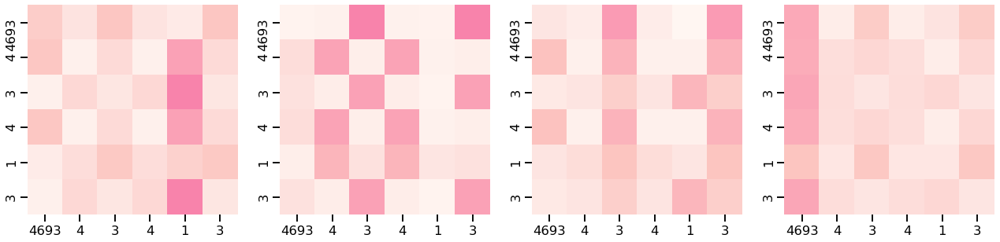

Encoder Layer 2


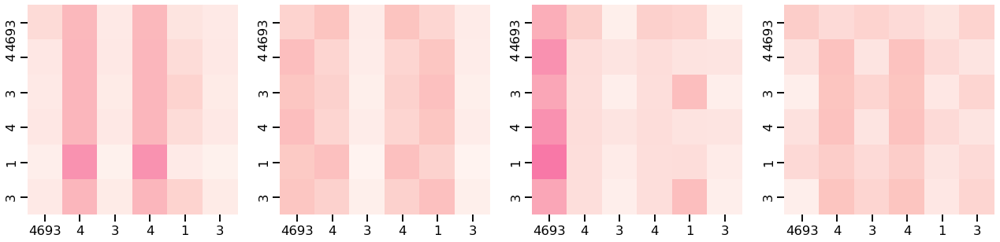

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.208 	F-macro_val: 0.184
Epoch 10 	acc_val: 0.670 	F-macro_val: 0.530
Epoch 20 	acc_val: 0.649 	F-macro_val: 0.510
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


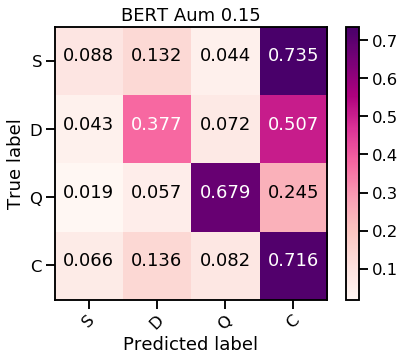

Test_ acc: 0.6474045053868757
Test_ f1 none: [0.092 0.241 0.576 0.77 ]
Test_ f1 macro: 0.4198623848872812
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.156 	F-macro_val: 0.111
Epoch 10 	acc_val: 0.632 	F-macro_val: 0.484
Epoch 20 	acc_val: 0.653 	F-macro_val: 0.498
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


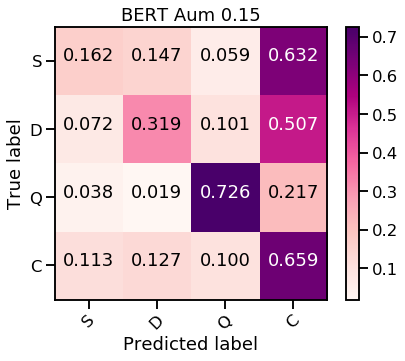

Test_ acc: 0.6101860920666013
Test_ f1 none: [0.125 0.218 0.566 0.737]
Test_ f1 macro: 0.41151680457092366
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.267 	F-macro_val: 0.186
Epoch 10 	acc_val: 0.667 	F-macro_val: 0.534
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.544
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


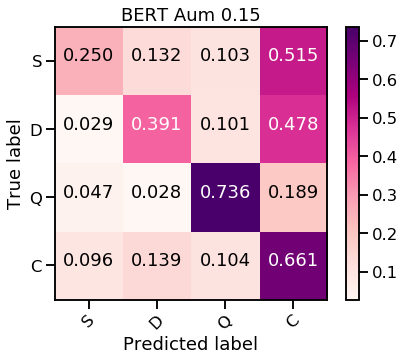

Test_ acc: 0.6229187071498531
Test_ f1 none: [0.204 0.25  0.559 0.745]
Test_ f1 macro: 0.4394150338873445
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.194 	F-macro_val: 0.152
Epoch 10 	acc_val: 0.635 	F-macro_val: 0.520
Epoch 20 	acc_val: 0.632 	F-macro_val: 0.509
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


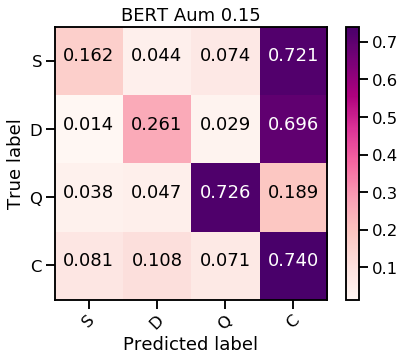

Test_ acc: 0.6679725759059746
Test_ f1 none: [0.15  0.201 0.629 0.783]
Test_ f1 macro: 0.4406223328877483


Ejemplo de tweet con label  commenting  y Tw_id  767741947763167232
Encoder Layer 1


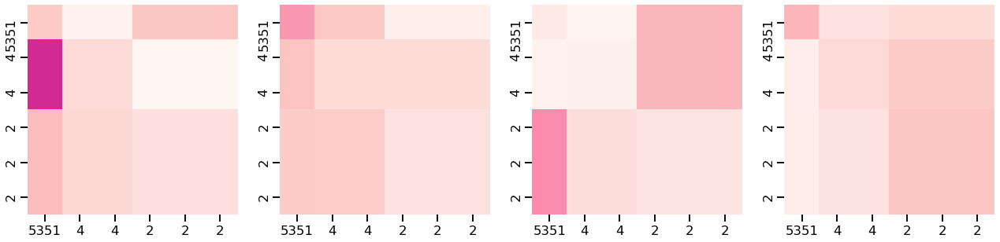

Encoder Layer 2


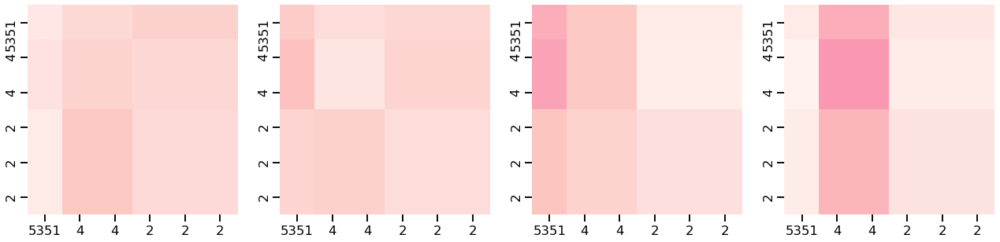



Ejemplo de tweet con label  support  y Tw_id  775075528554389504
Encoder Layer 1


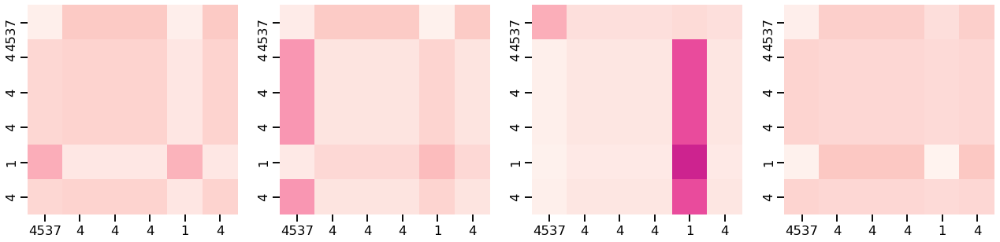

Encoder Layer 2


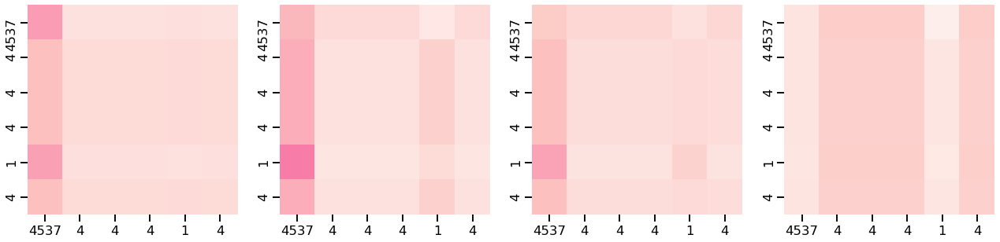



Ejemplo de tweet con label  denying  y Tw_id  765612220860370944
Encoder Layer 1


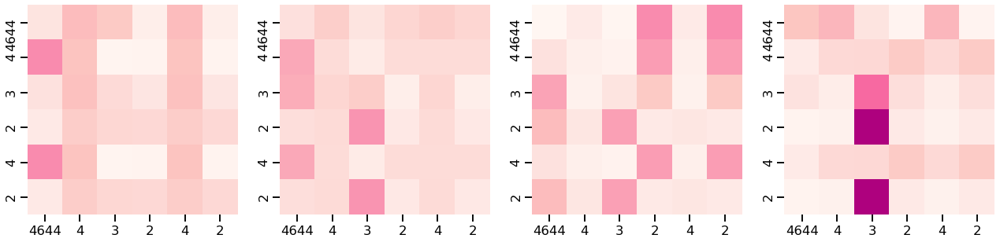

Encoder Layer 2


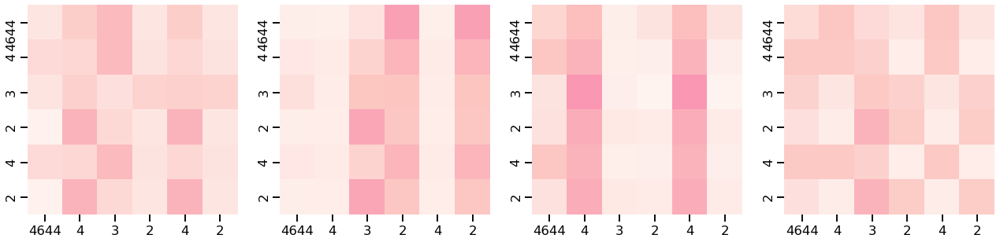



Ejemplo de tweet con label  questioning  y Tw_id  553561561139535872
Encoder Layer 1


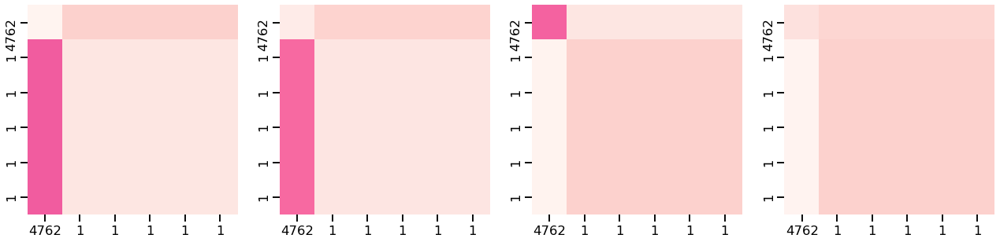

Encoder Layer 2


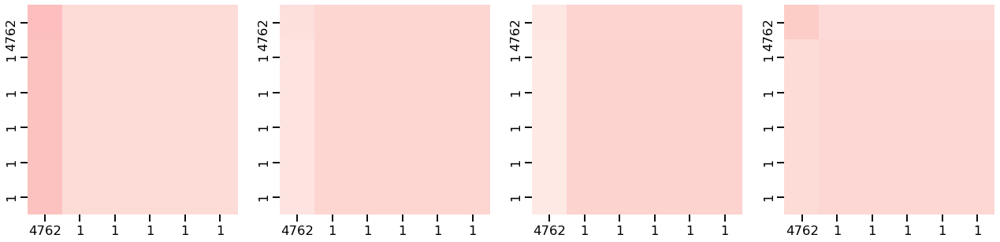

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.087 	F-macro_val: 0.078
Epoch 10 	acc_val: 0.653 	F-macro_val: 0.490
Epoch 20 	acc_val: 0.681 	F-macro_val: 0.504
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


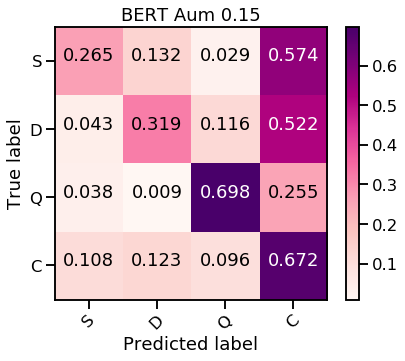

Test_ acc: 0.623898139079334
Test_ f1 none: [0.203 0.223 0.558 0.746]
Test_ f1 macro: 0.4326939776275309
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.208 	F-macro_val: 0.134
Epoch 10 	acc_val: 0.674 	F-macro_val: 0.523
Epoch 20 	acc_val: 0.667 	F-macro_val: 0.514
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


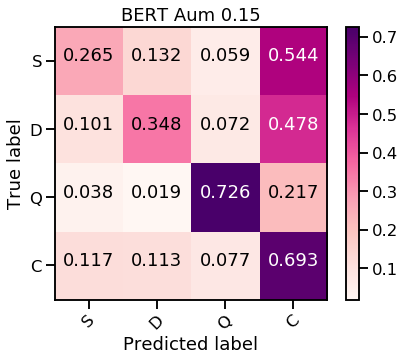

Test_ acc: 0.6444662095984329
Test_ f1 none: [0.191 0.25  0.611 0.765]
Test_ f1 macro: 0.4542848699763593


Ejemplo de tweet con label  commenting  y Tw_id  758424568260333570
Encoder Layer 1


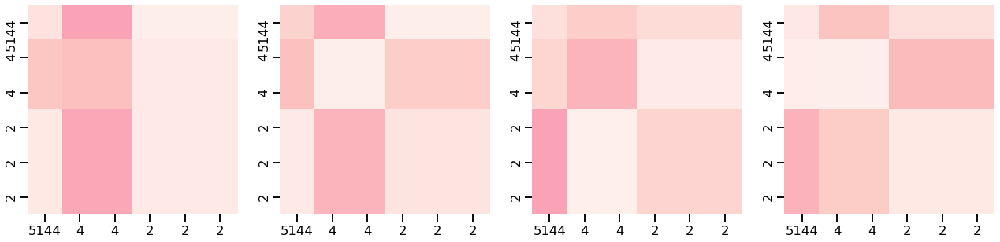

Encoder Layer 2


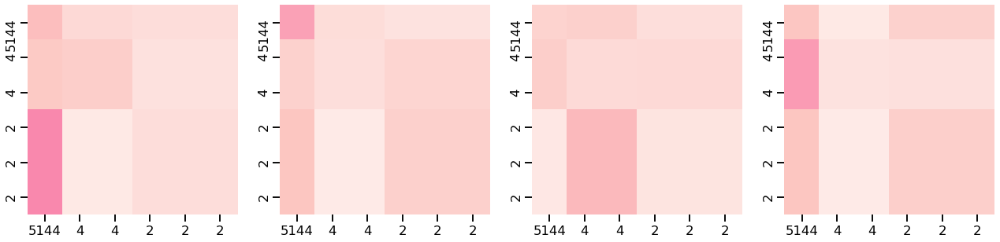



Ejemplo de tweet con label  support  y Tw_id  553574606259625984
Encoder Layer 1


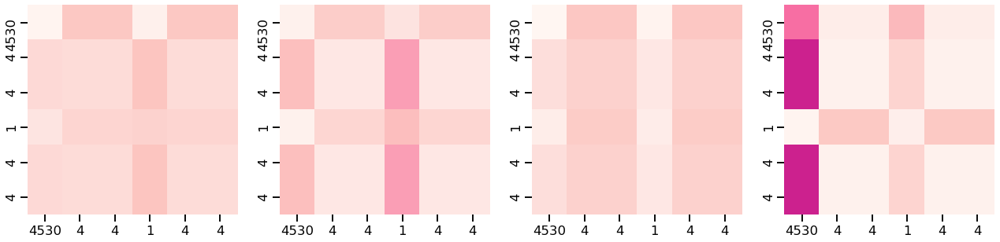

Encoder Layer 2


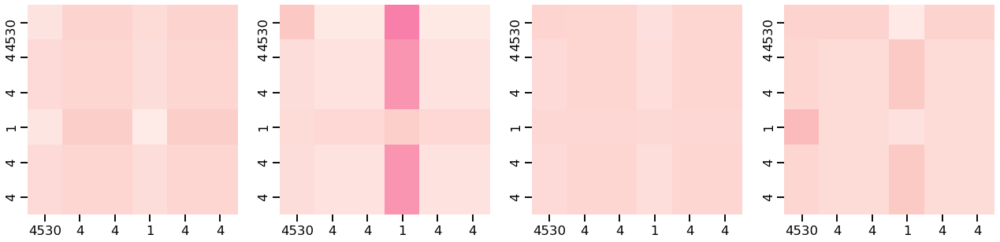



Ejemplo de tweet con label  denying  y Tw_id  767745760570044416
Encoder Layer 1


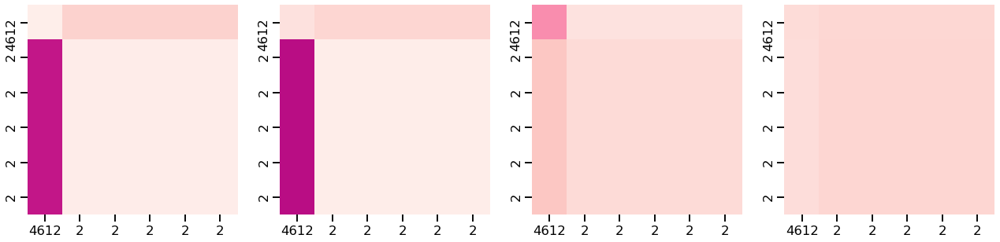

Encoder Layer 2


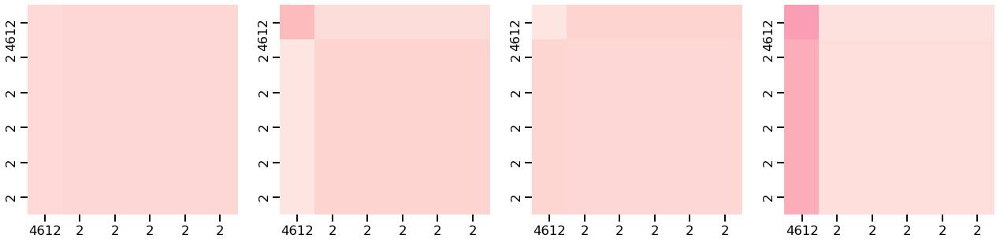



Ejemplo de tweet con label  questioning  y Tw_id  758346105415344128
Encoder Layer 1


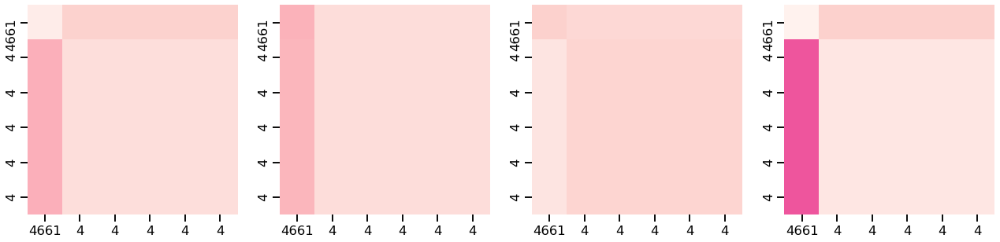

Encoder Layer 2


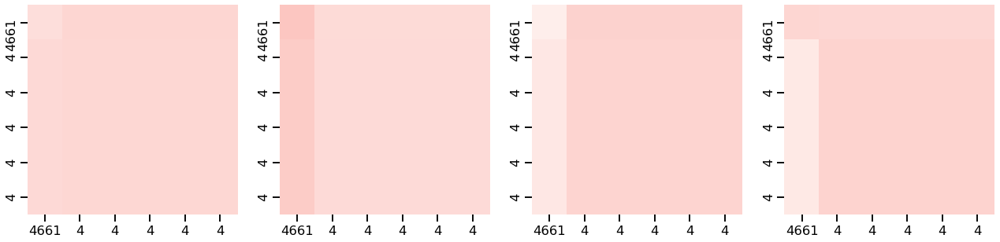

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.250 	F-macro_val: 0.230
Epoch 10 	acc_val: 0.642 	F-macro_val: 0.482
Epoch 20 	acc_val: 0.660 	F-macro_val: 0.502
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


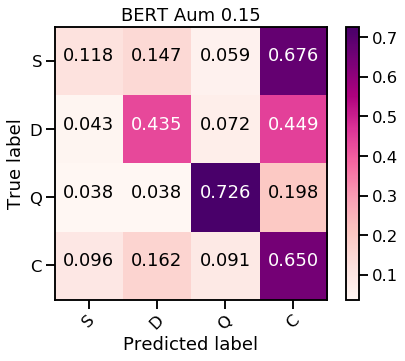

Test_ acc: 0.6082272282076395
Test_ f1 none: [0.101 0.251 0.586 0.732]
Test_ f1 macro: 0.41753381203810896
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.385 	F-macro_val: 0.318
Epoch 10 	acc_val: 0.670 	F-macro_val: 0.483
Epoch 20 	acc_val: 0.681 	F-macro_val: 0.490
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


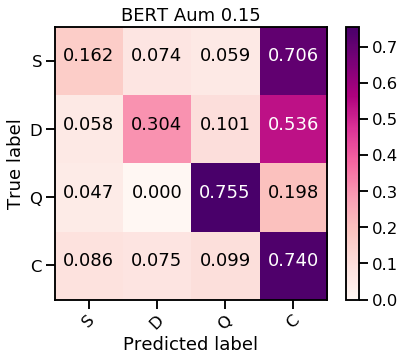

Test_ acc: 0.67384916748286
Test_ f1 none: [0.142 0.275 0.584 0.789]
Test_ f1 macro: 0.4473569973805909
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 11
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.181 	F-macro_val: 0.119
Epoch 10 	acc_val: 0.660 	F-macro_val: 0.479
Epoch 20 	acc_val: 0.660 	F-macro_val: 0.518
Testing run # 11
SE TUVIERON QUE REPETIR 3 EJEMPLOS


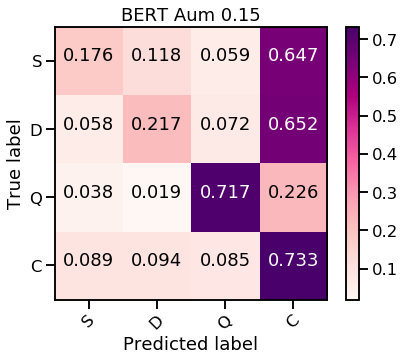

Test_ acc: 0.6591576885406464
Test_ f1 none: [0.153 0.18  0.591 0.78 ]
Test_ f1 macro: 0.4260585309124232
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 12
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.292 	F-macro_val: 0.200
Epoch 10 	acc_val: 0.660 	F-macro_val: 0.521
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.561
Testing run # 12
SE TUVIERON QUE REPETIR 3 EJEMPLOS


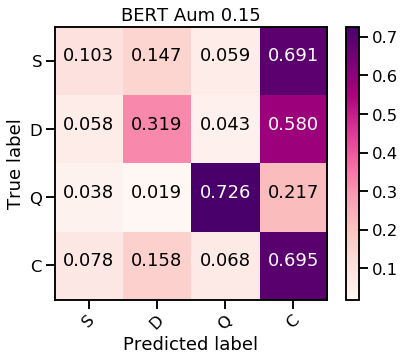

Test_ acc: 0.633692458374143
Test_ f1 none: [0.097 0.195 0.634 0.757]
Test_ f1 macro: 0.42070754795539567
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 13
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.292 	F-macro_val: 0.181
Epoch 10 	acc_val: 0.677 	F-macro_val: 0.486
Epoch 20 	acc_val: 0.656 	F-macro_val: 0.490
Testing run # 13
SE TUVIERON QUE REPETIR 3 EJEMPLOS


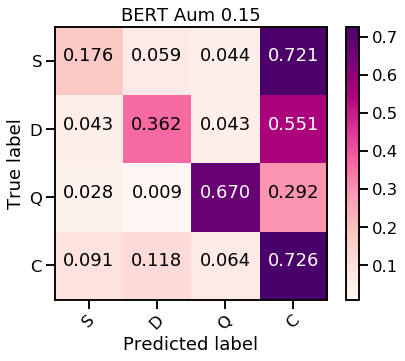

Test_ acc: 0.6591576885406464
Test_ f1 none: [0.153 0.262 0.609 0.773]
Test_ f1 macro: 0.44938281355022847
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 14
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.222 	F-macro_val: 0.169
Epoch 10 	acc_val: 0.642 	F-macro_val: 0.473
Epoch 20 	acc_val: 0.660 	F-macro_val: 0.478
Testing run # 14
SE TUVIERON QUE REPETIR 3 EJEMPLOS


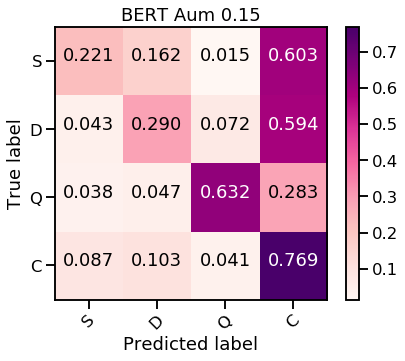

Test_ acc: 0.6856023506366308
Test_ f1 none: [0.19  0.216 0.635 0.804]
Test_ f1 macro: 0.46123104121133596


Ejemplo de tweet con label  commenting  y Tw_id  524962170166317056
Encoder Layer 1


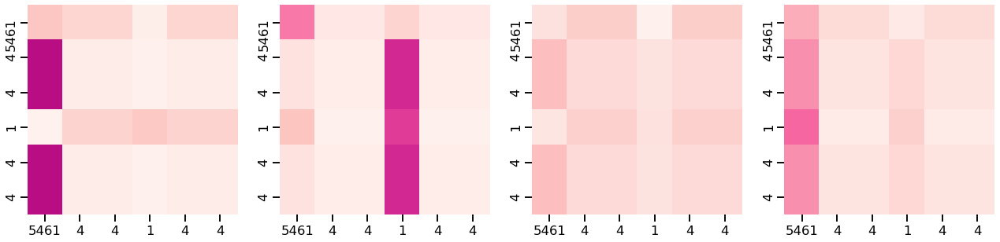

Encoder Layer 2


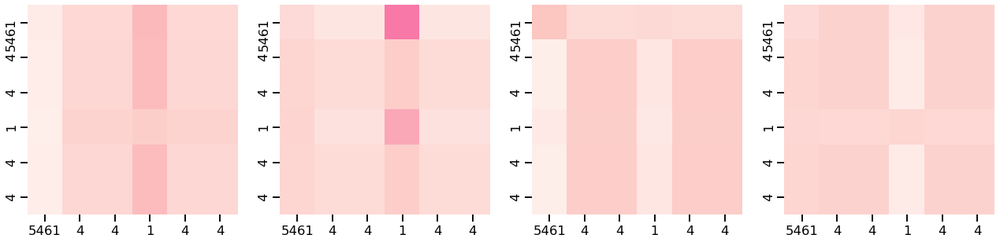



Ejemplo de tweet con label  support  y Tw_id  767727622046511104
Encoder Layer 1


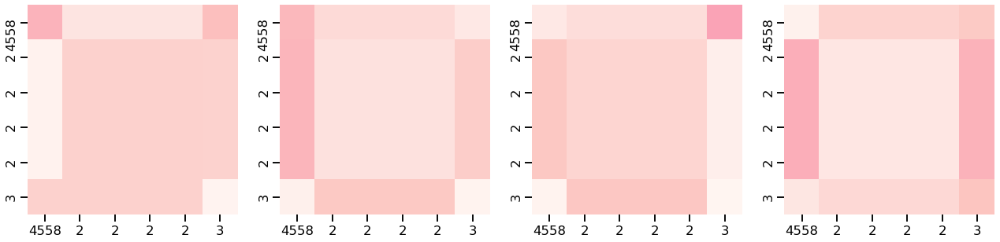

Encoder Layer 2


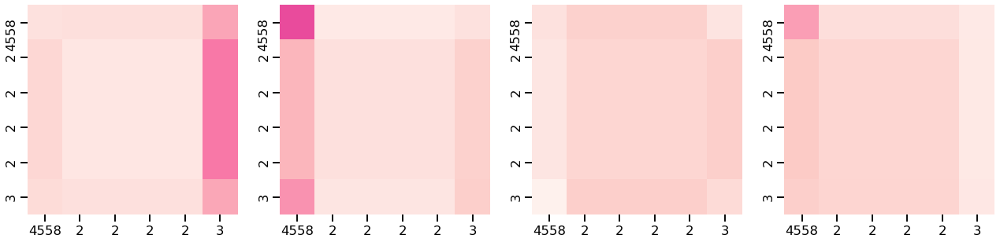



Ejemplo de tweet con label  denying  y Tw_id  765171900683161601
Encoder Layer 1


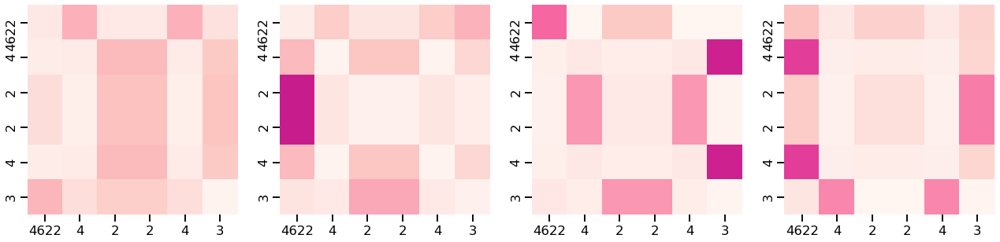

Encoder Layer 2


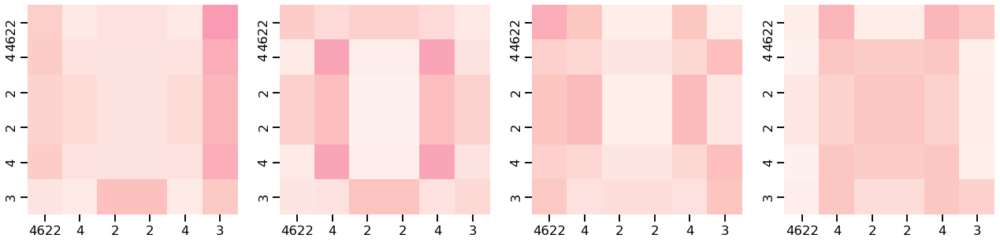



Ejemplo de tweet con label  questioning  y Tw_id  524948710942588928
Encoder Layer 1


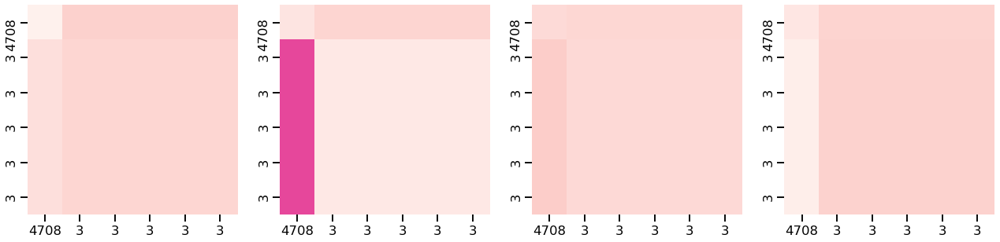

Encoder Layer 2


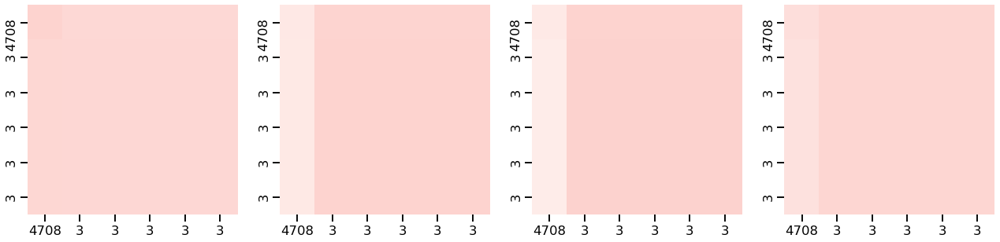

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 15
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.135 	F-macro_val: 0.127
Epoch 10 	acc_val: 0.642 	F-macro_val: 0.520
Epoch 20 	acc_val: 0.656 	F-macro_val: 0.531
Testing run # 15
SE TUVIERON QUE REPETIR 3 EJEMPLOS


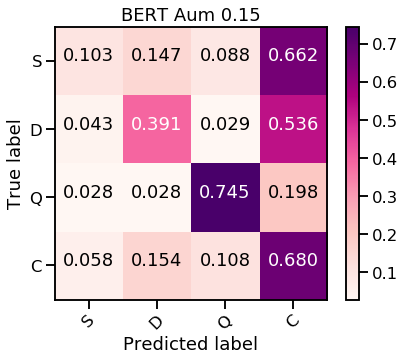

Test_ acc: 0.6287952987267384
Test_ f1 none: [0.111 0.236 0.57  0.75 ]
Test_ f1 macro: 0.4169176733038888
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 16
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.240 	F-macro_val: 0.162
Epoch 10 	acc_val: 0.625 	F-macro_val: 0.472
Epoch 20 	acc_val: 0.656 	F-macro_val: 0.482
Testing run # 16
SE TUVIERON QUE REPETIR 3 EJEMPLOS


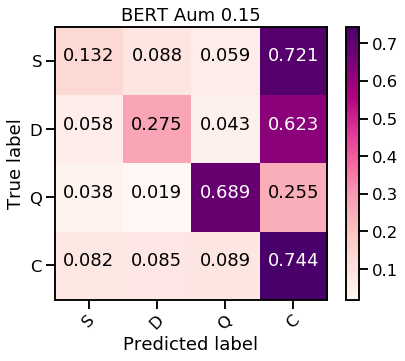

Test_ acc: 0.6660137120470128
Test_ f1 none: [0.121 0.235 0.573 0.785]
Test_ f1 macro: 0.4281187838745958
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 17
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.108 	F-macro_val: 0.090
Epoch 10 	acc_val: 0.642 	F-macro_val: 0.488
Epoch 20 	acc_val: 0.642 	F-macro_val: 0.489
Testing run # 17
SE TUVIERON QUE REPETIR 3 EJEMPLOS


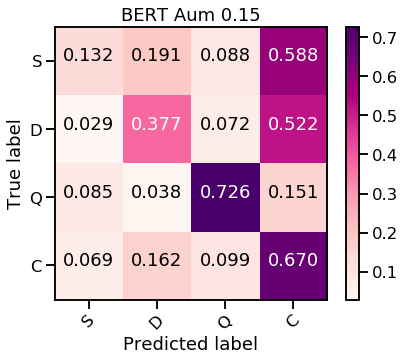

Test_ acc: 0.6199804113614104
Test_ f1 none: [0.127 0.218 0.568 0.749]
Test_ f1 macro: 0.41565375172972185
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 18
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.226 	F-macro_val: 0.144
Epoch 10 	acc_val: 0.694 	F-macro_val: 0.554
Epoch 20 	acc_val: 0.701 	F-macro_val: 0.543
Testing run # 18
SE TUVIERON QUE REPETIR 3 EJEMPLOS


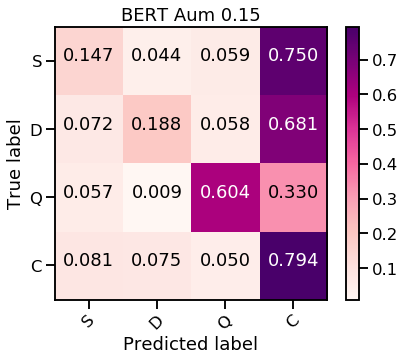

Test_ acc: 0.6904995102840352
Test_ f1 none: [0.132 0.181 0.59  0.808]
Test_ f1 macro: 0.4275919346766319
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 19
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.101 	F-macro_val: 0.091
Epoch 10 	acc_val: 0.698 	F-macro_val: 0.549
Epoch 20 	acc_val: 0.701 	F-macro_val: 0.534
Testing run # 19
SE TUVIERON QUE REPETIR 3 EJEMPLOS


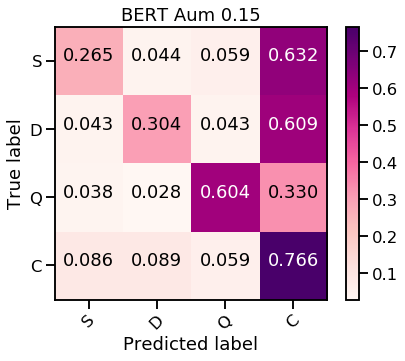

Test_ acc: 0.6846229187071499
Test_ f1 none: [0.225 0.255 0.574 0.798]
Test_ f1 macro: 0.46284864624962685


Ejemplo de tweet con label  commenting  y Tw_id  544295899585732609
Encoder Layer 1


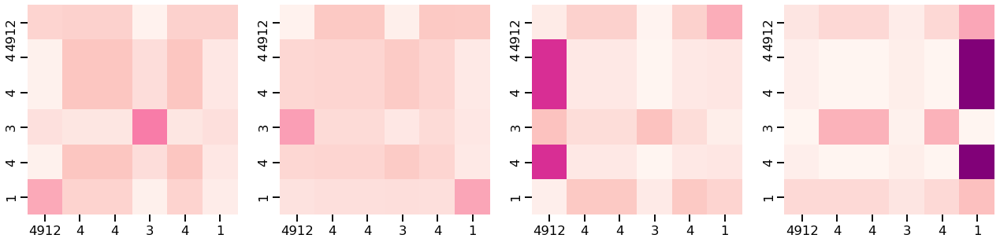

Encoder Layer 2


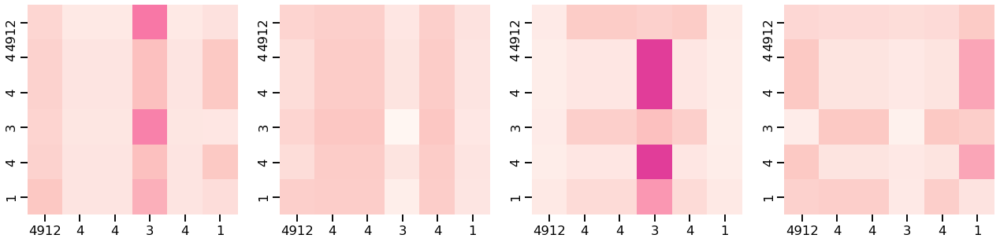



Ejemplo de tweet con label  support  y Tw_id  774992054883540992
Encoder Layer 1


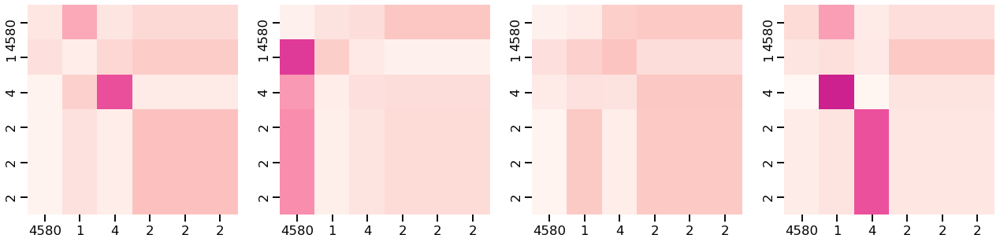

Encoder Layer 2


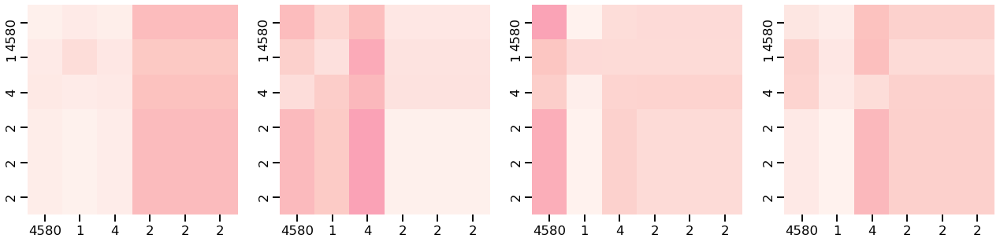



Ejemplo de tweet con label  denying  y Tw_id  764944029922590720
Encoder Layer 1


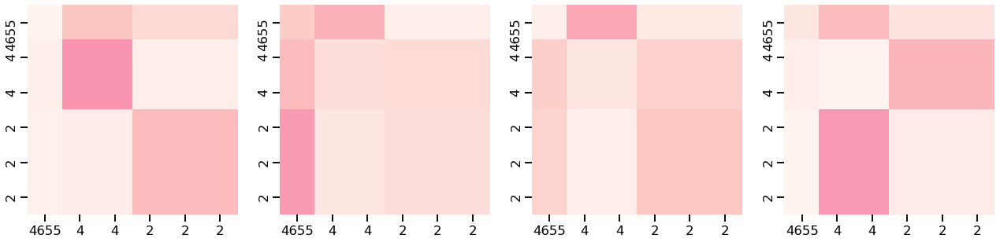

Encoder Layer 2


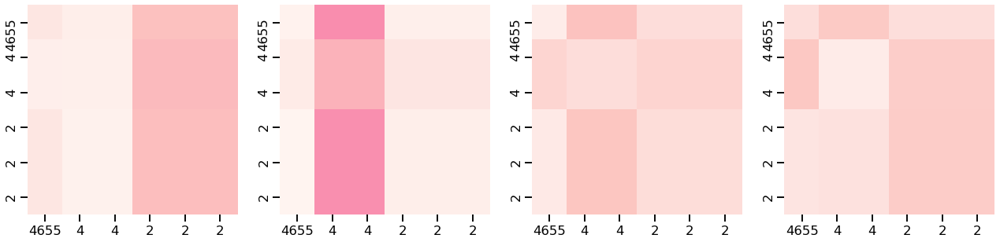



Ejemplo de tweet con label  questioning  y Tw_id  581363347041460224
Encoder Layer 1


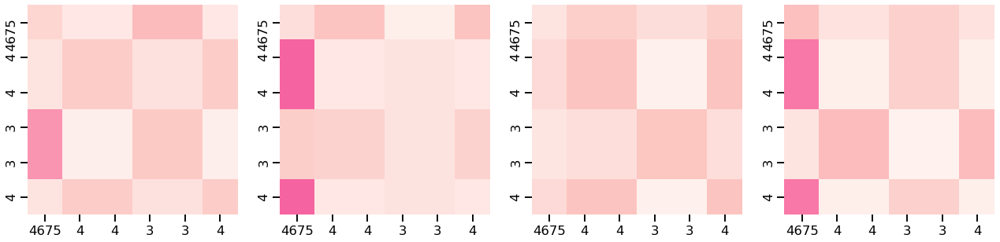

Encoder Layer 2


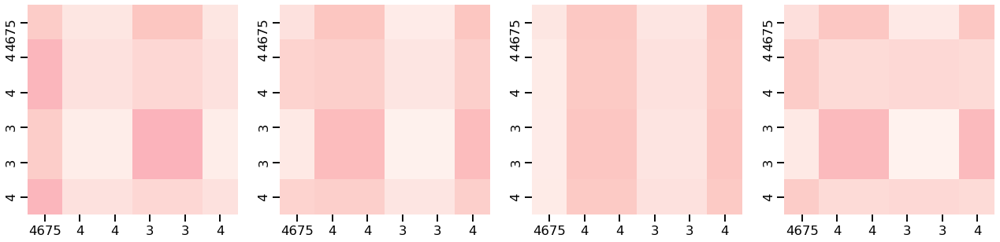

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 20
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.087 	F-macro_val: 0.075
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.541
Epoch 20 	acc_val: 0.670 	F-macro_val: 0.525
Testing run # 20
SE TUVIERON QUE REPETIR 3 EJEMPLOS


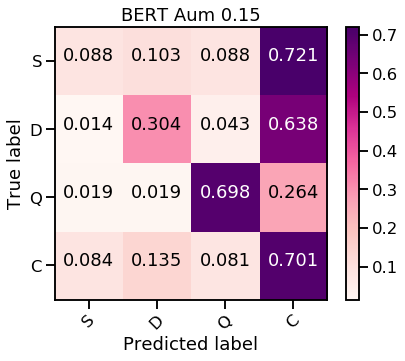

Test_ acc: 0.6327130264446621
Test_ f1 none: [0.085 0.206 0.587 0.755]
Test_ f1 macro: 0.40813465698141194


In [32]:
best_50, all_accs_50, all_fno_50, all_ma_50, all_cm_50 =train_transformer(0.5, 30, path_a, path_m, "RdPu")

In [33]:
print ("best_50", best_50)
print ("all_accs_50", all_accs_50)
print ("all_fno_50", all_fno_50)
print ("all_ma_50", all_ma_50)

best_50 {'F_ma': 0.46284864624962685, 'Run': 19}
all_accs_50 [0.6415279138099902, 0.6640548481880509, 0.6474045053868757, 0.6101860920666013, 0.6229187071498531, 0.6679725759059746, 0.623898139079334, 0.6444662095984329, 0.6082272282076395, 0.67384916748286, 0.6591576885406464, 0.633692458374143, 0.6591576885406464, 0.6856023506366308, 0.6287952987267384, 0.6660137120470128, 0.6199804113614104, 0.6904995102840352, 0.6846229187071499, 0.6327130264446621]
all_fno_50 [array([0.168, 0.222, 0.584, 0.765]), array([0.109, 0.256, 0.611, 0.783]), array([0.092, 0.241, 0.576, 0.77 ]), array([0.125, 0.218, 0.566, 0.737]), array([0.204, 0.25 , 0.559, 0.745]), array([0.15 , 0.201, 0.629, 0.783]), array([0.203, 0.223, 0.558, 0.746]), array([0.191, 0.25 , 0.611, 0.765]), array([0.101, 0.251, 0.586, 0.732]), array([0.142, 0.275, 0.584, 0.789]), array([0.153, 0.18 , 0.591, 0.78 ]), array([0.097, 0.195, 0.634, 0.757]), array([0.153, 0.262, 0.609, 0.773]), array([0.19 , 0.216, 0.635, 0.804]), array([0.111

Acc: 0.648 -- deviation: 0.025
F-score: 0.433 -- deviation: 0.016
(0.5) SDQC: 0.14389087498253855 0.2284696113647537 0.5897791212683615 0.7687147808534674


Confusion counts
[[  226.   158.    85.   891.]
 [   70.   447.    89.   774.]
 [   81.    53.  1482.   504.]
 [ 1350.  1869.  1259. 11082.]]


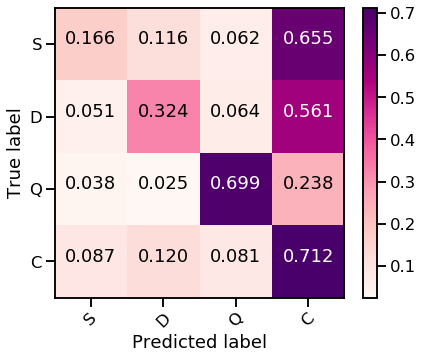

In [34]:
#best_15, all_accs, all_fno, all_ma, all_cm
print ("Acc: %.3f" % np.mean(np.asarray(all_accs_50)), "-- deviation: %.3f" % np.std(np.asarray(all_accs_50)))
print ("F-score: %.3f" % np.mean(np.asarray(all_ma_50)), "-- deviation: %.3f" % np.std(np.asarray(all_ma_50)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(all_fno_50)[:,0])
den=np.mean(np.asarray(all_fno_50)[:,1])
que=np.mean(np.asarray(all_fno_50)[:,2])
com=np.mean(np.asarray(all_fno_50)[:,3])

print ("(0.5) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in all_cm_50:
    m_temp+=np.asarray(m)
    
print (m_temp)

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='RdPu')

## 0.85 -- 10 run

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.535 	F-macro_val: 0.265
Epoch 10 	acc_val: 0.705 	F-macro_val: 0.516
Epoch 20 	acc_val: 0.708 	F-macro_val: 0.526
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


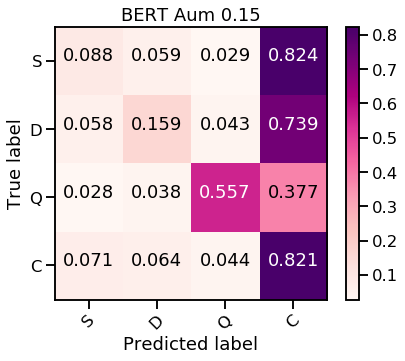

Test_ acc: 0.7002938295788442
Test_ f1 none: [0.088 0.159 0.578 0.817]
Test_ f1 macro: 0.4108056265984654


Ejemplo de tweet con label  commenting  y Tw_id  767728097928052736
Encoder Layer 1


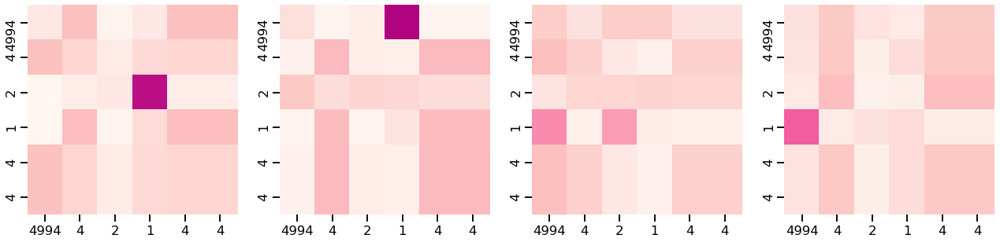

Encoder Layer 2


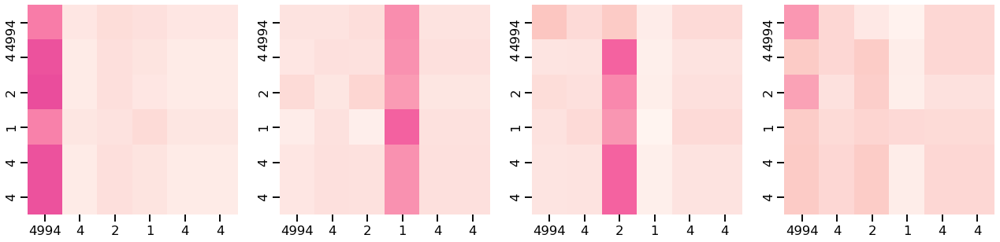



Ejemplo de tweet con label  support  y Tw_id  544275255163125760
Encoder Layer 1


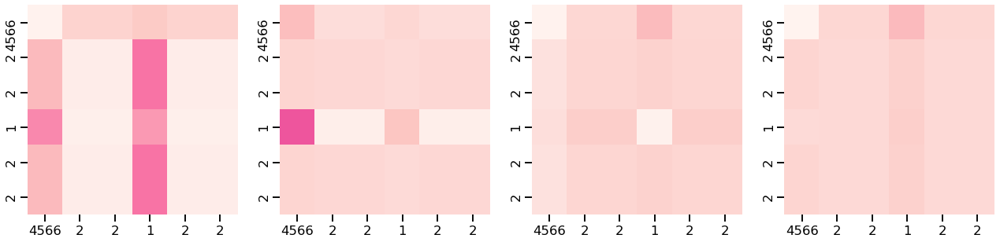

Encoder Layer 2


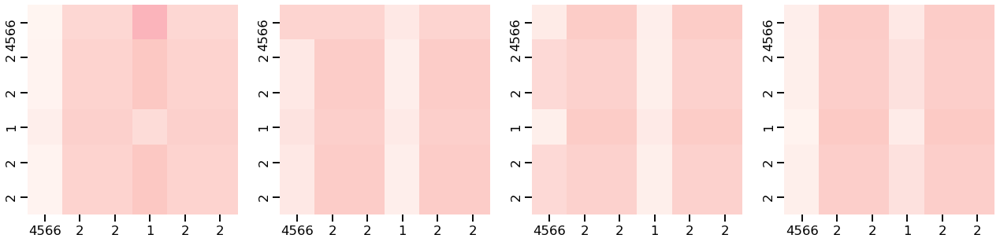



Ejemplo de tweet con label  denying  y Tw_id  764958204493176832
Encoder Layer 1


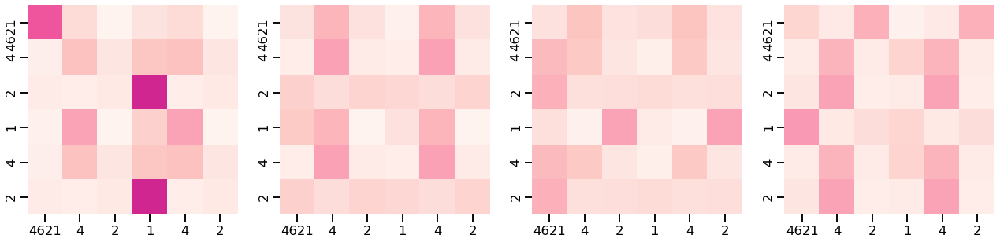

Encoder Layer 2


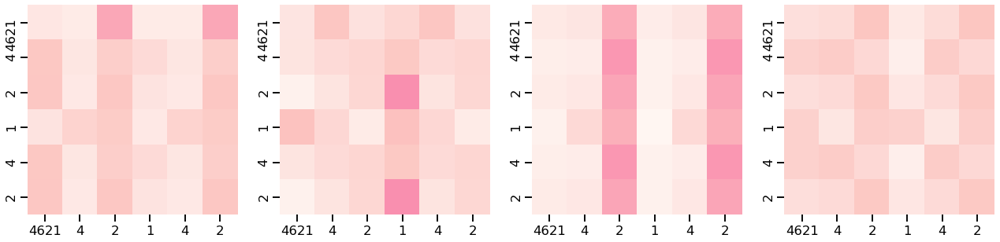



Ejemplo de tweet con label  questioning  y Tw_id  768313868175089664
Encoder Layer 1


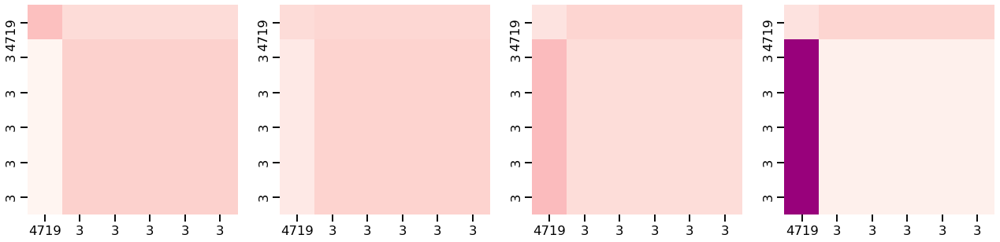

Encoder Layer 2


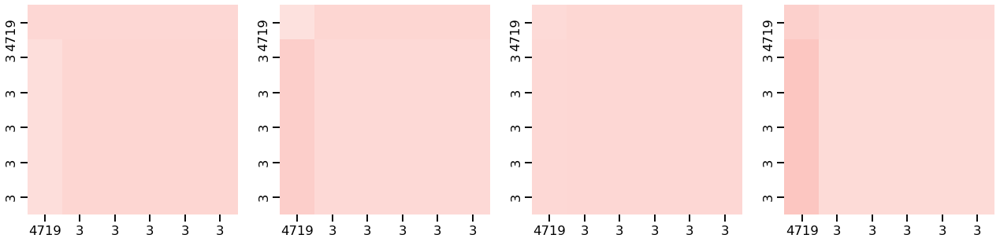

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.226 	F-macro_val: 0.139
Epoch 10 	acc_val: 0.681 	F-macro_val: 0.502
Epoch 20 	acc_val: 0.688 	F-macro_val: 0.501
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


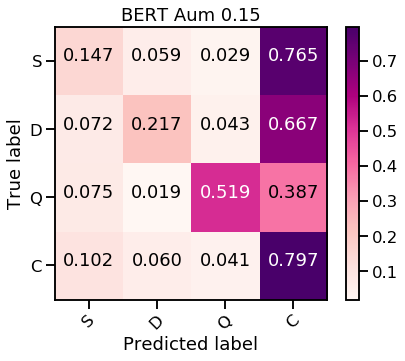

Test_ acc: 0.6856023506366308
Test_ f1 none: [0.118 0.219 0.556 0.807]
Test_ f1 macro: 0.4247367861688918


Ejemplo de tweet con label  commenting  y Tw_id  770234243356233728
Encoder Layer 1


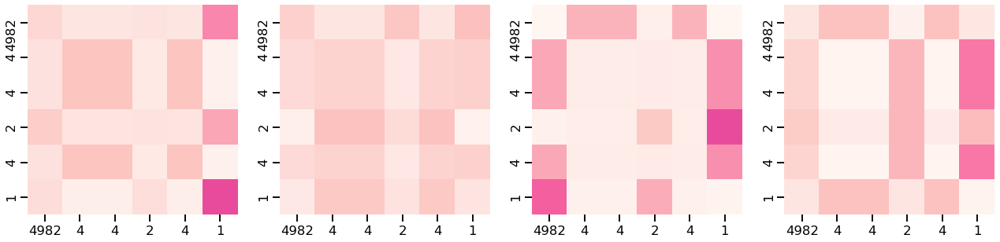

Encoder Layer 2


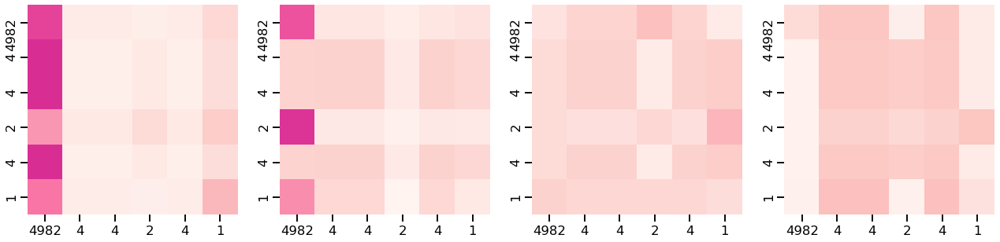



Ejemplo de tweet con label  support  y Tw_id  498298019045847040
Encoder Layer 1


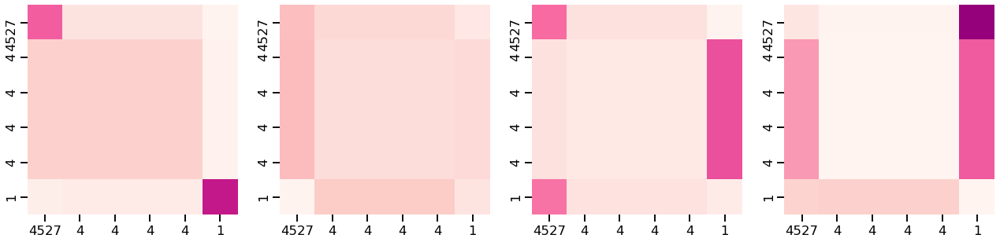

Encoder Layer 2


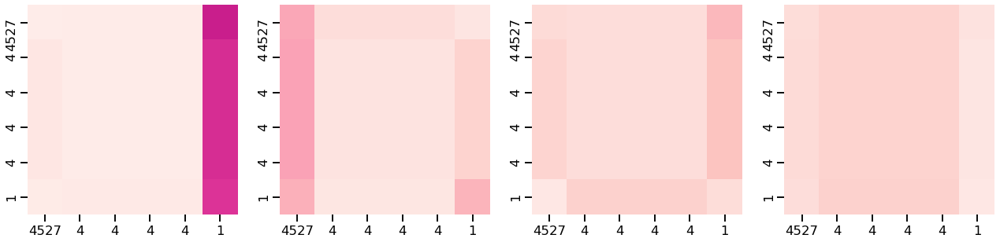



Ejemplo de tweet con label  denying  y Tw_id  770304212844613632
Encoder Layer 1


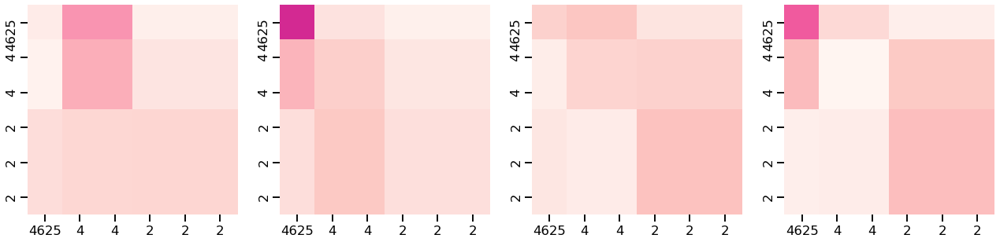

Encoder Layer 2


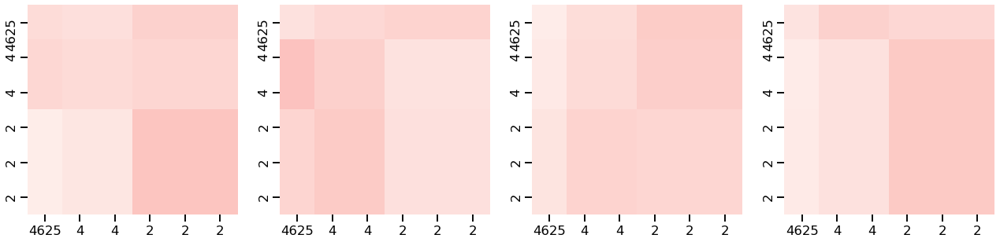



Ejemplo de tweet con label  questioning  y Tw_id  553561563710644224
Encoder Layer 1


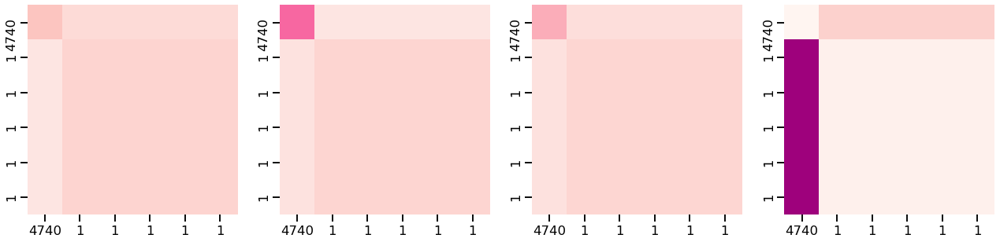

Encoder Layer 2


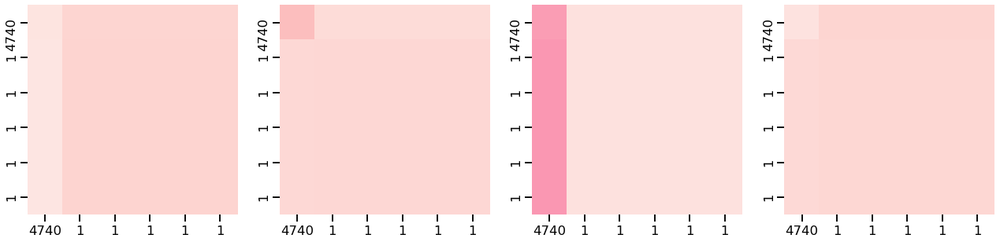

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.219 	F-macro_val: 0.181
Epoch 10 	acc_val: 0.663 	F-macro_val: 0.515
Epoch 20 	acc_val: 0.681 	F-macro_val: 0.519
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


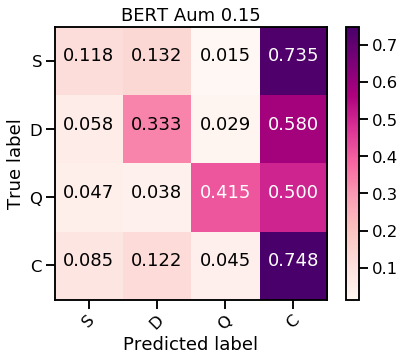

Test_ acc: 0.643486777668952
Test_ f1 none: [0.106 0.23  0.468 0.774]
Test_ f1 macro: 0.3946241172720081
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.253 	F-macro_val: 0.172
Epoch 10 	acc_val: 0.681 	F-macro_val: 0.512
Epoch 20 	acc_val: 0.684 	F-macro_val: 0.518
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


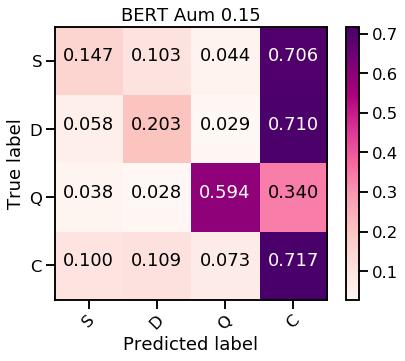

Test_ acc: 0.6317335945151812
Test_ f1 none: [0.122 0.157 0.545 0.76 ]
Test_ f1 macro: 0.3961024030669733
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.236 	F-macro_val: 0.177
Epoch 10 	acc_val: 0.691 	F-macro_val: 0.513
Epoch 20 	acc_val: 0.688 	F-macro_val: 0.515
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


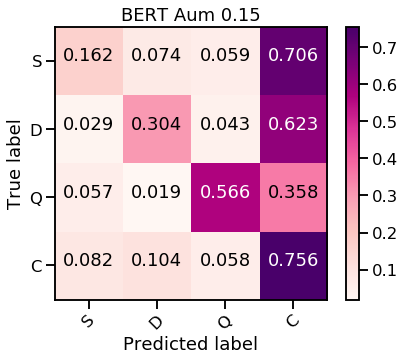

Test_ acc: 0.6660137120470128
Test_ f1 none: [0.146 0.236 0.55  0.787]
Test_ f1 macro: 0.42968280239827783


Ejemplo de tweet con label  commenting  y Tw_id  764951944934731776
Encoder Layer 1


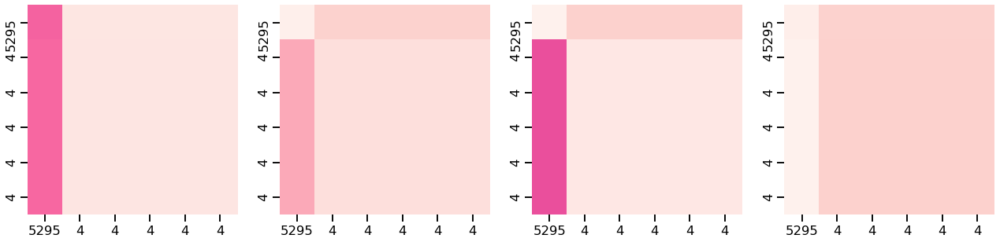

Encoder Layer 2


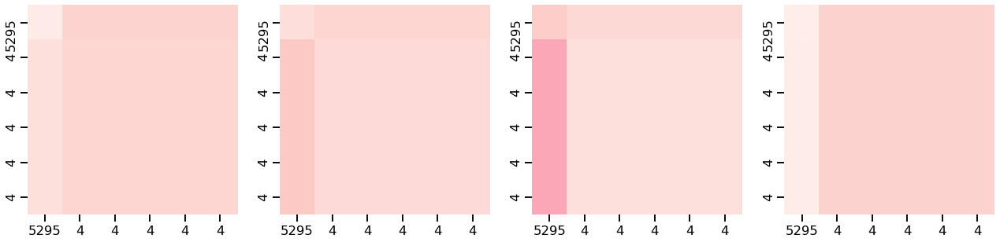



Ejemplo de tweet con label  support  y Tw_id  581290541645635584
Encoder Layer 1


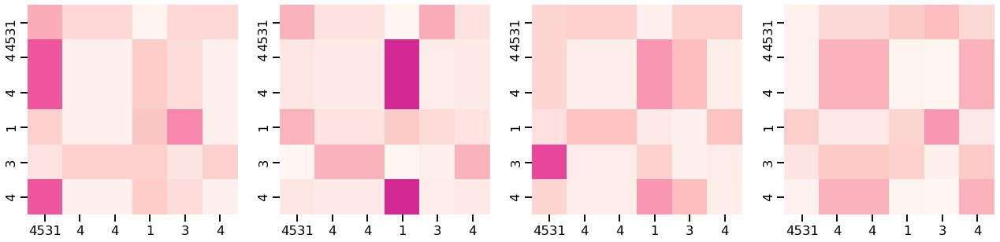

Encoder Layer 2


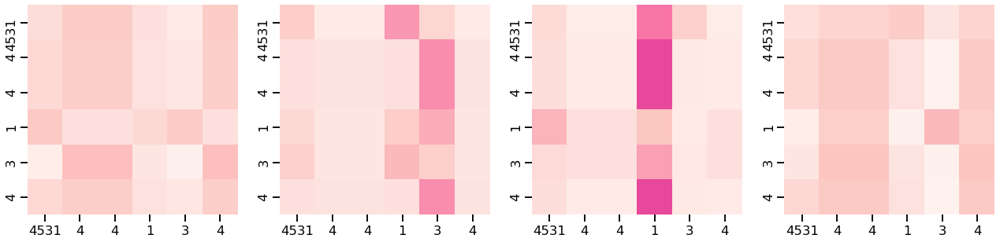



Ejemplo de tweet con label  denying  y Tw_id  769989019627290624
Encoder Layer 1


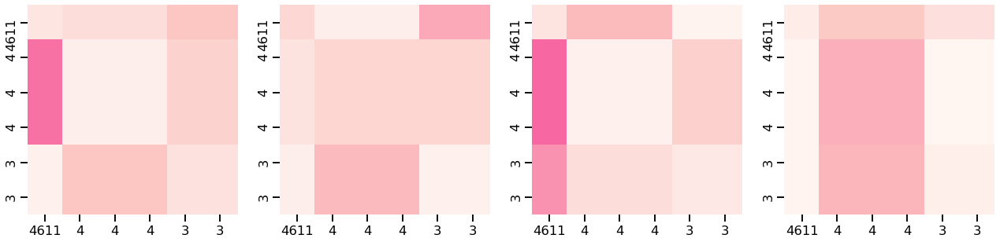

Encoder Layer 2


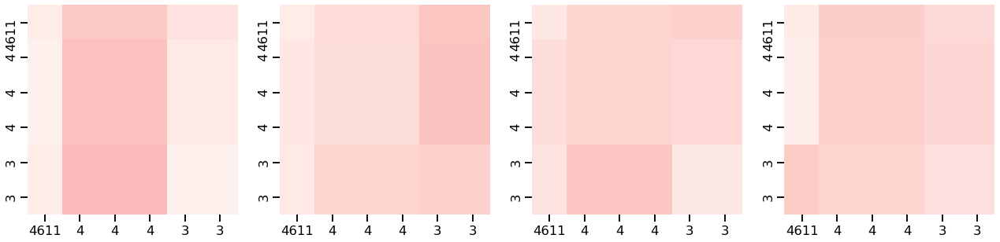



Ejemplo de tweet con label  questioning  y Tw_id  767727443398451200
Encoder Layer 1


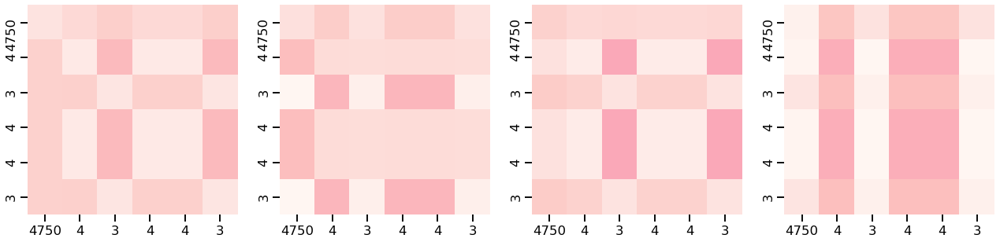

Encoder Layer 2


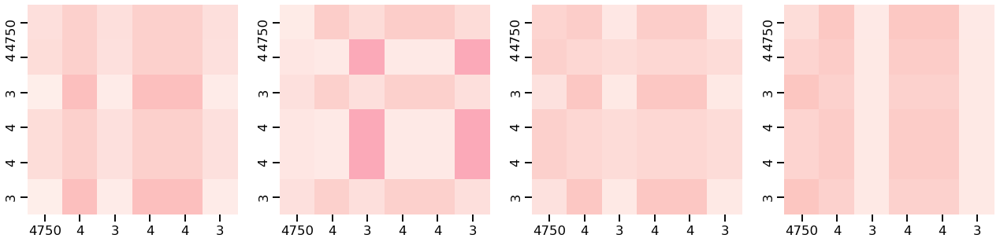

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 6
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.177 	F-macro_val: 0.147
Epoch 10 	acc_val: 0.667 	F-macro_val: 0.523
Epoch 20 	acc_val: 0.667 	F-macro_val: 0.519
Testing run # 6
SE TUVIERON QUE REPETIR 3 EJEMPLOS


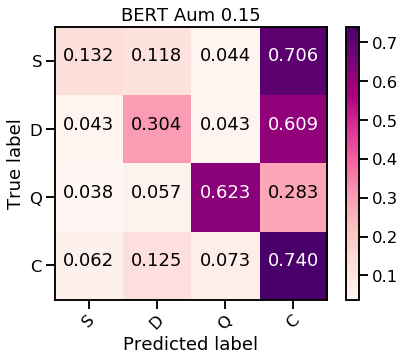

Test_ acc: 0.6581782566111655
Test_ f1 none: [0.136 0.209 0.562 0.782]
Test_ f1 macro: 0.42214194982534137
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 7
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.208 	F-macro_val: 0.154
Epoch 10 	acc_val: 0.694 	F-macro_val: 0.545
Epoch 20 	acc_val: 0.705 	F-macro_val: 0.540
Testing run # 7
SE TUVIERON QUE REPETIR 3 EJEMPLOS


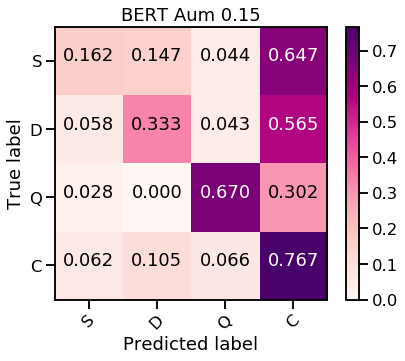

Test_ acc: 0.6875612144955926
Test_ f1 none: [0.164 0.25  0.607 0.801]
Test_ f1 macro: 0.4555897482986033


Ejemplo de tweet con label  commenting  y Tw_id  775084898595987457
Encoder Layer 1


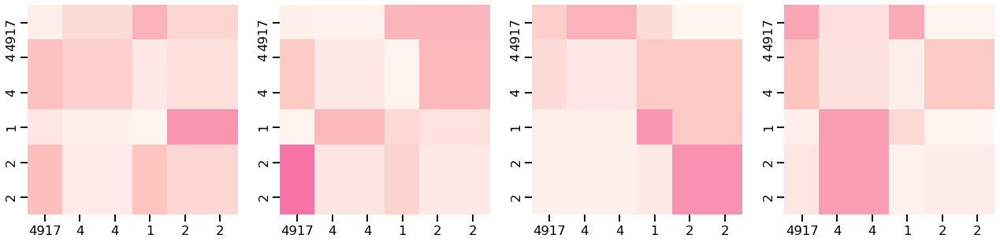

Encoder Layer 2


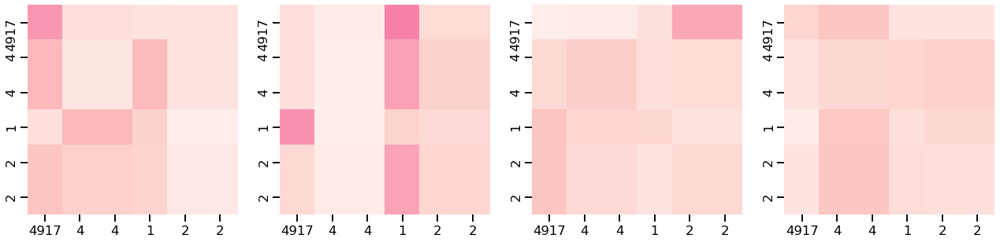



Ejemplo de tweet con label  support  y Tw_id  775075528554389504
Encoder Layer 1


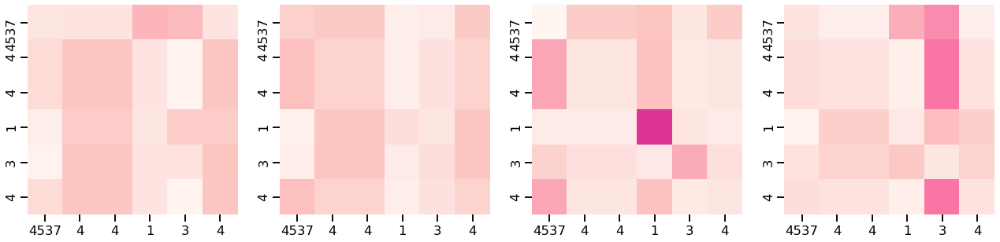

Encoder Layer 2


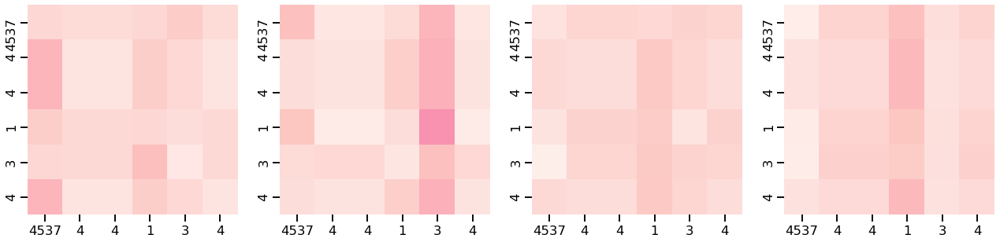



Ejemplo de tweet con label  denying  y Tw_id  580354345935486976
Encoder Layer 1


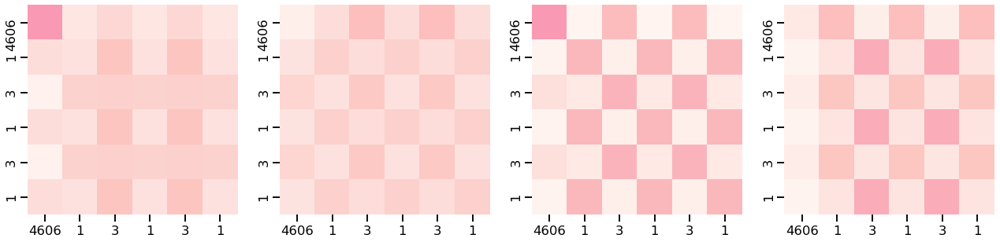

Encoder Layer 2


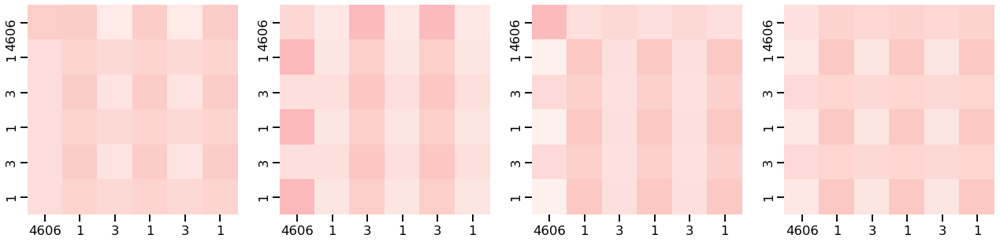



Ejemplo de tweet con label  questioning  y Tw_id  580359656750653441
Encoder Layer 1


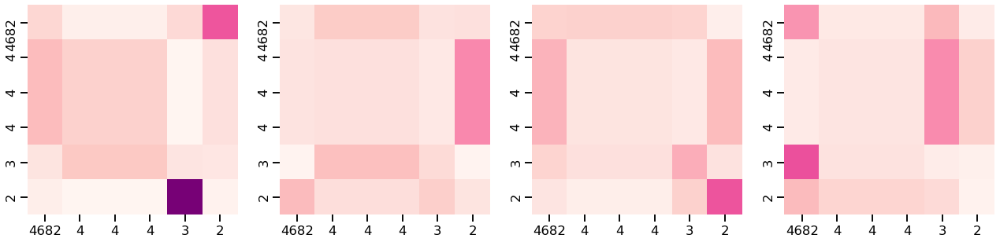

Encoder Layer 2


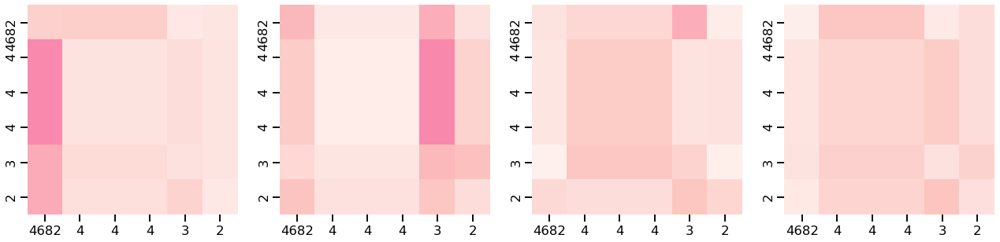

Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 8
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.198 	F-macro_val: 0.152
Epoch 10 	acc_val: 0.649 	F-macro_val: 0.484
Epoch 20 	acc_val: 0.660 	F-macro_val: 0.480
Testing run # 8
SE TUVIERON QUE REPETIR 3 EJEMPLOS


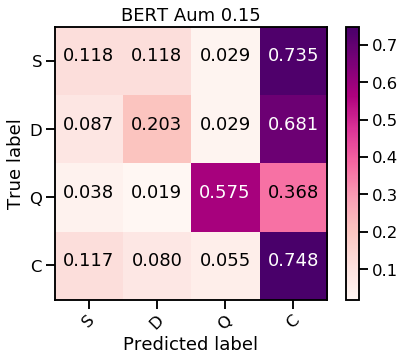

Test_ acc: 0.6513222331047992
Test_ f1 none: [0.09  0.181 0.57  0.778]
Test_ f1 macro: 0.40480224144259924
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 9
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.135 	F-macro_val: 0.150
Epoch 10 	acc_val: 0.719 	F-macro_val: 0.536
Epoch 20 	acc_val: 0.729 	F-macro_val: 0.535
Testing run # 9
SE TUVIERON QUE REPETIR 3 EJEMPLOS


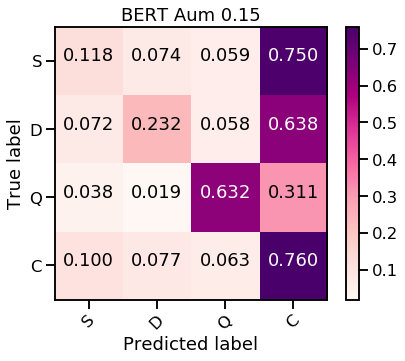

Test_ acc: 0.6679725759059746
Test_ f1 none: [0.098 0.211 0.583 0.79 ]
Test_ f1 macro: 0.4202184197401837
Pesos de clases: [1. 1. 1. 1.]
Entrenando Run # 10
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: 0.160 	F-macro_val: 0.139
Epoch 10 	acc_val: 0.688 	F-macro_val: 0.526
Epoch 20 	acc_val: 0.681 	F-macro_val: 0.535
Testing run # 10
SE TUVIERON QUE REPETIR 3 EJEMPLOS


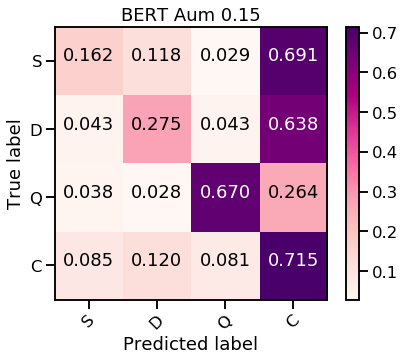

Test_ acc: 0.643486777668952
Test_ f1 none: [0.145 0.198 0.58  0.765]
Test_ f1 macro: 0.4218896226808541


In [36]:
### solo 10!! 
best_85, all_accs_85, all_fno_85, all_ma_85, all_cm_85 =train_transformer(0.85, 30, path_a, path_m, "RdPu", xfrom=1, xto=10)

In [37]:
print ("best_85", best_85)
print ("all_accs_85", all_accs_85)
print ("all_fno_85", all_fno_85)
print ("all_ma_85", all_ma_85)

best_85 {'F_ma': 0.4555897482986033, 'Run': 7}
all_accs_85 [0.7002938295788442, 0.6856023506366308, 0.643486777668952, 0.6317335945151812, 0.6660137120470128, 0.6581782566111655, 0.6875612144955926, 0.6513222331047992, 0.6679725759059746, 0.643486777668952]
all_fno_85 [array([0.088, 0.159, 0.578, 0.817]), array([0.118, 0.219, 0.556, 0.807]), array([0.106, 0.23 , 0.468, 0.774]), array([0.122, 0.157, 0.545, 0.76 ]), array([0.146, 0.236, 0.55 , 0.787]), array([0.136, 0.209, 0.562, 0.782]), array([0.164, 0.25 , 0.607, 0.801]), array([0.09 , 0.181, 0.57 , 0.778]), array([0.098, 0.211, 0.583, 0.79 ]), array([0.145, 0.198, 0.58 , 0.765])]
all_ma_85 [0.4108056265984654, 0.4247367861688918, 0.3946241172720081, 0.3961024030669733, 0.42968280239827783, 0.42214194982534137, 0.4555897482986033, 0.40480224144259924, 0.4202184197401837, 0.4218896226808541]


Acc: 0.664 -- deviation: 0.021
F-score: 0.418 -- deviation: 0.017
(0.85) SDQC: 0.12133237739673985 0.20497001866382053 0.5598819020366402 0.7860531888996786


Confusion counts
[[  92.   68.   26.  494.]
 [  40.  177.   28.  445.]
 [  45.   28.  617.  370.]
 [ 673.  752.  466. 5889.]]


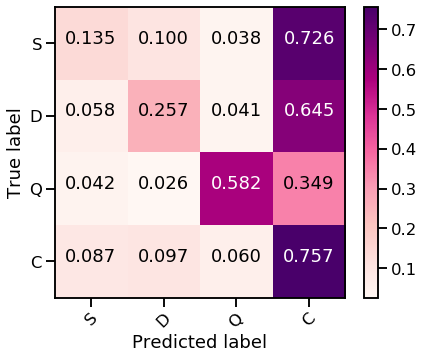

In [38]:
#best_15, all_accs, all_fno, all_ma, all_cm
print ("Acc: %.3f" % np.mean(np.asarray(all_accs_85)), "-- deviation: %.3f" % np.std(np.asarray(all_accs_85)))
print ("F-score: %.3f" % np.mean(np.asarray(all_ma_85)), "-- deviation: %.3f" % np.std(np.asarray(all_ma_85)))
np.set_printoptions(precision=3)
sup=np.mean(np.asarray(all_fno_85)[:,0])
den=np.mean(np.asarray(all_fno_85)[:,1])
que=np.mean(np.asarray(all_fno_85)[:,2])
com=np.mean(np.asarray(all_fno_85)[:,3])

print ("(0.85) SDQC:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in all_cm_85:
    m_temp+=np.asarray(m)
    
print (m_temp)

plot_cm(cm_norma(m_temp),["S","D","Q","C"], "", cmap='RdPu')